In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew
from scipy.stats import kurtosis
from scipy.stats import zscore
from pylab import *
%matplotlib inline

In [3]:
from sklearn import preprocessing
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler

from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import svm
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

In [4]:
from sklearn.metrics import mean_squared_error

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.decomposition import PCA

from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

# Overview of the project

In [ ]:
# Information Collected from the domain Expert
# Concrete Strength depends on the ratio of cement: fineagg: coarseagg
# water/cement ratio is also an important parameter.
# So for Feature engineering - all the ingrediants of concrete is converted into ratios

# Special Thanks to  Ms. Jeba Hebsiba, Assistant Professor, Departement of Civil Engineering, Universal Engineering college for her valueble suggession and information.



In [ ]:
# Information regarding treating the outliers
# -------------------------------------------
# Since the concrete strength depends of the ratio of cement : fineagg : coarsegg : slag : ash : water : superplastic
# If outliers are replaced by median then the ratios will get changed, which may lead to poor performance
# So outliers are observed and removed for this project


In [ ]:
# Iteration 1
# -----------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Without feature engineering

# Iteration 2
# -----------
# 1. Removing Duplicate data
# 2. Outliers were observed and removed
# 3. Without feature engineering
#    i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 3
# -----------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. With feature engineering
#     i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 4
# -----------
# 1. Removing Duplicate data
# 2. Outliers were observed and removed
# 3. With feature engineering
#    i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 5:
# -------------------------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Feature Engineering were done
# 4. PCA was applied to the independent attributes having high relationships

# Iteration 6:
# -------------------------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Feature Engineering were done
# 4. PCA was applied to the independent attributes having high relationships

# Iteration 7
# -----------
# 1. Removing duplicate data
# 2. Outliers are observed and removed
# 3. Grouping into 3 clusters and observed the performance


# Iteration 8
# -----------
# 1. Removing duplicate data
# 2. Outliers are not treated and kept as it is
# 3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
# 4. Grouping into 3 clusters and observed the performance

# Iteration 9
# -----------
# 1. Removing duplicate data
# 2. Outliers are not treated and kept as it is
# 3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
# 4. Grouping into 3 clusters and observed the performance by dropping out the age attribute




# Reading the data as dataframe

In [680]:
concrete_df=pd.read_csv('concrete.csv')

In [681]:
concrete_df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


# Exploratory Data Analysis

In [19]:
# Shape of the data
# =================
concrete_df.shape

(1030, 9)

In [20]:
#Inference: The given has 1030 datapoints with 9 attributes

In [21]:
# Checking for the presence of missing values
# ===========================================
print('Total No.of NaN values in each attributes')
concrete_df.isnull().sum()

Total No.of NaN values in each attributes


cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

In [22]:
# Inference about Missing Values
# ------------------------------
# All the 9 attributes doesn't have any missing values
# No missing values are observed.

In [23]:
# Checking for the presence of missing values & Data Pollution
# ============================================================
concrete_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
cement          1030 non-null float64
slag            1030 non-null float64
ash             1030 non-null float64
water           1030 non-null float64
superplastic    1030 non-null float64
coarseagg       1030 non-null float64
fineagg         1030 non-null float64
age             1030 non-null int64
strength        1030 non-null float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [24]:
# Inference about Missing Values & Data Pollution
# -----------------------------------------------
# All the 9 attributes doesn't have any missing values
# All the 9 attributes have the datatype as float64 and int64. (not as object datatype)
# So missing values were not replaced with '?' or '#' (No Data Pollution is also observed)

In [25]:
# Checking for duplicate records
# ==============================
# Select duplicate rows except first occurrence based on all columns
duplicateRowsDF = concrete_df[concrete_df.duplicated()]
print("Duplicate Rows except first occurrence based on all columns are :")
duplicateRowsDF

Duplicate Rows except first occurrence based on all columns are :


,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
278,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
298,425.0,106.3,0.0,153.5,16.5,852.1,887.1,3,33.40
400,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
420,362.6,189.0,0.0,164.9,11.6,944.7,755.8,3,35.30
463,362.6,189.0,0.0,164.9,11.6,944.7,755.8,56,77.30
468,252.0,0.0,0.0,185.0,0.0,1111.0,784.0,28,19.69
482,425.0,106.3,0.0,153.5,16.5,852.1,887.1,91,65.20
493,362.6,189.0,0.0,164.9,11.6,944.7,755.8,91,79.30
517,425.0,106.3,0.0,153.5,16.5,852.1,887.1,56,64.30
525,362.6,189.0,0.0,164.9,11.6,944.7,755.8,28,71.30


In [26]:
duplicateRowsDF.shape

(25, 9)

In [27]:
# Inference about Duplicate Records
# ---------------------------------
# Totally 25 duplicate records are present

In [28]:
# Finding out the range of values
# ===============================
Concrete_Range=concrete_df.describe().transpose()[['min','max']]
Concrete_Range['Range']=Concrete_Range['max']-Concrete_Range['min']
Concrete_Range

,min,max,Range
cement,102.00,540.0,438.00
slag,0.00,359.4,359.40
ash,0.00,200.1,200.10
water,121.80,247.0,125.20
superplastic,0.00,32.2,32.20
coarseagg,801.00,1145.0,344.00
fineagg,594.00,992.6,398.60
age,1.00,365.0,364.00
strength,2.33,82.6,80.27


In [29]:
# Inference from Range of values
# ------------------------------
# Cement ranges from 102 to 540
# Slag ranges from 0 to 359.4
# Ash ranges from 0 to 200.1
# Water ranges from 121.80 to 247.80
# Superplastic ranges from 0.00 to 32.2
# Coarseagg ranges from 801.00 to 1145.0
# Fineagg ranges from 594.00 to 992.6
# age ranges from 1.00 to 365.0
# Strength from 2.33 t0 82.6

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 9 Text xticklabel objects>)

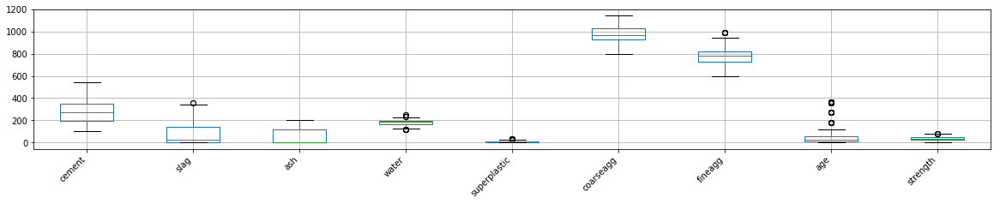

In [30]:
# Observing the Outliers using box plot
# =====================================
concrete_df.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [31]:
# Inference from the box plot:
# ----------------------------
# Outliers were observed in the attributes 'slag', 'water', 'superplastic', 'fineagg', 'age' and 'strength' 

## Univariate Analysis

In [32]:
# Descriptive Statistics
# ======================
# 5 point summary of numerical attribute
concrete_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


mean      :  281.1678640776698
median    :  272.9
variance  :  10910.976743981531
std dev   :  104.455620930525
skewness  :  0.5087389156389815
kurtosois :  2.4760521281730985


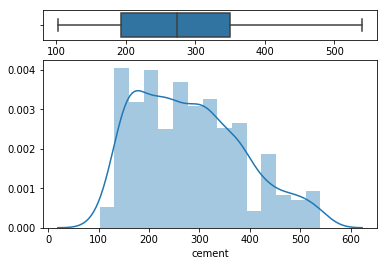

In [33]:
# Analysing the attribute 'cement'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['cement'], ax=ax_box)
sns.distplot(concrete_df['cement'], ax=ax_hist, kde=True)

print("mean      : ", np.mean(concrete_df['cement']))
print("median    : ", np.median(concrete_df['cement']))
print("variance  : ", np.var(concrete_df['cement']))
print("std dev   : ", np.std(concrete_df['cement']))
print("skewness  : ", skew(concrete_df['cement']))
print("kurtosois : ", kurtosis(concrete_df['cement'], fisher = False))

In [34]:
# Inference about the attribute 'cement'
# -------------------------------------
# Mean and Median is almost similar
# Outliers is not available.
# Skewness is between (0.5 and 1) ==> So it is moderately skewed
# Kurtosis < 3 ==> So it has Thin tail (sharper than normal distribution)

In [35]:
# Analysing the data spread for the attribute 'cement'
print("Minimum        : ", concrete_df['cement'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['cement'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['cement'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['cement'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['cement'].max()) # Maximum Value
print("Range          : ", concrete_df['cement'].max()-concrete_df['cement'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['cement'].quantile(0.25)-concrete_df['cement'].min())
print("Q2-Q1          : ", concrete_df['cement'].quantile(0.50)-concrete_df['cement'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['cement'].quantile(0.75)-concrete_df['cement'].quantile(0.50))
print("Max-Q3         : ", concrete_df['cement'].max()-concrete_df['cement'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['cement'].quantile(0.75)-concrete_df['cement'].quantile(0.25))


Minimum        :  102.0
1st Quantile   :  192.375
2nd Quantile   :  272.9
3rd Quantile   :  350.0
Maximum        :  540.0
Range          :  438.0


Q1-Min         :  90.375
Q2-Q1          :  80.52499999999998
Q3-Q2          :  77.10000000000002
Max-Q3         :  190.0


IQR          :  157.625


In [36]:
# Inference about the attribute 'cement'
# -------------------------------------
# Q1-Min < Max-Q3 ==> Comparitively Longer tails observed at the right hand side
# Q2-Q1 & Q3-Q2 have approximately equal distribution 

mean   :  73.89582524271844
median :  22.0
var    :  7436.897506843171
std    :  86.23744840174233
skew   :  0.7995503309986298
kurt   :  2.4884684490378692


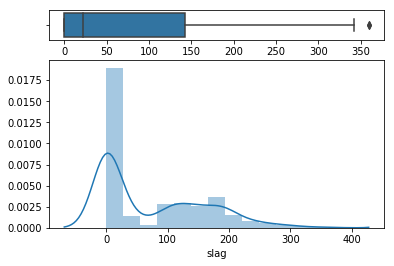

In [37]:
# Analysing the attribute 'slag'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['slag'], ax=ax_box)
sns.distplot(concrete_df['slag'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['slag']))
print("median : ", np.median(concrete_df['slag']))
print("var    : ", np.var(concrete_df['slag']))
print("std    : ", np.std(concrete_df['slag']))
print("skew   : ", skew(concrete_df['slag']))
print("kurt   : ", kurtosis(concrete_df['slag'], fisher = False))

In [38]:
# Inference about the attribute 'slag'
# -------------------------------------
# Two gaussians were observed
# Huge difference between mean and median
# Nearly 471 datapoints have zero values
# Few Outliers were observed

In [39]:
# Analysing the data spread for the attribute 'slag'
print("Minimum        : ", concrete_df['slag'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['slag'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['slag'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['slag'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['slag'].max()) # Maximum Value
print("Range          : ", concrete_df['slag'].max()-concrete_df['cement'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['slag'].quantile(0.25)-concrete_df['slag'].min())
print("Q2-Q1          : ", concrete_df['slag'].quantile(0.50)-concrete_df['slag'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['slag'].quantile(0.75)-concrete_df['slag'].quantile(0.50))
print("Max-Q3         : ", concrete_df['slag'].max()-concrete_df['slag'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['slag'].quantile(0.75)-concrete_df['slag'].quantile(0.25))


Minimum        :  0.0
1st Quantile   :  0.0
2nd Quantile   :  22.0
3rd Quantile   :  142.95
Maximum        :  359.4
Range          :  257.4


Q1-Min         :  0.0
Q2-Q1          :  22.0
Q3-Q2          :  120.94999999999999
Max-Q3         :  216.45


IQR          :  142.95


In [40]:
# Inference about the attribute 'slag'
# -------------------------------------
# Q1-Min = 0 ==> Most of the attributes have zero values
# Q1-Min < Max-Q3 ==> Comparitively Longer tails observed at the right hand side & oultiers observed in the right hand side
# Difference between Q2-Q1 & Q3-Q2 is huge. So the body of the distribution is right skewed. 

mean   :  54.188349514563086
median :  0.0
var    :  4091.6402137807895
std    :  63.965930101740796
skew   :  0.5365710347923704
kurt   :  1.6718754368776017


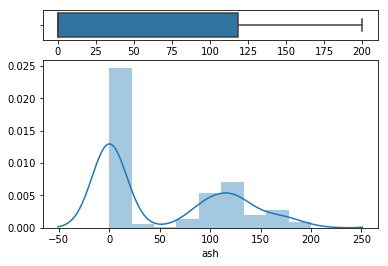

In [41]:
# Analysing the attribute 'ash'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['ash'], ax=ax_box)
sns.distplot(concrete_df['ash'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['ash']))
print("median : ", np.median(concrete_df['ash']))
print("var    : ", np.var(concrete_df['ash']))
print("std    : ", np.std(concrete_df['ash']))
print("skew   : ", skew(concrete_df['ash']))
print("kurt   : ", kurtosis(concrete_df['ash'], fisher = False))

In [42]:
# Inference about the attribute 'ash'
# -------------------------------------
# Two gaussians were observed
# Huge difference between mean and median
# Nearly 566 datapoints have zero values
# Outliers are not observed in the box plot

In [43]:
# Analysing the data spread for the attribute 'ash'
print("Minimum        : ", concrete_df['ash'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['ash'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['ash'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['ash'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['ash'].max()) # Maximum Value
print("Range          : ", concrete_df['ash'].max()-concrete_df['ash'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['ash'].quantile(0.25)-concrete_df['ash'].min())
print("Q2-Q1          : ", concrete_df['ash'].quantile(0.50)-concrete_df['ash'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['ash'].quantile(0.75)-concrete_df['ash'].quantile(0.50))
print("Max-Q3         : ", concrete_df['ash'].max()-concrete_df['ash'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['ash'].quantile(0.75)-concrete_df['ash'].quantile(0.25))

Minimum        :  0.0
1st Quantile   :  0.0
2nd Quantile   :  0.0
3rd Quantile   :  118.3
Maximum        :  200.1
Range          :  200.1


Q1-Min         :  0.0
Q2-Q1          :  0.0
Q3-Q2          :  118.3
Max-Q3         :  81.8


IQR          :  118.3


In [44]:
# Inference about the attribute 'ash'
# -------------------------------------
# Q1-Min & Q2-Q1 = 0 ==> So nearly 50% of the data points have zero values in the 'ash' attribute
# Q1-Min << Max-Q3 ==> Comparitively Longer tails observed at the right hand side & oultiers observed in the right hand side
# Difference between Q2-Q1 & Q3-Q2 is huge. So the body of the distribution is right skewed. 

mean   :  181.56728155339798
median :  185.0
var    :  455.5599295032511
std    :  21.343849922243436
skew   :  0.07451965817729818
kurt   :  3.115670257236671


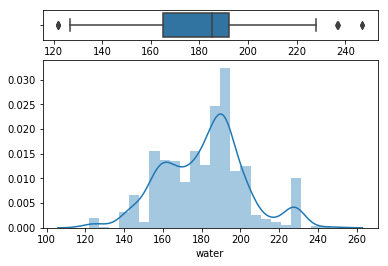

In [45]:
# Analysing the attribute 'water'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['water'], ax=ax_box)
sns.distplot(concrete_df['water'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['water']))
print("median : ", np.median(concrete_df['water']))
print("var    : ", np.var(concrete_df['water']))
print("std    : ", np.std(concrete_df['water']))
print("skew   : ", skew(concrete_df['water']))
print("kurt   : ", kurtosis(concrete_df['water'], fisher = False))

In [46]:
# Inference about the attribute 'water'
# -------------------------------------
# Mean and median is almost similar
# Few outliers were observed both in left and right hand side of the whiskers plot.
# 3 small gaussians were observed.
# Skewness is between (-0.5 and 0.5) ==> So it is approximately symmetric
# Kurtosis > 3 ==> So it has Thick tail (broader than normal distribution)

In [47]:
# Analysing the data spread for the attribute 'water'
print("Minimum        : ", concrete_df['water'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['water'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['water'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['water'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['water'].max()) # Maximum Value
print("Range          : ", concrete_df['water'].max()-concrete_df['water'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['water'].quantile(0.25)-concrete_df['water'].min())
print("Q2-Q1          : ", concrete_df['water'].quantile(0.50)-concrete_df['water'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['water'].quantile(0.75)-concrete_df['water'].quantile(0.50))
print("Max-Q3         : ", concrete_df['water'].max()-concrete_df['water'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['water'].quantile(0.75)-concrete_df['water'].quantile(0.25))

Minimum        :  121.8
1st Quantile   :  164.9
2nd Quantile   :  185.0
3rd Quantile   :  192.0
Maximum        :  247.0
Range          :  125.2


Q1-Min         :  43.10000000000001
Q2-Q1          :  20.099999999999994
Q3-Q2          :  7.0
Max-Q3         :  55.0


IQR          :  27.099999999999994


In [48]:
# Inference about the attribute 'water'
# -------------------------------------
# Q1-Min > Max-Q3 ==> Comparitively Longer tails observed at the left hand side 
# Oultiers are observed both in the left and right hand side
# Q2-Q1 > Q3-Q2. So the body of the distribution is slightly left skewed. 

mean   :  6.204660194174756
median :  6.4
var    :  35.652133622395944
std    :  5.970940765272751
skew   :  0.9058808712519942
kurt   :  4.398607857846008


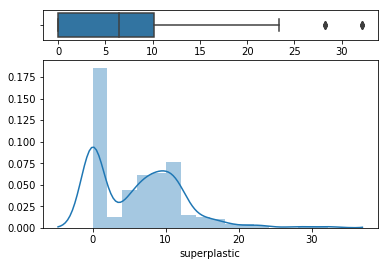

In [49]:
# Analysing the attribute 'superplastic'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['superplastic'], ax=ax_box)
sns.distplot(concrete_df['superplastic'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['superplastic']))
print("median : ", np.median(concrete_df['superplastic']))
print("var    : ", np.var(concrete_df['superplastic']))
print("std    : ", np.std(concrete_df['superplastic']))
print("skew   : ", skew(concrete_df['superplastic']))
print("kurt   : ", kurtosis(concrete_df['superplastic'], fisher = False))

In [50]:
# Inference about the attribute 'superplastic'
# ---------------------------------------------
# Mean and median is almost similar
# Few outliers were observed both in right hand side of the whiskers plot.
# 2 gaussians were observed.
# Nearly 379 datapoints have zero values

In [51]:
# Analysing the data spread for the attribute 'superplastic'
print("Minimum        : ", concrete_df['superplastic'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['superplastic'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['superplastic'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['superplastic'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['superplastic'].max()) # Maximum Value
print("Range          : ", concrete_df['superplastic'].max()-concrete_df['superplastic'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['superplastic'].quantile(0.25)-concrete_df['superplastic'].min())
print("Q2-Q1          : ", concrete_df['superplastic'].quantile(0.50)-concrete_df['superplastic'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['superplastic'].quantile(0.75)-concrete_df['superplastic'].quantile(0.50))
print("Max-Q3         : ", concrete_df['superplastic'].max()-concrete_df['superplastic'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['superplastic'].quantile(0.75)-concrete_df['superplastic'].quantile(0.25))

Minimum        :  0.0
1st Quantile   :  0.0
2nd Quantile   :  6.4
3rd Quantile   :  10.2
Maximum        :  32.2
Range          :  32.2


Q1-Min         :  0.0
Q2-Q1          :  6.4
Q3-Q2          :  3.799999999999999
Max-Q3         :  22.000000000000004


IQR          :  10.2


In [52]:
# Inference about the attribute 'superplastic'
# -------------------------------------
# Q1-Min = 0 ==> Most of the attributes have zero values
# Q1-Min < Max-Q3 ==> Comparitively Longer tails observed at the right hand side & few oultiers observed in the right hand side
# Q2-Q1 < Q3-Q2. So the body of the distribution is right skewed. 

mean   :  972.918932038835
median :  968.0
var    :  6039.807767791513
std    :  77.71620016310314
skew   :  -0.04016114865669757
kurt   :  2.398068199640477


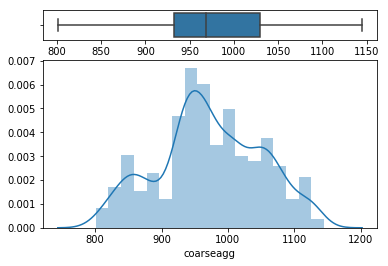

In [53]:
# Analysing the attribute 'courseagg'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['coarseagg'], ax=ax_box)
sns.distplot(concrete_df['coarseagg'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['coarseagg']))
print("median : ", np.median(concrete_df['coarseagg']))
print("var    : ", np.var(concrete_df['coarseagg']))
print("std    : ", np.std(concrete_df['coarseagg']))
print("skew   : ", skew(concrete_df['coarseagg']))
print("kurt   : ", kurtosis(concrete_df['coarseagg'], fisher = False))

In [54]:
# Inference about the attribute 'coarseagg'
# -----------------------------------------
# Mean and median is almost similar
# Outliers were not available.
# Skewness is between (-0.5 and 0.5) ==> So it is approximately symmetric
# Kurtosis < 3 ==> So it has thin tail (sharper than normal distribution)

In [55]:
# Analysing the data spread for the attribute 'coarseagg'
print("Minimum        : ", concrete_df['coarseagg'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['coarseagg'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['coarseagg'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['coarseagg'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['coarseagg'].max()) # Maximum Value
print("Range          : ", concrete_df['coarseagg'].max()-concrete_df['coarseagg'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['coarseagg'].quantile(0.25)-concrete_df['coarseagg'].min())
print("Q2-Q1          : ", concrete_df['coarseagg'].quantile(0.50)-concrete_df['coarseagg'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['coarseagg'].quantile(0.75)-concrete_df['coarseagg'].quantile(0.50))
print("Max-Q3         : ", concrete_df['coarseagg'].max()-concrete_df['coarseagg'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['coarseagg'].quantile(0.75)-concrete_df['coarseagg'].quantile(0.25))

Minimum        :  801.0
1st Quantile   :  932.0
2nd Quantile   :  968.0
3rd Quantile   :  1029.4
Maximum        :  1145.0
Range          :  344.0


Q1-Min         :  131.0
Q2-Q1          :  36.0
Q3-Q2          :  61.40000000000009
Max-Q3         :  115.59999999999991


IQR          :  97.40000000000009


In [56]:
# Inference about the attribute 'coarseagg'
# -----------------------------------------
# Q1-Min & Max-Q3 are nearly equal and no ouliers were observed.
# Q2-Q1 < Q3-Q2. So the body of the distribution is right skewed. 

mean   :  773.5804854368932
median :  779.5
var    :  6421.946832774069
std    :  80.1370503124121
skew   :  -0.2526409879628909
kurt   :  2.892498749138446


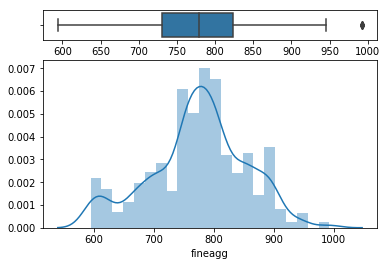

In [57]:
# Analysing the attribute 'fineagg'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['fineagg'], ax=ax_box)
sns.distplot(concrete_df['fineagg'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['fineagg']))
print("median : ", np.median(concrete_df['fineagg']))
print("var    : ", np.var(concrete_df['fineagg']))
print("std    : ", np.std(concrete_df['fineagg']))
print("skew   : ", skew(concrete_df['fineagg']))
print("kurt   : ", kurtosis(concrete_df['fineagg'], fisher = False))

In [58]:
# Inference about the attribute 'fineagg'
# -----------------------------------------
# Mean and median is almost similar
# Outliers were observed at the right hand side of the whiskers plot.
# Skewness is between (-0.5 and 0.5) ==> So it is approximately symmetric
# Kurtosis < 3 ==> So it has thin tail (sharper than normal distribution)

In [59]:
# Analysing the data spread for the attribute 'fineagg'
print("Minimum        : ", concrete_df['fineagg'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['fineagg'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['fineagg'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['fineagg'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['fineagg'].max()) # Maximum Value
print("Range          : ", concrete_df['fineagg'].max()-concrete_df['fineagg'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['fineagg'].quantile(0.25)-concrete_df['fineagg'].min())
print("Q2-Q1          : ", concrete_df['fineagg'].quantile(0.50)-concrete_df['fineagg'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['fineagg'].quantile(0.75)-concrete_df['fineagg'].quantile(0.50))
print("Max-Q3         : ", concrete_df['fineagg'].max()-concrete_df['fineagg'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['fineagg'].quantile(0.75)-concrete_df['fineagg'].quantile(0.25))

Minimum        :  594.0
1st Quantile   :  730.9499999999999
2nd Quantile   :  779.5
3rd Quantile   :  824.0
Maximum        :  992.6
Range          :  398.6


Q1-Min         :  136.94999999999993
Q2-Q1          :  48.55000000000007
Q3-Q2          :  44.5
Max-Q3         :  168.60000000000002


IQR          :  93.05000000000007


In [60]:
# Inference about the attribute 'fineagg'
# -----------------------------------------
# Q1-Min < Max-Q3  and ouliers were observed in the right hand side.
# Q2-Q1 & Q3-Q2 is almost similar. So the body of the distribution is almost symmetric. 

mean   :  45.662135922330094
median :  28.0
var    :  3986.563517767971
std    :  63.13923912883312
skew   :  3.264414535416805
kurt   :  15.104176861479678


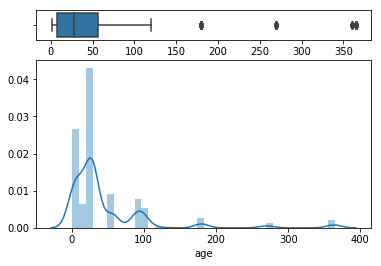

In [61]:
# Analysing the attribute 'age'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['age'], ax=ax_box)
sns.distplot(concrete_df['age'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['age']))
print("median : ", np.median(concrete_df['age']))
print("var    : ", np.var(concrete_df['age']))
print("std    : ", np.std(concrete_df['age']))
print("skew   : ", skew(concrete_df['age']))
print("kurt   : ", kurtosis(concrete_df['age'], fisher = False))

In [62]:
# Inference about the attribute 'age'
# -----------------------------------------
# Huge difference is observed between the mean and median
# Outliers were observed at the right hand side of the whiskers plot.
# Gaussians were observed
# From the Distance plot it is observed that the there are certain amount of unique values in age

In [63]:
# Observing the unique values.
concrete_df['age'].unique()

array([ 28,  14,  90,   7,  56,   3, 100,  91, 180, 365, 270, 360, 120,
         1], dtype=int64)

In [64]:
# In the given pdf document the age is given from 1~365. 
# The maximum value observed is 365. So the Outliers shown in the given value is not the extreme values.
# So outliers are not necessary to be treated for 'age' attributes

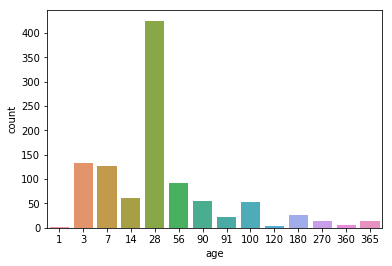

In [65]:
# Counting the no. of datapoints for each unique values under 'age' attribute
concrete_df['age'].value_counts()
sns.countplot(concrete_df['age'])

In [66]:
# Inference from the unique values:
# -----------------------------------------------------------------------------------------------------
# Strength of the concrete were observed in 1, 3, 7, 14, 28, 56, 90, 91, 100, 120, 180, 270, 360, 365
# Strength of concrete were observed for 14 different ages.
# More no.of observations for concrete strengths is made on 28th day

In [67]:
# Analysing the data spread for the attribute 'age'
print("Minimum        : ", concrete_df['age'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['age'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['age'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['age'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['age'].max()) # Maximum Value
print("Range          : ", concrete_df['age'].max()-concrete_df['age'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['age'].quantile(0.25)-concrete_df['age'].min())
print("Q2-Q1          : ", concrete_df['age'].quantile(0.50)-concrete_df['age'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['age'].quantile(0.75)-concrete_df['age'].quantile(0.50))
print("Max-Q3         : ", concrete_df['age'].max()-concrete_df['age'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['age'].quantile(0.75)-concrete_df['age'].quantile(0.25))

Minimum        :  1
1st Quantile   :  7.0
2nd Quantile   :  28.0
3rd Quantile   :  56.0
Maximum        :  365
Range          :  364


Q1-Min         :  6.0
Q2-Q1          :  21.0
Q3-Q2          :  28.0
Max-Q3         :  309.0


IQR          :  49.0


In [68]:
# Inference about the attribute 'age'
# -----------------------------------------
# Q1-Min << Max-Q3  and so more no.of ouliers were observed in the right hand side.
# Q2-Q1 & Q3-Q2 is almost similar. So the body of the distribution is almost symmetric. 

mean   :  35.81796116504854
median :  34.445
var    :  278.8108612800451
skew   :  0.4163697941146936
kurt   :  2.681976414563422


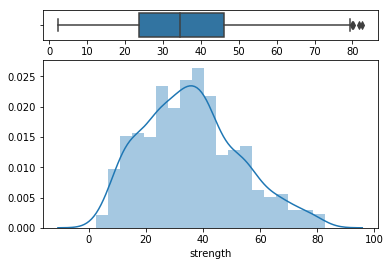

In [69]:
# Analysing the attribute 'strength'
f,(ax_box, ax_hist)=plt.subplots(2,gridspec_kw={'height_ratios':(.15,.85)})
sns.boxplot(concrete_df['strength'], ax=ax_box)
sns.distplot(concrete_df['strength'], ax=ax_hist, kde=True)

print("mean   : ", np.mean(concrete_df['strength']))
print("median : ", np.median(concrete_df['strength']))
print("var    : ", np.var(concrete_df['strength']))
print("skew   : ", skew(concrete_df['strength']))
print("kurt   : ", kurtosis(concrete_df['strength'], fisher = False))

In [70]:
# Inference about the attribute 'strength'
# -----------------------------------------
# Mean and median is almost similar
# Outliers were observed in the right hand side of the whiskers plot.
# Skewness is between (-0.5 and 0.5) ==> So it is approximately symmetric
# Kurtosis < 3 ==> So it has thin tail (sharper than normal distribution)

In [71]:
# Analysing the data spread for the attribute 'strength'
print("Minimum        : ", concrete_df['strength'].min()) # Minimum Value
print("1st Quantile   : ", concrete_df['strength'].quantile(0.25)) # 1st Quantile
print("2nd Quantile   : ", concrete_df['strength'].quantile(0.50)) # 2nd Quantile/Median
print("3rd Quantile   : ", concrete_df['strength'].quantile(0.75)) # 3rd Quantile
print("Maximum        : ", concrete_df['strength'].max()) # Maximum Value
print("Range          : ", concrete_df['strength'].max()-concrete_df['strength'].min()) #Range of the attribute
print("\n")
print("Q1-Min         : ", concrete_df['strength'].quantile(0.25)-concrete_df['strength'].min())
print("Q2-Q1          : ", concrete_df['strength'].quantile(0.50)-concrete_df['strength'].quantile(0.25))
print("Q3-Q2          : ", concrete_df['strength'].quantile(0.75)-concrete_df['strength'].quantile(0.50))
print("Max-Q3         : ", concrete_df['strength'].max()-concrete_df['strength'].quantile(0.75))
print("\n")
print("IQR          : ", concrete_df['strength'].quantile(0.75)-concrete_df['strength'].quantile(0.25))

Minimum        :  2.33
1st Quantile   :  23.709999999999997
2nd Quantile   :  34.445
3rd Quantile   :  46.135000000000005
Maximum        :  82.6
Range          :  80.27


Q1-Min         :  21.379999999999995
Q2-Q1          :  10.735000000000003
Q3-Q2          :  11.690000000000005
Max-Q3         :  36.46499999999999


IQR          :  22.425000000000008


In [72]:
# Inference about the attribute 'strength'
# -----------------------------------------
# Q1-Min < Max-Q3  and so ouliers were observed in the right hand side.
# Q2-Q1 & Q3-Q2 is almost similar. So the body of the distribution is almost symmetric. 

### Challenges

1. Dropping out the duplicate records
2. As per the domain experts suggestion the strength of concrete depends on the ratios of 'cement:coarseagg:fineagg ratios'
3. In the given problem statement the age is given as 1 to 365 days. But it is observed as outliers in EDA

## Bivariate Analysis

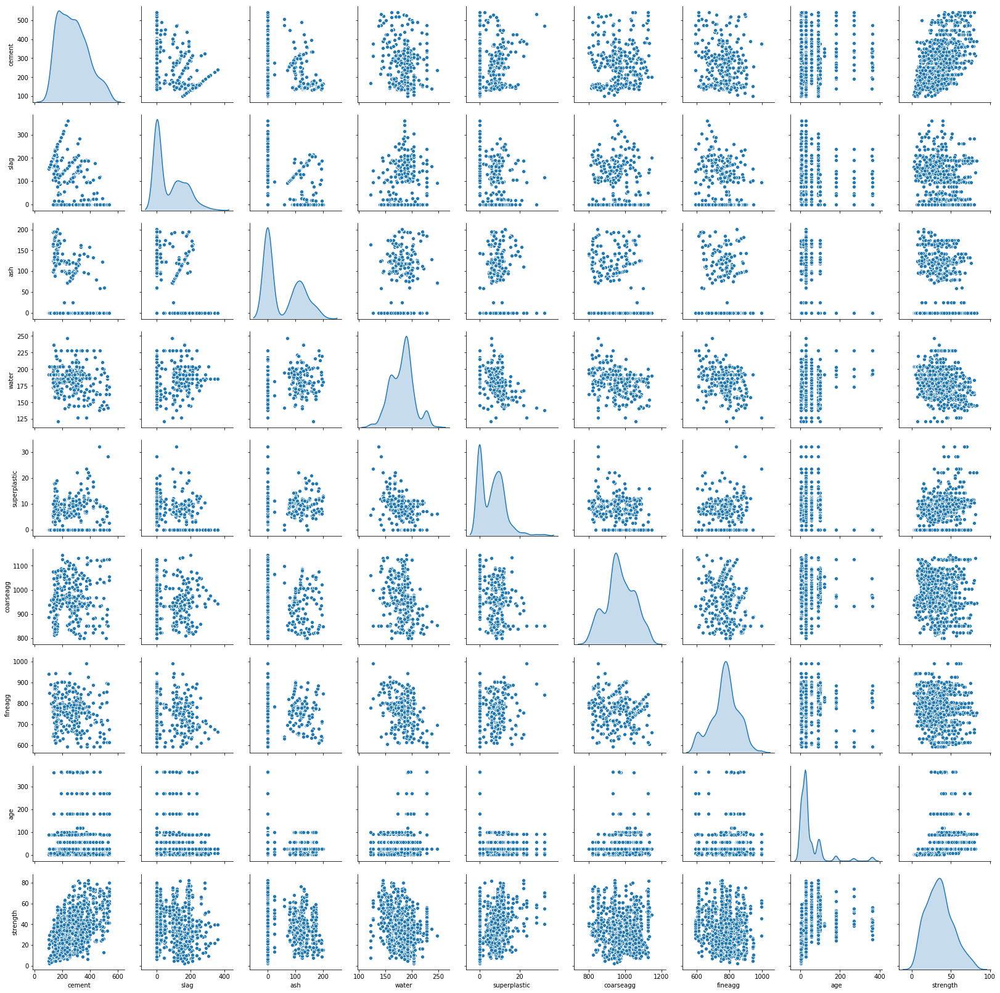

In [73]:
# Pair plot between all the independent attributes and dependent attributes
sns.pairplot(concrete_df, diag_kind='kde')

In [74]:
# Inference from the pair plot:
# ----------------------------
# Strong relationship is observed between the cement and strength
# No much relationship is found out between other Independent attributes
# 2 Gaussions observed in the attribute 'slag'
# 2 Gaussions observed in the attribute 'ash'
# 3 Gaussions observed in the attribute 'water'
# 2 Gaussians observed in the attribute 'superplastic'
# 3 Gaussians observed in the attribute 'coarseagg'
# 2 Gaussians observed in the attribute 'Fineagg'
# 5 Gaussians observed in the attribute 'age'

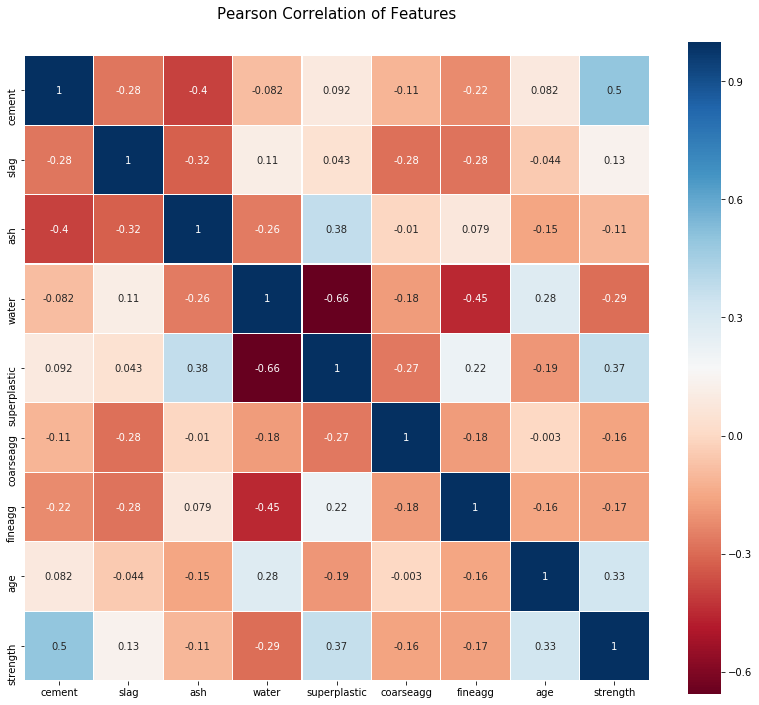

In [75]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_df.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [76]:
# Writing down the relationship between independent attribute and dependent attribute in order of importance (descending order)
# -----------------------------------------------------------------------------------------------------------------------------
# Cement          0.5
# Superplastic    0.37
# Age             0.33
# Water         - 0.29
# Fineagg       - 0.17
# Coarseagg     - 0.16
# Slag            0.13
# Ash           - 0.11

### Strategies to address different data challenges
1. Data Pollution - Not Available
2. Outliers       - Available (Outliers need to be handled but Valid age is also observed as outliers in box plot)
3. Missing Values - Not Available
4. Converting the given data into ratios (As per Domain Experts Suggession)
5. For the given data superplastic has higher relationship with the target attribute 'strength' next to cement. But as per domain expert suggesion it should have less relationship with strength. The most important independent attributes are cement, fineagg, coarseagg, water and age

### Before Handling the outliers data preprocessing should be done to convert the data into ratios (As per domain experts Suggesstion)

# Iteration 1
1. Outliers are not treated (since valid ages are also observed as outliers in box plot)
2. The Given dataset is used as it is after removing duplicate data

In [77]:
# Removing Duplicate Data
concrete_Iter1=concrete_df.copy(deep=True)
concrete_Iter1.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter1.shape


(1005, 9)

In [78]:
concrete_Iter1.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [79]:
X=concrete_Iter1.drop('strength',axis=1) # Independent Attribute
y=concrete_Iter1.pop('strength') # Dependent Attribute

In [80]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [81]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.60221945 0.6195546  0.54672164 0.58477621 0.67211622 0.7184639
 0.58887881 0.56665793 0.4575404  0.65573822]


In [82]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 60.127%
 Standard Deviation : 6.878%


In [83]:
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

In [84]:
# Let us explore the coefficients for each of the independent attributes and the intercept
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, LR_model.coef_[idx]))
intercept=LR_model.intercept_
print("The intercept for our model is {}".format(intercept))

The coefficient for cement is 0.13001790864764937
The coefficient for slag is 0.10892210093466248
The coefficient for ash is 0.09396745486494847
The coefficient for water is -0.12028826446915697
The coefficient for superplastic is 0.3183496395241164
The coefficient for coarseagg is 0.0230879909332276
The coefficient for fineagg is 0.03229064317676662
The coefficient for age is 0.10906711141772381
The intercept for our model is -46.49337273612008


In [85]:
# comparing the tested and predicted values
values_of_tested_and_predicted=pd.DataFrame(np.vstack([y_test,y_pred]).T)
values_of_tested_and_predicted.columns=['y_test', 'y_pred']
values_of_tested_and_predicted.head()

,y_test,y_pred
0,68.30,57.216480
1,18.91,20.379196
2,55.20,55.138920
3,25.20,52.354961
4,32.63,36.779367


In [86]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.6217217238825692
The accuracy score for testing set is 0.5419610271323057


In [87]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.5419610271323057
The adjusted R Square value for testing set is 0.5382819992377861
The RMSE value for testing set is 10.3168494129413233


Text(0, 0.5, 'y_predict')

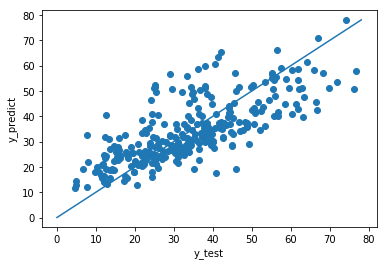

In [88]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')


count    302.000000
mean      -0.055456
std       10.333824
min      -27.753294
25%       -6.359497
50%        0.941600
75%        6.664426
max       26.560596
Name: strength, dtype: float64

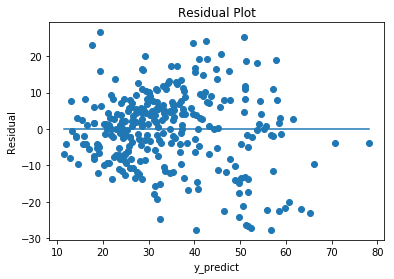

In [89]:
#Residual Plot Analysis
residuals=y_test-y_pred #Difference between predicted and actual value
fig, ax = plt.subplots()
ax.scatter(y_pred, residuals)
ax.plot([min(y_pred), max(y_pred)], [0, 0])
plt.xlabel('y_predict')
plt.ylabel('Residual')
plt.title('Residual Plot')
residuals.describe()

In [90]:
# Inference from the residual plot
# --------------------------------
# Mean of residual is -0.055456
# But still residuals are more at many data points

In [91]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 60.127%  (13.482%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282


In [92]:
# Inference from the Performance Metrics for Linear Regression Iteration 1
# -----------------------------------------------------------------------------------------------
# Accuracy performance with 95% confidence level at validation data set is : 60.127 %  (13.482%)
# Accuracy performance observed at test data set is                        : 54.196 %

## Using Polynomial Regression (degree=2)

In [93]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [94]:
print(X_train.shape)
print(X_train_2.shape)

(703, 8)
(703, 37)


In [95]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 8 to 37

In [96]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.73542942 0.71810489 0.61495933 0.70520623 0.77770635 0.74391565
 0.70404192 0.80080025 0.57824105 0.73734722]


In [97]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 71.158%
 Standard Deviation : 6.470%


In [98]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [99]:
# comparing the tested and predicted values
values_of_tested_and_predicted=pd.DataFrame(np.vstack([y_test,y_pred]).T)
values_of_tested_and_predicted.columns=['y_test', 'y_pred']
values_of_tested_and_predicted.head()

,y_test,y_pred
0,68.30,58.592933
1,18.91,20.443366
2,55.20,57.651671
3,25.20,47.092396
4,32.63,27.594836


In [100]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.7594975479928061
The accuracy score for testing set is 0.6896719798013224


In [101]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6896719798013224
The adjusted R Square value for testing set is 0.6871793852615740
The RMSE value for testing set is 8.4919293211788958


Text(0, 0.5, 'y_predict')

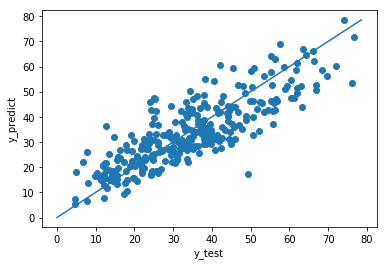

In [102]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

count    302.000000
mean       0.541652
std        8.488703
min      -23.850716
25%       -5.320374
50%        0.381292
75%        6.807607
max       31.961221
Name: strength, dtype: float64

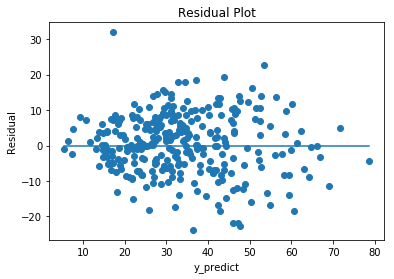

In [103]:
#Residual Plot Analysis
residuals=y_test-y_pred #Difference between predicted and actual value
fig, ax = plt.subplots()
ax.scatter(y_pred, residuals)
ax.plot([min(y_pred), max(y_pred)], [0, 0])
plt.xlabel('y_predict')
plt.ylabel('Residual')
plt.title('Residual Plot')
residuals.describe()

In [104]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : 71.158%  (12.682%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179


In [105]:
Comparison_Table1=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table1

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179


In [106]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs better than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [107]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.73504033 0.71991491 0.61462535 0.70498647 0.77804852 0.74330267
 0.70391234 0.80075231 0.57800323 0.7389245 ]


In [108]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 71.175%  (12.716%)


In [109]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [ 0.00000000e+00  3.35038712e-01 -1.63822748e-02  2.79452136e-02
  1.45525905e+00 -7.38158817e+00 -1.68065302e-02 -2.18862799e-01
 -6.68101480e-01  1.30882665e-04  2.22450246e-04 -1.77129739e-03
 -2.79963550e-03  3.08217067e-05  8.47075690e-05  5.33326590e-04
  3.99600186e-04 -1.11863040e-03  7.69175287e-04  9.23680945e-06
  3.06776332e-04  7.63726339e-04 -2.33940264e-03 -5.34925971e-03
  9.26976845e-05  3.57479662e-04  1.66548701e-03  1.56789885e-02
 -7.87787032e-04 -1.58875527e-04 -4.39433339e-05  3.85890886e-03
  2.86453339e-03  6.20204813e-03  1.74952066e-04  1.07494745e-04
  5.94228590e-04]


In [110]:
y_pred = ridge.predict(X_test_2)

In [111]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.7594849428312305
The accuracy score for testing set is 0.6904769942187022


In [112]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6904769942187022
The adjusted R Square value for testing set is 0.6879908656582099
The RMSE value for testing set is 8.4809078145693384


Text(0, 0.5, 'y_predict')

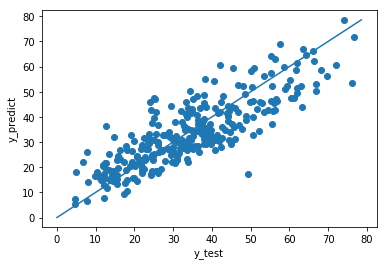

In [113]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [114]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991


In [115]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 71.175%  (12.716%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [116]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.73574021 0.72781103 0.61007901 0.71115846 0.78209217 0.74578117
 0.69852552 0.80182552 0.60415278 0.74765342]


In [117]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 71.648%  (12.115%)


In [118]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))

Lasso model: [ 0.00000000e+00  2.95768675e-01 -0.00000000e+00 -0.00000000e+00
  1.27155872e+00 -0.00000000e+00 -2.20836962e-02 -1.96925064e-01
 -0.00000000e+00  1.47003141e-04  2.41763127e-04 -1.60816825e-03
 -5.26785032e-03  4.12938834e-05  1.06956290e-04  3.36330501e-04
  4.18937389e-04 -1.03250751e-03 -2.32818054e-03 -1.14025744e-05
  3.13290819e-04  5.66722404e-04 -2.19920355e-03 -9.22415067e-03
  9.55020864e-05  3.86213847e-04  1.41355809e-03  6.62846406e-03
 -6.20945152e-04 -1.08132965e-04 -1.07926237e-03  1.63391693e-03
 -3.17441685e-04  5.38605926e-03  1.60673002e-04 -8.03730905e-05
  3.27110708e-04]


In [119]:
y_pred = lasso.predict(X_test_2)

In [120]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.7579002194958236
The accuracy score for testing set is 0.6935181926068400


In [121]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6935181926068400
The adjusted R Square value for testing set is 0.6910564913426379
The RMSE value for testing set is 8.4391406590219997


Text(0, 0.5, 'y_predict')

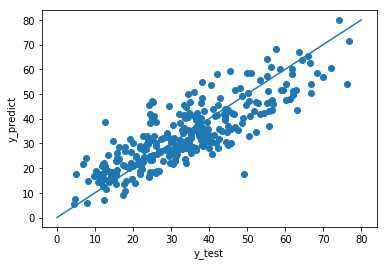

In [122]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [123]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 71.648%  (12.115%)


In [124]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056


In [125]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 71.648%  (12.115%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056


In [126]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# There is no much difference in performance metrics between polynomial Regression with degree - 2, ridge and lasso
#---------------------------------------------------------------------------
# The accuracy metrics for 95% confidence level 
#----------------------------------------------------------------------------
# Before using Ridge        : 71.158%  (12.682%) 
# With Ridge Regression     : 71.175%  (12.716%)
# With Lasso Regression     : 71.648%  (12.115%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=3)

In [127]:
poly=PolynomialFeatures(degree=3, interaction_only=True) #Considering Polynomial degree as 3
X_train_3 = poly.fit_transform(X_train)
X_test_3 = poly.fit_transform(X_test)

In [128]:
print(X_train.shape)
print(X_train_3.shape)

(703, 8)
(703, 93)


In [129]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 8 to 93

In [130]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR3_model=linear_model.LinearRegression()
results=cross_val_score(PR3_model,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-0.80078127  0.65261264  0.55665929  0.65381779  0.79951797  0.79560784
  0.7360225   0.84087188  0.35575409  0.71183347]


In [131]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 53.019%
 Standard Deviation : 46.344%


In [132]:
PR3_model.fit(X_train_3,y_train)
y_pred = PR3_model.predict(X_test_3)

In [133]:
print("The accuracy score for training set is %12.16f" %PR3_model.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %PR3_model.score(X_test_3,y_test))

The accuracy score for training set is 0.8157271302057831
The accuracy score for testing set is 0.7019444600841008


In [134]:
# r square value for testing
r_square_for_testing=PR3_model.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7019444600841008
The adjusted R Square value for testing set is 0.6995504396831699
The RMSE value for testing set is 8.3223212249228595


Text(0, 0.5, 'y_predict')

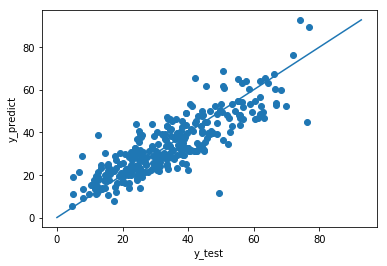

In [135]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [136]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3 = pd.DataFrame({'Model':['Polynomial Regression - degree 3'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3=Polynomial_Regression_Metrics1_degree3[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3

Model performance range with 95 percentage confidence level is : 53.019%  (90.834%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3,8.322321,0.701944,0.69955


In [137]:
Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree3])
Comparison_Table1

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550


In [138]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=3 performs better than linear regression and polynomial regression with degree =2 in test dataset
# But the 95% confidence accuracy score is 53.019%  (90.834%) 
# i.e it's performance may be too high and too low at production
# So this model is a poor model
# So trying out the ridge and Lasso

## Using Polynomial Regression (degree=3)  & Ridge Regression

In [139]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.71694722 0.65342709 0.55551621 0.65654487 0.80213181 0.79877728
 0.73711696 0.84143666 0.36693929 0.71554587]


In [140]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 68.444%  (25.968%)


In [141]:
ridge.fit(X_train_3,y_train)
y_pred = ridge.predict(X_test_3)

In [142]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_3,y_test))

The accuracy score for training set is 0.8156881352275145
The accuracy score for testing set is 0.7012997450223443


In [143]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7012997450223443
The adjusted R Square value for testing set is 0.6989005461871823
The RMSE value for testing set is 8.3313172453886253


Text(0, 0.5, 'y_predict')

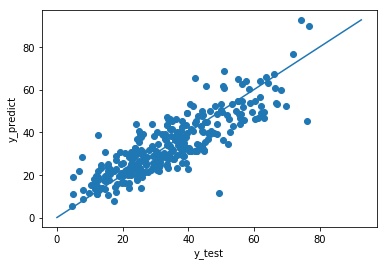

In [144]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [145]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_ridge=Polynomial_Regression_Metrics1_degree3_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_ridge

Model performance range with 95 percentage confidence level is : 68.444%  (25.968%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & ridge,8.331317,0.7013,0.698901


In [146]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 68.444%  (25.968%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,Polynomial Regression - degree 3 & ridge,8.331317,0.701300,0.698901


In [147]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Eventhough there is no much difference in performance metrics between polynomial Regression with degree - 3 and ridge
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        : 53.019%  (90.834%) 
# With Ridge Regression     : 68.444%  (25.968%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=3)  & Lasso Regression

In [148]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=10000)
results=cross_val_score(lasso,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.73797114 0.72959177 0.61189513 0.68932247 0.79673278 0.771709
 0.76102209 0.83801939 0.36679709 0.72142327]


In [149]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 70.245%  (24.706%)


In [150]:
lasso.fit(X_train_3,y_train)
y_pred = lasso.predict(X_test_3)

In [151]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_3,y_test))

The accuracy score for training set is 0.8021066707065150
The accuracy score for testing set is 0.7307526396766342


In [152]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7307526396766342
The adjusted R Square value for testing set is 0.7285900102764464
The RMSE value for testing set is 7.9099111020809190


Text(0, 0.5, 'y_predict')

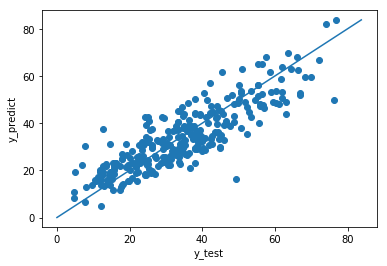

In [153]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [154]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_Lasso=Polynomial_Regression_Metrics1_degree3_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_Lasso

Model performance range with 95 percentage confidence level is : 70.245%  (24.706%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & lasso,7.909911,0.730753,0.72859


In [155]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree3_Lasso])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 70.245%  (24.706%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,Polynomial Regression - degree 3 & ridge,8.331317,0.701300,0.698901
0,Polynomial Regression - degree 3 & lasso,7.909911,0.730753,0.728590


In [156]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Eventhough there is no much difference in performance metrics between polynomial Regression with degree - 3, ridge and lasso
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        : 53.019%  (90.834%) 
# With Ridge Regression     : 68.444%  (25.968%)
# With Lasso Regression     : 70.245%  (24.706%)
# --------------------------------------------------------------------------
# Lasso Regression didn't converge

In [157]:
# Observation by comparing Model of Linear regression, Polynomial Regression - Degree 2 & Polynomial Regression - Degree 3
# ------------------------------------------------------------------------------------------------------------------------
# Polynomial regression -degree 2 model is has better performance than Linear Regression and Polynomial Regression - degree 3
# That means the performance decreases as the degree increases further...

## Using Polynomial Regression (degree=4)

In [158]:
poly=PolynomialFeatures(degree=4, interaction_only=True) #Considering Polynomial degree as 4
X_train_4 = poly.fit_transform(X_train)
X_test_4 = poly.fit_transform(X_test)

In [159]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR4_model=linear_model.LinearRegression()
results=cross_val_score(PR4_model,X_train_4, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.15056716 0.24700907 0.10964336 0.69970363 0.78528672 0.77212046
 0.735282   0.72610086 0.23932992 0.6660069 ]


In [160]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 51.311%
 Standard Deviation : 27.094%


In [161]:
PR4_model.fit(X_train_4,y_train)
y_pred = PR4_model.predict(X_test_4)

In [162]:
print("The accuracy score for training set is %12.16f" %PR4_model.score(X_train_4,y_train))
print("The accuracy score for testing set is %12.16f" %PR4_model.score(X_test_4,y_test))

The accuracy score for training set is 0.8698700472086611
The accuracy score for testing set is 0.6051556232949021


In [163]:
# r square value for testing
r_square_for_testing=PR4_model.score(X_test_4,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6051556232949021
The adjusted R Square value for testing set is 0.6019841825181543
The RMSE value for testing set is 9.5787503426642466


In [164]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 51.311%  (53.104%)


In [165]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree4 = pd.DataFrame({'Model':['Polynomial Regression - degree 4'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree4=Polynomial_Regression_Metrics1_degree4[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 4,9.57875,0.605156,0.601984


In [166]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Polynomial_Regression_Metrics1_degree4])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 51.311%  (53.104%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 2,8.491929,0.689672,0.687179
0,Polynomial Regression - degree 2 & ridge,8.480908,0.690477,0.687991
0,Polynomial Regression - degree 2 & lasso,8.439141,0.693518,0.691056
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,Polynomial Regression - degree 3 & ridge,8.331317,0.701300,0.698901
0,Polynomial Regression - degree 3 & lasso,7.909911,0.730753,0.728590
0,Polynomial Regression - degree 4,9.578750,0.605156,0.601984


In [167]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# As expected the performance started to drop as the polynomial degree increases
# So if the degree is further more increased the model will become over fit.
#---------------------------------------------------------------------------

In [168]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table1=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree3])
Comparison_Table1

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550


## Support Vector Regressor

In [169]:
# Removing Duplicate Data
concrete_Iter1=concrete_df.copy(deep=True)
concrete_Iter1.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter1.shape
#Spliting into training and test test first to avoid data leak
train,test=train_test_split(concrete_Iter1,test_size=0.30, random_state=1)
print(train.shape)
print(test.shape)

(703, 9)
(302, 9)


In [170]:
X_train=train.drop('strength',axis=1) # Independent Attribute for training data
X_test=test.drop('strength',axis=1) # Independent Attribute for testing data
y_train=train.pop('strength') # Dependent Attribute for training data
y_test=test.pop('strength') # Dependent Attribute for testin data
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(703, 8)
(302, 8)
(703,)
(302,)


In [171]:
X_train_scale = preprocessing.scale(X_train)
X_test_scale = preprocessing.scale(X_test)
y_train_scale = preprocessing.scale(y_train)
y_test_scale = preprocessing.scale(y_test)

In [172]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [173]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)

In [174]:
gs.fit(X_train_scale,y_train_scale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [175]:
gs.cv_results_['params'] # All the possible parameters

[{'C': 1, 'degree': 1, 'kernel': 'linear'},
 {'C': 1, 'degree': 1, 'kernel': 'rbf'},
 {'C': 1, 'degree': 1, 'kernel': 'poly'},
 {'C': 1, 'degree': 1, 'kernel': 'sigmoid'},
 {'C': 1, 'degree': 2, 'kernel': 'linear'},
 {'C': 1, 'degree': 2, 'kernel': 'rbf'},
 {'C': 1, 'degree': 2, 'kernel': 'poly'},
 {'C': 1, 'degree': 2, 'kernel': 'sigmoid'},
 {'C': 1, 'degree': 3, 'kernel': 'linear'},
 {'C': 1, 'degree': 3, 'kernel': 'rbf'},
 {'C': 1, 'degree': 3, 'kernel': 'poly'},
 {'C': 1, 'degree': 3, 'kernel': 'sigmoid'},
 {'C': 1, 'degree': 4, 'kernel': 'linear'},
 {'C': 1, 'degree': 4, 'kernel': 'rbf'},
 {'C': 1, 'degree': 4, 'kernel': 'poly'},
 {'C': 1, 'degree': 4, 'kernel': 'sigmoid'},
 {'C': 2, 'degree': 1, 'kernel': 'linear'},
 {'C': 2, 'degree': 1, 'kernel': 'rbf'},
 {'C': 2, 'degree': 1, 'kernel': 'poly'},
 {'C': 2, 'degree': 1, 'kernel': 'sigmoid'},
 {'C': 2, 'degree': 2, 'kernel': 'linear'},
 {'C': 2, 'degree': 2, 'kernel': 'rbf'},
 {'C': 2, 'degree': 2, 'kernel': 'poly'},
 {'C': 2, 'de

In [176]:
gs.cv_results_['mean_test_score']

array([ 5.71176647e-01,  8.29675346e-01,  5.74811987e-01, -6.03219657e+01,
        5.71176647e-01,  8.29675346e-01,  1.94495743e-01, -6.03219657e+01,
        5.71176647e-01,  8.29675346e-01,  6.54951167e-01, -6.03219657e+01,
        5.71176647e-01,  8.29675346e-01,  4.55861764e-01, -6.03219657e+01,
        5.70881344e-01,  8.48771586e-01,  5.74906040e-01, -2.35619184e+02,
        5.70881344e-01,  8.48771586e-01,  1.71449958e-01, -2.35619184e+02,
        5.70881344e-01,  8.48771586e-01,  6.58028060e-01, -2.35619184e+02,
        5.70881344e-01,  8.48771586e-01,  4.96701990e-01, -2.35619184e+02,
        5.70617098e-01,  8.56204282e-01,  5.73810166e-01, -5.07049126e+02,
        5.70617098e-01,  8.56204282e-01,  1.66227241e-01, -5.07049126e+02,
        5.70617098e-01,  8.56204282e-01,  6.59190769e-01, -5.07049126e+02,
        5.70617098e-01,  8.56204282e-01,  5.09991973e-01, -5.07049126e+02,
        5.70695282e-01,  8.59825449e-01,  5.72224540e-01, -9.12840128e+02,
        5.70695282e-01,  

In [177]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8598254492759377
Standard deviation for the best model 0.04798848901987294


In [178]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 85.983%
 Standard Deviation : 4.79885%


In [179]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train_scale,y_train_scale)
y_pred = SVR_optimised_model.predict(X_test_scale)

In [180]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train_scale,y_train_scale))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test_scale,y_test_scale))

The accuracy score for training set is 0.9255346835404765
The accuracy score for testing set is 0.8124734186220306


In [181]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test_scale,y_test_scale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_scale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8124734186220306
The adjusted R Square value for testing set is 0.8109671810206012
The RMSE value for testing set is 0.4330433943359133


Text(0, 0.5, 'y_predict')

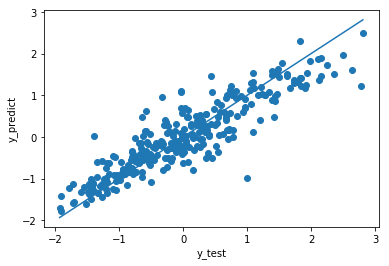

In [182]:
fig, ax = plt.subplots()
ax.scatter(y_test_scale, y_pred)
ax.plot([min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))], [min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [183]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 85.983%  (9.406%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.433043,0.812473,0.810967


In [184]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,SVR_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 85.983%  (9.406%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967


In [185]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# RMSE Value is observed to be too low.
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

## KNN Regressor

In [186]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [187]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [188]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)

In [189]:
gs.fit(X_train_stdscale,y_train_stdscale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [190]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 6}
The model which produce best score is 0.6814891745212365
Standard deviation for the best model 0.07288507689559537


In [191]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 68.149%
 Standard Deviation : 7.28851%


In [192]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [193]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.7841385458690532
The accuracy score for testing set is 0.6016795001377384


In [194]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6016795001377384
The adjusted R Square value for testing set is 0.5984801386930616
The RMSE value for testing set is 0.6311263739238454


Text(0, 0.5, 'y_predict')

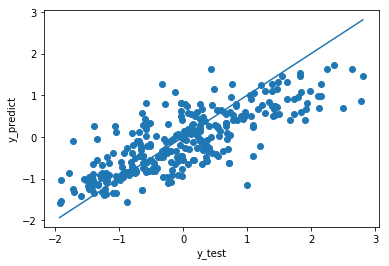

In [195]:
fig, ax = plt.subplots()
ax.scatter(y_test_stdscale, y_pred)
ax.plot([min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))], [min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [196]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 68.149%  (14.285%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.631126,0.60168,0.59848


In [197]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,KNN_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 68.149%  (14.285%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480


In [198]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is poor than SVR.
# RMSE value of KNN and SVR is observed to be too low. since RMSE is calculated based on the scaled data
# So RMSE Cannot be used as a better one to observe the performance
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=6, p=2,
#                    weights='uniform'))

## Decision Tree Regressor

In [199]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [200]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [201]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'friedman_mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.8034341793636717
Standard deviation for the best model 0.0483889870059156


In [202]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 80.343%
 Standard Deviation : 4.83890%


In [203]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [204]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9928792722652316
The accuracy score for testing set is 0.7815967289274265


In [205]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7815967289274265
The adjusted R Square value for testing set is 0.7798424857862813
The RMSE value for testing set is 7.1240251629016615


Text(0, 0.5, 'y_predict')

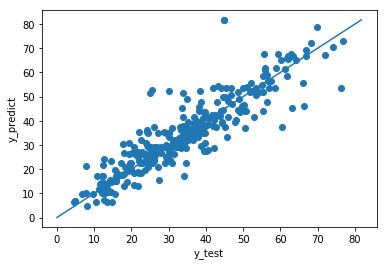

In [206]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [207]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 80.343%  (9.484%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,7.124025,0.781597,0.779842


In [208]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,DecisionTree_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 80.343%  (9.484%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842


In [209]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='friedman_mse', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [210]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [211]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [212]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 150}
The model which produce best score is 0.8939118507765192
Standard deviation for the best model 0.021264225872410173


In [213]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.391%
 Standard Deviation : 2.12642%


In [214]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [215]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9718918471258844
The accuracy score for testing set is 0.8854927419568124


In [216]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8854927419568124
The adjusted R Square value for testing set is 0.8845730049444173
The RMSE value for testing set is 5.1583687302244696


Text(0, 0.5, 'y_predict')

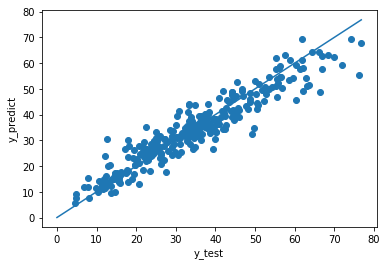

In [217]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [218]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 89.391%  (4.168%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,5.158369,0.885493,0.884573


In [219]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Bagging_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 89.391%  (4.168%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573


In [220]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=150,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [221]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [222]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [223]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 0.4, 'n_estimators': 200}
The model which produce best score is 0.7703765812915475
Standard deviation for the best model 0.03141732841321163


In [224]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 77.038%
 Standard Deviation : 3.14173%


In [225]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [226]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8201404574097790
The accuracy score for testing set is 0.7669097452778039


In [227]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7669097452778039
The adjusted R Square value for testing set is 0.7650375343965011
The RMSE value for testing set is 7.3596630901320692


Text(0, 0.5, 'y_predict')

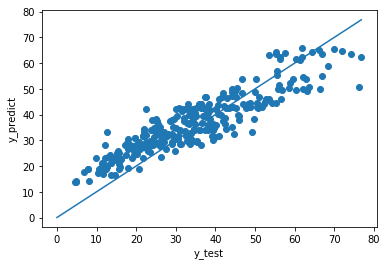

In [228]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [229]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 77.038%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,7.359663,0.76691,0.765038


In [230]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Adaboost_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 77.038%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573
0,Adaboost,7.359663,0.766910,0.765038


In [231]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=0.4, loss='linear',
#                  n_estimators=200, random_state=1)

## Gradient Boosting Regressor

In [232]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [233]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [234]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'friedman_mse', 'max_depth': 5, 'n_estimators': 200}
The model which produce best score is 0.9215400086241545
Standard deviation for the best model 0.019112648093424518


In [235]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 92.154%
 Standard Deviation : 1.91126%


In [236]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [237]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9928981700646321
The accuracy score for testing set is 0.9137967982809253


In [238]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.9137967982809253
The adjusted R Square value for testing set is 0.9131044030863946
The RMSE value for testing set is 4.4756650128074416


Text(0, 0.5, 'y_predict')

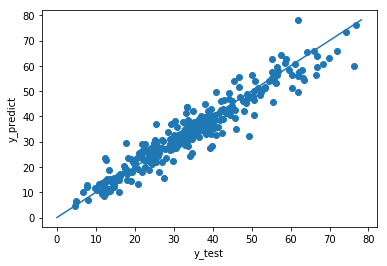

In [239]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [240]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 92.154%  (3.746%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,4.475665,0.913797,0.913104


In [241]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,Gradientboost_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 92.154%  (3.746%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573
0,Adaboost,7.359663,0.766910,0.765038
0,Gradientboost,4.475665,0.913797,0.913104


In [242]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=5,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [243]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [244]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [245]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 150}
The model which produce best score is 0.8923247739725486
Standard deviation for the best model 0.022079802166222774


In [246]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.232%
 Standard Deviation : 2.20798%


In [247]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [248]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9740159610916939
The accuracy score for testing set is 0.8870344366036182


In [249]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8870344366036182
The adjusted R Square value for testing set is 0.8861270826807557
The RMSE value for testing set is 5.1235256148857715


Text(0, 0.5, 'y_predict')

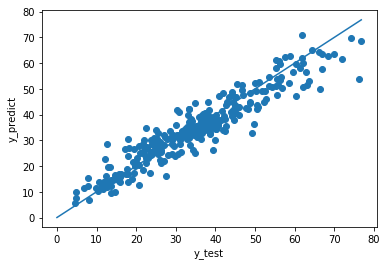

In [250]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [251]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 89.232%  (4.328%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,5.123526,0.887034,0.886127


In [252]:
# Inference from the accuracy metrics:
# ------------------------------------
# Random Forest Regressor has poorer Performance than Gradient Boosting Regressor
# The optimised model of Random Forest RegressorGradient Boosting Regressor is
# RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=2,
#                      min_weight_fraction_leaf=0.0, n_estimators=150,
#                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
#                      warm_start=False)

In [253]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table1=pd.concat([Comparison_Table1,RandomForest_Metrics1])
Comparison_Table1

Model performance range with 95 percentage confidence level is : 89.232%  (4.328%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573
0,Adaboost,7.359663,0.766910,0.765038
0,Gradientboost,4.475665,0.913797,0.913104
0,Random Forest,5.123526,0.887034,0.886127


In [254]:
# Summary of Iteration 1:
# -------------------------
# Duplicate Data were removed 
# Outliers were not treated
# Gradient Boost regressor has the best performance with 91.37 Score in training dataset
# The model has the performance range 92.154%  (3.746%) with 95% confidence level

# Iteration 2

The Given dataset is used as it is (without feature engineering) after removing duplicate data & treating the outliers

In [682]:
# Removing Duplicate Data
concrete_Iter2=concrete_df.copy(deep=True)
concrete_Iter2.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter2.shape

(1005, 9)

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 9 Text xticklabel objects>)

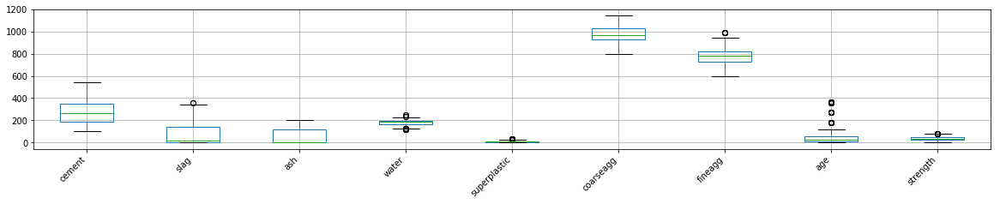

In [683]:
# Observing the outliers using box plot
concrete_Iter2.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [684]:
# Inference from the box plot:
# --------------------------------------------------------------------------------------------------------
# Outliers were observed in the attributes 'slag', 'water', 'superplastic', 'fineagg', 'age' and 'strength'
# --------------------------------------------------------------------------------------------------------
# Oultliers will be observed and removed from the above attributes (as per domain expert suggestion)
# Replacing the extreme values with mean or mean+2*std may lead to poor performance
# Since the concrete strength depends on the ratios of cement:fineagg:courseagg:water

In [685]:
# Observing the Outliers of 'slag' and replacing with nan
median_slag=concrete_Iter2['slag'].median() # Median of 'slag' attribute
std_slag=3.5*(concrete_Iter2['slag'].std()) # Calculating 2*std deviation of 'slag' attribute
concrete_Iter2.loc[(concrete_Iter2['slag']-median_slag).abs()>std_slag, 'slag'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

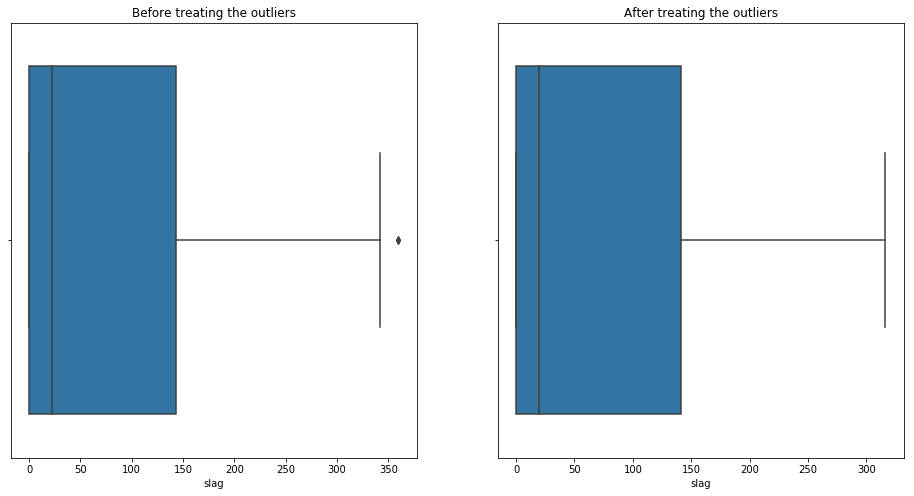

In [686]:
# Boxplot for 'slag' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_df['slag'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter2['slag'])
plt.title('After treating the outliers')

In [687]:
# Observing the Outliers of 'water' and replacing with nan
median_water=concrete_Iter2['water'].median() # Median of 'water' attribute
std_water=2.2*(concrete_Iter2['water'].std()) # Calculating 2*std deviation of 'water' attribute
concrete_Iter2.loc[(concrete_Iter2['water']-median_water).abs()>std_water, 'water'] = np.nan# Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

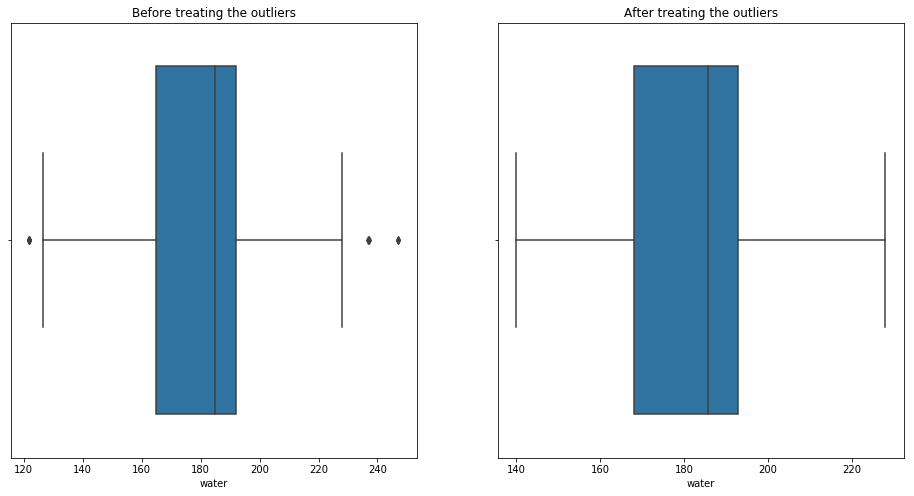

In [688]:
# Boxplot for 'water' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_df['water'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter2['water'])
plt.title('After treating the outliers')

In [689]:
# Observing the Outliers of 'superplastic' and replacing with nan
median_sp=concrete_Iter2['superplastic'].median() # Median of 'superplastic' attribute
std_sp=3*(concrete_Iter2['superplastic'].std()) # Calculating 2*std deviation of 'superplastic' attribute
concrete_Iter2.loc[(concrete_Iter2['superplastic']-median_sp).abs()>std_sp, 'superplastic'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

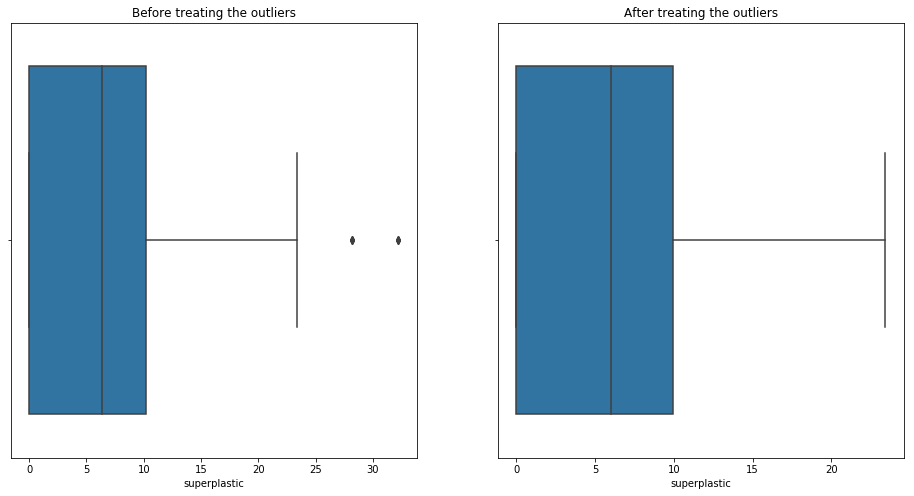

In [690]:
# Boxplot for 'superplastic' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_df['superplastic'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter2['superplastic'])
plt.title('After treating the outliers')

In [691]:
# Observing the Outliers of 'fineagg' and replacing with nan
median_fg=concrete_Iter2['fineagg'].median() # Median of 'superplastic' attribute
std_fg=2.5*(concrete_Iter2['fineagg'].std()) # Calculating 2*std deviation of 'superplastic' attribute
concrete_Iter2.loc[(concrete_Iter2['fineagg']-median_fg).abs()>std_fg, 'fineagg'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

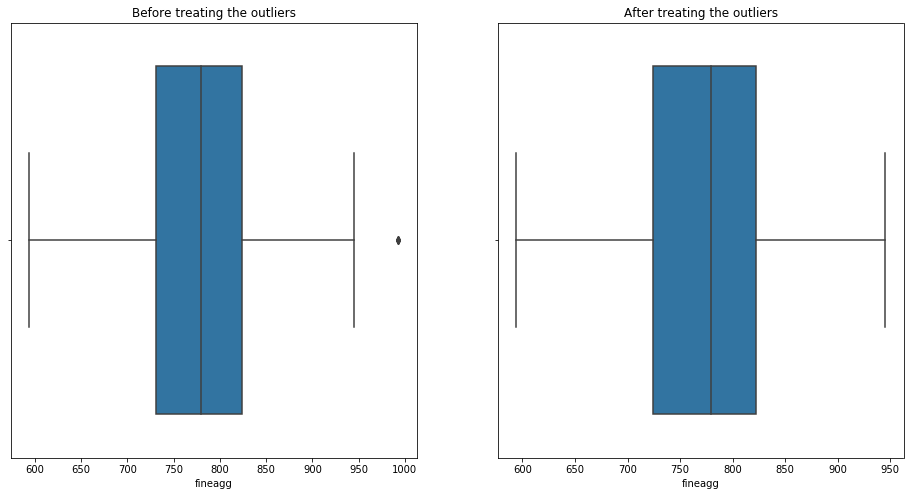

In [692]:
# Boxplot for 'fineagg' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_df['fineagg'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter2['fineagg'])
plt.title('After treating the outliers')

In [693]:
# Observing the Outliers of 'age' and replacing with nan
median_age=concrete_Iter2['age'].median() # Median of 'superplastic' attribute
std_age=2*(concrete_Iter2['age'].std()) # Calculating 2*std deviation of 'superplastic' attribute
concrete_Iter2.loc[(concrete_Iter2['age']-median_age).abs()>std_age, 'age'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

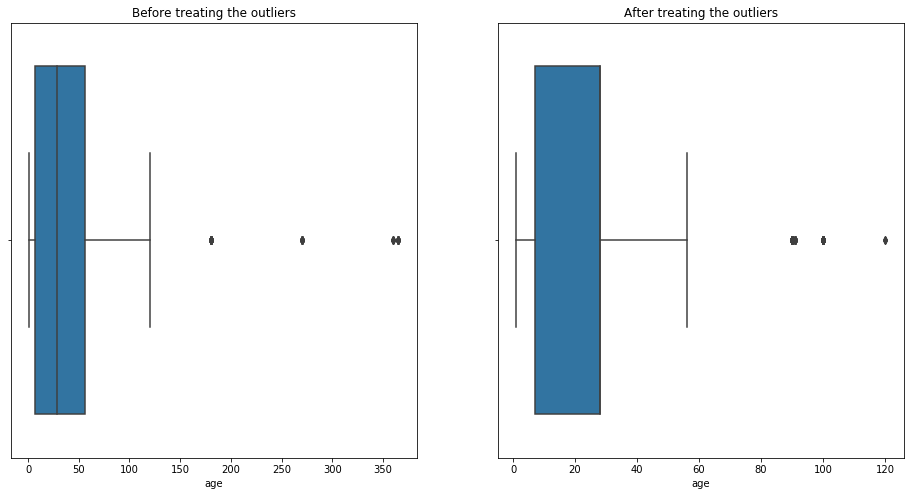

In [694]:
# Boxplot for 'fineagg' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_df['age'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter2['age'])
plt.title('After treating the outliers')

In [695]:
# Outliers of  the attribute 'strength' is kept as it is, since it is a target variable.

In [696]:
concrete_Iter2.isnull().sum()

cement           0
slag             4
ash              0
water           21
superplastic    10
coarseagg        0
fineagg          5
age             59
strength         0
dtype: int64

In [697]:
concrete_Iter2=concrete_Iter2.dropna(axis=0) # Removing the row containing Nan
concrete_Iter2.isnull().sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

In [698]:
concrete_Iter2_backup1=concrete_Iter2.copy(deep=True)
concrete_Iter2_backup2=concrete_Iter2.copy(deep=True)

In [699]:
concrete_Iter2_backup1.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28.0,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14.0,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28.0,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28.0,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28.0,18.29


(array([1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 9 Text xticklabel objects>)

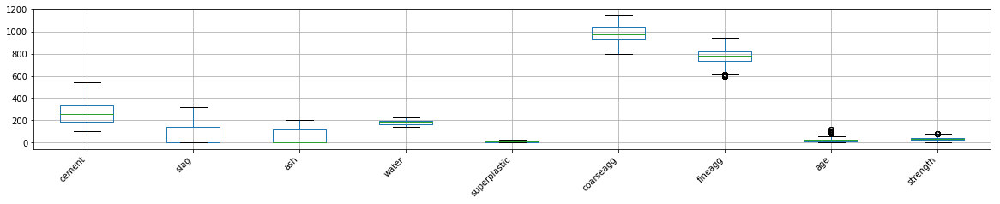

In [700]:
# Observing using box plot after treating the outliers
concrete_Iter2.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [701]:
# Inference from the box plot:
# ---------------------------
# Outliers were removed and new outliers were observed

In [702]:
concrete_Iter2.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28.0,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14.0,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28.0,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28.0,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28.0,18.29


In [703]:
concrete_Iter2.shape

(916, 9)

In [704]:
X=concrete_Iter2.drop('strength',axis=1) # Independent Attribute
y=concrete_Iter2.pop('strength') # Dependent Attribute

In [705]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [721]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.69828281 0.84389603 0.78068754 0.74541819 0.78267279 0.75286247
 0.69929394 0.85290384 0.77487124 0.76347664]


In [722]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 76.944%
 Standard Deviation : 4.870%


In [723]:
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

In [724]:
# Let us explore the coefficients for each of the independent attributes and the intercept
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, LR_model.coef_[idx]))
intercept=LR_model.intercept_
print("The intercept for our model is {}".format(intercept))

The coefficient for cement is 0.11164985028345235
The coefficient for slag is 0.07739602783782643
The coefficient for ash is 0.059002128670115485
The coefficient for water is -0.26055336841243315
The coefficient for superplastic is 0.09462439499556431
The coefficient for coarseagg is -0.012623616942554318
The coefficient for fineagg is -0.004197756980912938
The coefficient for age is 0.30635615196555605
The intercept for our model is 47.24360703400621


In [725]:
# comparing the tested and predicted values
values_of_tested_and_predicted=pd.DataFrame(np.vstack([y_test,y_pred]).T)
values_of_tested_and_predicted.columns=['y_test', 'y_pred']
values_of_tested_and_predicted.head()

,y_test,y_pred
0,26.86,24.302053
1,50.60,36.843541
2,22.35,16.907282
3,42.70,36.148800
4,40.29,49.762891


In [726]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.7855426667031186
The accuracy score for testing set is 0.6904096017743553


In [727]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6904096017743553
The adjusted R Square value for testing set is 0.6876789257150331
The RMSE value for testing set is 8.5896034272306085


Text(0, 0.5, 'y_predict')

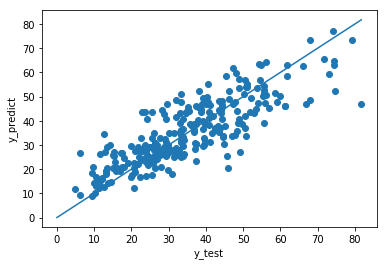

In [728]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')


In [729]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 76.944%  (9.544%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.69041,0.687679


## Using Polynomial Regression (degree=2)

In [730]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [731]:
print(X_train.shape)
print(X_train_2.shape)

(641, 8)
(641, 37)


In [732]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 8 to 37

In [733]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.58936468 0.85516632 0.82923255 0.69618839 0.78971413 0.77128346
 0.73687396 0.89208434 0.830364   0.76987577]


In [734]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 77.601%
 Standard Deviation : 8.277%


In [735]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [736]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.8330809849721026
The accuracy score for testing set is 0.7190027899350493


In [737]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7190027899350493
The adjusted R Square value for testing set is 0.7165243139918083
The RMSE value for testing set is 8.1833358622470698


Text(0, 0.5, 'y_predict')

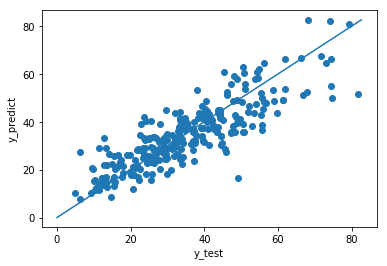

In [738]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [739]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : 77.601%  (16.223%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524


In [740]:
Comparison_Table2=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table2

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524


In [741]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs better than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [742]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.76633456 0.85510484 0.82908946 0.69631141 0.78986663 0.77129434
 0.7376796  0.89217458 0.83020787 0.76981553]


In [743]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 79.379%  (10.827%)


In [744]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [ 0.00000000e+00  7.29608430e-02  6.27280421e-02  1.92474754e-01
  1.74758580e+00  3.45763716e+00  9.51539018e-02 -4.58066532e-02
  2.12558499e-01  1.37528403e-04  2.89580634e-04 -9.52498850e-04
 -5.47965030e-03  9.26901486e-05  1.47424725e-04  5.96806625e-04
  2.82496880e-04 -6.87609480e-04 -4.09202167e-03 -1.19774194e-04
  2.58008183e-04  1.14065376e-03 -2.23070556e-03 -1.15742455e-02
 -2.72593774e-05  2.93051490e-04  1.08990305e-03  1.07202568e-02
 -1.09098485e-03 -6.33651070e-04 -2.17525388e-03 -4.21610917e-04
 -2.76501517e-03 -6.68314700e-03  9.59025448e-05  1.46168296e-05
  2.66132344e-04]


In [745]:
y_pred = ridge.predict(X_test_2)

In [746]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.8330768398782487
The accuracy score for testing set is 0.7190291546397550


In [747]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7190291546397550
The adjusted R Square value for testing set is 0.7165509112407672
The RMSE value for testing set is 8.1829519504380421


Text(0, 0.5, 'y_predict')

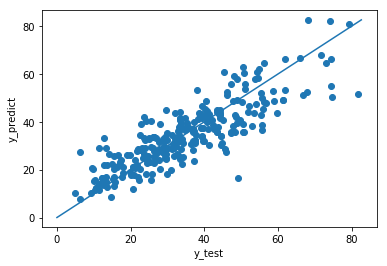

In [748]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [749]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551


In [750]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 79.379%  (10.827%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [751]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3,max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.77707775 0.85433615 0.83327243 0.71287384 0.79431715 0.77258938
 0.738796   0.8930992  0.82835913 0.77384523]


In [752]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 79.786%  (10.150%)


In [753]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))

Lasso model: [ 0.00000000e+00 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
  9.25873321e-01  0.00000000e+00 -0.00000000e+00 -1.02748563e-01
  0.00000000e+00  1.25375477e-04  2.89576737e-04 -6.07093739e-04
 -4.20769464e-03  9.56076230e-05  1.44068742e-04  6.46924910e-04
  2.71333252e-04 -3.04781447e-04 -2.54499517e-03 -1.36351162e-04
  2.57841646e-04  1.19571609e-03 -1.53792873e-03 -9.19534376e-03
 -1.16664940e-05  3.39671334e-04  1.15618911e-03  1.22828259e-02
 -6.40593371e-04 -3.88349386e-04 -1.75116552e-03  1.18792007e-03
 -1.49115281e-03 -6.07591816e-03  9.42061285e-05  8.03036538e-05
  3.27318899e-04]


In [754]:
y_pred = lasso.predict(X_test_2)

In [755]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.8322199494291184
The accuracy score for testing set is 0.7134270764382642


In [756]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7134270764382642
The adjusted R Square value for testing set is 0.7108994211036513
The RMSE value for testing set is 8.2641263622908454


Text(0, 0.5, 'y_predict')

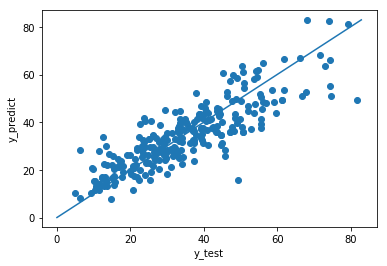

In [757]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [758]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 79.786%  (10.150%)


In [759]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899


In [760]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 79.786%  (10.150%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899


## Using Polynomial Regression (degree=3)

In [761]:
poly=PolynomialFeatures(degree=3, interaction_only=True) #Considering Polynomial degree as 3
X_train_3 = poly.fit_transform(X_train)
X_test_3 = poly.fit_transform(X_test)

In [762]:
print(X_train.shape)
print(X_train_3.shape)

(641, 8)
(641, 93)


In [763]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 8 to 93

In [764]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR3_model=linear_model.LinearRegression()
results=cross_val_score(PR3_model,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-1.07216773  0.82190508  0.84466298  0.62683042  0.79518002  0.7868915
  0.74817177  0.87454403  0.79744914  0.75313922]


In [765]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 59.766%
 Standard Deviation : 56.024%


In [766]:
PR3_model.fit(X_train_3,y_train)
y_pred = PR3_model.predict(X_test_3)

In [767]:
print("The accuracy score for training set is %12.16f" %PR3_model.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %PR3_model.score(X_test_3,y_test))

The accuracy score for training set is 0.8715051716197648
The accuracy score for testing set is 0.6861822132930362


In [768]:
# r square value for testing
r_square_for_testing=PR3_model.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6861822132930362
The adjusted R Square value for testing set is 0.6834142504554885
The RMSE value for testing set is 8.6480491562561799


Text(0, 0.5, 'y_predict')

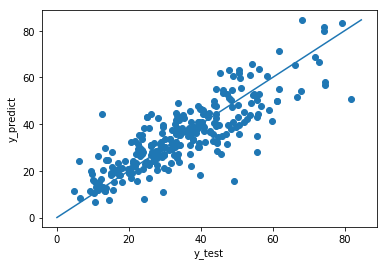

In [769]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [770]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3 = pd.DataFrame({'Model':['Polynomial Regression - degree 3'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3=Polynomial_Regression_Metrics1_degree3[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3

Model performance range with 95 percentage confidence level is : 59.766%  (109.807%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3,8.648049,0.686182,0.683414


In [771]:
Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree3])
Comparison_Table2

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899
0,Polynomial Regression - degree 3,8.648049,0.686182,0.683414


In [772]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=3 performs better than linear regression and polynomial regression with degree =2 in test dataset
# But the 95% confidence accuracy score is 59.766%  (109.807%) 
# i.e it's performance may be too high and too low at production
# So this model is a poor model
# So trying out the ridge and Lasso

## Using Polynomial Regression (degree=3)  & Ridge Regression

In [773]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.68340058 0.82337306 0.84328066 0.62094467 0.79475944 0.79847695
 0.74783272 0.87831125 0.8020597  0.75633149]


In [774]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 77.488%  (14.210%)


In [775]:
ridge.fit(X_train_3,y_train)
y_pred = ridge.predict(X_test_3)

In [776]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_3,y_test))

The accuracy score for training set is 0.8714146772944473
The accuracy score for testing set is 0.6827772048085695


In [777]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6827772048085695
The adjusted R Square value for testing set is 0.6799792088201115
The RMSE value for testing set is 8.6948394216430724


Text(0, 0.5, 'y_predict')

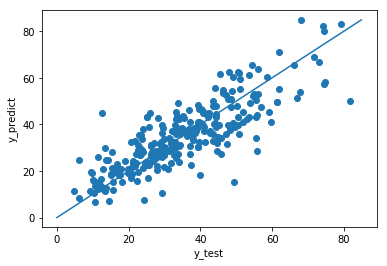

In [778]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [779]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_ridge=Polynomial_Regression_Metrics1_degree3_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_ridge

Model performance range with 95 percentage confidence level is : 77.488%  (14.210%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & ridge,8.694839,0.682777,0.679979


In [780]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 77.488%  (14.210%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899
0,Polynomial Regression - degree 3,8.648049,0.686182,0.683414
0,Polynomial Regression - degree 3 & ridge,8.694839,0.682777,0.679979


In [781]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Eventhough there is no much difference in performance metrics between polynomial Regression with degree - 3 and ridge
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        :  59.766%  (109.807%) 
# With Ridge Regression     :  77.488%  (14.210%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=3)  & Lasso Regression

In [782]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
results=cross_val_score(lasso,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10169.234409108083, tolerance: 16.486046889843752
  positive)
C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10697.030806373534, tolerance: 16.00478095500867
  positive)
C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10800.672516046368, tolerance: 16.097231736325824
  positive)
C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the nu

The score value for all the crossfolds 
[0.68351247 0.83444075 0.84604709 0.71888095 0.79564498 0.82112879
 0.75001114 0.89188665 0.80059003 0.76540265]


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9911.512109640049, tolerance: 15.664682062426344
  positive)


In [783]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 79.075%  (11.630%)


In [784]:
lasso.fit(X_train_3,y_train)
y_pred = lasso.predict(X_test_3)

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11985.408379779803, tolerance: 17.95135650402496
  positive)


In [785]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_3,y_test))

The accuracy score for training set is 0.8680662749246069
The accuracy score for testing set is 0.6910015009791884


In [786]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6910015009791884
The adjusted R Square value for testing set is 0.6882760456405264
The RMSE value for testing set is 8.5813883600376233


Text(0, 0.5, 'y_predict')

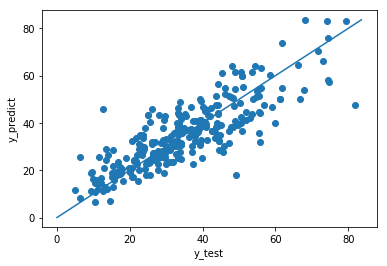

In [787]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [788]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_Lasso=Polynomial_Regression_Metrics1_degree3_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_Lasso

Model performance range with 95 percentage confidence level is : 79.075%  (11.630%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & lasso,8.581388,0.691002,0.688276


In [789]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree3_Lasso])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 79.075%  (11.630%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899
0,Polynomial Regression - degree 3,8.648049,0.686182,0.683414
0,Polynomial Regression - degree 3 & ridge,8.694839,0.682777,0.679979
0,Polynomial Regression - degree 3 & lasso,8.581388,0.691002,0.688276


In [790]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Eventhough there is no much difference in performance metrics between polynomial Regression with degree - 3, ridge and lasso
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        :  59.766%  (109.807%) 
# With Ridge Regression     :  77.488%  (14.210%)
# With Lasso Regression     :  79.075%  (11.630%)
# --------------------------------------------------------------------------
# Lassor Regression Didn't converge

In [791]:
# Observation by comparing Model of Linear regression, Polynomial Regression - Degree 2 & Polynomial Regression - Degree 3
# ------------------------------------------------------------------------------------------------------------------------
# Polynomial regression -degree 2 model is has better performance than Linear Regression and Polynomial Regression - degree 3
# That means the performance decreases as the degree increases further...

## Using Polynomial Regression (degree=4)

In [792]:
poly=PolynomialFeatures(degree=4, interaction_only=True) #Considering Polynomial degree as 4
X_train_4 = poly.fit_transform(X_train)
X_test_4 = poly.fit_transform(X_test)

In [793]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR4_model=linear_model.LinearRegression()
results=cross_val_score(PR4_model,X_train_4, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-6.89894922  0.49936714  0.7850526  -0.02619412  0.72966053  0.72409107
  0.17351329  0.83720253  0.68823344  0.66956435]


In [794]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : -18.185%
 Standard Deviation : 225.479%


In [795]:
PR4_model.fit(X_train_4,y_train)
y_pred = PR4_model.predict(X_test_4)

In [796]:
print("The accuracy score for training set is %12.16f" %PR4_model.score(X_train_4,y_train))
print("The accuracy score for testing set is %12.16f" %PR4_model.score(X_test_4,y_test))

The accuracy score for training set is 0.8938739240766591
The accuracy score for testing set is 0.5372172914819492


In [797]:
# r square value for testing
r_square_for_testing=PR4_model.score(X_test_4,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.5372172914819492
The adjusted R Square value for testing set is 0.5331354153318451
The RMSE value for testing set is 10.5019013339461580


In [798]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : -18.185%  (441.939%)


In [799]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree4 = pd.DataFrame({'Model':['Polynomial Regression - degree 4'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree4=Polynomial_Regression_Metrics1_degree4[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 4,10.501901,0.537217,0.533135


In [800]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Polynomial_Regression_Metrics1_degree4])
Comparison_Table2

Model performance range with 95 percentage confidence level is : -18.185%  (441.939%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2,8.183336,0.719003,0.716524
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,Polynomial Regression - degree 2 & lasso,8.264126,0.713427,0.710899
0,Polynomial Regression - degree 3,8.648049,0.686182,0.683414
0,Polynomial Regression - degree 3 & ridge,8.694839,0.682777,0.679979
0,Polynomial Regression - degree 3 & lasso,8.581388,0.691002,0.688276
0,Polynomial Regression - degree 4,10.501901,0.537217,0.533135


In [801]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# As expected the performance started to drop as the polynomial degree increases
# So if the degree is further more increased the model will become over fit.
#---------------------------------------------------------------------------

In [802]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table2=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table2

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551


## Support Vector Regressor

In [803]:
#Spliting into training and test test first to avoid data leak
train,test=train_test_split(concrete_Iter2_backup1,test_size=0.30, random_state=1)
print(train.shape)
print(test.shape)

(641, 9)
(275, 9)


In [804]:
X_train=train.drop('strength',axis=1) # Independent Attribute for training data
X_test=test.drop('strength',axis=1) # Independent Attribute for testing data
y_train=train.pop('strength') # Dependent Attribute for training data
y_test=test.pop('strength') # Dependent Attribute for testin data
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(641, 8)
(275, 8)
(641,)
(275,)


In [805]:
X_train_scale = preprocessing.scale(X_train)
X_test_scale = preprocessing.scale(X_test)
y_train_scale = preprocessing.scale(y_train)
y_test_scale = preprocessing.scale(y_test)

In [806]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [807]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)
gs.fit(X_train_scale,y_train_scale)

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [808]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8986260198343836
Standard deviation for the best model 0.023295662091248177


In [809]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.863%
 Standard Deviation : 2.32957%


In [810]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train_scale,y_train_scale)
y_pred = SVR_optimised_model.predict(X_test_scale)

In [811]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train_scale,y_train_scale))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test_scale,y_test_scale))

The accuracy score for training set is 0.9565203998646997
The accuracy score for testing set is 0.8274389945454171


In [812]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test_scale,y_test_scale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_scale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8274389945454171
The adjusted R Square value for testing set is 0.8259169570110878
The RMSE value for testing set is 0.4154046285907066


Text(0, 0.5, 'y_predict')

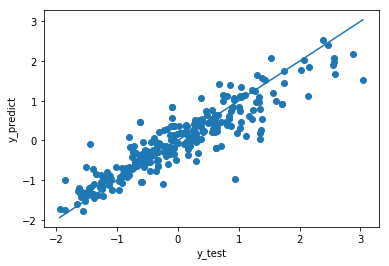

In [813]:
fig, ax = plt.subplots()
ax.scatter(y_test_scale, y_pred)
ax.plot([min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))], [min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [814]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 89.863%  (4.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.415405,0.827439,0.825917


In [815]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,SVR_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 89.863%  (4.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917


In [816]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# RMSE Value is observed to be too low.
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

## KNN Regressor

In [375]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [376]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [377]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)
gs.fit(X_train_stdscale,y_train_stdscale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [378]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 4}
The model which produce best score is 0.7756549728643638
Standard deviation for the best model 0.04955574599215488


In [379]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 77.565%
 Standard Deviation : 4.95557%


In [380]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [381]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.8842160063483796
The accuracy score for testing set is 0.6644867234534153


In [382]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6644867234534153
The adjusted R Square value for testing set is 0.6615274001762679
The RMSE value for testing set is 0.5792350788294721


Text(0, 0.5, 'y_predict')

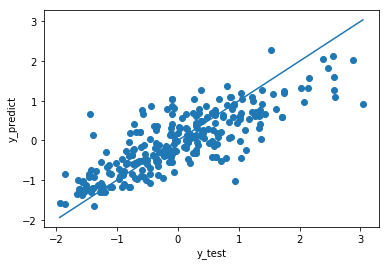

In [383]:
fig, ax = plt.subplots()
ax.scatter(y_test_stdscale, y_pred)
ax.plot([min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))], [min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [384]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 77.565%  (9.713%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.579235,0.664487,0.661527


In [385]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,KNN_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 77.565%  (9.713%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527


In [386]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is very poor.
# RMSE value of KNN and SVR is observed to be too low. since RMSE is calculated based on the scaled data
# So RMSE Cannot be used as a better one to observe the performance
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
#                    weights='uniform')

## Decision Tree Regressor

In [387]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [388]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [389]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.8076255730951611
Standard deviation for the best model 0.05379595126767984


In [390]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 80.763%
 Standard Deviation : 5.37960%


In [391]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [392]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9974470343452673
The accuracy score for testing set is 0.7582299713488746


In [393]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7582299713488746
The adjusted R Square value for testing set is 0.7560974903905405
The RMSE value for testing set is 7.5906785961222534


Text(0, 0.5, 'y_predict')

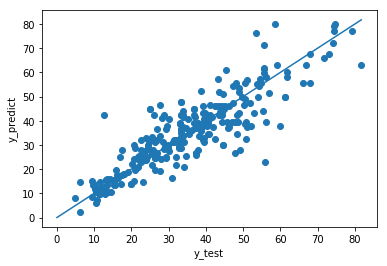

In [394]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [395]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 80.763%  (10.544%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,7.590679,0.75823,0.756097


In [396]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,DecisionTree_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 80.763%  (10.544%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097


In [397]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='mse', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [398]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [399]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [400]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 50}
The model which produce best score is 0.8906111295854617
Standard deviation for the best model 0.037863246833193136


In [401]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.061%
 Standard Deviation : 3.78632%


In [402]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [403]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9717118194029422
The accuracy score for testing set is 0.8453170345258473


In [404]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8453170345258473
The adjusted R Square value for testing set is 0.8439526864290521
The RMSE value for testing set is 6.0715645516890584


Text(0, 0.5, 'y_predict')

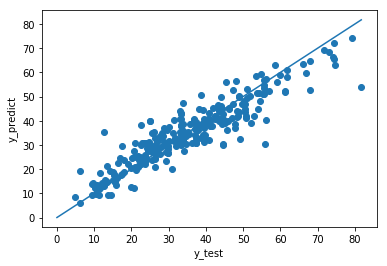

In [405]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [406]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 89.061%  (7.421%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,6.071565,0.845317,0.843953


In [407]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Bagging_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 89.061%  (7.421%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953


In [408]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=50,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [409]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [410]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [411]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 1.0, 'n_estimators': 150}
The model which produce best score is 0.7962232377478757
Standard deviation for the best model 0.04097652121114378


In [412]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 79.622%
 Standard Deviation : 4.09765%


In [413]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [414]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8421930160002133
The accuracy score for testing set is 0.7444389066495328


In [415]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7444389066495328
The adjusted R Square value for testing set is 0.7421847845472134
The RMSE value for testing set is 7.8041703513795921


Text(0, 0.5, 'y_predict')

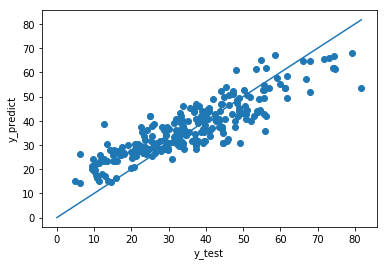

In [416]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [417]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 79.622%  (8.031%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,7.80417,0.744439,0.742185


In [418]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Adaboost_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 79.622%  (8.031%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953
0,Adaboost,7.804170,0.744439,0.742185


In [419]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
#                  n_estimators=150, random_state=1)

## Gradient Boosting Regressor

In [420]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [421]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [422]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'friedman_mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.9101192781999748
Standard deviation for the best model 0.03141902685099813


In [423]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 91.012%
 Standard Deviation : 3.14190%


In [424]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [425]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9767963737834877
The accuracy score for testing set is 0.8822469237586450


In [426]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8822469237586450
The adjusted R Square value for testing set is 0.8812083078711799
The RMSE value for testing set is 5.2974333683205819


Text(0, 0.5, 'y_predict')

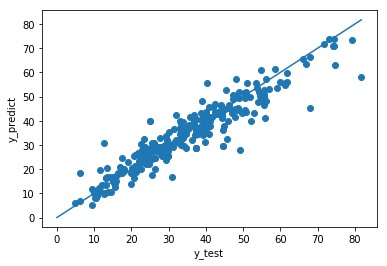

In [427]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [428]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 91.012%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,5.297433,0.882247,0.881208


In [429]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,Gradientboost_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 91.012%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953
0,Adaboost,7.804170,0.744439,0.742185
0,Gradientboost,5.297433,0.882247,0.881208


In [430]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=3,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [431]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [433]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [434]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8901852497785943
Standard deviation for the best model 0.040779427833423726


In [435]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.019%
 Standard Deviation : 4.07794%


In [436]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [437]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9767523808677457
The accuracy score for testing set is 0.8523297001280948


In [438]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8523297001280948
The adjusted R Square value for testing set is 0.8510272057521574
The RMSE value for testing set is 5.9323388607660714


Text(0, 0.5, 'y_predict')

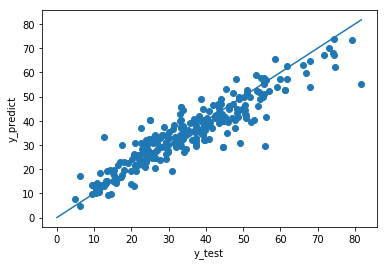

In [439]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [440]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 89.019%  (7.993%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,5.932339,0.85233,0.851027


In [441]:
# Inference from the accuracy metrics:
# ------------------------------------
# Random Forest Regressor has poorer Performance than Gradient Boosting Regressor
# The optimised model of Random Forest RegressorGradient Boosting Regressor is
# RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=2,
#                      min_weight_fraction_leaf=0.0, n_estimators=200,
#                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
#                      warm_start=False)

In [442]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table2=pd.concat([Comparison_Table2,RandomForest_Metrics1])
Comparison_Table2

Model performance range with 95 percentage confidence level is : 89.019%  (7.993%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953
0,Adaboost,7.804170,0.744439,0.742185
0,Gradientboost,5.297433,0.882247,0.881208
0,Random Forest,5.932339,0.852330,0.851027


In [443]:
# Summary of Iteration 2:
# -------------------------
# Duplicate Data were removed 
# Outliers were observed and removed
# Gradient Boost regressor has the best performance with 88.22 Score in training dataset
# The model has the performance range  91.012%  (6.158%) with 95% confidence level

In [444]:
# Comparing Iteration 1 and 2:
# ---------------------------
# Gradientboost performance is better in both training and test dataset at iteration 1 & 2.
# Removing the outliers is not good, since valid datapoints are there in the dataset as extreme values

## Iteration 3

1. Removing duplicate data
2. Outliers are not treated
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)

In [445]:
# Removing Duplicate Data
concrete_Iter3=concrete_df.copy(deep=True)
concrete_Iter3.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter3.shape

(1005, 9)

In [446]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)

In [447]:
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter3['cement/cement']=concrete_Iter3['cement']/concrete_Iter3['cement']
concrete_Iter3['slag/cement']=concrete_Iter3['slag']/concrete_Iter3['cement']
concrete_Iter3['ash/cement']=concrete_Iter3['ash']/concrete_Iter3['cement']
concrete_Iter3['water/cement']=concrete_Iter3['water']/concrete_Iter3['cement']
concrete_Iter3['superplastic/cement']=concrete_Iter3['superplastic']/concrete_Iter3['cement']
concrete_Iter3['coarseagg/cement']=concrete_Iter3['coarseagg']/concrete_Iter3['cement']
concrete_Iter3['fineagg/cement']=concrete_Iter3['fineagg']/concrete_Iter3['cement']
concrete_Iter3.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [448]:
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter3.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)

In [449]:
concrete_Iter3.head()

,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [450]:
# Rearranging the columns
concrete_Iter3 = concrete_Iter3[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]
concrete_Iter3.head()

,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


In [451]:
concrete_Iter3.shape # 25 duplicate rows is removed and 1 column is removed after feature engineering

(1005, 9)

In [452]:
# Observing the distribution of Independent attributes before and after featuer engineering

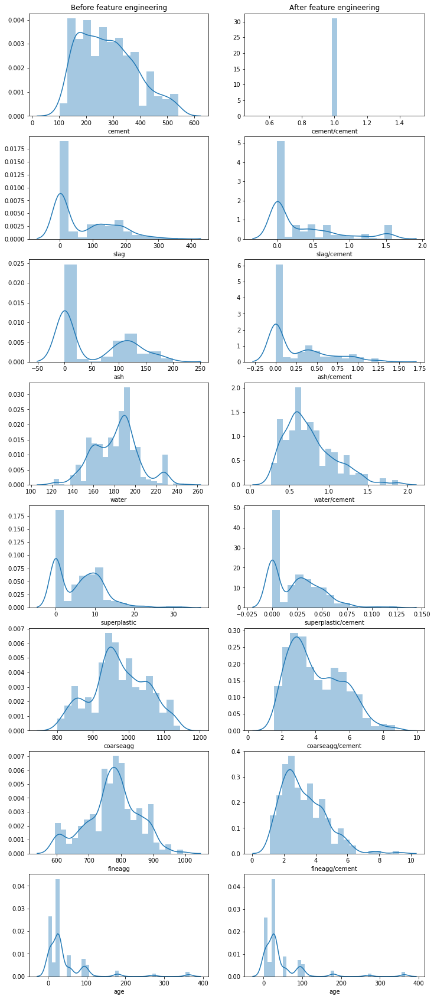

In [453]:
# Analysing the dataset using histogram.
f, axes = plt.subplots(8, 2, figsize=(12, 30), sharex=True)
subplot(8,2,1)
sns.distplot(concrete_df['cement'])
plt.title('Before feature engineering')
subplot(8,2,2)
sns.distplot(concrete_Iter3['cement/cement'])
plt.title('After feature engineering')
subplot(8,2,3)
sns.distplot(concrete_df['slag'])
subplot(8,2,4)
sns.distplot(concrete_Iter3['slag/cement'])
subplot(8,2,5)
sns.distplot(concrete_df['ash'])
subplot(8,2,6)
sns.distplot(concrete_Iter3['ash/cement'])
subplot(8,2,7)
sns.distplot(concrete_df['water'])
subplot(8,2,8)
sns.distplot(concrete_Iter3['water/cement'])
subplot(8,2,9)
sns.distplot(concrete_df['superplastic'])
subplot(8,2,10)
sns.distplot(concrete_Iter3['superplastic/cement'])
subplot(8,2,11)
sns.distplot(concrete_df['coarseagg'])
subplot(8,2,12)
sns.distplot(concrete_Iter3['coarseagg/cement'])
subplot(8,2,13)
sns.distplot(concrete_df['fineagg'])
subplot(8,2,14)
sns.distplot(concrete_Iter3['fineagg/cement'])
subplot(8,2,15)
sns.distplot(concrete_df['age'])
subplot(8,2,16)
sns.distplot(concrete_Iter3['age'])
plt.show()

In [454]:
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter3.drop(['cement/cement'], axis=1, inplace=True)
concrete_Iter3.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


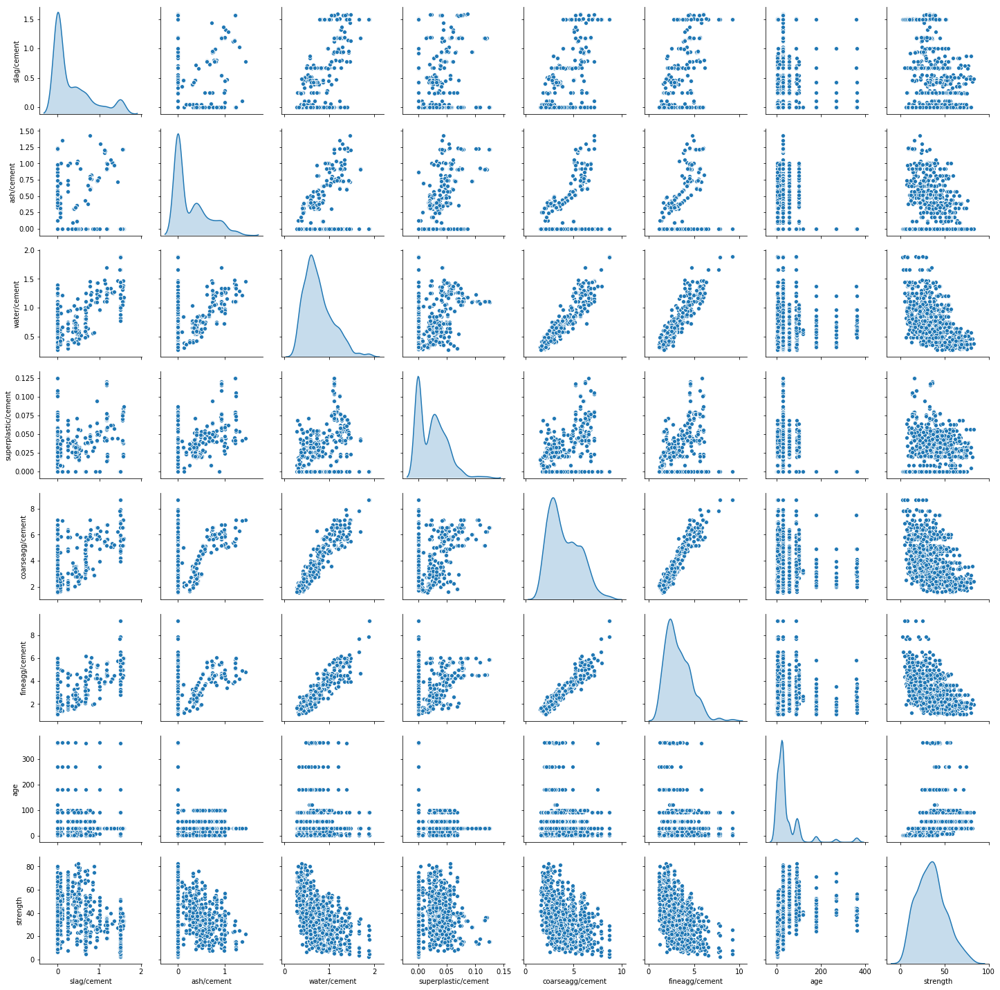

In [455]:
# Pair plot between all the independent attributes
sns.pairplot(concrete_Iter3, diag_kind='kde')

In [456]:
# Inference from the pairplot:
# ------------------------------
# 3 to 5 Gaussians wer available
# Linear relationship between the independent attributes were also obaserved

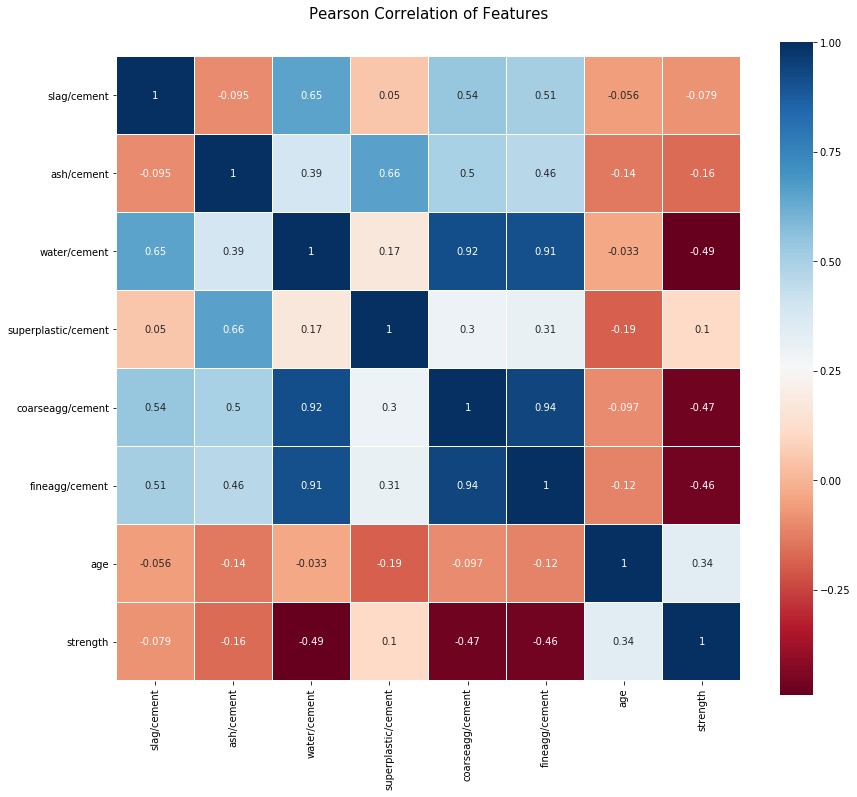

In [457]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_Iter3.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [458]:
# Writing down the relationship between independent attribute and dependent attribute in order of importance (descending order)
# -----------------------------------------------------------------------------------------------------------------------------
# Water/cement         - 0.49
# Coarseagg/cement     - 0.47
# Fineagg/cement       - 0.46
# Age                    0.37
# Ash/cement           - 0.16
# Superplastic/cement    0.1
# Slag/cement          -0.079


In [459]:
concrete_Iter3_backup1=concrete_Iter3.copy(deep=True)
concrete_Iter3_backup2=concrete_Iter3.copy(deep=True)
concrete_Iter3.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


In [460]:
X=concrete_Iter3.drop('strength',axis=1) # Independent Attribute
y=concrete_Iter3.pop('strength') # Dependent Attribute

In [461]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [462]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

 Mean Accuracy      : 55.896%
 Standard Deviation : 7.045%


In [463]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.5748458704208065
The accuracy score for testing set is 0.4974635459550108


In [464]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.4974635459550108
The adjusted R Square value for testing set is 0.4939352057560991
The RMSE value for testing set is 10.8063657121805949


Text(0, 0.5, 'y_predict')

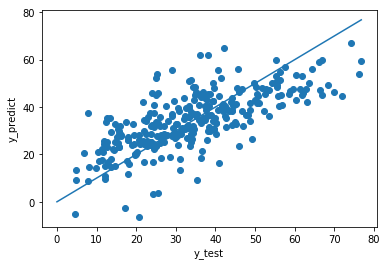

In [465]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [466]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 55.896%  (13.808%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935


## Using Polynomial Regression (degree=2)

In [467]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [468]:
print(X_train.shape)
print(X_train_2.shape)

(703, 7)
(703, 29)


In [469]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 8 to 37

In [470]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-1.17711954  0.71683781  0.58214237  0.68592514  0.77909621  0.72632097
  0.66693717  0.70369419  0.51860265  0.57499221]


In [471]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 47.774%
 Standard Deviation : 55.683%


In [472]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [473]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.7181220760269240
The accuracy score for testing set is 0.6763140320942933


In [474]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.7181220760269240
The accuracy score for testing set is 0.6763140320942933


In [475]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6763140320942933
The adjusted R Square value for testing set is 0.6740414124600507
The RMSE value for testing set is 8.6727696543553527


Text(0, 0.5, 'y_predict')

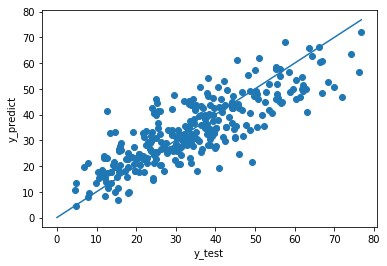

In [476]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [477]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : 47.774%  (109.138%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,8.67277,0.676314,0.674041


In [478]:
Comparison_Table3=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041


In [479]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs better than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [480]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.65905826 0.697744   0.56915708 0.67179393 0.7660412  0.73373209
 0.66092473 0.70371456 0.45053584 0.69551867]


In [481]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 66.082%  (16.808%)


In [482]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [  0.          25.39390705  21.45344456 -47.98684702   4.6240993
  -5.01757947  -7.74590647   0.15110242   1.24256702  -5.29268307
   8.92806269  -4.59074047   3.84957121   0.1430558   -4.80129739
 -22.42990312  -3.80533514   2.43333935   0.15911205  -1.57132998
   6.03419827  -1.94939597  -0.18285175   5.37187735 -13.01428557
   4.16601487   0.74158503  -0.063797     0.08914688]


In [483]:
y_pred = ridge.predict(X_test_2)

In [484]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.7042919997073757
The accuracy score for testing set is 0.6568897815549817


In [485]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6568897815549817
The adjusted R Square value for testing set is 0.6544807830302926
The RMSE value for testing set is 8.9292031056298722


Text(0, 0.5, 'y_predict')

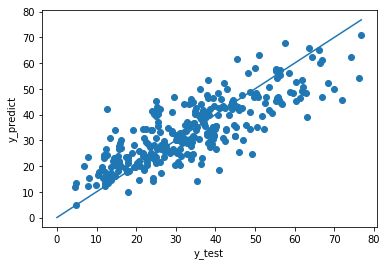

In [486]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [487]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,8.929203,0.65689,0.654481


In [488]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 66.082%  (16.808%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [489]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.64858487 0.65542432 0.57975139 0.60371897 0.71820995 0.69604255
 0.59324214 0.68316433 0.41773472 0.63212706]


In [490]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 62.280%  (15.811%)


In [491]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))

Lasso model: [ 0.          0.          0.         -0.          0.         -2.11166529
 -8.13834583  0.24276062 -0.          0.          0.          0.
  1.96799001  0.25345785 -0.         -0.          0.20151715  0.
  0.23704902  0.         -2.44958549 -0.         -0.4259615   0.
  0.          3.86153813  0.65068582 -0.0705198   0.11317466]


In [492]:
y_pred = lasso.predict(X_test_2)

In [493]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.6598822731843348
The accuracy score for testing set is 0.6156748655380195


In [494]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6156748655380195
The adjusted R Square value for testing set is 0.6129764944836225
The RMSE value for testing set is 9.4502929052100342


Text(0, 0.5, 'y_predict')

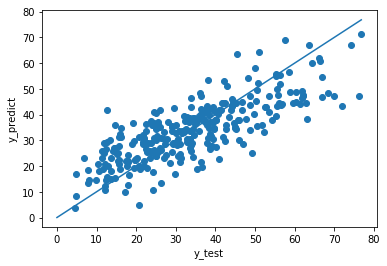

In [495]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [496]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 62.280%  (15.811%)


In [497]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976


In [498]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 62.280%  (15.811%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976


## Using Polynomial Regression (degree=3)

In [499]:
poly=PolynomialFeatures(degree=3, interaction_only=True) #Considering Polynomial degree as 3
X_train_3 = poly.fit_transform(X_train)
X_test_3 = poly.fit_transform(X_test)

In [500]:
print(X_train.shape)
print(X_train_3.shape)

(703, 7)
(703, 64)


In [501]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 7 to 64

In [502]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR3_model=linear_model.LinearRegression()
results=cross_val_score(PR3_model,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-1.90190018  0.71441337  0.59447243  0.65216375  0.76243213  0.72613127
  0.73185926  0.78812836  0.11378463  0.6527836 ]


In [503]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 38.343%
 Standard Deviation : 78.362%


In [504]:
PR3_model.fit(X_train_3,y_train)
y_pred = PR3_model.predict(X_test_3)

In [505]:
print("The accuracy score for training set is %12.16f" %PR3_model.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %PR3_model.score(X_test_3,y_test))

The accuracy score for training set is 0.7777983095131666
The accuracy score for testing set is 0.6602152765097273


In [506]:
# r square value for testing
r_square_for_testing=PR3_model.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6602152765097273
The adjusted R Square value for testing set is 0.6578296264952519
The RMSE value for testing set is 8.8858259060857048


Text(0, 0.5, 'y_predict')

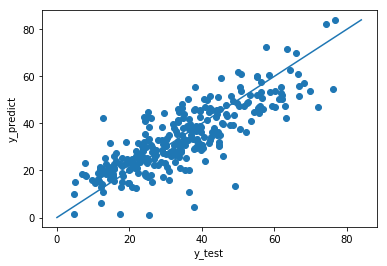

In [507]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [508]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3 = pd.DataFrame({'Model':['Polynomial Regression - degree 3'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3=Polynomial_Regression_Metrics1_degree3[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3

Model performance range with 95 percentage confidence level is : 38.343%  (153.589%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3,8.885826,0.660215,0.65783


In [509]:
Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree3])
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976
0,Polynomial Regression - degree 3,8.885826,0.660215,0.657830


In [510]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=3 performs better than linear regression and polynomial regression with degree =2 in test dataset
# But the 95% confidence accuracy score is 59.766%  (109.807%) 
# i.e it's performance may be too high and too low at production
# So this model is a poor model
# So trying out the ridge and Lasso

## Using Polynomial Regression (degree=3)  & Ridge Regression

In [511]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.74366203 0.73828677 0.58050251 0.66251531 0.77801874 0.75816862
 0.74986469 0.7770456  0.29315099 0.70237873]


In [512]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 67.836%  (27.566%)


In [513]:
ridge.fit(X_train_3,y_train)
y_pred = ridge.predict(X_test_3)

In [514]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_3,y_test))

The accuracy score for training set is 0.7652232544840573
The accuracy score for testing set is 0.6775322894978320


In [515]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6775322894978320
The adjusted R Square value for testing set is 0.6752682233258007
The RMSE value for testing set is 8.6564334100550440


Text(0, 0.5, 'y_predict')

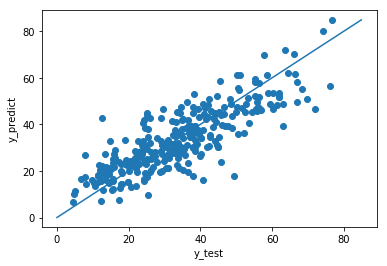

In [516]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [517]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_ridge=Polynomial_Regression_Metrics1_degree3_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_ridge

Model performance range with 95 percentage confidence level is : 67.836%  (27.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268


In [518]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 67.836%  (27.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976
0,Polynomial Regression - degree 3,8.885826,0.660215,0.657830
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268


In [519]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Improvement in performance metrics between polynomial Regression with degree - 3 and ridge
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        :  38.343%  (153.589%)
# With Ridge Regression     :  67.836%  (27.566%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=3)  & Lasso Regression

In [520]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=10000)
results=cross_val_score(lasso,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.64210818 0.71289067 0.52609267 0.66509041 0.76901423 0.70056828
 0.60547235 0.70897912 0.26884749 0.63036984]


In [521]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 62.294%  (26.305%)


In [522]:
lasso.fit(X_train_3,y_train)
y_pred = lasso.predict(X_test_3)

In [523]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_3,y_test))

The accuracy score for training set is 0.6956054955476353
The accuracy score for testing set is 0.6407533034213000


In [524]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6407533034213000
The adjusted R Square value for testing set is 0.6382310096639772
The RMSE value for testing set is 9.1367610498520229


Text(0, 0.5, 'y_predict')

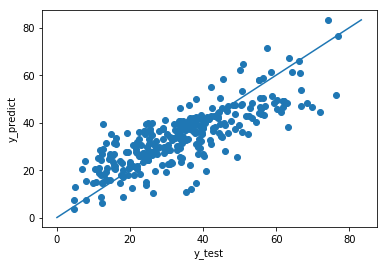

In [525]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [526]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_Lasso=Polynomial_Regression_Metrics1_degree3_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_Lasso

Model performance range with 95 percentage confidence level is : 62.294%  (26.305%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & lasso,9.136761,0.640753,0.638231


In [527]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree3_Lasso])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 62.294%  (26.305%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976
0,Polynomial Regression - degree 3,8.885826,0.660215,0.657830
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,Polynomial Regression - degree 3 & lasso,9.136761,0.640753,0.638231


In [528]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Eventhough there is no much difference in performance metrics between polynomial Regression with degree - 3, ridge and lasso
# The accuracy metrics for 95% confidence level improved in Lasso Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        :  38.343%  (153.589%)
# With Ridge Regression     :  67.836%  (27.566%)
# With Lasso Regression     :  62.294%  (26.305%)
# --------------------------------------------------------------------------
# Lasso didn't converge at degree=3

In [529]:
# Observation by comparing Model of Linear regression, Polynomial Regression - Degree 2 & Polynomial Regression - Degree 3
# ------------------------------------------------------------------------------------------------------------------------
# Polynomial regression -degree 3 ridge model is has better performance than Linear Regression and Polynomial Regression - degree 2
# The model performance may expected decreases as the degree increases further...

## Using Polynomial Regression (degree=4)

In [530]:
poly=PolynomialFeatures(degree=4, interaction_only=True) #Considering Polynomial degree as 4
X_train_4 = poly.fit_transform(X_train)
X_test_4 = poly.fit_transform(X_test)

In [531]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR4_model=linear_model.LinearRegression()
results=cross_val_score(PR4_model,X_train_4, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-37.70942791   0.62623837   0.5288558    0.53912673   0.76906853
   0.71935767   0.74024447   0.79028303   0.3521362    0.7123667 ]


In [532]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : -319.318%
 Standard Deviation : 1150.614%


In [533]:
PR4_model.fit(X_train_4,y_train)
y_pred = PR4_model.predict(X_test_4)

In [534]:
print("The accuracy score for training set is %12.16f" %PR4_model.score(X_train_4,y_train))
print("The accuracy score for testing set is %12.16f" %PR4_model.score(X_test_4,y_test))

The accuracy score for training set is 0.8010278601497347
The accuracy score for testing set is 0.6739784893279752


In [535]:
# r square value for testing
r_square_for_testing=PR4_model.score(X_test_4,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6739784893279752
The adjusted R Square value for testing set is 0.6716894717003883
The RMSE value for testing set is 8.7040024220040362


In [536]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : -319.318%  (2255.204%)


In [537]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree4 = pd.DataFrame({'Model':['Polynomial Regression - degree 4'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree4=Polynomial_Regression_Metrics1_degree4[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 4,8.704002,0.673978,0.671689


In [538]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Polynomial_Regression_Metrics1_degree4])
Comparison_Table3

Model performance range with 95 percentage confidence level is : -319.318%  (2255.204%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 2,8.672770,0.676314,0.674041
0,Polynomial Regression - degree 2 & ridge,8.929203,0.656890,0.654481
0,Polynomial Regression - degree 2 & lasso,9.450293,0.615675,0.612976
0,Polynomial Regression - degree 3,8.885826,0.660215,0.657830
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,Polynomial Regression - degree 3 & lasso,9.136761,0.640753,0.638231
0,Polynomial Regression - degree 4,8.704002,0.673978,0.671689


In [539]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# As expected the performance is very poor at degree=4
# So if the degree is further more increased the model will become over fit.
#---------------------------------------------------------------------------

In [540]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table3=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268


## Support Vector Regressor

In [541]:
#Spliting into training and test test first to avoid data leak
train,test=train_test_split(concrete_Iter2_backup1,test_size=0.30, random_state=1)
print(train.shape)
print(test.shape)

(641, 9)
(275, 9)


In [542]:
X_train=train.drop('strength',axis=1) # Independent Attribute for training data
X_test=test.drop('strength',axis=1) # Independent Attribute for testing data
y_train=train.pop('strength') # Dependent Attribute for training data
y_test=test.pop('strength') # Dependent Attribute for testin data
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(641, 8)
(275, 8)
(641,)
(275,)


In [543]:
X_train_scale = preprocessing.scale(X_train)
X_test_scale = preprocessing.scale(X_test)
y_train_scale = preprocessing.scale(y_train)
y_test_scale = preprocessing.scale(y_test)

In [544]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [545]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)
gs.fit(X_train_scale,y_train_scale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [546]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8986260198343836
Standard deviation for the best model 0.023295662091248177


In [547]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.863%
 Standard Deviation : 2.32957%


In [548]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train_scale,y_train_scale)
y_pred = SVR_optimised_model.predict(X_test_scale)

In [549]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train_scale,y_train_scale))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test_scale,y_test_scale))

The accuracy score for training set is 0.9565203998646997
The accuracy score for testing set is 0.8274389945454171


In [550]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test_scale,y_test_scale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_scale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8274389945454171
The adjusted R Square value for testing set is 0.8262274328220650
The RMSE value for testing set is 0.4154046285907066


Text(0, 0.5, 'y_predict')

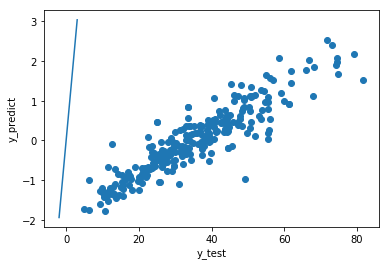

In [551]:
fig, ax = plt.subplots()
ax.scatter(y_test_scale, y_pred)
ax.plot([min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))], [min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [552]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 89.863%  (4.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.415405,0.827439,0.826227


In [553]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,SVR_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 89.863%  (4.566%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227


In [554]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# RMSE Value is observed to be too low.
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

In [555]:
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227


## KNN Regressor

In [556]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [557]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [558]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)
gs.fit(X_train_stdscale,y_train_stdscale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [559]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 4}
The model which produce best score is 0.7756549728643638
Standard deviation for the best model 0.04955574599215488


In [560]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 77.565%
 Standard Deviation : 4.95557%


In [561]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [562]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.8842160063483796
The accuracy score for testing set is 0.6644867234534153


In [563]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6644867234534153
The adjusted R Square value for testing set is 0.6621310635378425
The RMSE value for testing set is 0.5792350788294721


Text(0, 0.5, 'y_predict')

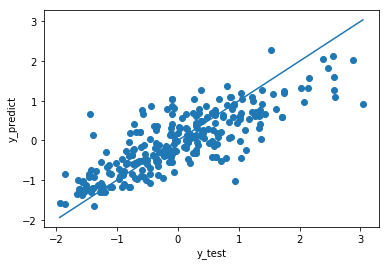

In [564]:
fig, ax = plt.subplots()
ax.scatter(y_test_stdscale, y_pred)
ax.plot([min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))], [min(min(y_test_stdscale),min(y_pred)), max(max(y_test_stdscale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [565]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 77.565%  (9.713%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.579235,0.664487,0.662131


In [566]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,KNN_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 77.565%  (9.713%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131


In [567]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is very poor.
# RMSE value of KNN and SVR is observed to be too low. since RMSE is calculated based on the scaled data
# So RMSE Cannot be used as a better one to observe the performance
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
#                    weights='uniform'

## Decision Tree Regressor

In [568]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [569]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [570]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.8076255730951611
Standard deviation for the best model 0.05379595126767984


In [571]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 80.763%
 Standard Deviation : 5.37960%


In [572]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [573]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9974470343452673
The accuracy score for testing set is 0.7582299713488746


In [574]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7582299713488746
The adjusted R Square value for testing set is 0.7565324887003713
The RMSE value for testing set is 7.5906785961222534


Text(0, 0.5, 'y_predict')

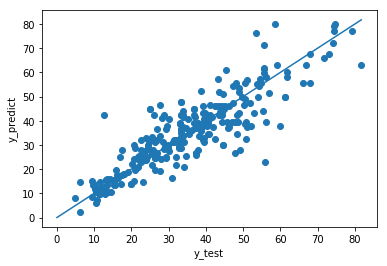

In [575]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [576]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 80.763%  (10.544%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,7.590679,0.75823,0.756532


In [577]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,DecisionTree_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 80.763%  (10.544%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532


In [578]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='mse', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [579]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [580]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [581]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 50}
The model which produce best score is 0.8906111295854617
Standard deviation for the best model 0.037863246833193136


In [582]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.061%
 Standard Deviation : 3.78632%


In [583]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [584]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9717118194029422
The accuracy score for testing set is 0.8453170345258473


In [585]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8453170345258473
The adjusted R Square value for testing set is 0.8442309956509033
The RMSE value for testing set is 6.0715645516890584


Text(0, 0.5, 'y_predict')

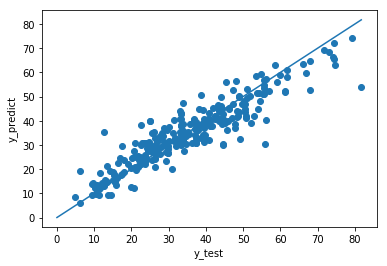

In [586]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [587]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 89.061%  (7.421%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,6.071565,0.845317,0.844231


In [588]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Bagging_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 89.061%  (7.421%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231


In [589]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=50,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [590]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [591]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [592]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 1.0, 'n_estimators': 150}
The model which produce best score is 0.7962232377478757
Standard deviation for the best model 0.04097652121114378


In [593]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 79.622%
 Standard Deviation : 4.09765%


In [594]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [595]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8421930160002133
The accuracy score for testing set is 0.7444389066495328


In [596]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7444389066495328
The adjusted R Square value for testing set is 0.7426445960643240
The RMSE value for testing set is 7.8041703513795921


Text(0, 0.5, 'y_predict')

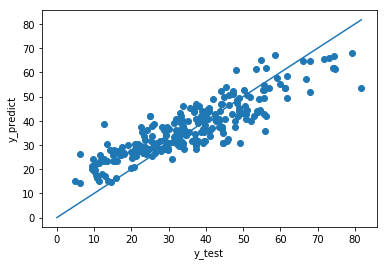

In [597]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [598]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 79.622%  (8.031%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,7.80417,0.744439,0.742645


In [599]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Adaboost_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 79.622%  (8.031%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231
0,Adaboost,7.804170,0.744439,0.742645


In [600]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
#                  n_estimators=150, random_state=1)

## Gradient Boosting Regressor

In [601]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [602]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [603]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'friedman_mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.9101192781999748
Standard deviation for the best model 0.03141902685099813


In [604]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 91.012%
 Standard Deviation : 3.14190%


In [605]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [606]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9767963737834877
The accuracy score for testing set is 0.8822469237586450


In [607]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8822469237586450
The adjusted R Square value for testing set is 0.8814201719695883
The RMSE value for testing set is 5.2974333683205819


Text(0, 0.5, 'y_predict')

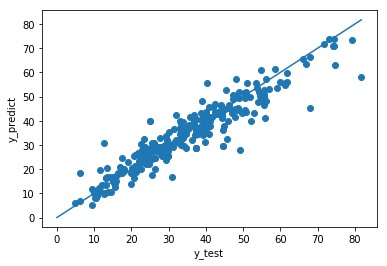

In [608]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [609]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 91.012%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,5.297433,0.882247,0.88142


In [610]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,Gradientboost_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 91.012%  (6.158%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231
0,Adaboost,7.804170,0.744439,0.742645
0,Gradientboost,5.297433,0.882247,0.881420


In [611]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=3,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [612]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [613]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [614]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8901852497785943
Standard deviation for the best model 0.040779427833423726


In [615]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 89.019%
 Standard Deviation : 4.07794%


In [616]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [617]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9767523808677457
The accuracy score for testing set is 0.8523297001280948


In [618]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8523297001280948
The adjusted R Square value for testing set is 0.8512928976214716
The RMSE value for testing set is 5.9323388607660714


Text(0, 0.5, 'y_predict')

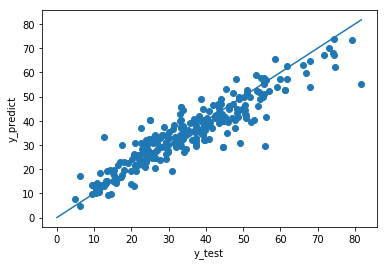

In [619]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [620]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 89.019%  (7.993%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,5.932339,0.85233,0.851293


In [621]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table3=pd.concat([Comparison_Table3,RandomForest_Metrics1])
Comparison_Table3

Model performance range with 95 percentage confidence level is : 89.019%  (7.993%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231
0,Adaboost,7.804170,0.744439,0.742645
0,Gradientboost,5.297433,0.882247,0.881420
0,Random Forest,5.932339,0.852330,0.851293


In [622]:
# Inference from the accuracy metrics:
# ------------------------------------
# Random Forest Regressor has poorer Performance than Gradient Boosting Regressor
# The optimised model of Random Forest RegressorGradient Boosting Regressor is
# RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=2,
#                      min_weight_fraction_leaf=0.0, n_estimators=200,
#                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
#                      warm_start=False)

In [623]:
# Summary of Iteration 3:
# -------------------------
# Duplicate Data were removed 
# Outliers were not treated
# Gradient Boost regressor has the best performance with 88.22 Score in training dataset
# The model has the performance range  91.012%  (6.158%) with 95% confidence level

In [624]:
# Comparing Iteration 1 and 3:
# -------------------------------------------------------
# Iteration 1: Removing Duplicate data
#              Outliers not treated
#              Without feature engineering
# Iteration 3: Removing Duplicate data
#              Outliers not treated
#              With feature engineering
# ---------------------------------------------------------
# The performance at Iteration 1 is better than Iteration 3


In [625]:
Comparison_Table1

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573
0,Adaboost,7.359663,0.766910,0.765038
0,Gradientboost,4.475665,0.913797,0.913104
0,Random Forest,5.123526,0.887034,0.886127


In [626]:
Comparison_Table2

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953
0,Adaboost,7.804170,0.744439,0.742185
0,Gradientboost,5.297433,0.882247,0.881208
0,Random Forest,5.932339,0.852330,0.851027


In [627]:
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231
0,Adaboost,7.804170,0.744439,0.742645
0,Gradientboost,5.297433,0.882247,0.881420
0,Random Forest,5.932339,0.852330,0.851293


# Iteration 4

1. Removing duplicate data
2. Outliers were observed and removed
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)

In [628]:
# Removing Duplicate Data
concrete_Iter4=concrete_df.copy(deep=True)
concrete_Iter4.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter4.shape

(1005, 9)

In [629]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)

In [630]:
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter4['cement/cement']=concrete_Iter4['cement']/concrete_Iter4['cement']
concrete_Iter4['slag/cement']=concrete_Iter4['slag']/concrete_Iter4['cement']
concrete_Iter4['ash/cement']=concrete_Iter4['ash']/concrete_Iter4['cement']
concrete_Iter4['water/cement']=concrete_Iter4['water']/concrete_Iter4['cement']
concrete_Iter4['superplastic/cement']=concrete_Iter4['superplastic']/concrete_Iter4['cement']
concrete_Iter4['coarseagg/cement']=concrete_Iter4['coarseagg']/concrete_Iter4['cement']
concrete_Iter4['fineagg/cement']=concrete_Iter4['fineagg']/concrete_Iter4['cement']
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter4.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)
# Rearranging the columns
concrete_Iter4 = concrete_Iter4[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter4.drop(['cement/cement'], axis=1, inplace=True)
concrete_Iter4.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


In [631]:
concrete_Iter4.shape

(1005, 8)

(array([1, 2, 3, 4, 5, 6, 7, 8]), <a list of 8 Text xticklabel objects>)

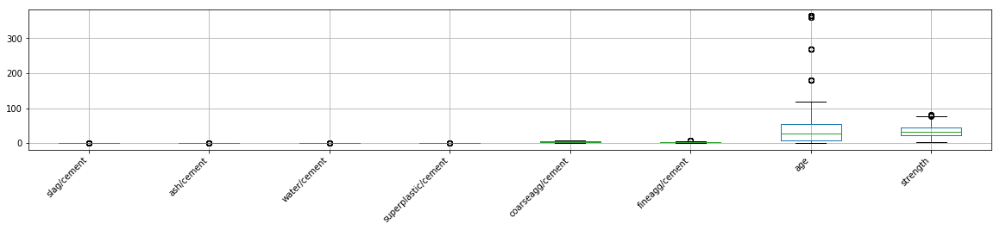

In [632]:
# Observing the outliers using box plot
concrete_Iter4.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [633]:
# Inference from the box plot:
# --------------------------------------------------------------------------------------------------------
# Outliers were observed in the attributes 'slag', 'ash', 'water', 'superplastic', 'fineagg', 'age' and 'strength'
# --------------------------------------------------------------------------------------------------------
# Oultliers will be observed and removed from the above attributes (as per domain expert suggestion)
# Replacing the extreme values with mean or mean+2*std may lead to poor performance
# Since the concrete strength depends on the ratios of cement:fineagg:courseagg:water

In [634]:
concrete_Iter4_copy=concrete_Iter4.copy(deep=True)

In [635]:
# Observing the Outliers of 'slag/cement' and replacing with nan
median_slag=concrete_Iter4['slag/cement'].median() # Median of 'slag/cement' attribute
std_slag=2.5*(concrete_Iter4['slag/cement'].std()) # Calculating 2.5*std deviation of 'slag/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['slag/cement']-median_slag).abs()>std_slag, 'slag/cement'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

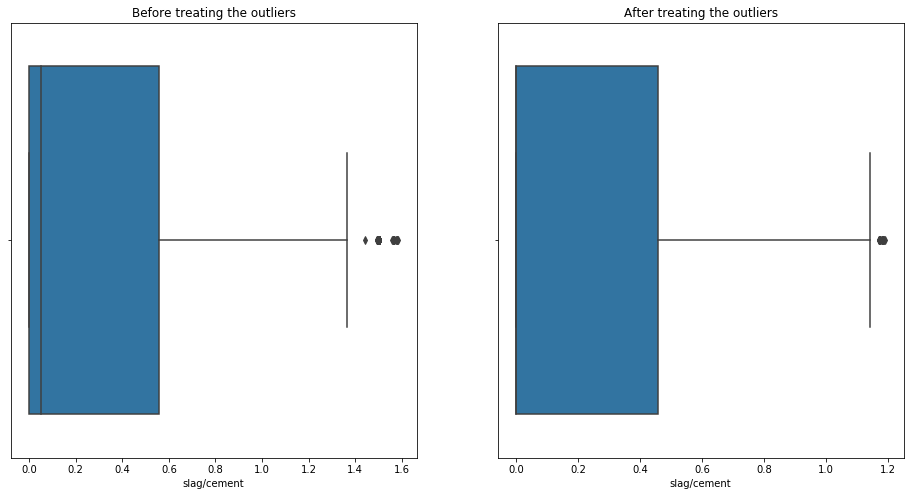

In [636]:
# Boxplot for 'slag/cement' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['slag/cement'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['slag/cement'])
plt.title('After treating the outliers')

In [637]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement              0
water/cement            0
superplastic/cement     0
coarseagg/cement        0
fineagg/cement          0
age                     0
strength                0
dtype: int64

In [638]:
# Observing the Outliers of 'ash/cement' and replacing with nan
median_ash=concrete_Iter4['ash/cement'].median() # Median of 'ash/cement' attribute
std_ash=2.5*(concrete_Iter4['ash/cement'].std()) # Calculating 2.5*std deviation of 'ash/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['ash/cement']-median_ash).abs()>std_ash, 'ash/cement'] = np.nan # Locating the row containing outliers and replacing with nan

Text(0.5, 1.0, 'After treating the outliers')

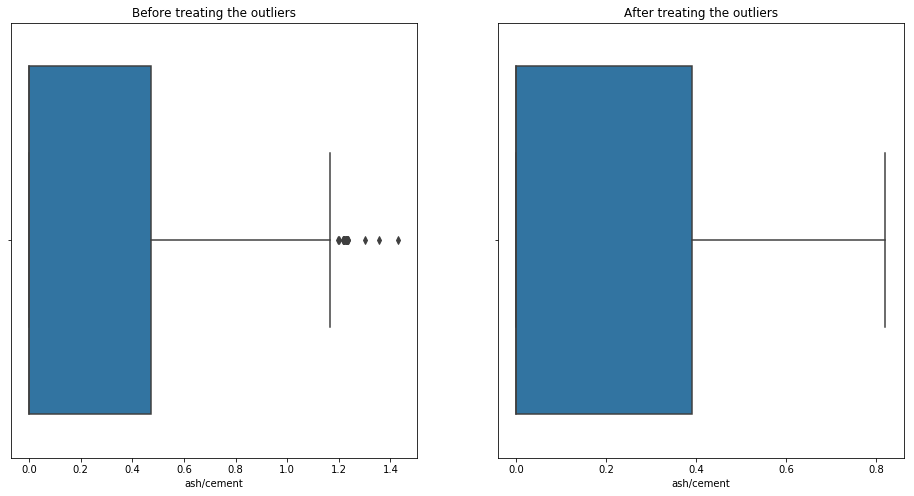

In [639]:
# Boxplot for 'ash/cement' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['ash/cement'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['ash/cement'])
plt.title('After treating the outliers')

In [640]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement             97
water/cement            0
superplastic/cement     0
coarseagg/cement        0
fineagg/cement          0
age                     0
strength                0
dtype: int64

In [641]:
# Observing the Outliers of 'water/cement' and replacing with nan
median_water=concrete_Iter4['water/cement'].median() # Median of 'water/cement' attribute
std_water=2.5*(concrete_Iter4['water/cement'].std()) # Calculating 2.5*std deviation of 'water/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['water/cement']-median_water).abs()>std_water, 'water/cement'] = np.nan # Locating the row containing outliers and replacing with

Text(0.5, 1.0, 'After treating the outliers')

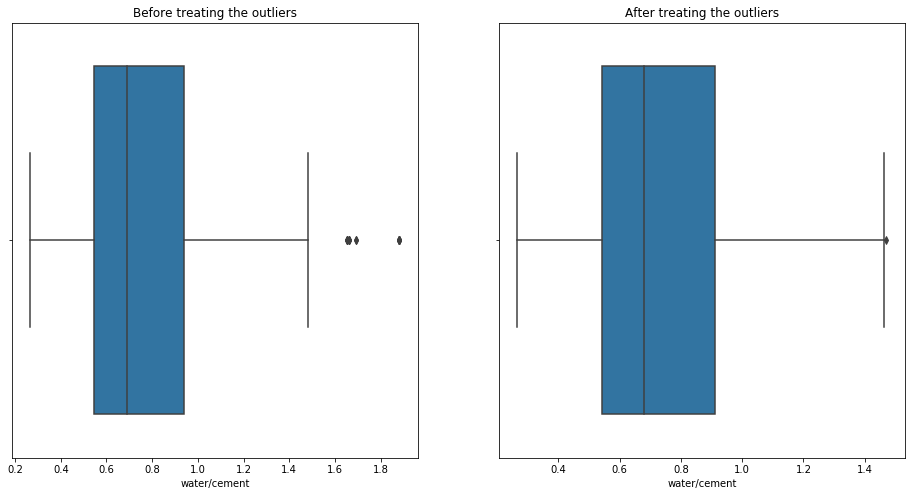

In [642]:
# Boxplot for 'fineagg' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['water/cement'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['water/cement'])
plt.title('After treating the outliers')

In [643]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement             97
water/cement           20
superplastic/cement     0
coarseagg/cement        0
fineagg/cement          0
age                     0
strength                0
dtype: int64

In [644]:
# Observing the Outliers of 'superplastic/cement' and replacing with nan
median_sp=concrete_Iter4['superplastic/cement'].median() # Median of 'superplastic/cement' attribute
std_sp=2.5*(concrete_Iter4['superplastic/cement'].std()) # Calculating 2.5*std deviation of 'superplastic/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['superplastic/cement']-median_sp).abs()>std_sp, 'superplastic/cement'] = np.nan # Locating the row containing outliers and replacing 

Text(0.5, 1.0, 'After treating the outliers')

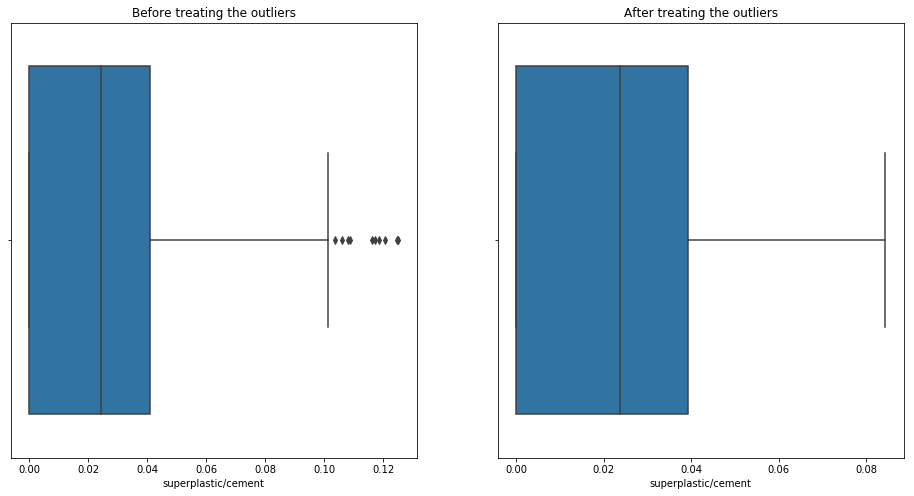

In [645]:
# Boxplot for 'fineagg' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['superplastic/cement'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['superplastic/cement'])
plt.title('After treating the outliers')

In [646]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement             97
water/cement           20
superplastic/cement    15
coarseagg/cement        0
fineagg/cement          0
age                     0
strength                0
dtype: int64

In [647]:
# Observing the Outliers of 'fineagg/cement' and replacing with nan
median_fa=concrete_Iter4['fineagg/cement'].median() # Median of 'water/cement' attribute
std_fa=2.5*(concrete_Iter4['fineagg/cement'].std()) # Calculating 2.5*std deviation of 'fineagg/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['fineagg/cement']-median_fa).abs()>std_fa, 'fineagg/cement'] = np.nan # Locating the row containing outliers and replacing 

Text(0.5, 1.0, 'After treating the outliers')

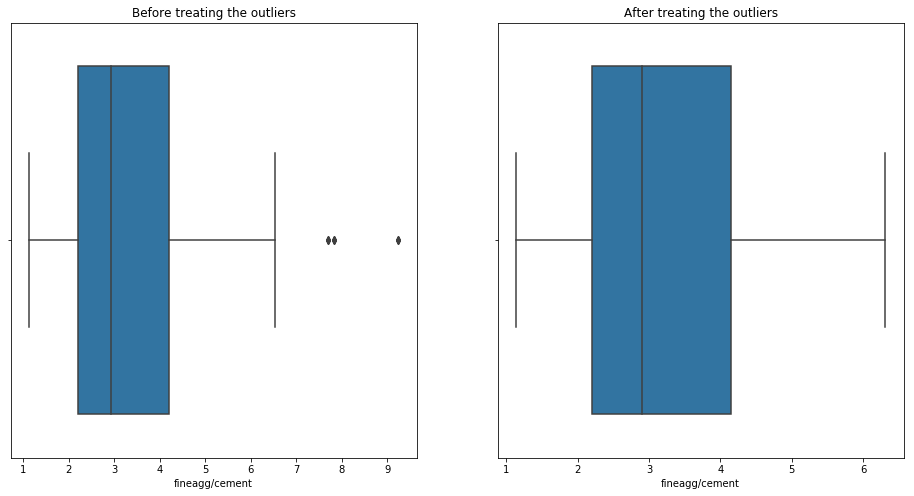

In [648]:
# Boxplot for 'fineagg' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['fineagg/cement'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['fineagg/cement'])
plt.title('After treating the outliers')

In [649]:
# Observing the Outliers of 'age' and replacing with nan
median_age=concrete_Iter4['age'].median() # Median of 'water/cement' attribute
std_age=2.5*(concrete_Iter4['age'].std()) # Calculating 2.5*std deviation of 'fineagg/cement' attribute
concrete_Iter4.loc[(concrete_Iter4['age']-median_age).abs()>std_age, 'age'] = np.nan # Locating the row containing outliers and replacing 

Text(0.5, 1.0, 'After treating the outliers')

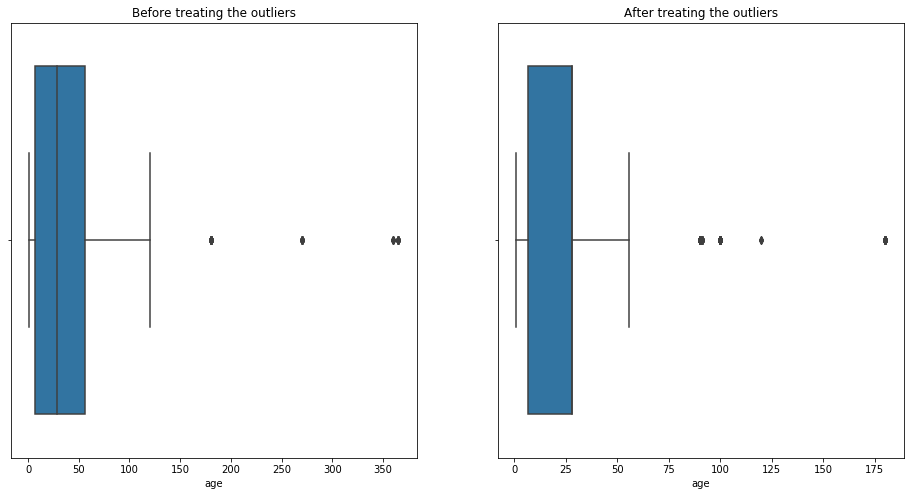

In [650]:
# Boxplot for 'age' before and after treating the outliers
f, axes = plt.subplots(1, 2,figsize=(16, 8), sharex=True)
subplot(1,2,1)
sns.boxplot(concrete_Iter4_copy['age'])
plt.title('Before treating the outliers')
subplot(1,2,2)
sns.boxplot(concrete_Iter4['age'])
plt.title('After treating the outliers')

In [651]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement             97
water/cement           20
superplastic/cement    15
coarseagg/cement        0
fineagg/cement         16
age                    33
strength                0
dtype: int64

In [652]:
# Outliers of  the attribute 'strength' is kept as it is, since it is a target variable.

In [653]:
concrete_Iter4.isnull().sum()

slag/cement            83
ash/cement             97
water/cement           20
superplastic/cement    15
coarseagg/cement        0
fineagg/cement         16
age                    33
strength                0
dtype: int64

In [654]:
concrete_Iter4=concrete_Iter4.dropna(axis=0) # Removing the row containing Nan
concrete_Iter4.isnull().sum()

slag/cement            0
ash/cement             0
water/cement           0
superplastic/cement    0
coarseagg/cement       0
fineagg/cement         0
age                    0
strength               0
dtype: int64

In [655]:
concrete_Iter4_backup1=concrete_Iter4.copy(deep=True)
concrete_Iter4_backup2=concrete_Iter4.copy(deep=True)

In [656]:
concrete_Iter4_backup1.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14.0,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28.0,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28.0,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28.0,18.29
5,0.000000,0.000000,0.752941,0.000000,3.489412,3.705882,90.0,21.86


(array([1, 2, 3, 4, 5, 6, 7, 8]), <a list of 8 Text xticklabel objects>)

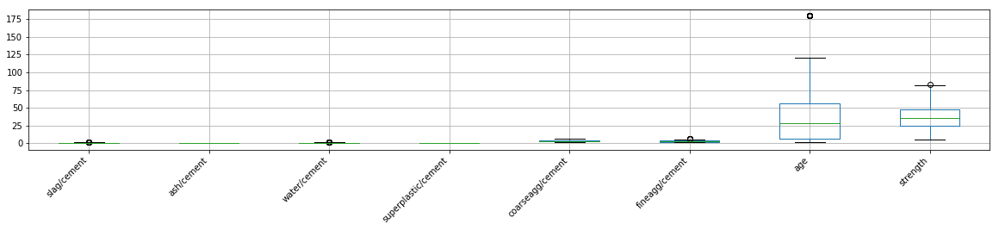

In [657]:
# Observing using box plot after treating the outliers
concrete_Iter4.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [658]:
# Inference from the box plot:
# ---------------------------
# Outliers were removed and new outliers were observed

In [659]:
concrete_Iter4.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14.0,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28.0,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28.0,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28.0,18.29
5,0.000000,0.000000,0.752941,0.000000,3.489412,3.705882,90.0,21.86


In [660]:
concrete_Iter4.shape

(797, 8)

In [661]:
X=concrete_Iter4.drop('strength',axis=1) # Independent Attribute
y=concrete_Iter4.pop('strength') # Dependent Attribute

In [662]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [663]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.61093026 0.50478945 0.60419189 0.72489998 0.7439498  0.72343451
 0.69908691 0.66826876 0.71694299 0.56522255]


In [664]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 65.617%
 Standard Deviation : 7.653%


In [665]:
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

In [666]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.6739992630299807
The accuracy score for testing set is 0.6779338569102948


In [667]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6779338569102948
The adjusted R Square value for testing set is 0.6750764893543659
The RMSE value for testing set is 8.8873455184510366


Text(0, 0.5, 'y_predict')

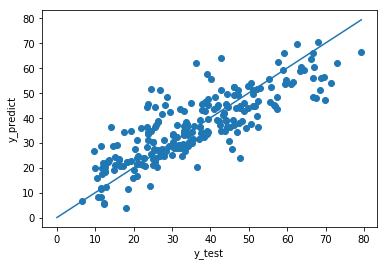

In [668]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')


In [669]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 65.617%  (15.000%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076


## Using Polynomial Regression (degree=2)

In [670]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [671]:
print(X_train.shape)
print(X_train_2.shape)

(557, 7)
(557, 29)


In [672]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 7 to 29

In [673]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-1.3607633   0.54471368 -0.02151471  0.43096555 -4.9676182   0.35204325
  0.72924064  0.7279256   0.82627497 -0.34343572]


In [674]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : -30.822%
 Standard Deviation : 167.476%


In [675]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [676]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.4426479293468473
The accuracy score for testing set is 0.4289072402133440


In [677]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.4289072402133440
The adjusted R Square value for testing set is 0.4238405110390645
The RMSE value for testing set is 11.8345801631872796


Text(0, 0.5, 'y_predict')

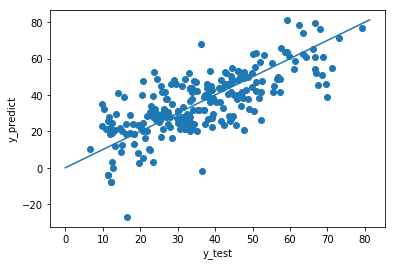

In [678]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [679]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : -30.822%  (328.252%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,11.83458,0.428907,0.423841


In [680]:
Comparison_Table4=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2,11.834580,0.428907,0.423841


In [681]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs poorer than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [682]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.67590752 0.59139684 0.64484254 0.71154893 0.81430447 0.71859981
 0.73082263 0.702363   0.81917285 0.65541081]


In [683]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 70.644%  (13.249%)


In [684]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [  0.          23.30466662  19.87920618 -40.27448647   7.63632157
  -4.61260605  -8.7436482    0.32825043  -5.17315957   7.19305271
  -1.52265229  -4.52184576   2.09047223   0.34388439   1.92530684
  -3.85390957  -5.88637638   4.59395957   0.30954597   1.1043294
   2.78813943  -2.43468358  -0.52584248   9.78520657   1.76031715
   0.99255183   1.28218943  -0.06840793   0.1284575 ]


In [685]:
y_pred = ridge.predict(X_test_2)

In [686]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.7380901273873699
The accuracy score for testing set is 0.7027323777546644


In [687]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7027323777546644
The adjusted R Square value for testing set is 0.7000950224242242
The RMSE value for testing set is 8.5383378118121165


Text(0, 0.5, 'y_predict')

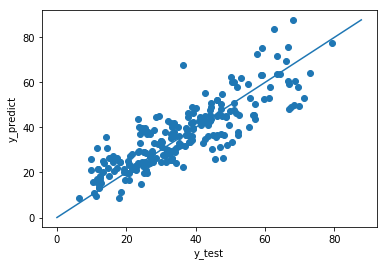

In [688]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [689]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095


In [690]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 70.644%  (13.249%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2,11.834580,0.428907,0.423841
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [691]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3,max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.6356197  0.61733119 0.59819609 0.64890549 0.76349501 0.69416185
 0.70167806 0.6482048  0.76724773 0.65575547]


In [692]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 67.306%  (10.722%)


In [693]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))

Lasso model: [ 0.          0.          0.         -0.          0.         -0.59730057
 -2.8733703   0.39295257 -0.          0.          0.          1.50751712
  2.12654909  0.44261386  0.          0.          1.93698141  0.
  0.34855873  0.         -5.22301756 -0.         -0.76895864  0.
  0.          1.53903898 -0.         -0.04542181  0.1218415 ]


In [694]:
y_pred = lasso.predict(X_test_2)

In [695]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.6958621932264017
The accuracy score for testing set is 0.6636097883583348


In [696]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6636097883583348
The adjusted R Square value for testing set is 0.6606253378114506
The RMSE value for testing set is 9.0828303750164530


Text(0, 0.5, 'y_predict')

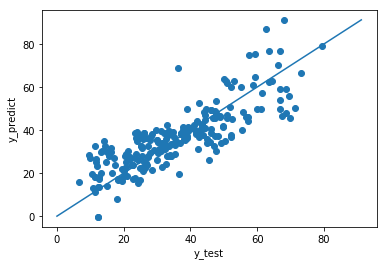

In [697]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [698]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 67.306%  (10.722%)


In [699]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,9.08283,0.66361,0.660625


In [700]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 67.306%  (10.722%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2,11.834580,0.428907,0.423841
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625


In [701]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 very poorly than linear regression 
# The accuracy metrics for 95% confidence level improved in ridge Regression 
#---------------------------------------------------------------------------
# 95% confidence accuracy score
#----------------------------------------------------------------------------
# Before using Ridge        :  -30.822%  (328.252%)
# With Ridge Regression     :  70.644%  (13.249%)
# With Lasso Regression     :  67.306%  (10.722%)
# --------------------------------------------------------------------------

In [702]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table4=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2_ridge, Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625


## Support Vector Regressor

In [703]:
#Spliting into training and test test first to avoid data leak
train,test=train_test_split(concrete_Iter4_backup1,test_size=0.30, random_state=1)
print(train.shape)
print(test.shape)

(557, 8)
(240, 8)


In [704]:
X_train=train.drop('strength',axis=1) # Independent Attribute for training data
X_test=test.drop('strength',axis=1) # Independent Attribute for testing data
y_train=train.pop('strength') # Dependent Attribute for training data
y_test=test.pop('strength') # Dependent Attribute for testin data
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(557, 7)
(240, 7)
(557,)
(240,)


In [705]:
X_train_scale = preprocessing.scale(X_train)
X_test_scale = preprocessing.scale(X_test)
y_train_scale = preprocessing.scale(y_train)
y_test_scale = preprocessing.scale(y_test)

In [706]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [707]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)
gs.fit(X_train_scale,y_train_scale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [708]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8430086081508841
Standard deviation for the best model 0.057480200543983576


In [709]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 84.301%
 Standard Deviation : 5.74802%


In [710]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train_scale,y_train_scale)
y_pred = SVR_optimised_model.predict(X_test_scale)

In [711]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train_scale,y_train_scale))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test_scale,y_test_scale))

The accuracy score for training set is 0.8993624543655909
The accuracy score for testing set is 0.8567663311122174


In [712]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test_scale,y_test_scale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_scale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8567663311122174
The adjusted R Square value for testing set is 0.8554955634541509
The RMSE value for testing set is 0.3784622423542175


Text(0, 0.5, 'y_predict')

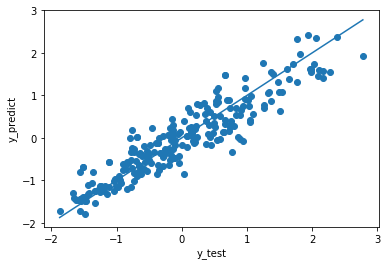

In [713]:
fig, ax = plt.subplots()
ax.scatter(y_test_scale, y_pred)
ax.plot([min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))], [min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [714]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 84.301%  (11.266%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.378462,0.856766,0.855496


In [715]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,SVR_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 84.301%  (11.266%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496


In [716]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# RMSE Value is observed to be too low.
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

## KNN Regressor

In [717]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [718]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [719]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)
gs.fit(X_train_stdscale,y_train_stdscale)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [720]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.7483143364887964
Standard deviation for the best model 0.08993465169195781


In [721]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 74.831%
 Standard Deviation : 8.99347%


In [722]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [723]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.8834485743015784
The accuracy score for testing set is 0.7937326353466942


In [724]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7937326353466942
The adjusted R Square value for testing set is 0.7919026333789210
The RMSE value for testing set is 0.4541666705663305


Text(0, 0.5, 'y_predict')

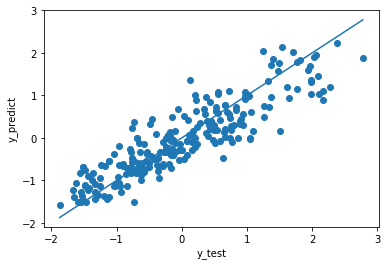

In [725]:
fig, ax = plt.subplots()
ax.scatter(y_test_stdscale, y_pred)
ax.plot([min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))], [min(min(y_test_scale),min(y_pred)), max(max(y_test_scale),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [726]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 74.831%  (17.627%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.454167,0.793733,0.791903


In [727]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,KNN_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 74.831%  (17.627%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903


In [728]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is very poor.
# RMSE value of KNN and SVR is observed to be too low. since RMSE is calculated based on the scaled data
# So RMSE Cannot be used as a better one to observe the performance
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
#                    weights='uniform')

## Decision Tree Regressor

In [729]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [730]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [731]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.7689521804214005
Standard deviation for the best model 0.11174669018644269


In [732]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 76.895%
 Standard Deviation : 11.17467%


In [733]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [734]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9929858440141642
The accuracy score for testing set is 0.8071080296287703


In [735]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8071080296287703
The adjusted R Square value for testing set is 0.8053966940234488
The RMSE value for testing set is 6.8779118162395481


Text(0, 0.5, 'y_predict')

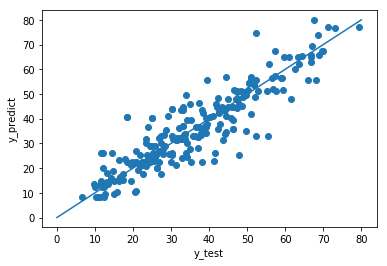

In [736]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [737]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 76.895%  (21.902%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,6.877912,0.807108,0.805397


In [738]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,DecisionTree_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 76.895%  (21.902%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397


In [739]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='mse', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [740]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [741]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [742]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 100}
The model which produce best score is 0.8667738554761377
Standard deviation for the best model 0.04921000994587556


In [743]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 86.677%
 Standard Deviation : 4.92100%


In [744]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [745]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9678785767467483
The accuracy score for testing set is 0.8781172310468336


In [746]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8781172310468336
The adjusted R Square value for testing set is 0.8770358883565014
The RMSE value for testing set is 5.4672720477543937


Text(0, 0.5, 'y_predict')

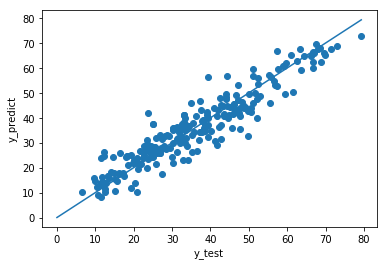

In [747]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [748]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 86.677%  (9.645%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,5.467272,0.878117,0.877036


In [749]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,Bagging_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 86.677%  (9.645%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397
0,Bagging,5.467272,0.878117,0.877036


In [750]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=100,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [751]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [752]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [753]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 0.8, 'n_estimators': 100}
The model which produce best score is 0.7760919896241321
Standard deviation for the best model 0.04295395728413682


In [754]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 77.609%
 Standard Deviation : 4.29540%


In [755]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [756]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8233667881232450
The accuracy score for testing set is 0.7678506871242818


In [757]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7678506871242818
The adjusted R Square value for testing set is 0.7657910607743071
The RMSE value for testing set is 7.5454167165652972


Text(0, 0.5, 'y_predict')

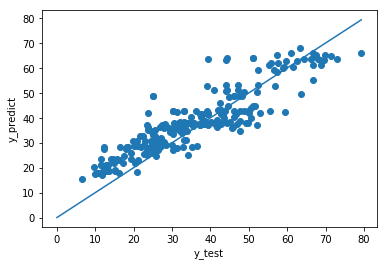

In [758]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [759]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 77.609%  (8.419%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,7.545417,0.767851,0.765791


In [760]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,Adaboost_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 77.609%  (8.419%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397
0,Bagging,5.467272,0.878117,0.877036
0,Adaboost,7.545417,0.767851,0.765791


In [761]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
#                  n_estimators=150, random_state=1)

## Gradient Boosting Regressor

In [762]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [763]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [764]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'friedman_mse', 'max_depth': 5, 'n_estimators': 200}
The model which produce best score is 0.8757881833301486
Standard deviation for the best model 0.044941333664498935


In [765]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 87.579%
 Standard Deviation : 4.49413%


In [766]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [767]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9925537625519965
The accuracy score for testing set is 0.9058706110757486


In [768]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.9058706110757486
The adjusted R Square value for testing set is 0.9050354960916298
The RMSE value for testing set is 4.8046543341750372


Text(0, 0.5, 'y_predict')

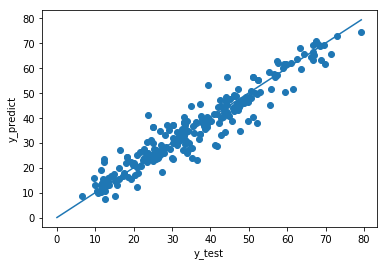

In [769]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [770]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 87.579%  (8.809%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,4.804654,0.905871,0.905035


In [771]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,Gradientboost_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 87.579%  (8.809%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397
0,Bagging,5.467272,0.878117,0.877036
0,Adaboost,7.545417,0.767851,0.765791
0,Gradientboost,4.804654,0.905871,0.905035


In [772]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=3,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [773]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [774]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [775]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8690398144668791
Standard deviation for the best model 0.049627875276008045


In [776]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 86.904%
 Standard Deviation : 4.96279%


In [777]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [778]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9735798685796745
The accuracy score for testing set is 0.8747134150944026


In [779]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8747134150944026
The adjusted R Square value for testing set is 0.8736018737834530
The RMSE value for testing set is 5.5430885221314803


Text(0, 0.5, 'y_predict')

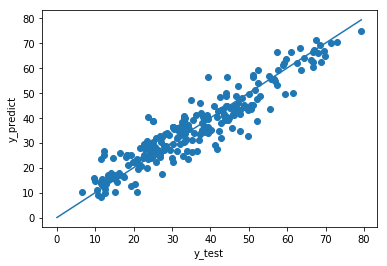

In [780]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([0, max(max(y_test),max(y_pred))], [0, max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [781]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 86.904%  (9.727%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,5.543089,0.874713,0.873602


In [782]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table4=pd.concat([Comparison_Table4,RandomForest_Metrics1])
Comparison_Table4

Model performance range with 95 percentage confidence level is : 86.904%  (9.727%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397
0,Bagging,5.467272,0.878117,0.877036
0,Adaboost,7.545417,0.767851,0.765791
0,Gradientboost,4.804654,0.905871,0.905035
0,Random Forest,5.543089,0.874713,0.873602


In [783]:
# Summary of Iteration 4:
# -------------------------
# Duplicate Data were removed 
# Feature Engineering were done
# Outliers were observed and removed
# Gradient Boost regressor has the best performance with 90.58 Score in training dataset
# The model has the performance range of  87.579%  (8.809%) with 95% confidence level

In [565]:
# Comparing Iteration 2 and 4:
# -------------------------------------------------------
# Iteration 2: Removing Duplicate data
#              Outliers were observed and removed
#              Without feature engineering
#              
# Iteration 4: Removing Duplicate data
#              Outliers were observed and removed
#              With feature engineering
#              i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)
# ---------------------------------------------------------
# The performance at Iteration 4 is better than Iteration 2

# Iteration 5

1. Removing duplicate data
2. Outliers are not treated
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
4. Observing linear relationship between the independent attributes such as 'coarseagg/cement', 'fineagg/cement' and 'water/cement'. Hence applying pca with these 3 independent attributes and redoing the analysis.

In [785]:
# Removing Duplicate Data
concrete_Iter5=concrete_df.copy(deep=True)
concrete_Iter5.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter5 = concrete_Iter5.reset_index()
concrete_Iter5.head()

,index,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [786]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)

In [787]:
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter5['cement/cement']=concrete_Iter5['cement']/concrete_Iter5['cement']
concrete_Iter5['slag/cement']=concrete_Iter5['slag']/concrete_Iter5['cement']
concrete_Iter5['ash/cement']=concrete_Iter5['ash']/concrete_Iter5['cement']
concrete_Iter5['water/cement']=concrete_Iter5['water']/concrete_Iter5['cement']
concrete_Iter5['superplastic/cement']=concrete_Iter5['superplastic']/concrete_Iter5['cement']
concrete_Iter5['coarseagg/cement']=concrete_Iter5['coarseagg']/concrete_Iter5['cement']
concrete_Iter5['fineagg/cement']=concrete_Iter5['fineagg']/concrete_Iter5['cement']
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter5.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)
# Rearranging the columns
concrete_Iter5 = concrete_Iter5[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter5.drop(['cement/cement'], axis=1, inplace=True)
concrete_Iter5.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


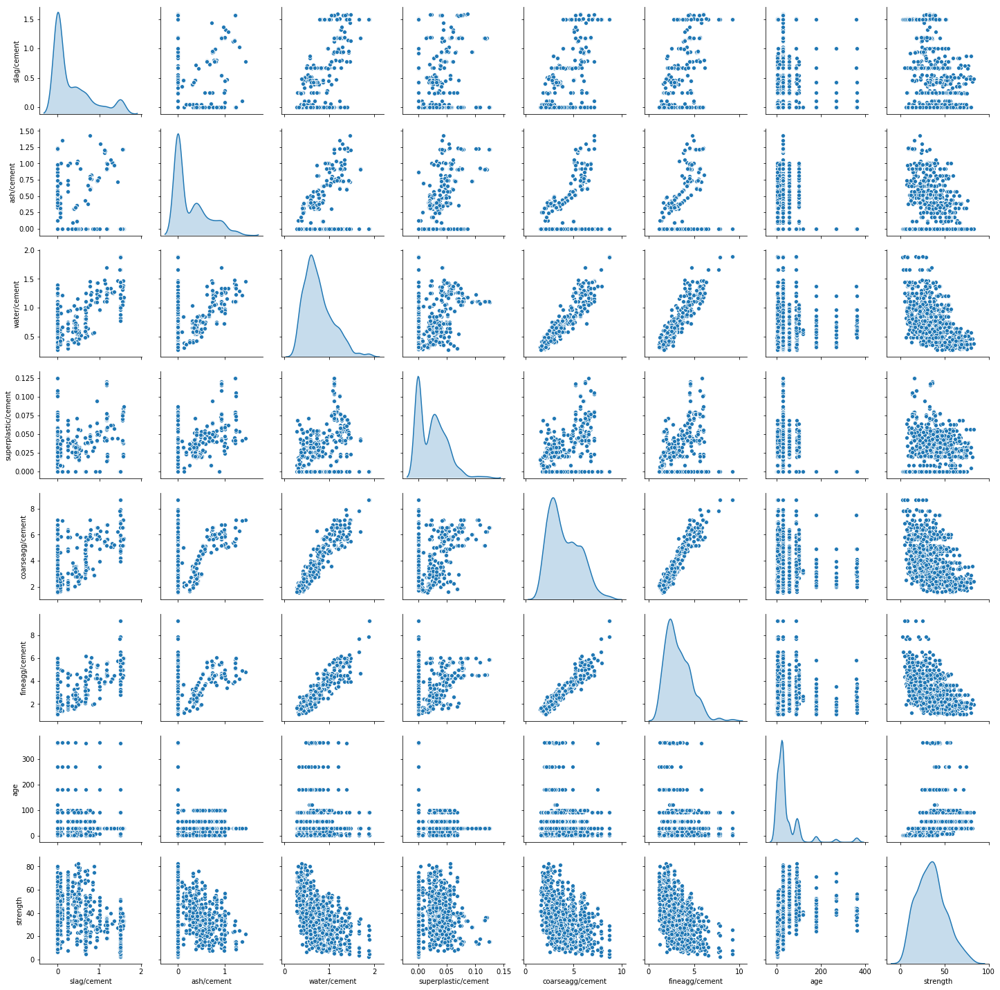

In [788]:
# Pair plot between all the independent attributes
sns.pairplot(concrete_Iter5, diag_kind='kde')

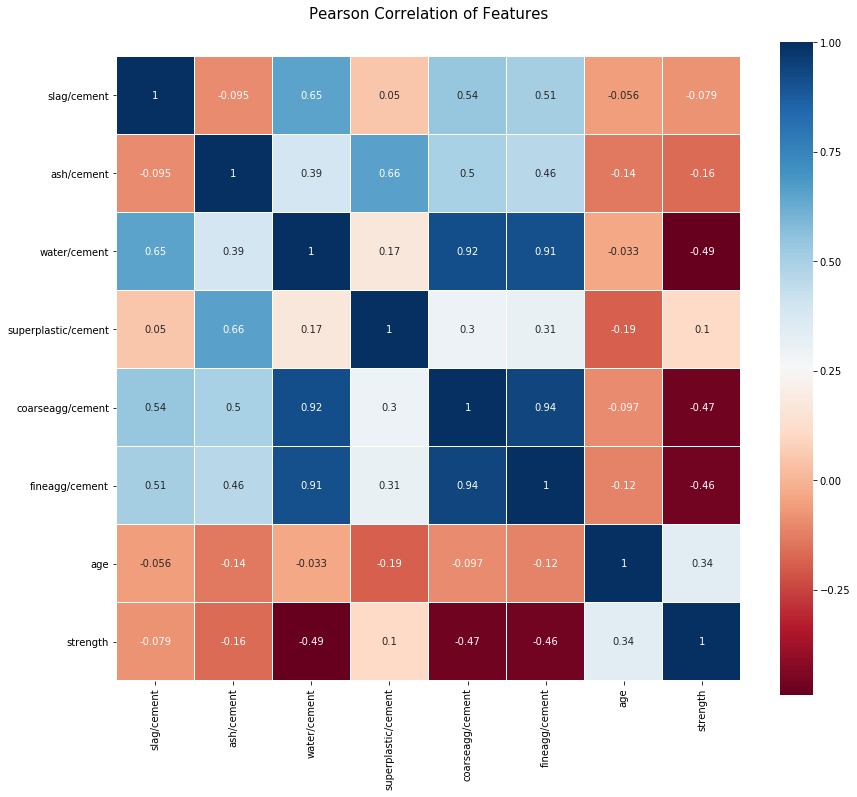

In [789]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_Iter5.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [790]:
# Observing the pair plot and pearson correlation matrix...
# These is large relationship between the independent attributes water/cement, fineagg/cement, coarseagg/cement
# So applying pca to these three attributes to make orthogonal codes.

In [791]:
concrete_Iter5_copy1=concrete_Iter5.copy(deep=True)
concrete_Iter5_copy2=concrete_Iter5.copy(deep=True)

In [792]:
concrete_Iter5_copy1_z=concrete_Iter5_copy1.apply(zscore) # Applying Z scores 
concrete_Iter5_copy1_z.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,-0.329328
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,-0.721299
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,0.651214
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,-1.042003


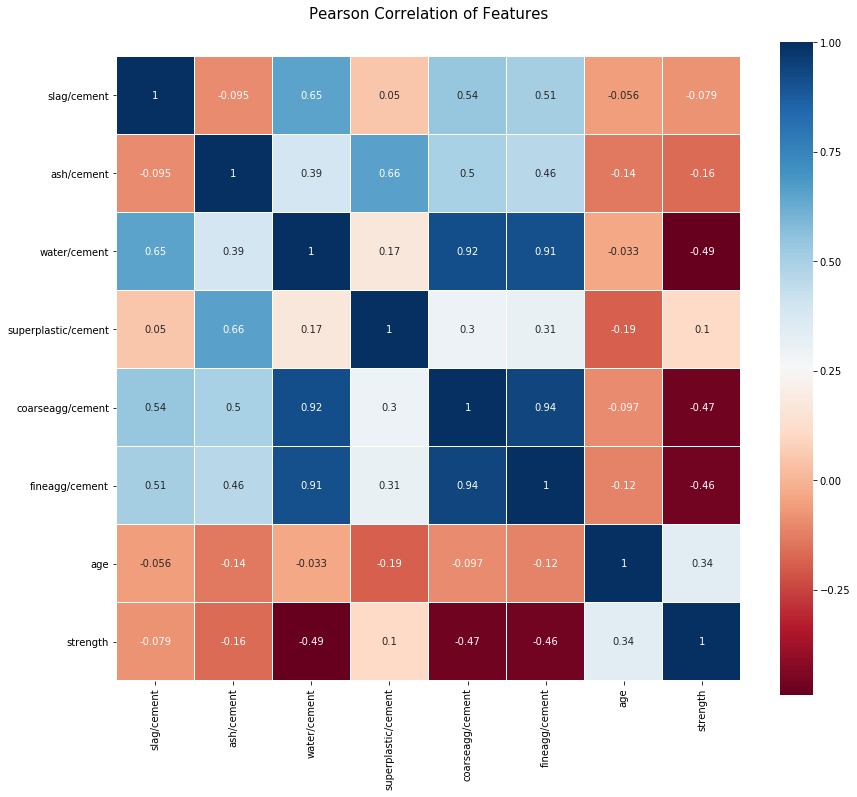

In [793]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_Iter5_copy1_z.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [794]:
pca_attributes=concrete_Iter5_copy1_z[['water/cement','fineagg/cement','coarseagg/cement']]
pca_attributes.head()
pca_attributes.shape

(1005, 3)

In [795]:
X=np.array(pca_attributes)
X.shape

(1005, 3)

In [796]:
# PCA
# Step 1 - Create covariance matrix
cov_matrix=np.cov(X.T)
print('Covariance Matrix \n', cov_matrix)

Covariance Matrix 
 [[1.00099602 0.90949841 0.91791049]
 [0.90949841 1.00099602 0.94229778]
 [0.91791049 0.94229778 1.00099602]]


In [797]:
# Identifying eigen values and eigen vector
eig_vals,eig_vecs=np.linalg.eig(cov_matrix)
print('Eigen Vecors \n', eig_vecs)
print('\n Eigen Values \n', eig_vals)

Eigen Vecors 
 [[ 0.57334374  0.81279911 -0.10312407]
 [ 0.5784778  -0.49072392 -0.65157767]
 [ 0.5802072  -0.31392299  0.75153973]]

 Eigen Values 
 [2.84753735 0.09737072 0.05807998]


Cumulative Variance Explained [ 94.82346599  98.06592707 100.        ]


Text(0, 0.5, 'Variance Explained')

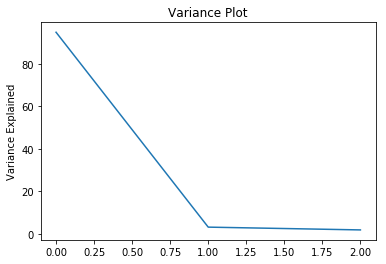

In [798]:
# Finding variance and cumulative variance by each eigen vector
tot=sum(eig_vals)
var_exp=[(i/tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

plt.title('Variance Plot')
plt.plot(var_exp)
plt.ylabel('Variance Explained')

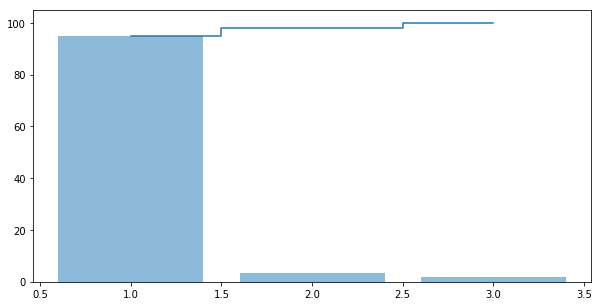

In [799]:
# Plotting
plt.figure(figsize=(10,5))
plt.bar(range(1,eig_vals.size + 1), var_exp, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1,eig_vals.size+1), cum_var_exp, where='mid', label='Cumulative explained variance')

In [800]:
# Using PCA from sklearn and finding the principal components
pca=PCA(n_components=3)
data_reduced=pca.fit_transform(X)
data_reduced.transpose()

array([[ 3.18326124,  1.83745287,  0.00351114, ..., -0.71388164,
        -1.18942432, -2.411627  ],
       [ 0.45701339, -0.54073773, -0.05437494, ...,  0.06333864,
         0.48881606,  0.01718892],
       [-0.13478171, -0.35220138,  0.20418172, ...,  0.17611465,
        -0.01103839, -0.21464878]])

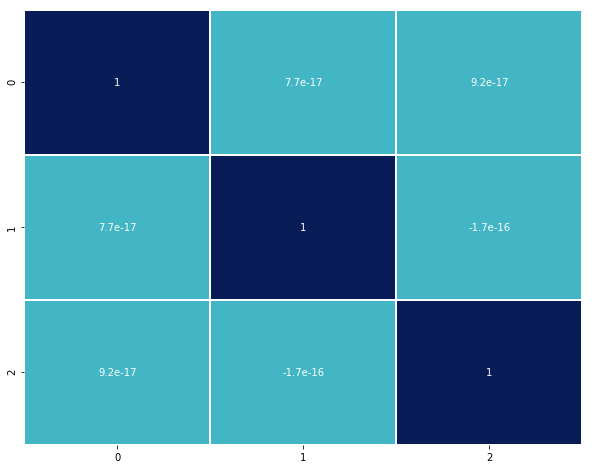

In [801]:
# Observing the relationship between different independent attributes after pca
plt.figure(figsize=(10,8))
sns.heatmap(pd.DataFrame(data_reduced).corr(), annot=True, linewidths=.5,center=0,cbar=False,cmap='YlGnBu')
plt.show()

In [802]:
data_reduced

array([[ 3.18326124,  0.45701339, -0.13478171],
       [ 1.83745287, -0.54073773, -0.35220138],
       [ 0.00351114, -0.05437494,  0.20418172],
       ...,
       [-0.71388164,  0.06333864,  0.17611465],
       [-1.18942432,  0.48881606, -0.01103839],
       [-2.411627  ,  0.01718892, -0.21464878]])

In [803]:
X=pd.DataFrame(data_reduced)
new_concrete_Iter5=pd.concat([X,concrete_Iter5_copy1_z],axis=1)
new_concrete_Iter5.head()

,0,1,2,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,3.183261,0.457013,-0.134782,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,-0.329328
1,1.837453,-0.540738,-0.352201,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,-0.721299
2,0.003511,-0.054375,0.204182,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,-0.370491
3,-0.314659,0.624678,-0.051137,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,0.651214
4,2.451604,0.271169,-0.527756,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,-1.042003


In [804]:
# 0,1,2, are the new pca attributes created from water/cement, fineagg/cement, coarseagg/cement
# So dropping down the column water/cement, fineagg/cement, coarseagg/cement from the existing column
new_concrete_Iter5.drop(['water/cement', 'coarseagg/cement', 'fineagg/cement'], axis=1, inplace=True)
new_concrete_Iter5.head()

,0,1,2,slag/cement,ash/cement,superplastic/cement,age,strength
0,3.183261,0.457013,-0.134782,2.440974,-0.764878,-1.008557,-0.280312,-0.329328
1,1.837453,-0.540738,-0.352201,-0.204232,1.355144,1.623690,-0.500082,-0.721299
2,0.003511,-0.054375,0.204182,-0.732747,0.337856,-0.102918,-0.280312,-0.370491
3,-0.314659,0.624678,-0.051137,0.173816,-0.764878,-1.008557,-0.280312,0.651214
4,2.451604,0.271169,-0.527756,1.773382,-0.764878,1.411374,-0.280312,-1.042003


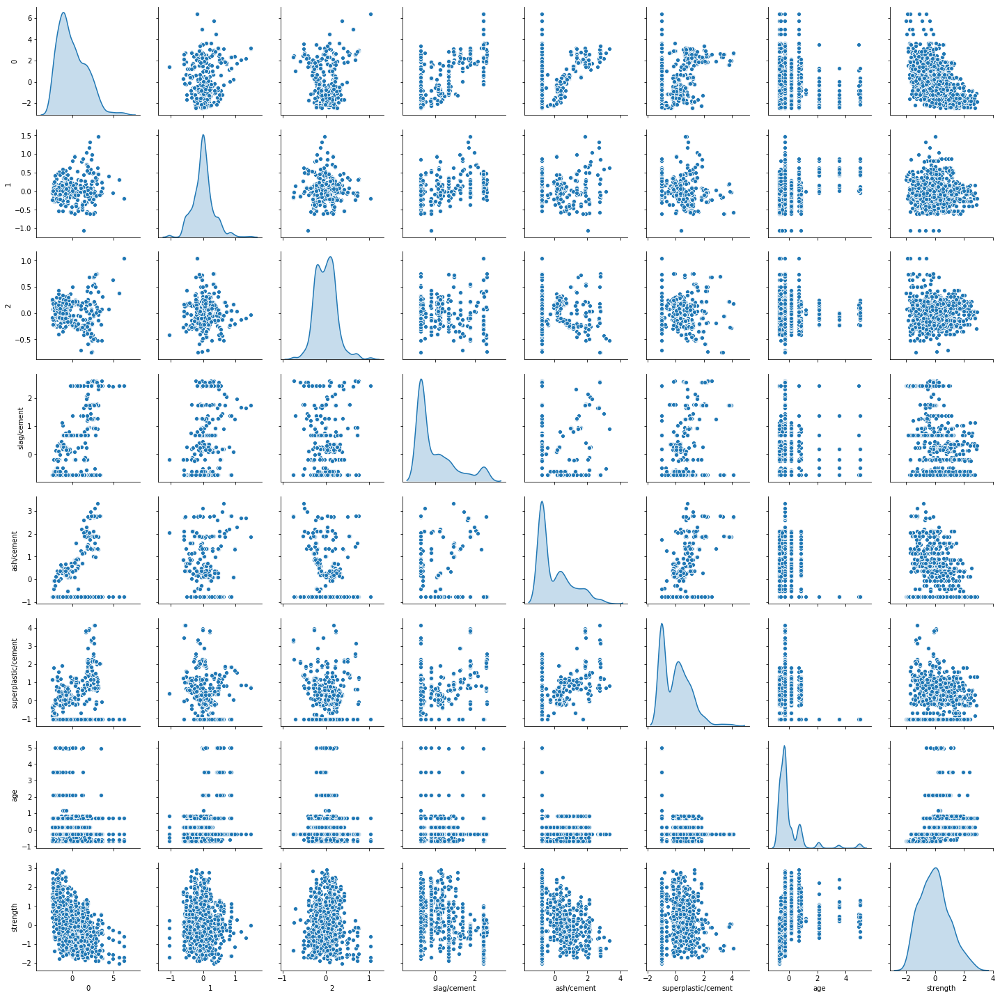

In [805]:
sns.pairplot(pd.DataFrame(new_concrete_Iter5), diag_kind='kde')

In [806]:
# The above pair plot shows that thers is no relationship between the independent attributes

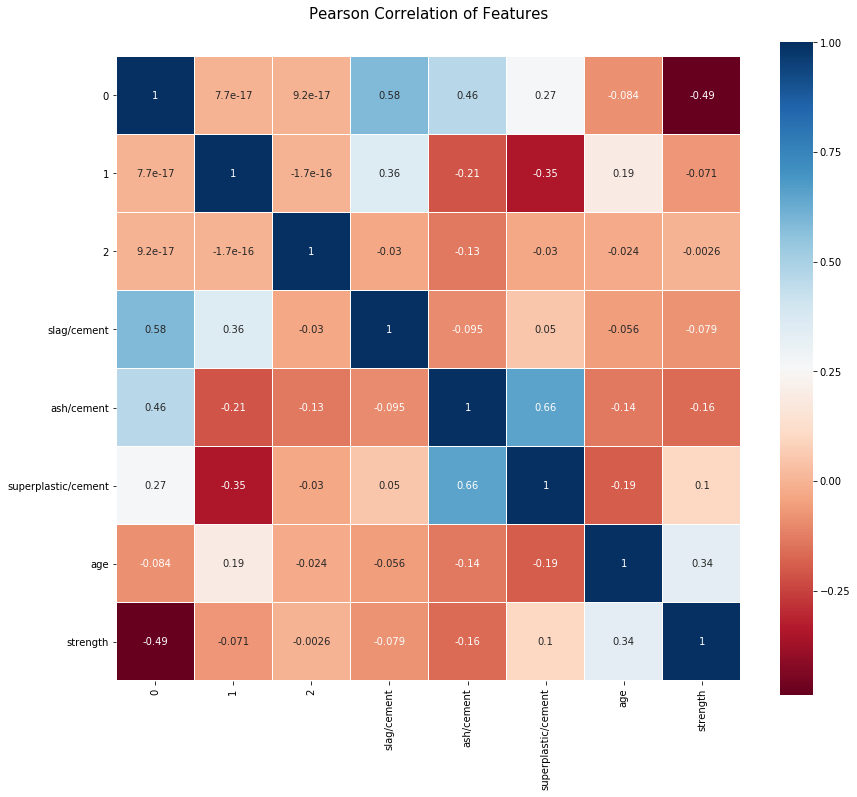

In [807]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(new_concrete_Iter5.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [808]:
# Relationship between between the independent attributes are removed after applying pca

In [809]:
X=new_concrete_Iter5.drop('strength',axis=1) # Independent Attribute
y=new_concrete_Iter5.pop('strength') # Dependent Attribute

In [810]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [811]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.50899977 0.57078516 0.52253497 0.61877009 0.5630181  0.69931605
 0.56893232 0.502419   0.42902215 0.60582126]


In [812]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 55.896%
 Standard Deviation : 7.045%


In [813]:
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

In [814]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.5748458704208065
The accuracy score for testing set is 0.4974635459550129


In [815]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.4974635459550129
The adjusted R Square value for testing set is 0.4939352057561013
The RMSE value for testing set is 0.6639157880447422


Text(0, 0.5, 'y_predict')

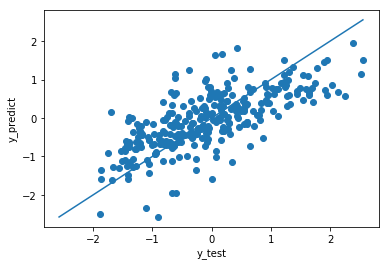

In [816]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [817]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 55.896%  (13.808%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935


In [818]:
# Inference from the Performance Metrics for Linear Regression Iteration 1
# -----------------------------------------------------------------------------------------------
# Accuracy performance with 95% confidence level at validation data set is : 55.896%  (13.808%)
# Accuracy performance observed at test data set is                        : 49.74%

## Using Polynomial Regression (degree=2)

In [819]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [820]:
print(X_train.shape)
print(X_train_2.shape)

(703, 7)
(703, 29)


In [821]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 7 to 29

In [822]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.65923189 0.70994298 0.61745848 0.67910176 0.74545205 0.70183436
 0.65131917 0.70584234 0.52200674 0.67292548]


In [823]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 66.651%
 Standard Deviation : 5.889%


In [824]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [825]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.7077373394854380
The accuracy score for testing set is 0.6642853177342383


In [826]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6642853177342383
The adjusted R Square value for testing set is 0.6619282437363844
The RMSE value for testing set is 0.5426432167137486


Text(0, 0.5, 'y_predict')

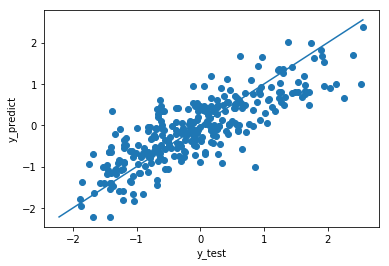

In [827]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [828]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : 66.651%  (11.543%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928


In [829]:
Comparison_Table5=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table5

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928


In [830]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs better than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [831]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.65906684 0.71054689 0.61924476 0.67940259 0.74461127 0.70444901
 0.65313411 0.70627057 0.5193932  0.67397551]


In [832]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 66.701%  (11.660%)


In [833]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [ 0.00000000e+00 -6.47604399e-01 -5.47766961e-01  2.04910727e-01
  6.27069539e-01  3.43077840e-01  2.87080848e-01  9.03862004e-01
  2.91494733e-01  5.13995001e-02  5.36066430e-02  6.58440828e-02
  3.59370396e-02 -9.11287124e-02 -2.19323447e-01 -3.07752281e-01
 -2.43981110e-01 -1.76515665e-02 -2.97393000e-01  3.54327082e-01
  2.80897541e-01 -4.30068393e-01  5.59913030e-01  4.71187961e-04
 -9.37812659e-02  2.78533488e-01 -1.70203906e-01  2.20325747e-01
  3.59999298e-01]


In [834]:
y_pred = ridge.predict(X_test_2)

In [835]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.7076991273844772
The accuracy score for testing set is 0.6645848325555437


In [836]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6645848325555437
The adjusted R Square value for testing set is 0.6622298614701764
The RMSE value for testing set is 0.5424010974947919


Text(0, 0.5, 'y_predict')

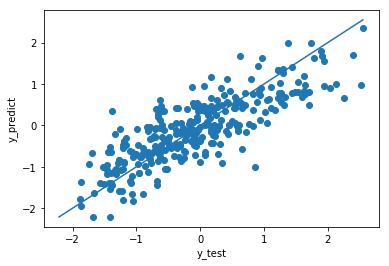

In [837]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [838]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.66223


In [839]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 66.701%  (11.660%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [840]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.25562232 0.17761467 0.15504833 0.18886059 0.25325376 0.33466346
 0.24214401 0.25825374 0.15263849 0.31588999]


In [841]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


In [842]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))
y_pred = lasso.predict(X_test_2)

Lasso model: [ 0.         -0.21042821 -0.         -0.          0.         -0.
  0.          0.01402792  0.         -0.          0.          0.
 -0.          0.         -0.         -0.         -0.         -0.
  0.          0.         -0.          0.         -0.          0.
  0.          0.         -0.         -0.         -0.        ]


In [843]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.2487642803552973
The accuracy score for testing set is 0.1615521909206163


In [844]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.1615521909206163
The adjusted R Square value for testing set is 0.1556653958719145
The RMSE value for testing set is 0.8575653559024814


Text(0, 0.5, 'y_predict')

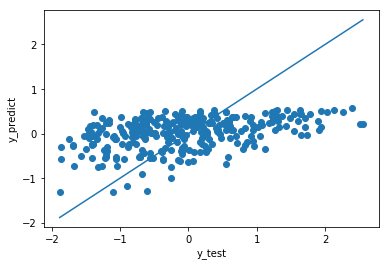

In [845]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [846]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


In [847]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665


In [848]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665


In [849]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Lasso performance is too poor for  polynomial Regression 
#---------------------------------------------------------------------------
# The accuracy metrics for 95% confidence level 
#----------------------------------------------------------------------------
# Before using Ridge        : 66.651%  (11.543%) 
# With Ridge Regression     : 66.701%  (11.660%)
# With Lasso Regression     : 23.340%  (11.825%)
# --------------------------------------------------------------------------
# Ridge Regression has slightly better performance than others

## Using Polynomial Regression (degree=3)

In [850]:
ly=PolynomialFeatures(degree=3, interaction_only=True) #Considering Polynomial degree as 3
X_train_3 = poly.fit_transform(X_train)
X_test_3 = poly.fit_transform(X_test)

In [851]:
print(X_train.shape)
print(X_train_3.shape)

(703, 7)
(703, 29)


In [852]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR3_model=linear_model.LinearRegression()
results=cross_val_score(PR3_model,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.65923189 0.70994298 0.61745848 0.67910176 0.74545205 0.70183436
 0.65131917 0.70584234 0.52200674 0.67292548]


In [853]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 66.651%
 Standard Deviation : 5.889%


In [854]:
PR3_model.fit(X_train_3,y_train)
y_pred = PR3_model.predict(X_test_3)

In [855]:
print("The accuracy score for training set is %12.16f" %PR3_model.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %PR3_model.score(X_test_3,y_test))

The accuracy score for training set is 0.7077373394854380
The accuracy score for testing set is 0.6642853177342383


In [856]:
# r square value for testing
r_square_for_testing=PR3_model.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6642853177342383
The adjusted R Square value for testing set is 0.6619282437363844
The RMSE value for testing set is 0.5426432167137486


Text(0, 0.5, 'y_predict')

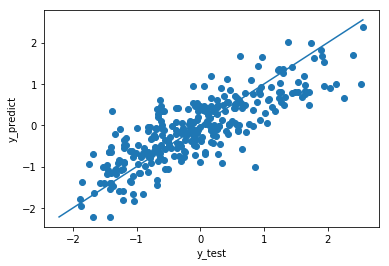

In [857]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [858]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3 = pd.DataFrame({'Model':['Polynomial Regression - degree 3'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3=Polynomial_Regression_Metrics1_degree3[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3

Model performance range with 95 percentage confidence level is : 66.651%  (11.543%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3,0.542643,0.664285,0.661928


In [859]:
Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree3])
Comparison_Table5

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665
0,Polynomial Regression - degree 3,0.542643,0.664285,0.661928


In [860]:
# As the degree increases the performance starts to decrease

## Using Polynomial Regression (degree=3)  & Ridge Regression

In [861]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.65906684 0.71054689 0.61924476 0.67940259 0.74461127 0.70444901
 0.65313411 0.70627057 0.5193932  0.67397551]


In [862]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 66.701%  (11.660%)


In [863]:
ridge.fit(X_train_3,y_train)
y_pred = ridge.predict(X_test_3)

In [864]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_3,y_test))

The accuracy score for training set is 0.7076991273844772
The accuracy score for testing set is 0.6645848325555437


In [865]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6645848325555437
The adjusted R Square value for testing set is 0.6622298614701764
The RMSE value for testing set is 0.5424010974947919


Text(0, 0.5, 'y_predict')

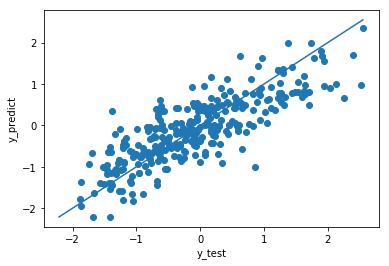

In [866]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [867]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_ridge=Polynomial_Regression_Metrics1_degree3_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_ridge

Model performance range with 95 percentage confidence level is : 66.701%  (11.660%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.66223


In [868]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 66.701%  (11.660%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665
0,Polynomial Regression - degree 3,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230


## Using Polynomial Regression (degree=3)  & Lasso Regression

In [869]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=10000)
results=cross_val_score(lasso,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.25562232 0.17761467 0.15504833 0.18886059 0.25325376 0.33466346
 0.24214401 0.25825374 0.15263849 0.31588999]


In [870]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


In [871]:
lasso.fit(X_train_3,y_train)
y_pred = lasso.predict(X_test_3)

In [872]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_3,y_test))

The accuracy score for training set is 0.2487642803552973
The accuracy score for testing set is 0.1615521909206163


In [873]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.1615521909206163
The adjusted R Square value for testing set is 0.1556653958719145
The RMSE value for testing set is 0.8575653559024814


Text(0, 0.5, 'y_predict')

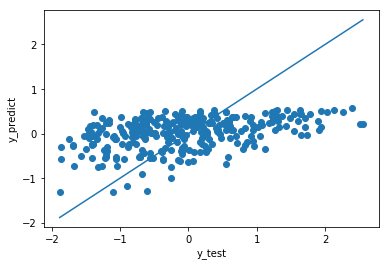

In [874]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [875]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_Lasso=Polynomial_Regression_Metrics1_degree3_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_Lasso

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & lasso,0.857565,0.161552,0.155665


In [876]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree3_Lasso])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 23.340%  (11.825%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665
0,Polynomial Regression - degree 3,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 3 & lasso,0.857565,0.161552,0.155665


In [877]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# There is no much difference in performance metrics between polynomial Regression with degree - 2, ridge and lasso
#---------------------------------------------------------------------------
# The accuracy metrics for 95% confidence level 
#----------------------------------------------------------------------------
# Before using Ridge        : 66.701%  (11.660%) 
# With Ridge Regression     : 66.175%  (28.920%)
# With Lasso Regression     : 23.238%  (12.006%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=4)

In [878]:
poly=PolynomialFeatures(degree=4, interaction_only=True) #Considering Polynomial degree as 4
X_train_4 = poly.fit_transform(X_train)
X_test_4 = poly.fit_transform(X_test)

In [879]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR4_model=linear_model.LinearRegression()
results=cross_val_score(PR4_model,X_train_4, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-6.89273696  0.7333652   0.50791748  0.50411856  0.77265515  0.66599736
  0.70792867  0.69982231  0.26664979  0.69614331]


In [880]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : -13.381%
 Standard Deviation : 225.761%


In [881]:
PR4_model.fit(X_train_4,y_train)
y_pred = PR4_model.predict(X_test_4)

In [882]:
print("The accuracy score for training set is %12.16f" %PR4_model.score(X_train_4,y_train))
print("The accuracy score for testing set is %12.16f" %PR4_model.score(X_test_4,y_test))

The accuracy score for training set is 0.7911931653074765
The accuracy score for testing set is 0.4120365958543591


In [883]:
# r square value for testing
r_square_for_testing=PR4_model.score(X_test_4,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.4120365958543591
The adjusted R Square value for testing set is 0.4079084676406988
The RMSE value for testing set is 0.7181321312472849


In [884]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : -13.381%  (442.491%)


In [885]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree4 = pd.DataFrame({'Model':['Polynomial Regression - degree 4'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree4=Polynomial_Regression_Metrics1_degree4[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 4,0.718132,0.412037,0.407908


In [886]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Polynomial_Regression_Metrics1_degree4])
Comparison_Table5

Model performance range with 95 percentage confidence level is : -13.381%  (442.491%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 2,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 2 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 2 & lasso,0.857565,0.161552,0.155665
0,Polynomial Regression - degree 3,0.542643,0.664285,0.661928
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,Polynomial Regression - degree 3 & lasso,0.857565,0.161552,0.155665
0,Polynomial Regression - degree 4,0.718132,0.412037,0.407908


In [887]:
# As the degree increases from 3 to further the performance starts to decrease

In [888]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table5=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table5

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230


## Support Vector Regressor

In [889]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [890]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [891]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8416189705149505
Standard deviation for the best model 0.03640456643004064


In [892]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 84.162%
 Standard Deviation : 3.64046%


In [893]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train,y_train)
y_pred = SVR_optimised_model.predict(X_test)

In [894]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8840153446868553
The accuracy score for testing set is 0.8115702004277705


In [895]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8115702004277705
The adjusted R Square value for testing set is 0.8102472228981761
The RMSE value for testing set is 0.4065406750468205


Text(0, 0.5, 'y_predict')

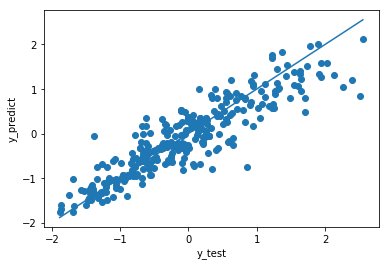

In [896]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [897]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 84.162%  (7.135%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.406541,0.81157,0.810247


In [898]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,SVR_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 84.162%  (7.135%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247


In [899]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

## KNN Regressor

In [900]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [901]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [902]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [903]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 2}
The model which produce best score is 0.7417973920829483
Standard deviation for the best model 0.07556155996054675


In [904]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 74.180%
 Standard Deviation : 7.55616%


In [905]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [906]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.9099017834797679
The accuracy score for testing set is 0.6573215919358495


In [907]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6573215919358495
The adjusted R Square value for testing set is 0.6549156251791303
The RMSE value for testing set is 0.5853873999875215


Text(0, 0.5, 'y_predict')

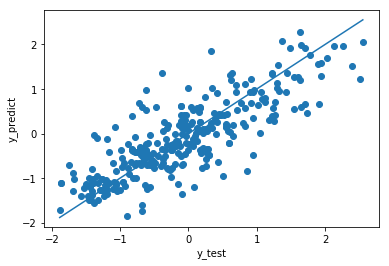

In [908]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [909]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 74.180%  (14.810%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.585387,0.657322,0.654916


In [910]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,KNN_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 74.180%  (14.810%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916


In [911]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is poor than SVR.
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=2, p=2,
#                   weights='uniform')

## Decision Tree Regressor

In [912]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [913]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [914]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.7957734407809848
Standard deviation for the best model 0.05684966299936029


In [915]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 79.577%
 Standard Deviation : 5.68497%


In [916]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [917]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9922652636217284
The accuracy score for testing set is 0.6669741782326983


In [918]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6669741782326983
The adjusted R Square value for testing set is 0.6646359828943120
The RMSE value for testing set is 0.5404657348440339


Text(0, 0.5, 'y_predict')

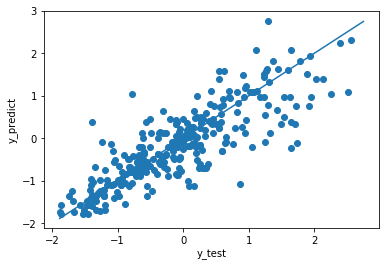

In [919]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [920]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 79.577%  (11.143%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,0.540466,0.666974,0.664636


In [921]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,DecisionTree_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 79.577%  (11.143%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636


In [922]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='mse', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [923]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [924]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [925]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 200}
The model which produce best score is 0.8818150103008103
Standard deviation for the best model 0.030551397255644066


In [926]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 88.182%
 Standard Deviation : 3.05514%


In [927]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [928]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9700419327229431
The accuracy score for testing set is 0.8606571293994196


In [929]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8606571293994196
The adjusted R Square value for testing set is 0.8596787942999171
The RMSE value for testing set is 0.3496001316195171


Text(0, 0.5, 'y_predict')

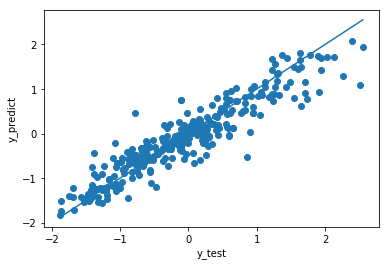

In [930]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [931]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 88.182%  (5.988%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,0.3496,0.860657,0.859679


In [932]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Bagging_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 88.182%  (5.988%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636
0,Bagging,0.349600,0.860657,0.859679


In [933]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=200,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [934]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [935]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [936]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 0.8, 'n_estimators': 100}
The model which produce best score is 0.7577178121832235
Standard deviation for the best model 0.031001977007211613


In [937]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 75.772%
 Standard Deviation : 3.10020%


In [938]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [939]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8036834349871648
The accuracy score for testing set is 0.7411112367101390


In [940]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7411112367101390
The adjusted R Square value for testing set is 0.7392935623440116
The RMSE value for testing set is 0.4765251330888760


Text(0, 0.5, 'y_predict')

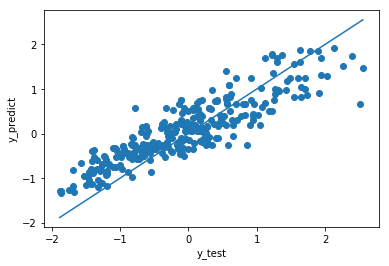

In [941]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [942]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 75.772%  (6.076%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,0.476525,0.741111,0.739294


In [943]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Adaboost_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 75.772%  (6.076%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636
0,Bagging,0.349600,0.860657,0.859679
0,Adaboost,0.476525,0.741111,0.739294


In [944]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=0.8, loss='linear',
#                  n_estimators=100, random_state=1)

## Gradient Boosting Regressor

In [945]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [946]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [947]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 5, 'n_estimators': 200}
The model which produce best score is 0.9023630974818576
Standard deviation for the best model 0.0348390670282366


In [948]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 90.236%
 Standard Deviation : 3.48391%


In [949]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [950]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9926174136588654
The accuracy score for testing set is 0.9077894931034115


In [951]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.9077894931034115
The adjusted R Square value for testing set is 0.9071420773077484
The RMSE value for testing set is 0.2843933359617429


Text(0, 0.5, 'y_predict')

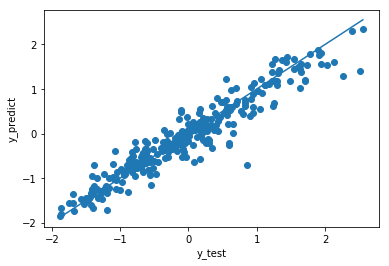

In [952]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [953]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 90.236%  (6.828%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,0.284393,0.907789,0.907142


In [954]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,Gradientboost_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 90.236%  (6.828%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636
0,Bagging,0.349600,0.860657,0.859679
0,Adaboost,0.476525,0.741111,0.739294
0,Gradientboost,0.284393,0.907789,0.907142


In [955]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=5,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [956]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [957]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [958]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 100}
The model which produce best score is 0.8828429550826513
Standard deviation for the best model 0.03010470073279074


In [959]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 88.284%
 Standard Deviation : 3.01047%


In [960]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [961]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9724118213646202
The accuracy score for testing set is 0.8562111746042582


In [962]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8562111746042582
The adjusted R Square value for testing set is 0.8552016241752008
The RMSE value for testing set is 0.3551336122949116


Text(0, 0.5, 'y_predict')

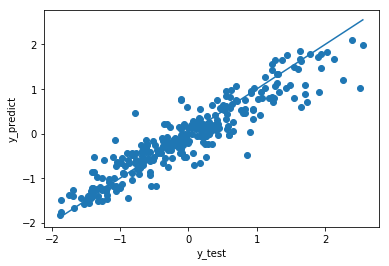

In [963]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [964]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 88.284%  (5.901%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,0.355134,0.856211,0.855202


In [965]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table5=pd.concat([Comparison_Table5,RandomForest_Metrics1])
Comparison_Table5

Model performance range with 95 percentage confidence level is : 88.284%  (5.901%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636
0,Bagging,0.349600,0.860657,0.859679
0,Adaboost,0.476525,0.741111,0.739294
0,Gradientboost,0.284393,0.907789,0.907142
0,Random Forest,0.355134,0.856211,0.855202


In [966]:
# Inference from the accuracy metrics:
# ------------------------------------
# Random Forest Regressor has poorer Performance than Gradient Boosting Regressor
# The optimised model of Random Forest RegressorGradient Boosting Regressor is
# RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=2,
#                      min_weight_fraction_leaf=0.0, n_estimators=100,
#                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
#                      warm_start=False)

In [967]:
# Summary of Iteration 5:
# -------------------------
# Duplicate Data were removed 
# Outliers were not treated
# Feature Engineering were done
# pca was applied to the independent attributes having high relationships
# Gradient Boost regressor has the best performance with 90.77 Score in training dataset
# The model has the performance range 90.236%  (6.828%) with 95% confidence level

In [968]:
#  Comparing iteration 1, 3 and 5
#  i.e after outliers were observed and removed.

In [969]:
Comparison_Table1

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.316849,0.541961,0.538282
0,Polynomial Regression - degree 3,8.322321,0.701944,0.699550
0,SVR,0.433043,0.812473,0.810967
0,KNN,0.631126,0.601680,0.598480
0,Decision Tree,7.124025,0.781597,0.779842
0,Bagging,5.158369,0.885493,0.884573
0,Adaboost,7.359663,0.766910,0.765038
0,Gradientboost,4.475665,0.913797,0.913104
0,Random Forest,5.123526,0.887034,0.886127


In [970]:
Comparison_Table3

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,10.806366,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,8.656433,0.677532,0.675268
0,SVR,0.415405,0.827439,0.826227
0,KNN,0.579235,0.664487,0.662131
0,Decision Tree,7.590679,0.758230,0.756532
0,Bagging,6.071565,0.845317,0.844231
0,Adaboost,7.804170,0.744439,0.742645
0,Gradientboost,5.297433,0.882247,0.881420
0,Random Forest,5.932339,0.852330,0.851293


In [971]:
Comparison_Table5

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.663916,0.497464,0.493935
0,Polynomial Regression - degree 3 & ridge,0.542401,0.664585,0.662230
0,SVR,0.406541,0.811570,0.810247
0,KNN,0.585387,0.657322,0.654916
0,Decision Tree,0.540466,0.666974,0.664636
0,Bagging,0.349600,0.860657,0.859679
0,Adaboost,0.476525,0.741111,0.739294
0,Gradientboost,0.284393,0.907789,0.907142
0,Random Forest,0.355134,0.856211,0.855202


In [972]:
# Comparing Iteration 1, 3 and 5 :
# -------------------------------------------------------
# Iteration 1: Removing Duplicate data
#              Outliers were not treated
#              Without feature engineering
# Iteration 3: Removing Duplicate data
#              Outliers were not treated
#              With feature engineering
# Iteration 5: Removing Duplicate data
#              Outliers were not treated
#              With feature engineering
#              pca were applied to highly dependent independent attributes
# --------------------------------------------------------------------
# The performance at Iteration 1 is better than Iteration 3 and Iteration 5
# Gradient Boost Regressor at Iteration 1 gives the better result 
# Gradient Boost regressor has the best performance with 91.37 Score in training dataset
# The model has the performance range 92.154%  (3.746%) with 95% confidence level
# Optimized Model is
# -----------------
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=5,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)


# Iteration 6

1. Removing duplicate data
2. Outliers were observed and removed
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
4. Observing linear relationship between the independent attributes such as 'coarseagg/cement', 'fineagg/cement' and 'water/cement'. Hence applying pca with these 3 independent attributes and redoing the analysis.

In [973]:
# Removing Duplicate Data
concrete_Iter6=concrete_df.copy(deep=True)
concrete_Iter6.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter6 = concrete_Iter6.reset_index()
concrete_Iter6.head()

,index,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [974]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter6['cement/cement']=concrete_Iter6['cement']/concrete_Iter6['cement']
concrete_Iter6['slag/cement']=concrete_Iter6['slag']/concrete_Iter6['cement']
concrete_Iter6['ash/cement']=concrete_Iter6['ash']/concrete_Iter6['cement']
concrete_Iter6['water/cement']=concrete_Iter6['water']/concrete_Iter6['cement']
concrete_Iter6['superplastic/cement']=concrete_Iter6['superplastic']/concrete_Iter6['cement']
concrete_Iter6['coarseagg/cement']=concrete_Iter6['coarseagg']/concrete_Iter6['cement']
concrete_Iter6['fineagg/cement']=concrete_Iter6['fineagg']/concrete_Iter6['cement']
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter6.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)
# Rearranging the columns
concrete_Iter6 = concrete_Iter6[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter6.drop(['cement/cement'], axis=1, inplace=True)
concrete_Iter6.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


(array([1, 2, 3, 4, 5, 6, 7, 8]), <a list of 8 Text xticklabel objects>)

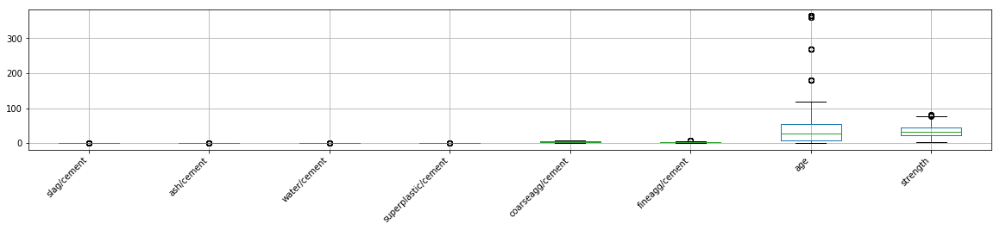

In [975]:
# Observing the outliers using box plot
concrete_Iter6.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [976]:
# Inference from the box plot:
# --------------------------------------------------------------------------------------------------------
# Outliers were observed in the attributes 'slag', 'ash', 'water', 'superplastic', 'fineagg', 'age' and 'strength'
# --------------------------------------------------------------------------------------------------------
# Oultliers will be observed and removed from the above attributes (as per domain expert suggestion)
# Replacing the extreme values with mean or mean+2*std may lead to poor performance
# Since the concrete strength depends on the ratios of cement:fineagg:courseagg:water

In [977]:
# Observing the Outliers of 'slag/cement' and replacing with nan
median_slag=concrete_Iter6['slag/cement'].median() # Median of 'slag/cement' attribute
std_slag=2.5*(concrete_Iter6['slag/cement'].std()) # Calculating 2.5*std deviation of 'slag/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['slag/cement']-median_slag).abs()>std_slag, 'slag/cement'] = np.nan # Locating the row containing outliers and replacing with nan

# Observing the Outliers of 'ash/cement' and replacing with nan
median_ash=concrete_Iter6['ash/cement'].median() # Median of 'ash/cement' attribute
std_ash=2.5*(concrete_Iter6['ash/cement'].std()) # Calculating 2.5*std deviation of 'ash/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['ash/cement']-median_ash).abs()>std_ash, 'ash/cement'] = np.nan # Locating the row containing outliers and replacing with nan

# Observing the Outliers of 'water/cement' and replacing with nan
median_water=concrete_Iter6['water/cement'].median() # Median of 'water/cement' attribute
std_water=2.5*(concrete_Iter6['water/cement'].std()) # Calculating 2.5*std deviation of 'water/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['water/cement']-median_water).abs()>std_water, 'water/cement'] = np.nan # Locating the row containing outliers and replacing with


# Observing the Outliers of 'superplastic/cement' and replacing with nan
median_sp=concrete_Iter6['superplastic/cement'].median() # Median of 'superplastic/cement' attribute
std_sp=2.5*(concrete_Iter6['superplastic/cement'].std()) # Calculating 2.5*std deviation of 'superplastic/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['superplastic/cement']-median_sp).abs()>std_sp, 'superplastic/cement'] = np.nan # Locating the row containing outliers and replacing 


# Observing the Outliers of 'fineagg/cement' and replacing with nan
median_fa=concrete_Iter6['fineagg/cement'].median() # Median of 'water/cement' attribute
std_fa=2.5*(concrete_Iter6['fineagg/cement'].std()) # Calculating 2.5*std deviation of 'fineagg/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['fineagg/cement']-median_fa).abs()>std_fa, 'fineagg/cement'] = np.nan # Locating the row containing outliers and replacing 


# Observing the Outliers of 'age' and replacing with nan
median_age=concrete_Iter6['age'].median() # Median of 'water/cement' attribute
std_age=2.5*(concrete_Iter6['age'].std()) # Calculating 2.5*std deviation of 'fineagg/cement' attribute
concrete_Iter6.loc[(concrete_Iter6['age']-median_age).abs()>std_age, 'age'] = np.nan # Locating the row containing outliers and replacing 

# Outliers of  the attribute 'strength' is kept as it is, since it is a target variable.

In [978]:
concrete_Iter6.isnull().sum()

slag/cement            83
ash/cement             97
water/cement           20
superplastic/cement    15
coarseagg/cement        0
fineagg/cement         16
age                    33
strength                0
dtype: int64

In [979]:
concrete_Iter6=concrete_Iter6.dropna(axis=0) # Removing the row containing Nan
concrete_Iter6.isnull().sum()

slag/cement            0
ash/cement             0
water/cement           0
superplastic/cement    0
coarseagg/cement       0
fineagg/cement         0
age                    0
strength               0
dtype: int64

In [980]:
concrete_Iter6.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14.0,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28.0,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28.0,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28.0,18.29
5,0.000000,0.000000,0.752941,0.000000,3.489412,3.705882,90.0,21.86


In [981]:
concrete_Iter6_backup1=concrete_Iter6.copy(deep=True)
concrete_Iter6_backup2=concrete_Iter6.copy(deep=True)
concrete_Iter6_backup1.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14.0,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28.0,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28.0,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28.0,18.29
5,0.000000,0.000000,0.752941,0.000000,3.489412,3.705882,90.0,21.86


(array([1, 2, 3, 4, 5, 6, 7, 8]), <a list of 8 Text xticklabel objects>)

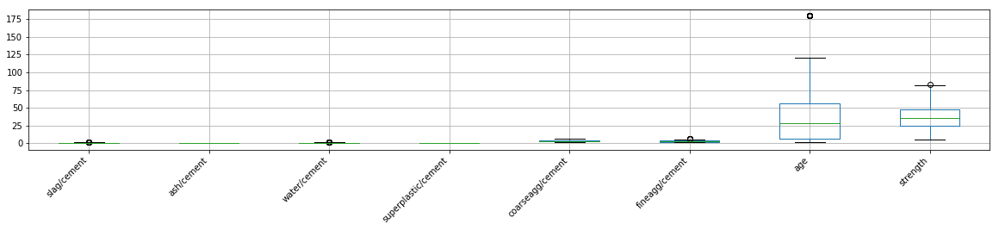

In [982]:
# Observing using box plot after treating the outliers
concrete_Iter6.boxplot(figsize=(20,3))
plt.xticks(rotation=45,ha="right")

In [983]:
# Inference from the box plot:
# ---------------------------
# Outliers were removed and new outliers were observed

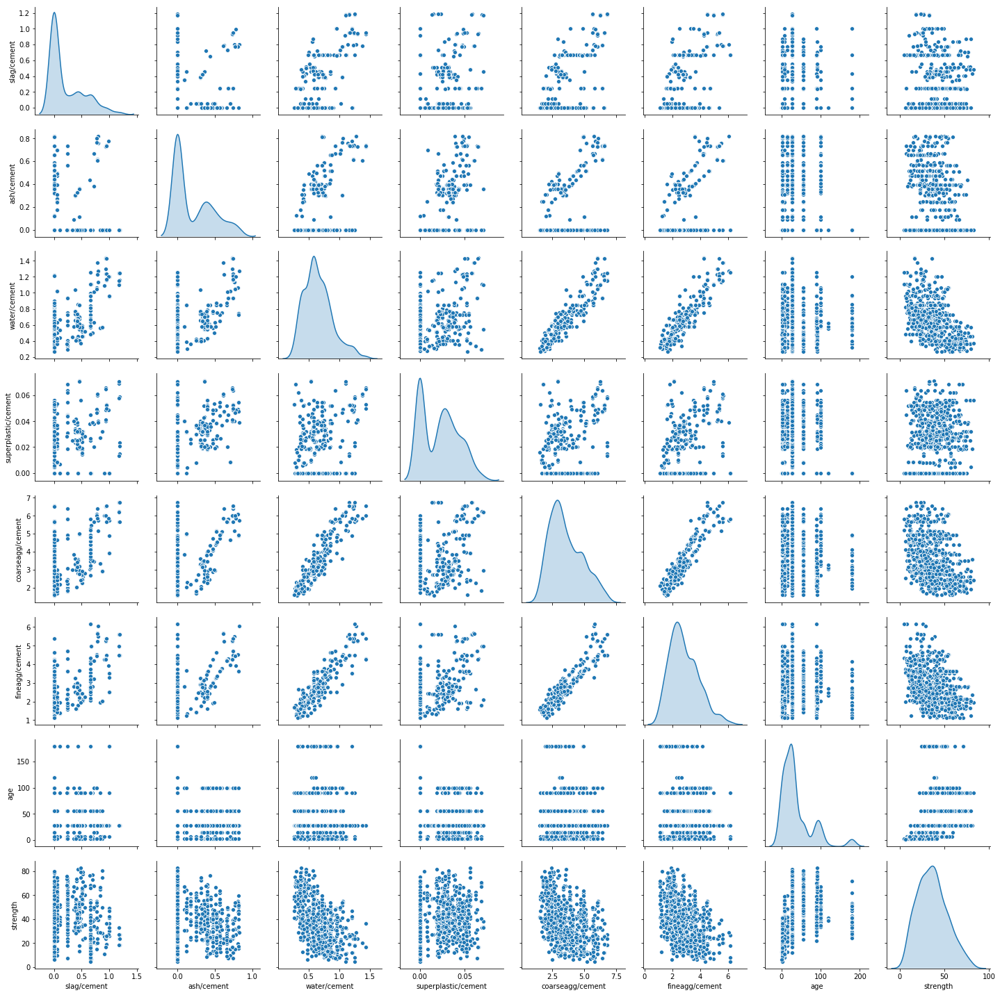

In [984]:
# Pair plot between all the independent attributes
sns.pairplot(concrete_Iter6, diag_kind='kde')

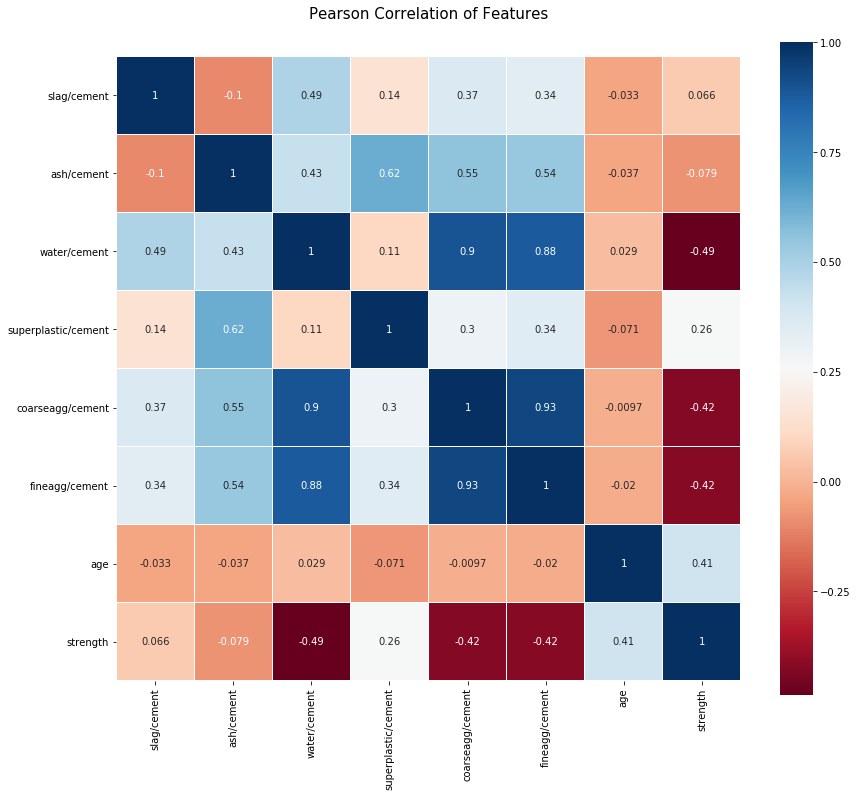

In [985]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_Iter6.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [986]:
concrete_Iter6_copy1=concrete_Iter6.copy(deep=True)
concrete_Iter6_copy2=concrete_Iter6.copy(deep=True)
concrete_Iter6_copy1=concrete_Iter6_copy1.reset_index()
concrete_Iter6_copy1.head()

,index,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14.0,23.51
1,2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28.0,29.22
2,3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28.0,45.85
3,4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28.0,18.29
4,5,0.000000,0.000000,0.752941,0.000000,3.489412,3.705882,90.0,21.86


In [987]:
concrete_Iter6_copy1_z=concrete_Iter6_copy1.apply(zscore)
concrete_Iter6_copy1_z
concrete_Iter6_copy1_z.drop(['index'], axis=1, inplace=True)
concrete_Iter6_copy1_z.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,0.084315,2.045058,1.209426,2.054313,2.251918,1.801813,-0.605175,-0.808147
1,-0.726761,0.677557,0.391973,-0.031177,0.190648,0.567504,-0.241725,-0.461365
2,0.664480,-0.804805,0.860481,-1.125057,-0.068942,-0.333019,-0.241725,0.548616
3,3.119223,-0.804805,2.566324,1.797866,2.546182,1.594298,-0.241725,-1.125170
4,-0.726761,-0.804805,0.406529,-1.125057,-0.080443,0.821403,1.367841,-0.908355


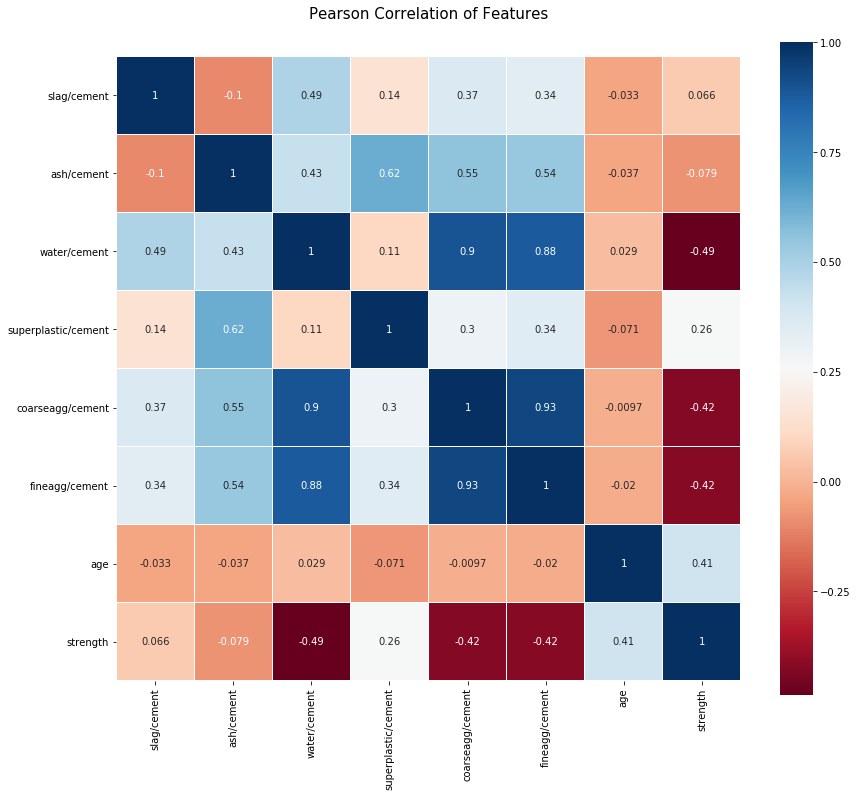

In [988]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(concrete_Iter6_copy1_z.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [989]:
pca_attributes=concrete_Iter6_copy1_z[['water/cement','fineagg/cement','coarseagg/cement']]
pca_attributes.head()
pca_attributes.shape

(797, 3)

In [990]:
X=np.array(pca_attributes)
X.shape

(797, 3)

In [991]:
# PCA
#Creating covariance matrix
cov_matrix=np.cov(X.T)
print('Covariance Matrix \n', cov_matrix)

Covariance Matrix 
 [[1.00125628 0.88411084 0.89964851]
 [0.88411084 1.00125628 0.93273898]
 [0.89964851 0.93273898 1.00125628]]


In [992]:
# Identifying eigen values and eigen vector
eig_vals,eig_vecs=np.linalg.eig(cov_matrix)
print('Eigen Vecors \n', eig_vecs)
print('\n Eigen Values \n', eig_vals)

Eigen Vecors 
 [[ 0.57149272  0.80989571 -0.13215526]
 [ 0.57863653 -0.51191147 -0.63492237]
 [ 0.58187269 -0.28638365  0.76118892]]

 Eigen Values 
 [2.81240748 0.12431485 0.06704651]


Cumulative Variance Explained [ 93.6292914   97.76792039 100.        ]


Text(0, 0.5, 'Variance Explained')

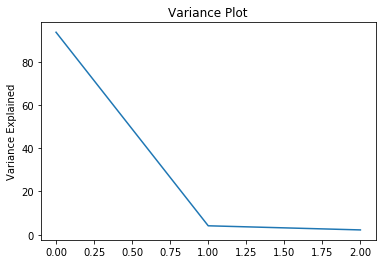

In [993]:
# Finding variance and cumulative variance by each eigen vector
tot=sum(eig_vals)
var_exp=[(i/tot)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

plt.title('Variance Plot')
plt.plot(var_exp)
plt.ylabel('Variance Explained')

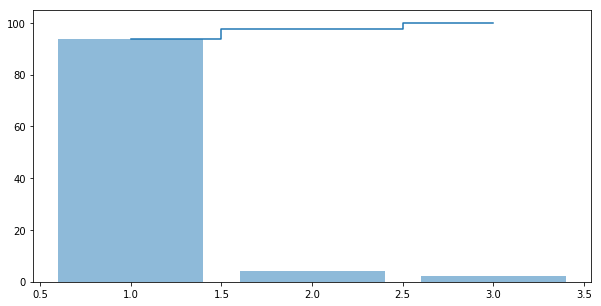

In [994]:
# Plotting
plt.figure(figsize=(10,5))
plt.bar(range(1,eig_vals.size + 1), var_exp, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1,eig_vals.size+1), cum_var_exp, where='mid', label='Cumulative explained variance')

In [995]:
# Using PCA from sklearn and finding the principal components
pca=PCA(n_components=3)
data_reduced=pca.fit_transform(X)
data_reduced.transpose()

array([[ 3.04410207,  0.66332135,  0.25894617, ..., -2.56761029,
        -0.27646909, -2.51855766],
       [-0.58777209, -0.02765343,  0.88711945, ..., -0.34276313,
         0.10730125,  0.00810749],
       [-0.4102917 ,  0.26700319, -0.04524666, ...,  0.25759923,
         0.21353314, -0.34190009]])

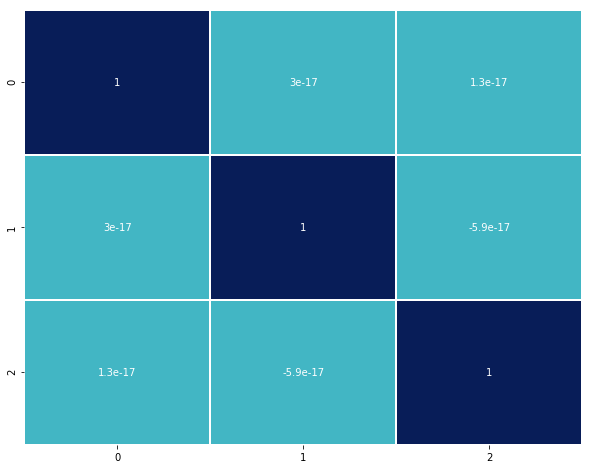

In [996]:
# Observing the relationship between different independent attributes after pca
plt.figure(figsize=(10,8))
sns.heatmap(pd.DataFrame(data_reduced).corr(), annot=True, linewidths=.5,center=0,cbar=False,cmap='YlGnBu')
plt.show()

In [997]:
data_reduced

array([[ 3.04410207, -0.58777209, -0.4102917 ],
       [ 0.66332135, -0.02765343,  0.26700319],
       [ 0.25894617,  0.88711945, -0.04524666],
       ...,
       [-2.56761029, -0.34276313,  0.25759923],
       [-0.27646909,  0.10730125,  0.21353314],
       [-2.51855766,  0.00810749, -0.34190009]])

In [998]:
X=pd.DataFrame(data_reduced)
new_concrete_Iter6=pd.concat([X,concrete_Iter6_copy1_z],axis=1)
new_concrete_Iter6.head()

,0,1,2,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,3.044102,-0.587772,-0.410292,0.084315,2.045058,1.209426,2.054313,2.251918,1.801813,-0.605175,-0.808147
1,0.663321,-0.027653,0.267003,-0.726761,0.677557,0.391973,-0.031177,0.190648,0.567504,-0.241725,-0.461365
2,0.258946,0.887119,-0.045247,0.664480,-0.804805,0.860481,-1.125057,-0.068942,-0.333019,-0.241725,0.548616
3,3.870708,0.533131,-0.586717,3.119223,-0.804805,2.566324,1.797866,2.546182,1.594298,-0.241725,-1.125170
4,0.660814,-0.068202,0.636484,-0.726761,-0.804805,0.406529,-1.125057,-0.080443,0.821403,1.367841,-0.908355


In [999]:
# 0,1,2, are the new pca attributes created from water/cement, fineagg/cement, coarseagg/cement
# So dropping down the column water/cement, fineagg/cement, coarseagg/cement from the existing column
new_concrete_Iter6.drop(['water/cement', 'coarseagg/cement', 'fineagg/cement'], axis=1, inplace=True)
new_concrete_Iter6.head()

,0,1,2,slag/cement,ash/cement,superplastic/cement,age,strength
0,3.044102,-0.587772,-0.410292,0.084315,2.045058,2.054313,-0.605175,-0.808147
1,0.663321,-0.027653,0.267003,-0.726761,0.677557,-0.031177,-0.241725,-0.461365
2,0.258946,0.887119,-0.045247,0.664480,-0.804805,-1.125057,-0.241725,0.548616
3,3.870708,0.533131,-0.586717,3.119223,-0.804805,1.797866,-0.241725,-1.125170
4,0.660814,-0.068202,0.636484,-0.726761,-0.804805,-1.125057,1.367841,-0.908355


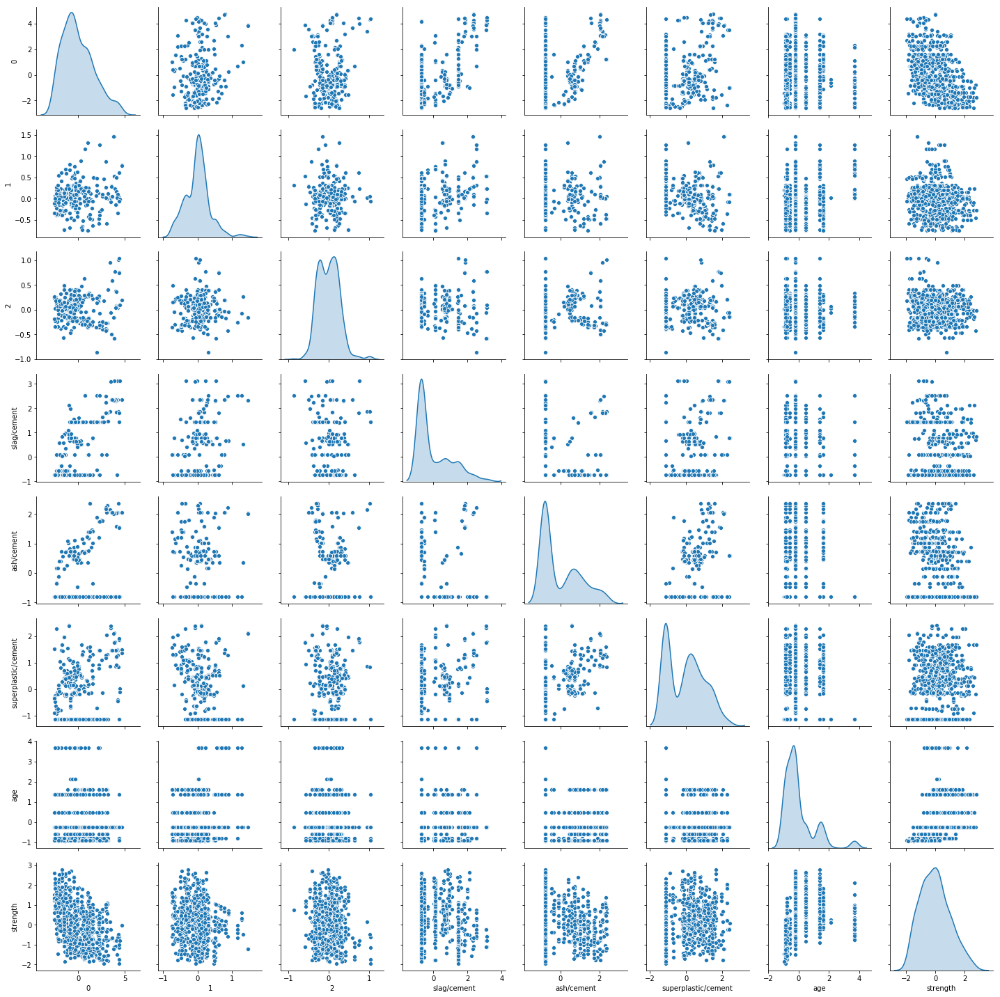

In [1000]:
sns.pairplot(pd.DataFrame(new_concrete_Iter6), diag_kind='kde')

In [1001]:
# The above pair plot shows that thers is no relationship between the independent attributes

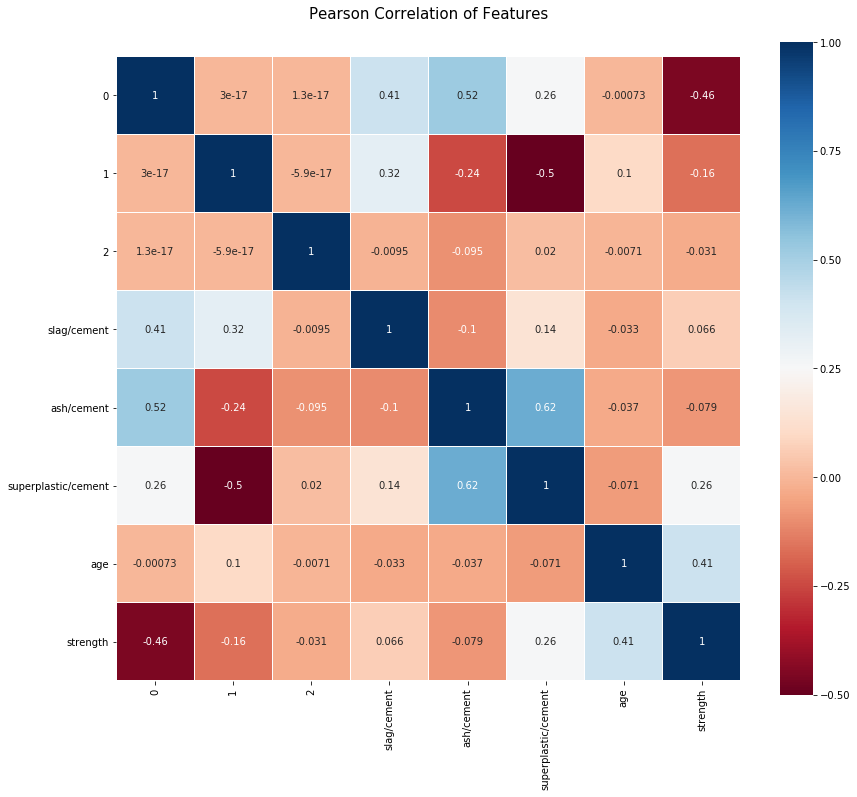

In [1002]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(new_concrete_Iter6.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [1003]:
# Relationship between the independent attributes are removed after applying pca

In [1004]:
X=new_concrete_Iter6.drop('strength',axis=1) # Independent Attribute
y=new_concrete_Iter6.pop('strength') # Dependent Attribute

In [1005]:
X_train,X_test, y_train, y_test=train_test_split(X,y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
num_folds=10
seed=7

## Using Linear Regression

In [1006]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
results=cross_val_score(LR_model,X_train, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.61093026 0.50478945 0.60419189 0.72489998 0.7439498  0.72343451
 0.69908691 0.66826876 0.71694299 0.56522255]


In [1007]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 65.617%
 Standard Deviation : 7.653%


In [1008]:
LR_model.fit(X_train,y_train)
y_pred = LR_model.predict(X_test)

In [1009]:
print("The accuracy score for training set is %12.16f" %LR_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test,y_test))

The accuracy score for training set is 0.6739992630299807
The accuracy score for testing set is 0.6779338569103015


In [1010]:
# r square value for testing
r_square_for_testing=LR_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6779338569103015
The adjusted R Square value for testing set is 0.6750764893543726
The RMSE value for testing set is 0.5397500758057276


Text(0, 0.5, 'y_predict')

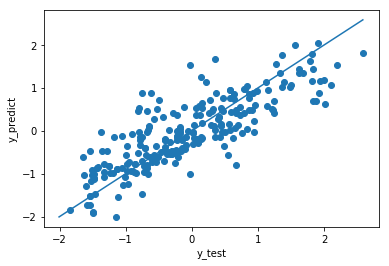

In [1011]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1012]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Linear_Regression_Metrics1

Model performance range with 95 percentage confidence level is : 65.617%  (15.000%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.53975,0.677934,0.675076


In [1013]:
# Inference from the Performance Metrics for Linear Regression Iteration 1
# -----------------------------------------------------------------------------------------------
# Accuracy performance with 95% confidence level at validation data set is : 65.617%  (15.000%)
# Accuracy performance observed at test data set is                        : 67.617%

## Using Polynomial Regression (degree=2)

In [1014]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2 = poly.fit_transform(X_train)
X_test_2 = poly.fit_transform(X_test)

In [1015]:
print(X_train.shape)
print(X_train_2.shape)

(557, 7)
(557, 29)


In [1016]:
# Inference from the shape ofter fitting the transform
# ----------------------------------------------------------------
# The total no.of independent attributes is increased from 7 to 29

In [1017]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
results=cross_val_score(PR2_model,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-3.68791234  0.55250533  0.66484108  0.71601793  0.79357937  0.73579968
  0.73170502  0.70958815  0.79715175  0.68492486]


In [1018]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 26.982%
 Standard Deviation : 132.088%


In [1019]:
PR2_model.fit(X_train_2,y_train)
y_pred = PR2_model.predict(X_test_2)

In [1020]:
print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test_2,y_test))

The accuracy score for training set is 0.7488342153955622
The accuracy score for testing set is 0.7055507899903581


In [1021]:
# r square value for testing
r_square_for_testing=PR2_model.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7055507899903581
The adjusted R Square value for testing set is 0.7029384395846959
The RMSE value for testing set is 0.5160899150018290


Text(0, 0.5, 'y_predict')

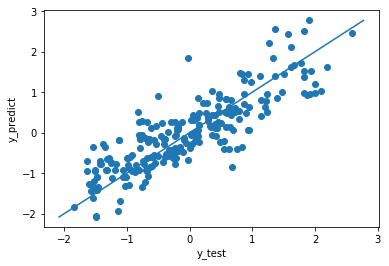

In [1022]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1023]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2=Polynomial_Regression_Metrics1_degree2[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2

Model performance range with 95 percentage confidence level is : 26.982%  (258.893%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2,0.51609,0.705551,0.702938


In [1024]:
Comparison_Table6=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2])
Comparison_Table6

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.53975,0.677934,0.675076
0,Polynomial Regression - degree 2,0.51609,0.705551,0.702938


In [1025]:
# Inference from the accuracy metrics:
# ------------------------------------
# Polynomial Regression with degree=2 performs better than linear regression
# Trying to improve the performance with Ridge and Lasso Regression for Polynomial degree =2

## Using Polynomial Regression (degree=2)  & Ridge Regression

In [1026]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.69904375 0.55424462 0.66477849 0.7159045  0.79327611 0.73604685
 0.73414939 0.71051147 0.79847019 0.6849934 ]


In [1027]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 70.914%  (12.868%)


In [1028]:
ridge.fit(X_train_2,y_train)
print('Ridge model:', (ridge.coef_))

Ridge model: [ 0.         -0.54518356 -0.72996139  0.04229386  0.51686918  0.3012615
  0.1336848   0.62008613  0.09545062 -0.05904349  0.02976448  0.02027375
  0.04749333 -0.11543513  0.57705872  0.08041618 -0.2358497   0.17862479
 -0.23823219  0.23213258  0.22317282 -0.3142014   0.37640653  0.04112121
 -0.11949237  0.23193617 -0.21148456  0.21306021  0.03528554]


In [1029]:
y_pred = ridge.predict(X_test_2)

In [1030]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_2,y_test))

The accuracy score for training set is 0.7487975388477137
The accuracy score for testing set is 0.7061827058161418


In [1031]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7061827058161418
The adjusted R Square value for testing set is 0.7035759617612787
The RMSE value for testing set is 0.5155358287015356


Text(0, 0.5, 'y_predict')

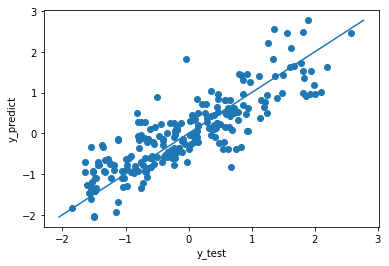

In [1032]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1033]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_ridge=Polynomial_Regression_Metrics1_degree2_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_ridge

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576


In [1034]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 70.914%  (12.868%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576


## Using Polynomial Regression (degree=2)  & Lasso Regression

In [1035]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
results=cross_val_score(lasso,X_train_2, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.27433365 0.21333803 0.18234845 0.2566382  0.30691331 0.26116956
 0.32093738 0.30437742 0.32647482 0.34815887]


In [1036]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 27.947%  (9.743%)


In [1037]:
lasso.fit(X_train_2,y_train)
print('Lasso model:', (lasso.coef_))
y_pred = lasso.predict(X_test_2)

Lasso model: [ 0.         -0.18499556 -0.         -0.          0.          0.
  0.05125068  0.10848818  0.         -0.         -0.          0.
  0.          0.         -0.          0.         -0.         -0.
 -0.         -0.         -0.          0.         -0.         -0.
  0.          0.         -0.          0.          0.        ]


In [1038]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_2,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_2,y_test))

The accuracy score for training set is 0.2984956476115052
The accuracy score for testing set is 0.2879825648751491


In [1039]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_2,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.2879825648751491
The adjusted R Square value for testing set is 0.2816655534101631
The RMSE value for testing set is 0.8025377868221829


Text(0, 0.5, 'y_predict')

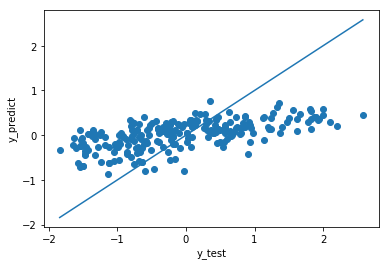

In [1040]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1041]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 27.947%  (9.743%)


In [1042]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree2_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree2_Lasso=Polynomial_Regression_Metrics1_degree2_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree2_Lasso

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666


In [1043]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree2_Lasso])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 27.947%  (9.743%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666


In [1044]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# Lasso performance is too poor for  polynomial Regression 
#---------------------------------------------------------------------------
# The accuracy metrics for 95% confidence level 
#----------------------------------------------------------------------------
# Before using Ridge        : 26.982%  (258.893%) 
# With Ridge Regression     : 70.914%  (12.868%)
# With Lasso Regression     : 27.947%  (9.743%)
# --------------------------------------------------------------------------
# Ridge Regression has better performance than others

## Using Polynomial Regression (degree=3)

In [1045]:
poly=PolynomialFeatures(degree=3, interaction_only=True) #Considering Polynomial degree as 3
X_train_3 = poly.fit_transform(X_train)
X_test_3 = poly.fit_transform(X_test)

In [1046]:
print(X_train.shape)
print(X_train_3.shape)

(557, 7)
(557, 64)


In [1047]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR3_model=linear_model.LinearRegression()
results=cross_val_score(PR3_model,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.72776124 0.46547434 0.54112464 0.70375853 0.75545132 0.71278601
 0.77673357 0.74575512 0.61523531 0.72653682]


In [1048]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : 67.706%
 Standard Deviation : 9.740%


In [1049]:
PR3_model.fit(X_train_3,y_train)
y_pred = PR3_model.predict(X_test_3)

In [1050]:
print("The accuracy score for training set is %12.16f" %PR3_model.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %PR3_model.score(X_test_3,y_test))

The accuracy score for training set is 0.7886950143224836
The accuracy score for testing set is 0.6103687550632060


In [1051]:
# r square value for testing
r_square_for_testing=PR3_model.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6103687550632060
The adjusted R Square value for testing set is 0.6069119506087604
The RMSE value for testing set is 0.5936726801533220


Text(0, 0.5, 'y_predict')

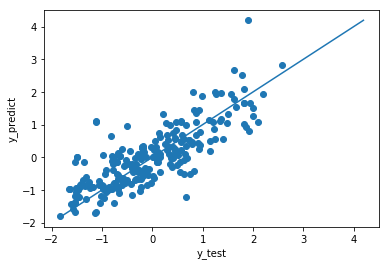

In [1052]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1053]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3 = pd.DataFrame({'Model':['Polynomial Regression - degree 3'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3=Polynomial_Regression_Metrics1_degree3[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3

Model performance range with 95 percentage confidence level is : 67.706%  (19.091%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3,0.593673,0.610369,0.606912


In [1054]:
Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree3])
Comparison_Table6

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666
0,Polynomial Regression - degree 3,0.593673,0.610369,0.606912


In [1055]:
# As the degree increases the performance starts to decrease

## Using Polynomial Regression (degree=3)  & Ridge Regression

In [1056]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
results=cross_val_score(ridge,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.7252625  0.46563258 0.66051989 0.71043749 0.76279662 0.7193883
 0.77502255 0.75463049 0.64515445 0.72196413]


In [1057]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 69.408%  (16.781%)


In [1058]:
ridge.fit(X_train_3,y_train)
y_pred = ridge.predict(X_test_3)

In [1059]:
print("The accuracy score for training set is %12.16f" %ridge.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %ridge.score(X_test_3,y_test))

The accuracy score for training set is 0.7876260118174522
The accuracy score for testing set is 0.5892446178201401


In [1060]:
# r square value for testing
r_square_for_testing=ridge.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.5892446178201401
The adjusted R Square value for testing set is 0.5856004002342605
The RMSE value for testing set is 0.6095534689642566


Text(0, 0.5, 'y_predict')

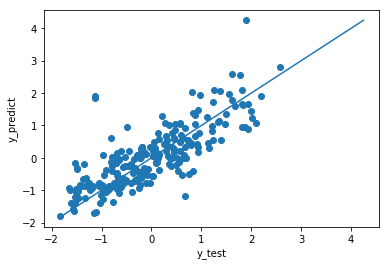

In [1061]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1062]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_ridge = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_ridge=Polynomial_Regression_Metrics1_degree3_ridge[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_ridge

Model performance range with 95 percentage confidence level is : 69.408%  (16.781%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & ridge,0.609553,0.589245,0.5856


In [1063]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree3_ridge])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 69.408%  (16.781%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666
0,Polynomial Regression - degree 3,0.593673,0.610369,0.606912
0,Polynomial Regression - degree 3 & ridge,0.609553,0.589245,0.585600


## Using Polynomial Regression (degree=3)  & Lasso Regression

In [1064]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=10000)
results=cross_val_score(lasso,X_train_3, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[0.27460085 0.21155582 0.18023118 0.2566382  0.30412006 0.26116956
 0.32093738 0.30381056 0.32671771 0.34825527]


In [1065]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : 27.880%  (9.843%)


In [1066]:
lasso.fit(X_train_3,y_train)
y_pred = lasso.predict(X_test_3)

In [1067]:
print("The accuracy score for training set is %12.16f" %lasso.score(X_train_3,y_train))
print("The accuracy score for testing set is %12.16f" %lasso.score(X_test_3,y_test))

The accuracy score for training set is 0.2987994330305036
The accuracy score for testing set is 0.2883305496467800


In [1068]:
# r square value for testing
r_square_for_testing=lasso.score(X_test_3,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.2883305496467800
The adjusted R Square value for testing set is 0.2820166254991595
The RMSE value for testing set is 0.8023416504320448


Text(0, 0.5, 'y_predict')

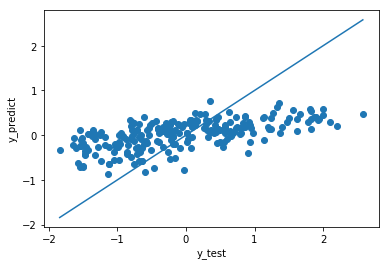

In [1069]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1070]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))


# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree3_Lasso = pd.DataFrame({'Model':['Polynomial Regression - degree 3 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree3_Lasso=Polynomial_Regression_Metrics1_degree3_Lasso[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree3_Lasso

Model performance range with 95 percentage confidence level is : 27.880%  (9.843%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 3 & lasso,0.802342,0.288331,0.282017


In [1071]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree3_Lasso])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 27.880%  (9.843%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666
0,Polynomial Regression - degree 3,0.593673,0.610369,0.606912
0,Polynomial Regression - degree 3 & ridge,0.609553,0.589245,0.585600
0,Polynomial Regression - degree 3 & lasso,0.802342,0.288331,0.282017


In [1072]:
# Inference from the accuracy metrics:
# -------------------------------------------------------------------------
# There is no much difference in performance metrics between polynomial Regression with degree - 2, ridge and lasso
#---------------------------------------------------------------------------
# The accuracy metrics for 95% confidence level 
#----------------------------------------------------------------------------
# Before using Ridge        : 67.706%  (19.091%) 
# With Ridge Regression     : 69.408%  (16.781%)
# With Lasso Regression     : 27.880%  (9.843%)
# --------------------------------------------------------------------------

## Using Polynomial Regression (degree=4)

In [1073]:
poly=PolynomialFeatures(degree=4, interaction_only=True) #Considering Polynomial degree as 4
X_train_4 = poly.fit_transform(X_train)
X_test_4 = poly.fit_transform(X_test)

In [1074]:
kfold=KFold(n_splits=num_folds,random_state=seed)
PR4_model=linear_model.LinearRegression()
results=cross_val_score(PR4_model,X_train_4, y_train, cv=kfold)
print('The score value for all the crossfolds ')
print(results)

The score value for all the crossfolds 
[-9.06987206  0.45949227  0.64743939  0.60944456  0.09567049  0.66652125
  0.78929985  0.74072645  0.42843035  0.72005107]


In [1075]:
print(' Mean Accuracy      : %.3f%%'  % (results.mean()*100.0))
print(' Standard Deviation : %.3f%%'  % (results.std()*100.0))

 Mean Accuracy      : -39.128%
 Standard Deviation : 289.932%


In [1076]:
PR4_model.fit(X_train_4,y_train)
y_pred = PR4_model.predict(X_test_4)

In [1077]:
print("The accuracy score for training set is %12.16f" %PR4_model.score(X_train_4,y_train))
print("The accuracy score for testing set is %12.16f" %PR4_model.score(X_test_4,y_test))

The accuracy score for training set is 0.8092958009240637
The accuracy score for testing set is 0.6081495858980387


In [1078]:
# r square value for testing
r_square_for_testing=PR4_model.score(X_test_4,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.6081495858980387
The adjusted R Square value for testing set is 0.6046730929972608
The RMSE value for testing set is 0.5953609296548933


In [1079]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Model performance range with 95 percentage confidence level is : -39.128%  (568.266%)


In [1080]:
# Calculating Performance Parameters for the test data
Polynomial_Regression_Metrics1_degree4 = pd.DataFrame({'Model':['Polynomial Regression - degree 4'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
Polynomial_Regression_Metrics1_degree4=Polynomial_Regression_Metrics1_degree4[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Polynomial_Regression_Metrics1_degree4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Polynomial Regression - degree 4,0.595361,0.60815,0.604673


In [1081]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Polynomial_Regression_Metrics1_degree4])
Comparison_Table6

Model performance range with 95 percentage confidence level is : -39.128%  (568.266%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2,0.516090,0.705551,0.702938
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,Polynomial Regression - degree 2 & lasso,0.802538,0.287983,0.281666
0,Polynomial Regression - degree 3,0.593673,0.610369,0.606912
0,Polynomial Regression - degree 3 & ridge,0.609553,0.589245,0.585600
0,Polynomial Regression - degree 3 & lasso,0.802342,0.288331,0.282017
0,Polynomial Regression - degree 4,0.595361,0.608150,0.604673


In [1082]:
# As the degree increases from 3 to further the performance starts to decrease

In [1083]:
# Keeping the performance metrics of best model in the comparison table
Comparison_Table6=pd.concat([Linear_Regression_Metrics1,Polynomial_Regression_Metrics1_degree2_ridge])
Comparison_Table6

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576


## Support Vector Regressor

In [1084]:
param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()

In [1085]:
gs=GridSearchCV(SVR_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='auto_deprecated', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': (1, 2, 3, 4), 'degree': (1, 2, 3, 4),
                         'kernel': ('linear', 'rbf', 'poly', 'sigmoid')},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [1086]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8443370476895391
Standard deviation for the best model 0.05636958345209621


In [1087]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 84.434%
 Standard Deviation : 5.63696%


In [1088]:
SVR_optimised_model = gs.best_estimator_
SVR_optimised_model.fit(X_train,y_train)
y_pred = SVR_optimised_model.predict(X_test)

In [1089]:
print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9001753347384769
The accuracy score for testing set is 0.8562280612037450


In [1090]:
# r square value for testing
r_square_for_testing=SVR_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8562280612037450
The adjusted R Square value for testing set is 0.8549525180205082
The RMSE value for testing set is 0.3606261707945294


Text(0, 0.5, 'y_predict')

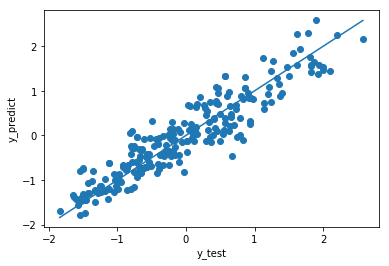

In [1091]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1092]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
SVR_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
SVR_Metrics1=SVR_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
SVR_Metrics1

Model performance range with 95 percentage confidence level is : 84.434%  (11.048%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,SVR,0.360626,0.856228,0.854953


In [1093]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,SVR_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 84.434%  (11.048%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953


In [1094]:
# Inference from the accuracy metrics:
# ------------------------------------
# SVR Performance is better
# The optimised model of SVR is
# SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
#    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
#    tol=0.001, verbose=False)

## KNN Regressor

In [1095]:
X_train_stdscale = preprocessing.scale(X_train)
X_test_stdscale = preprocessing.scale(X_test)
y_train_stdscale = preprocessing.scale(y_train)
y_test_stdscale = preprocessing.scale(y_test)

In [1096]:
param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()

In [1097]:
gs=GridSearchCV(KNN_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'metric': ('euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'),
                         'n_neighbors': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [1098]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.7551852762616842
Standard deviation for the best model 0.07672718053033384


In [1099]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 75.519%
 Standard Deviation : 7.67272%


In [1100]:
KNN_optimised_model = gs.best_estimator_
KNN_optimised_model.fit(X_train_stdscale,y_train_stdscale)
y_pred = KNN_optimised_model.predict(X_test_stdscale)

In [1101]:
print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train_stdscale,y_train_stdscale))
print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test_stdscale,y_test_stdscale))

The accuracy score for training set is 0.8700636492157185
The accuracy score for testing set is 0.7254114804558407


In [1102]:
# r square value for testing
r_square_for_testing=KNN_optimised_model.score(X_test_stdscale,y_test_stdscale)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test_stdscale, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7254114804558407
The adjusted R Square value for testing set is 0.7229753338946124
The RMSE value for testing set is 0.5240119459937523


Text(0, 0.5, 'y_predict')

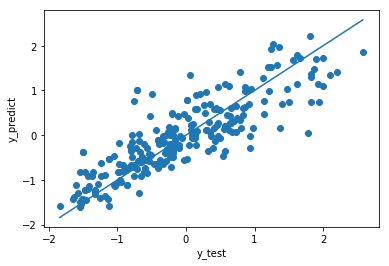

In [1103]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1104]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
KNN_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
KNN_Metrics1=KNN_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
KNN_Metrics1

Model performance range with 95 percentage confidence level is : 75.519%  (15.039%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,KNN,0.524012,0.725411,0.722975


In [1105]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,KNN_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 75.519%  (15.039%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975


In [1106]:
# Inference from the accuracy metrics:
# ------------------------------------
# KNN Performance is poor than SVR.
# It is observered that KNN Performs well for lower strength and poor at higher strength
# The optimised model of KNN is
# KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
#                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
#                    weights='uniform')

## Decision Tree Regressor

In [1107]:
param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

In [1108]:
gs=GridSearchCV(DT_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=1,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mse', 'friedman_mse', 'mae'),
                         'max_depth': (3, 6, 9, 12),
                         'min_samples_split': (2, 50, 100, 150, 200)},
             pre_dis

In [1109]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mae', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.7805238832777929
Standard deviation for the best model 0.06584223775092429


In [1110]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 78.052%
 Standard Deviation : 6.58422%


In [1111]:
DT_optimised_model = gs.best_estimator_
DT_optimised_model.fit(X_train,y_train)
y_pred = DT_optimised_model.predict(X_test)

In [1112]:
print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9815024039822093
The accuracy score for testing set is 0.7767466866040530


In [1113]:
# r square value for testing
r_square_for_testing=DT_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7767466866040530
The adjusted R Square value for testing set is 0.7747659854712626
The RMSE value for testing set is 0.4493855798151725


Text(0, 0.5, 'y_predict')

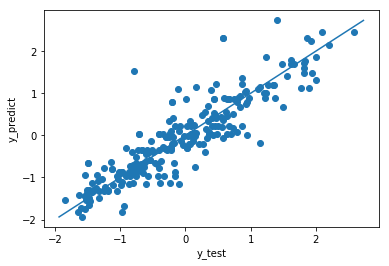

In [1114]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1115]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
DecisionTree_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
DecisionTree_Metrics1=DecisionTree_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
DecisionTree_Metrics1

Model performance range with 95 percentage confidence level is : 78.052%  (12.905%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Decision Tree,0.449386,0.776747,0.774766


In [1116]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,DecisionTree_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 78.052%  (12.905%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766


In [1117]:
# Inference from the accuracy metrics:
# ------------------------------------
# Decision Tree Regressor Performance is better than KNN but poorer than SVR.
# The optimised model of Decision Tree is
# DecisionTreeRegressor(criterion='mae', max_depth=12, max_features=None,
#                      max_leaf_nodes=None, min_impurity_decrease=0.0,
#                      min_impurity_split=None, min_samples_leaf=1,
#                      min_samples_split=2, min_weight_fraction_leaf=0.0,
#                      presort=False, random_state=1, splitter='best')

## Bagging Regressor

In [1118]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)

In [1119]:
gs=GridSearchCV(Bagging_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=BaggingRegressor(base_estimator=None, bootstrap=True,
                                        bootstrap_features=False,
                                        max_features=1.0, max_samples=0.7,
                                        n_estimators=10, n_jobs=None,
                                        oob_score=True, random_state=1,
                                        verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [1120]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'n_estimators': 150}
The model which produce best score is 0.8604021101066425
Standard deviation for the best model 0.054396704181381796


In [1121]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 86.040%
 Standard Deviation : 5.43967%


In [1122]:
Bagging_optimised_model = gs.best_estimator_
Bagging_optimised_model.fit(X_train,y_train)
y_pred = Bagging_optimised_model.predict(X_test)

In [1123]:
print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9643610938283552
The accuracy score for testing set is 0.8733682024589298


In [1124]:
# r square value for testing
r_square_for_testing=Bagging_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8733682024589298
The adjusted R Square value for testing set is 0.8722447264351180
The RMSE value for testing set is 0.3384476957700447


Text(0, 0.5, 'y_predict')

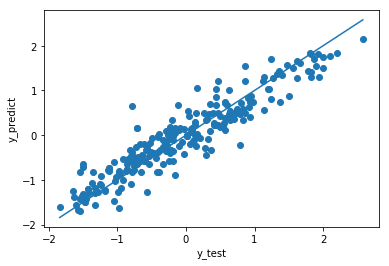

In [1125]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1126]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Bagging_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Bagging_Metrics1=Bagging_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Bagging_Metrics1

Model performance range with 95 percentage confidence level is : 86.040%  (10.662%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Bagging,0.338448,0.873368,0.872245


In [1127]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Bagging_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 86.040%  (10.662%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766
0,Bagging,0.338448,0.873368,0.872245


In [1128]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance
# The optimised model of Bagging Regressor is
# BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
#                 max_features=1.0, max_samples=0.7, n_estimators=150,
#                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
#                 warm_start=False)

## Adaboost Regressor

In [1129]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)

In [1130]:
gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=1.0,
                                         loss='linear', n_estimators=50,
                                         random_state=1),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': (1.0, 0.8, 0.6, 0.4),
                         'n_estimators': (25, 50, 100, 150, 200)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [1131]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'learning_rate': 0.4, 'n_estimators': 200}
The model which produce best score is 0.7596896709279809
Standard deviation for the best model 0.0561246990409214


In [1132]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 75.969%
 Standard Deviation : 5.61247%


In [1133]:
Adaboost_optimised_model = gs.best_estimator_
Adaboost_optimised_model.fit(X_train,y_train)
y_pred = Adaboost_optimised_model.predict(X_test)

In [1134]:
print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.8075787378388569
The accuracy score for testing set is 0.7320714555161038


In [1135]:
# r square value for testing
r_square_for_testing=Adaboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.7320714555161038
The adjusted R Square value for testing set is 0.7296943961860819
The RMSE value for testing set is 0.4922998100415186


Text(0, 0.5, 'y_predict')

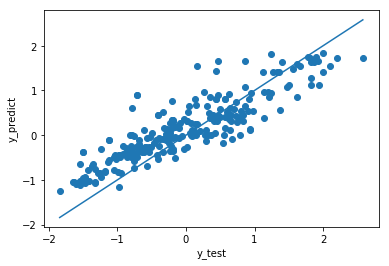

In [1136]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1137]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Adaboost_Metrics1 = pd.DataFrame({'Model':['Adaboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Adaboost_Metrics1=Adaboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Adaboost_Metrics1

Model performance range with 95 percentage confidence level is : 75.969%  (11.000%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Adaboost,0.4923,0.732071,0.729694


In [1138]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Adaboost_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 75.969%  (11.000%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766
0,Bagging,0.338448,0.873368,0.872245
0,Adaboost,0.492300,0.732071,0.729694


In [1139]:
# Inference from the accuracy metrics:
# ------------------------------------
# Bagging has the excellent better performance than Ada Boosting
# The optimised model of AdaBoost Regressor is
# AdaBoostRegressor(base_estimator=None, learning_rate=0.4, loss='linear',
#                  n_estimators=200, random_state=1)

## Gradient Boosting Regressor

In [1140]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)

In [1141]:
gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=GradientBoostingRegressor(alpha=0.9,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
               

In [1142]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 5, 'n_estimators': 200}
The model which produce best score is 0.8775841563977655
Standard deviation for the best model 0.05428953953626455


In [1143]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 87.758%
 Standard Deviation : 5.42895%


In [1144]:
Gradientboost_optimised_model = gs.best_estimator_
Gradientboost_optimised_model.fit(X_train,y_train)
y_pred = Gradientboost_optimised_model.predict(X_test)

In [1145]:
print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9920918510819318
The accuracy score for testing set is 0.9082161952027515


In [1146]:
# r square value for testing
r_square_for_testing=Gradientboost_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.9082161952027515
The adjusted R Square value for testing set is 0.9074018902172246
The RMSE value for testing set is 0.2881397693981067


Text(0, 0.5, 'y_predict')

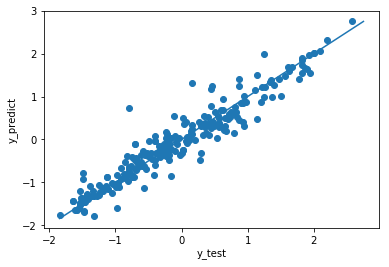

In [1147]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1148]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
Gradientboost_Metrics1 = pd.DataFrame({'Model':['Gradientboost'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
Gradientboost_Metrics1=Gradientboost_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
Gradientboost_Metrics1

Model performance range with 95 percentage confidence level is : 87.758%  (10.641%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Gradientboost,0.28814,0.908216,0.907402


In [1149]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,Gradientboost_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 87.758%  (10.641%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766
0,Bagging,0.338448,0.873368,0.872245
0,Adaboost,0.492300,0.732071,0.729694
0,Gradientboost,0.288140,0.908216,0.907402


In [1150]:
# Inference from the accuracy metrics:
# ------------------------------------
# Gradient Boosting Performance is better
# The optimised model of Gradient Boosting Regressor is
# GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=5,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)

## Random Forest Regressor

In [1151]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)

In [1152]:
gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
gs.fit(X_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestRegressor(bootstrap=True, criterion='mse',
                                             max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators='warn', n_jobs=None,
                                             oob_score=False, random_state=1,
                                             verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ('mae', 'mse'), 'max

In [1153]:
print('The best parameter is', gs.best_params_)
print('The model which produce best score is', gs.best_score_)
print('Standard deviation for the best model', gs.cv_results_['std_test_score'][gs.best_index_])

The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 25}
The model which produce best score is 0.8618053325262073
Standard deviation for the best model 0.0505979856451621


In [1154]:
print(' Mean Accuracy      : %.3f%%'  % (gs.best_score_*100.0))
print(' Standard Deviation : %.5f%%'  % (gs.cv_results_['std_test_score'][gs.best_index_]*100.0))

 Mean Accuracy      : 86.181%
 Standard Deviation : 5.05980%


In [1155]:
RandomForest_optimised_model = gs.best_estimator_
RandomForest_optimised_model.fit(X_train,y_train)
y_pred = RandomForest_optimised_model.predict(X_test)

In [1156]:
print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train,y_train))
print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test,y_test))

The accuracy score for training set is 0.9675080593691112
The accuracy score for testing set is 0.8783952457395410


In [1157]:
# r square value for testing
r_square_for_testing=RandomForest_optimised_model.score(X_test,y_test)
print("R Square value for test dataset is %12.16f" %r_square_for_testing)

# Adjusted R square value
adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(y)-1)/(len(y)-X.shape[1]-1)
print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)


#Computing MSE & RMSE
mse=mean_squared_error(y_test, y_pred)
rmse=np.sqrt(mse)
print("The RMSE value for testing set is %12.16f" %rmse)

R Square value for test dataset is 0.8783952457395410
The adjusted R Square value for testing set is 0.8773163695927435
The RMSE value for testing set is 0.3316617996985600


Text(0, 0.5, 'y_predict')

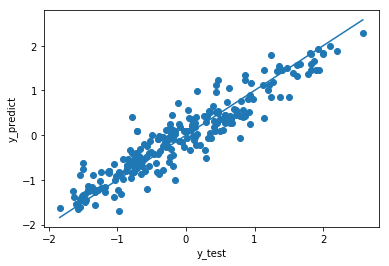

In [1158]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_pred)
ax.plot([min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))], [min(min(y_test),min(y_pred)), max(max(y_test),max(y_pred))])
plt.xlabel('y_test')
plt.ylabel('y_predict')

In [1159]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

# Calculating Performance Parameters for the test data
RandomForest_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                       'RMSE': rmse,
                                       'R Square Value': r_square_for_testing, 
                                       'Adjusted R Square Value' : adjusted_r_squared})
RandomForest_Metrics1=RandomForest_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
RandomForest_Metrics1

Model performance range with 95 percentage confidence level is : 86.181%  (9.917%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Random Forest,0.331662,0.878395,0.877316


In [1160]:
# Calculating the Performance of the model at validation test with 95% Confidence Level
print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'   % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

Comparison_Table6=pd.concat([Comparison_Table6,RandomForest_Metrics1])
Comparison_Table6

Model performance range with 95 percentage confidence level is : 86.181%  (9.917%)


,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766
0,Bagging,0.338448,0.873368,0.872245
0,Adaboost,0.492300,0.732071,0.729694
0,Gradientboost,0.288140,0.908216,0.907402
0,Random Forest,0.331662,0.878395,0.877316


In [1161]:
# Inference from the accuracy metrics:
# ------------------------------------
# Random Forest Regressor has poorer Performance than Gradient Boosting Regressor
# The optimised model of Random Forest RegressorGradient Boosting Regressor is
# RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=2,
#                      min_weight_fraction_leaf=0.0, n_estimators=25,
#                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
#                      warm_start=False)

In [1162]:
# Summary of Iteration 6:
# -------------------------
# Duplicate Data were removed 
# Outliers were observed and removed
# Feature Engineering were done
# pca was applied to the independent attributes having high relationships
# Gradient Boost regressor has the best performance with 90.82 Score in training dataset
# The model has the performance range  87.758%  (10.641%) with 95% confidence level

In [1163]:
#  Comparing iteration 2, 4 and 6
#  i.e after outliers were observed and removed.

In [1164]:
Comparison_Table2

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.589603,0.690410,0.687679
0,Polynomial Regression - degree 2 & ridge,8.182952,0.719029,0.716551
0,SVR,0.415405,0.827439,0.825917
0,KNN,0.579235,0.664487,0.661527
0,Decision Tree,7.590679,0.758230,0.756097
0,Bagging,6.071565,0.845317,0.843953
0,Adaboost,7.804170,0.744439,0.742185
0,Gradientboost,5.297433,0.882247,0.881208
0,Random Forest,5.932339,0.852330,0.851027


In [1165]:
Comparison_Table4

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,8.887346,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,8.538338,0.702732,0.700095
0,Polynomial Regression - degree 2 & lasso,9.082830,0.663610,0.660625
0,SVR,0.378462,0.856766,0.855496
0,KNN,0.454167,0.793733,0.791903
0,Decision Tree,6.877912,0.807108,0.805397
0,Bagging,5.467272,0.878117,0.877036
0,Adaboost,7.545417,0.767851,0.765791
0,Gradientboost,4.804654,0.905871,0.905035
0,Random Forest,5.543089,0.874713,0.873602


In [1166]:
Comparison_Table6

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.539750,0.677934,0.675076
0,Polynomial Regression - degree 2 & ridge,0.515536,0.706183,0.703576
0,SVR,0.360626,0.856228,0.854953
0,KNN,0.524012,0.725411,0.722975
0,Decision Tree,0.449386,0.776747,0.774766
0,Bagging,0.338448,0.873368,0.872245
0,Adaboost,0.492300,0.732071,0.729694
0,Gradientboost,0.288140,0.908216,0.907402
0,Random Forest,0.331662,0.878395,0.877316


In [1167]:
# Comparing Iteration 2, 4 and 6:
# -------------------------------------------------------
# Iteration 2: Removing Duplicate data
#              Outliers were observed and removed
#              Without feature engineering
# Iteration 4: Removing Duplicate data
#              Outliers were observed and removed
#              With feature engineering
# Iteration 6: Removing Duplicate data
#              Outliers were observed and removed
#              With feature engineering
#              pca were applied to highly dependent independent attributes
# --------------------------------------------------------------------
# The performance at Iteration 4 and 6 is better than Iteration 2
# Gradient Boost Regressor at Iteration 4 gives the performance 
# Gradient Boost regressor has the best performance with 90.58% Score in training dataset
# The model has the performance range 87.579%  (8.809%) with 95% confidence level
# Optimized Model is
# -----------------
# GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=3,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)
# Gradient Boost Regressor at Iteration 6 gives the performance 
# Gradient Boost regressor has the best performance with 90.82% Score in training dataset
# The model has the performance range 87.758%  (10.641%) with 95% confidence level
# Optimized Model is
# -----------------
# GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
#                          learning_rate=0.1, loss='ls', max_depth=5,
#                          max_features=None, max_leaf_nodes=None,
#                          min_impurity_decrease=0.0, min_impurity_split=None,
#                          min_samples_leaf=1, min_samples_split=2,
#                          min_weight_fraction_leaf=0.0, n_estimators=200,
#                          n_iter_no_change=None, presort='auto', random_state=1,
#                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
#                          verbose=0, warm_start=False)



# Iteration 7
1. Removing duplicate data
2. Outliers are not treated and kept as it is
3. Grouping into 3 clusters and observed the performance

In [517]:
# Removing Duplicate Data
concrete_Iter7=concrete_df.copy(deep=True)
concrete_Iter7.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter7.shape

(1005, 9)

In [518]:
concrete_Iter7_z=concrete_Iter7.apply(zscore) # Applying Z-scores
X_z=concrete_Iter7_z.drop('strength',axis=1)  # Doing clusting only to the independent attributes
X_z.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

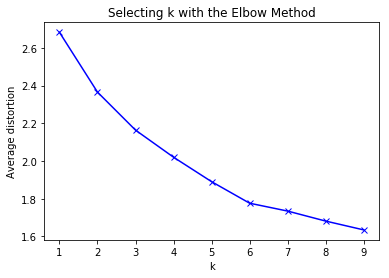

In [519]:
# Finding optimal no. of clusters
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(X_z)
    prediction=model.predict(X_z)
    meanDistortions.append(sum(np.min(cdist(X_z, model.cluster_centers_, 'euclidean'), axis=1)) / X_z.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [520]:
# Let us first start with K = 3, since most of independent attribute in the given dataset has 3 gaussians
for K in range(200):  # Iterating for multiple time to obtain the stable cluster
    final_model=KMeans(3)
    final_model.fit(X_z)
    prediction=final_model.predict(X_z)

#Append the prediction 
concrete_Iter7["GROUP"] = prediction
print("Groups Assigned : \n")
concrete_Iter7.head()

Groups Assigned : 



,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,GROUP
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,0
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,2
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,2
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,0
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,0


In [521]:
finalClust = concrete_Iter7.groupby(['GROUP'])
finalClust.mean()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
GROUP,,,,,,,,,
0,225.227070,177.675478,25.992675,190.526752,4.704777,946.706688,748.199045,36.742038,34.077643
1,366.487970,10.021429,4.146617,194.635714,0.589098,1001.108647,753.492481,73.323308,33.848947
2,263.099765,32.818588,109.527765,167.969882,10.422118,978.089176,802.795765,35.400000,36.993953


In [522]:
finalClust.count()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
GROUP,,,,,,,,,
0,314,314,314,314,314,314,314,314,314
1,266,266,266,266,266,266,266,266,266
2,425,425,425,425,425,425,425,425,425


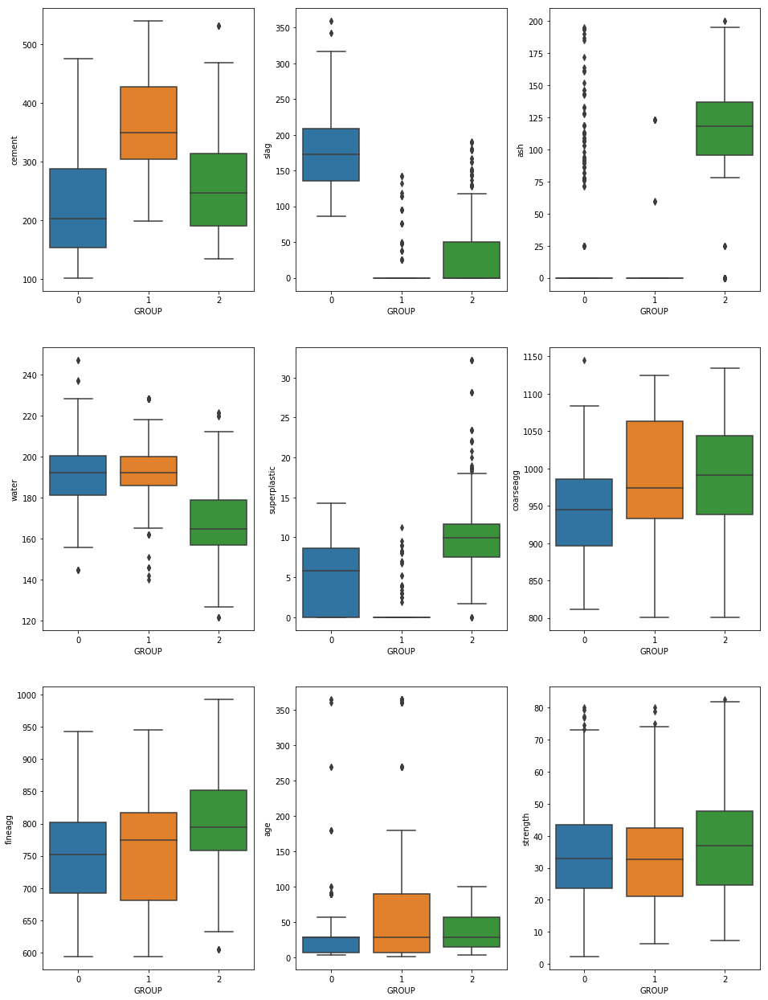

In [523]:
# Observing the outliers in the modified dataset using box plot
f, axes = plt.subplots(3, 3, figsize=(16, 22), sharex=True)
subplot(3,3,1)
sns.boxplot(concrete_Iter7['GROUP'],concrete_Iter7['cement'])
subplot(3,3,2)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['slag'])
subplot(3,3,3)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['ash'])
subplot(3,3,4)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['water'])
subplot(3,3,5)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['superplastic'])
subplot(3,3,6)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['coarseagg'])
subplot(3,3,7)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['fineagg'])
subplot(3,3,8)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['age'])
subplot(3,3,9)
sns.boxplot(concrete_Iter7['GROUP'], concrete_Iter7['strength'])
plt.show()

In [524]:
#Append the prediction 
X_z["GROUP"] = prediction
print("Groups Assigned : \n")
X_z.head()

Groups Assigned : 



,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312,0
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082,2
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312,2
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312,0
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C295D69710>,
      dtype=object)

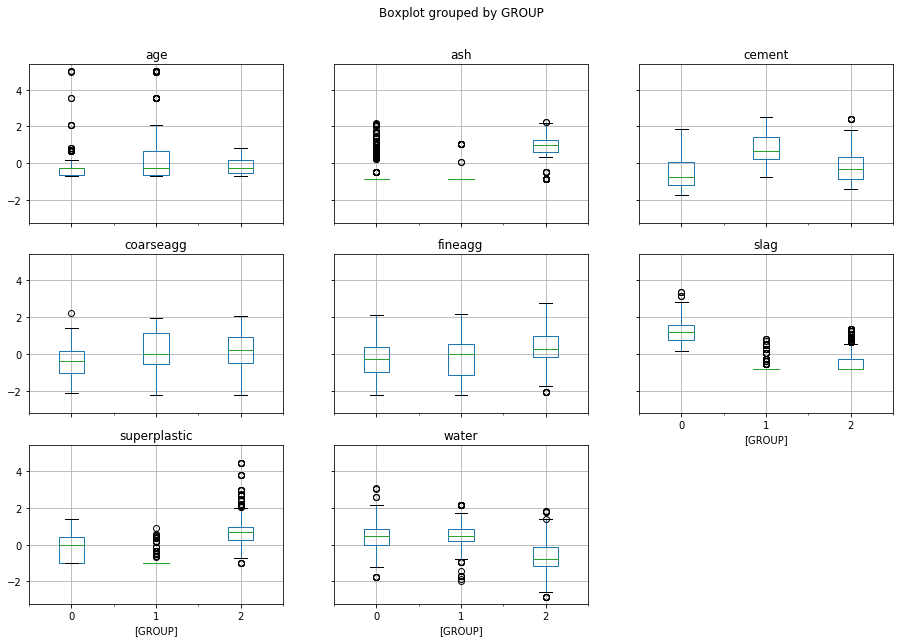

In [525]:
X_z.boxplot(by = 'GROUP',figsize=(15, 10))

In [526]:
# Trying to handle the outliers
# As per the domain expert suggestion if the outliers are replaced with median it changes the rations between all ingrediants
# Tried out and observed poor prediction
# If outliers are removed huge data loss occur since only less no. of datapoints in each clusters
# So observed outlers are kept as it is without treating it

#data = X_z  # lazy to type long names. Renaming it to data. Remember data is not a copy of the dataframe
#def replace(group):
#    median, std = group.median(), group.std()  #Get the median and the standard deviation of every group 
#    outliers = (group - median).abs() > 2*std # Subtract median from every member of each group. Take absolute values > 2std
#    group[outliers] = group.median()       
#    return group

#data_corrected = (data.groupby('GROUP').transform(replace)) 
#concat_data = data_corrected.join(pd.DataFrame(X_z['GROUP']))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C3038F1438>,
      dtype=object)

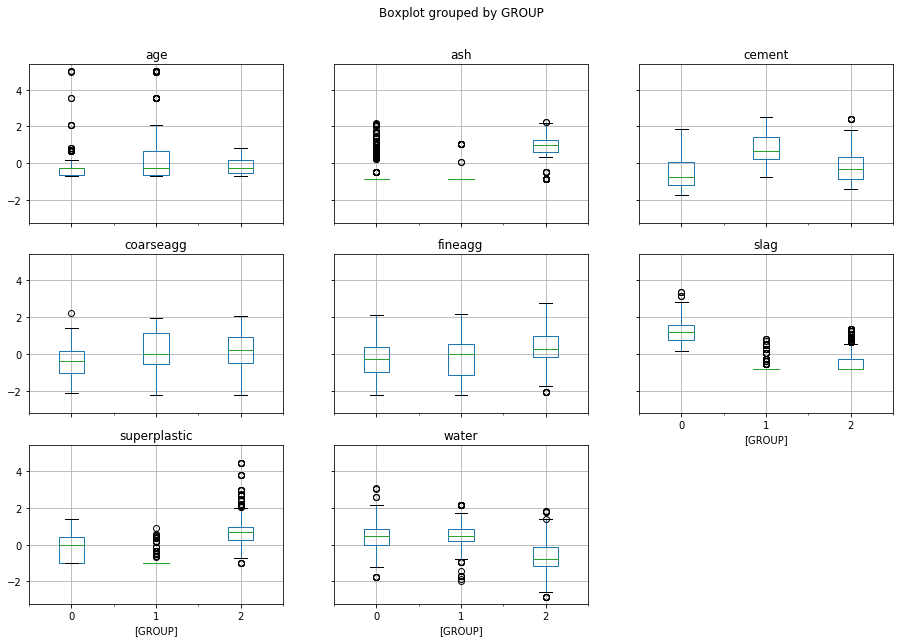

In [527]:
concat_data=X_z
concat_data.boxplot(by = 'GROUP', figsize=(15, 10))


In [528]:
concat_data.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312,0
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082,2
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312,2
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312,0
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312,0


In [529]:
concat_data['strength']=concrete_Iter7_z['strength']
concat_data.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP,strength
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312,0,-0.329328
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082,2,-0.721299
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312,2,-0.370491
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312,0,0.651214
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312,0,-1.042003


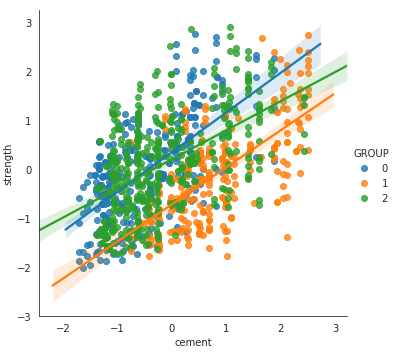

In [530]:
# strength vs cement
var = 'cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

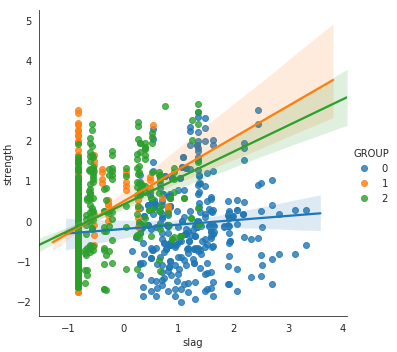

In [531]:
# strength vs slag
var = 'slag'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

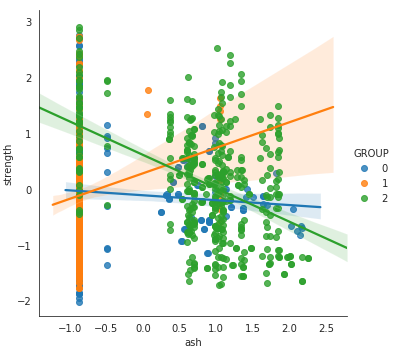

In [532]:
# strength vs ash
var = 'ash'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

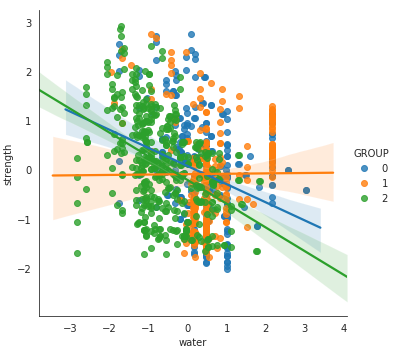

In [533]:
# strength vs water
var = 'water'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

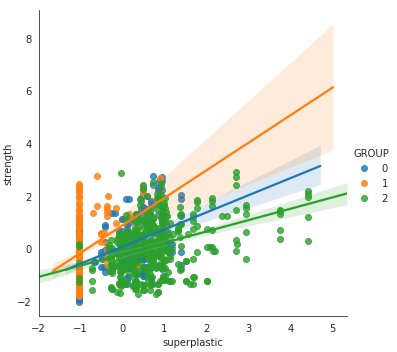

In [534]:
# strength vs superplastic
var = 'superplastic'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

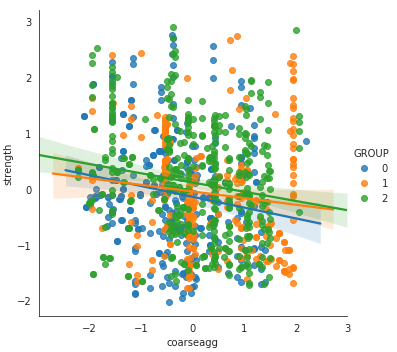

In [535]:
# strength vs coarseagg
var = 'coarseagg'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

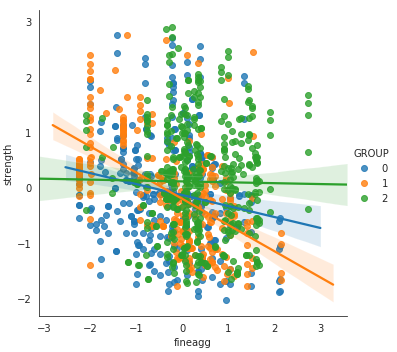

In [536]:
# strength vs fineagg

var = 'fineagg'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

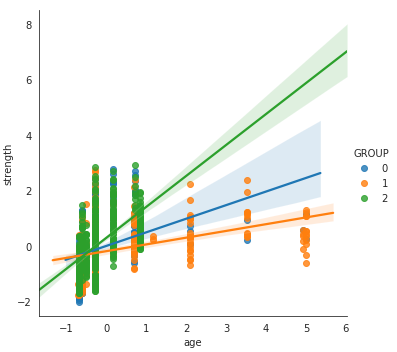

In [537]:
# strength vs age
var = 'age'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

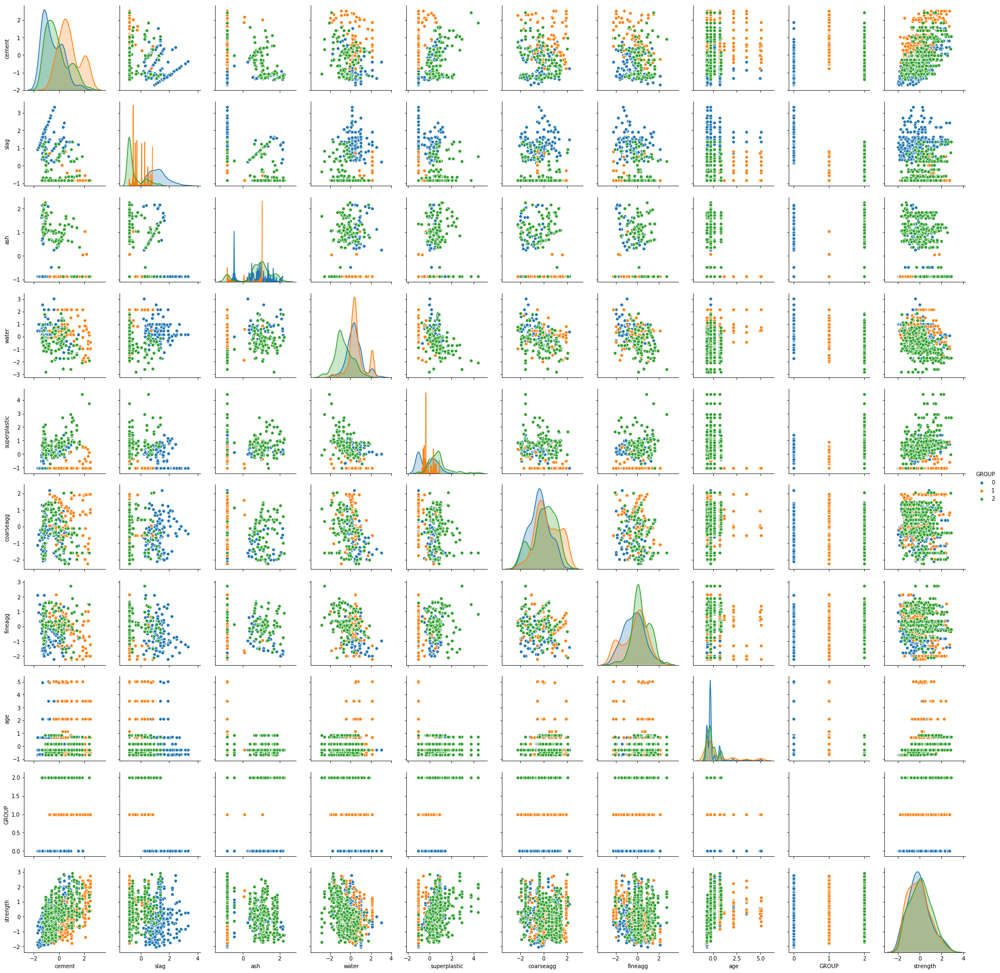

In [538]:
sns.pairplot(concat_data, diag_kind='kde',hue='GROUP')

In [539]:
data_cluster=concat_data
data_cluster['GROUP']=prediction
data_cluster.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP,strength
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312,0,-0.329328
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082,2,-0.721299
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312,2,-0.370491
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312,0,0.651214
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312,0,-1.042003


In [540]:
# Let us break the data int0 3 groups
Group1 = data_cluster[data_cluster['GROUP']==0]
Group2 = data_cluster[data_cluster['GROUP']==1]
Group3 = data_cluster[data_cluster['GROUP']==2]

In [541]:
Group1.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP,strength
0,-1.316792,1.624984,-0.865375,1.004499,-1.019640,-0.033232,-0.301222,-0.280312,0,-0.329328
3,-0.121115,0.487142,-0.865375,2.153185,-1.019640,-0.546508,-1.278800,-0.280312,0,0.651214
4,-1.187348,1.292920,-0.865375,0.526271,0.518296,0.941736,-0.946299,-0.280312,0,-1.042003
6,-1.072287,2.068510,-0.865375,1.004499,-1.019640,0.015775,-0.997357,-0.609967,0,-1.198054
9,-1.185431,1.299886,1.362872,0.559090,0.501395,-1.217121,-0.917657,-0.280312,0,-0.384622


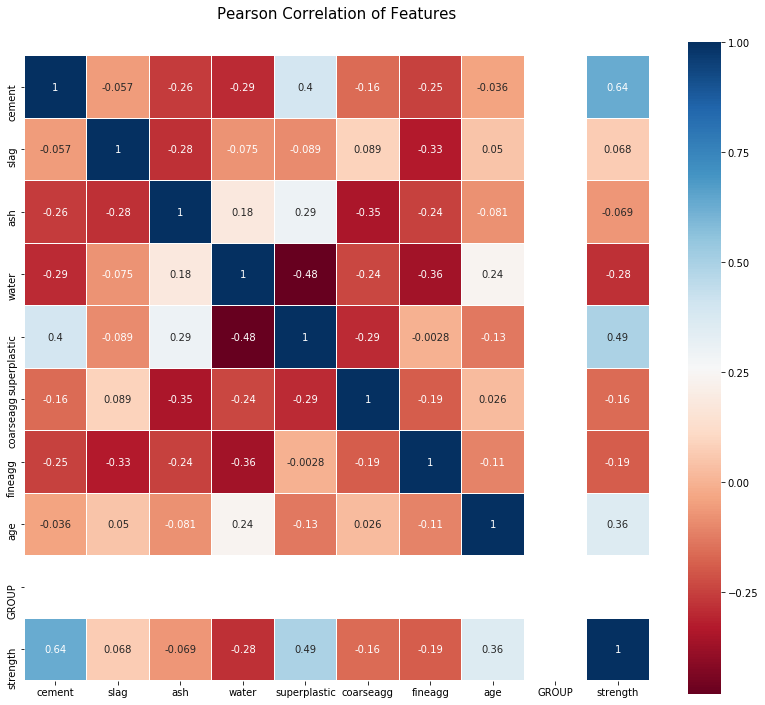

In [542]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group1.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [543]:
# Group 1- Order of importance
# -----------------------------
# Cement          0.54
# Age             0.53
# Ash           - 0.46
# Water         - 0.42
# Slag            0.4
# Superplastic  - 0.38


In [544]:
Group2.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP,strength
5,-0.226588,-0.836471,-0.865375,0.465320,-1.019640,-1.090736,2.145838,0.692955,1,-0.822671
8,0.166538,-0.836471,-0.865375,0.465320,-1.019640,1.426640,-0.095744,-0.280312,1,-0.835573
12,1.019909,-0.836471,-0.865375,0.184009,-1.019640,-0.108031,-0.120650,-0.500082,1,-0.450360
17,0.550075,-0.836471,-0.865375,-0.003532,-0.512629,0.149897,0.551824,-0.280312,1,0.590391
19,0.326665,-0.836471,-0.865375,-0.186384,0.332391,0.326578,0.616581,-0.280312,1,-0.623614


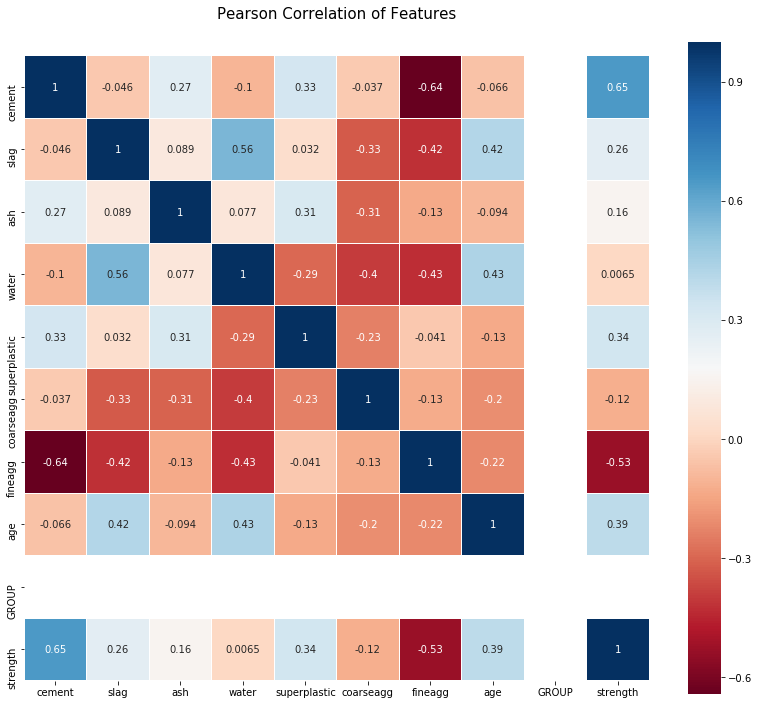

In [545]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group2.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [546]:
# Group 2- Order of importance
# -----------------------------
# Cement          0.65
# Fineagg        -0.53
# Age             0.39
# Superplastic    0.34
# Slag            0.26

In [547]:
Group3.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP,strength
1,-1.052152,-0.346502,1.071486,-1.114710,0.805602,1.372475,0.292797,-0.500082,2,-0.721299
2,-0.274530,-0.836471,0.625836,0.249648,-0.090119,-0.225388,1.102257,-0.280312,2,-0.370491
7,-0.261106,-0.836471,0.977993,0.301222,0.061985,0.696704,-0.186652,0.159228,2,0.085375
10,-1.216114,1.231384,1.295869,-0.683366,2.073132,-0.391751,-0.972451,-0.280312,2,0.067558
18,-0.843124,-0.836471,1.088626,-0.936546,0.298590,1.491122,0.389932,-0.672758,2,-1.241675


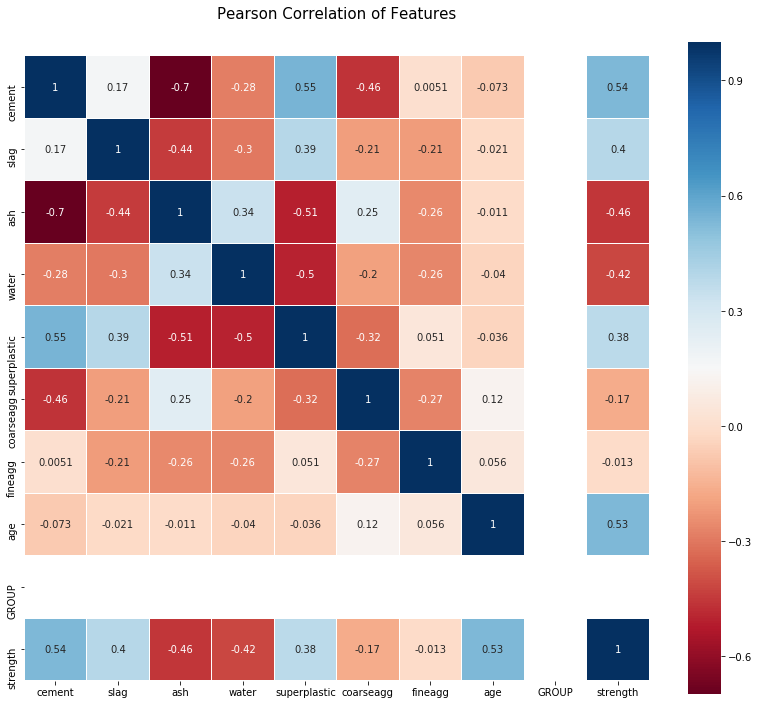

In [548]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group3.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [549]:
# Group 3- Order of importance
# -----------------------------
# Cement          0.64
# Age             0.36
# Superplastic    0.49
# Water          -0.28

In [550]:
Group1.drop(['GROUP'], axis=1, inplace=True)
Group1_X=Group1.drop('strength',axis=1) # Independent Attribute
Group1_y=Group1.pop('strength') # Dependent Attribute

Group2.drop(['GROUP'], axis=1, inplace=True)
Group2_X=Group2.drop('strength',axis=1) # Independent Attribute
Group2_y=Group2.pop('strength') # Dependent Attribute

Group3.drop(['GROUP'], axis=1, inplace=True)
Group3_X=Group3.drop('strength',axis=1) # Independent Attribute
Group3_y=Group3.pop('strength') # Dependent Attribute

Group1_X_train,Group1_X_test, Group1_y_train, Group1_y_test=train_test_split(Group1_X,Group1_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group2_X_train,Group2_X_test, Group2_y_train, Group2_y_test=train_test_split(Group2_X,Group2_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group3_X_train,Group3_X_test, Group3_y_train, Group3_y_test=train_test_split(Group3_X,Group3_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios

GroupX=[Group1_X, Group2_X, Group3_X]
Groupy=[Group1_y, Group2_y, Group3_y]

X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

num_folds=10
seed=7

## Using Linear Regression

In [551]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(LR_model,X_train[K], y_train[K], cv=kfold)
    LR_model.fit(X_train[K],y_train[K])
    y_pred = LR_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %LR_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=LR_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=x[0]
Group2_comparisonTable=x[1]
Group3_comparisonTable=x[2]

Group 1
-------
The accuracy score for training set is 0.6901792926425271
The accuracy score for testing set is 0.5900297118710517
Model performance range with 95 percentage confidence level is : 54.283%  (53.512%)


Group 2
-------
The accuracy score for training set is 0.6633971003681216
The accuracy score for testing set is 0.7298174390584740
Model performance range with 95 percentage confidence level is : 52.192%  (38.685%)


Group 3
-------
The accuracy score for training set is 0.7363494909600026
The accuracy score for testing set is 0.7928878441092744
Model performance range with 95 percentage confidence level is : 68.610%  (21.168%)




## Using Polynomial Regression (degree=2)

In [552]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2_G1 = poly.fit_transform(Group1_X_train)
X_test_2_G1 = poly.fit_transform(Group1_X_test)
X_train_2_G2 = poly.fit_transform(Group2_X_train)
X_test_2_G2 = poly.fit_transform(Group2_X_test)
X_train_2_G3 = poly.fit_transform(Group3_X_train)
X_test_2_G3 = poly.fit_transform(Group3_X_test)


X_train=[X_train_2_G1, X_train_2_G2, X_train_2_G3]
X_test=[X_test_2_G1, X_test_2_G2, X_test_2_G3]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]


kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(PR2_model,X_train[K], y_train[K], cv=kfold)
    PR2_model.fit(X_train[K],y_train[K])
    y_pred = PR2_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=PR2_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.8122492414788335
The accuracy score for testing set is 0.7393049478860272
Model performance range with 95 percentage confidence level is : 17.863%  (278.797%)


Group 2
-------
The accuracy score for training set is 0.8562532962360144
The accuracy score for testing set is -102427169344678166528.0000000000000000
Model performance range with 95 percentage confidence level is : -1068161095697654639230976.000%  (5926917540157044008419328.000%)


Group 3
-------
The accuracy score for training set is 0.8226290020672521
The accuracy score for testing set is 0.7029697895359266
Model performance range with 95 percentage confidence level is : 67.157%  (29.825%)




## Using Polynomial Regression (degree=2)  & Ridge Regression

In [553]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(ridge,X_train[K], y_train[K], cv=kfold)
    ridge.fit(X_train[K],y_train[K])
    y_pred = ridge.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %ridge.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %ridge.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=ridge.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.8276834668207110
The accuracy score for testing set is 0.7181388760506430
Model performance range with 95 percentage confidence level is : 54.030%  (81.274%)


Group 2
-------
The accuracy score for training set is 0.8474490465146982
The accuracy score for testing set is 0.6539624890138871
Model performance range with 95 percentage confidence level is : 61.173%  (71.507%)


Group 3
-------
The accuracy score for training set is 0.8215644232732031
The accuracy score for testing set is 0.6950798141698409
Model performance range with 95 percentage confidence level is : 67.684%  (29.636%)




## Using Polynomial Regression (degree=2)  & Lasso Regression

In [554]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(lasso,X_train[K], y_train[K], cv=kfold)
    lasso.fit(X_train[K],y_train[K])
    y_pred = lasso.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %lasso.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %lasso.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=lasso.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.3205234517087852
The accuracy score for testing set is 0.2857772666374195
Model performance range with 95 percentage confidence level is : 19.142%  (29.937%)


Group 2
-------
The accuracy score for training set is 0.4217779811333562
The accuracy score for testing set is 0.4652392207206834
Model performance range with 95 percentage confidence level is : 37.242%  (16.381%)


Group 3
-------
The accuracy score for training set is 0.1486459960886062
The accuracy score for testing set is 0.1836035448000408
Model performance range with 95 percentage confidence level is : 9.735%  (8.891%)




## Support Vector Regressor

In [555]:
X_train_scale1 = preprocessing.scale(Group1_X_train)
X_test_scale1 = preprocessing.scale(Group1_X_test)
y_train_scale1 = preprocessing.scale(Group1_y_train)
y_test_scale1 = preprocessing.scale(Group1_y_test)
X_train_scale2 = preprocessing.scale(Group2_X_train)
X_test_scale2 = preprocessing.scale(Group2_X_test)
y_train_scale2 = preprocessing.scale(Group2_y_train)
y_test_scale2 = preprocessing.scale(Group2_y_test)
X_train_scale3 = preprocessing.scale(Group3_X_train)
X_test_scale3 = preprocessing.scale(Group3_X_test)
y_train_scale3 = preprocessing.scale(Group3_y_train)
y_test_scale3 = preprocessing.scale(Group3_y_test)


X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(SVR_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    SVR_optimised_model = gs.best_estimator_
    SVR_optimised_model.fit(X_train[K],y_train[K])
    y_pred = SVR_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=SVR_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8035971853012263
Standard deviation for the best model 0.09848836317654541
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.9440431967654075
The accuracy score for testing set is 0.8088226988794431
R Square value for test dataset is 0.8088226988794431
Model performance range with 95 percentage confidence level is : 80.360%  (19.304%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.7796886484909022
Standard deviation for the best model 0.134633558514386
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.9245992500592924
The accuracy score for testing set is 0.7185179575244602
R Square value for test dataset is 0.7185179575244602
Model performance range with 95 percentage confidence level is : 77.969%  (26.388%)


Group 3
-------
The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8016468714292221
Standard deviation for the best model 0.10150408684777808
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score 

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


## KNN Regressor

In [556]:
X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()


for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(KNN_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    KNN_optimised_model = gs.best_estimator_
    KNN_optimised_model.fit(X_train[K],y_train[K])
    y_pred = KNN_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=KNN_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')


Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 1}
The model which produce best score is 0.5786312768343611
Standard deviation for the best model 0.18007479523147657
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')
The accuracy score for training set is 1.0000000000000000
The accuracy score for testing set is 0.5104853646969978
R Square value for test dataset is 0.5104853646969978
Model performance range with 95 percentage confidence level is : 57.863%  (35.295%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.7091696752979975
Standard deviation for the best model 0.10510196763227986
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')
The accuracy score for training set is 0.8790614507718558
The accuracy score for testing set is 0.6155560099024315
R Square value for test dataset is 0.6155560099024315
Model performance range with 95 percentage confidence level is : 70.917%  (20.600%)


Group 3
-------
The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.633921079618816
Standard deviation for the best model 0.14723333191064433
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
     

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


## Decision Tree Regressor

In [557]:
X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(DT_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    DT_optimised_model = gs.best_estimator_
    DT_optimised_model.fit(X_train[K],y_train[K])
    y_pred = DT_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=DT_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])    


Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'friedman_mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.7605226351312427
Standard deviation for the best model 0.09767141289600237
Optimized model is DecisionTreeRegressor(criterion='friedman_mse', max_depth=12, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9999740417172022
The accuracy score for testing set is 0.8093004509930923
R Square value for test dataset is 0.8093004509930923
Model performance range with 95 percentage confidence level is : 76.052%  (19.144%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 6, 'min_samples_split': 2}
The model which produce best score is 0.7979378591822182
Standard deviation for the best model 0.13691179739787934
Optimized model is DecisionTreeRegressor(criterion='mae', max_depth=6, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9606828302382523
The accuracy score for testing set is 0.6922323299301198
R Square value for test dataset is 0.6922323299301198
Model performance range with 95 percentage confidence level is : 79.794%  (26.835%)


Group 3
-------
The best parameter is {'criterion': 'mae', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.7106978021915445
Standard deviation f

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


## Bagging Regressor

In [558]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Bagging_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Bagging_optimised_model = gs.best_estimator_
    Bagging_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Bagging_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Bagging_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])    


Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 200}
The model which produce best score is 0.8419154594884101
Standard deviation for the best model 0.07087999353842349
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=200,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9661989911491902
The accuracy score for testing set is 0.8908269762381720
R Square value for test dataset is 0.8908269762381720
Model performance range with 95 percentage confidence level is : 84.192%  (13.892%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 200}
The model which produce best score is 0.8475179709484241
Standard deviation for the best model 0.09256249427745375
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=200,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9692665603536246
The accuracy score for testing set is 0.8490200084568860
R Square value for test dataset is 0.8490200084568860
Model performance range with 95 percentage confidence level is : 84.752%  (18.142%)


Group 3
-------
The best parameter is {'n_estimators': 200}
The model which produce best score is 0.8415205057660614
Standard deviation for the best model 0.08230507084498914
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, 

## Adaboost Regressor

In [559]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Adaboost_optimised_model = gs.best_estimator_
    Adaboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Adaboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Adaboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['AdaBoost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])  

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 1.0, 'n_estimators': 150}
The model which produce best score is 0.8059572187321202
Standard deviation for the best model 0.0879081216856384
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=150, random_state=1)
The accuracy score for training set is 0.8862522410448063
The accuracy score for testing set is 0.8595179500145258
R Square value for test dataset is 0.8595179500145258
Model performance range with 95 percentage confidence level is : 80.596%  (17.230%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 0.6, 'n_estimators': 150}
The model which produce best score is 0.8107457092344094
Standard deviation for the best model 0.11126630668838702
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=0.6, loss='linear',
                  n_estimators=150, random_state=1)
The accuracy score for training set is 0.9246224159277880
The accuracy score for testing set is 0.7973917590584862
R Square value for test dataset is 0.7973917590584862
Model performance range with 95 percentage confidence level is : 81.075%  (21.808%)


Group 3
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 1.0, 'n_estimators': 150}
The model which produce best score is 0.778126990970628
Standard deviation for the best model 0.07240702403007453
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=150, random_state=1)
The accuracy score for training set is 0.8697843859447458
The accuracy score for testing set is 0.8361586319807164
R Square value for test dataset is 0.8361586319807164
Model performance range with 95 percentage confidence level is : 77.813%  (14.192%)




## Gradient Boosting Regressor

In [560]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Gradientboost_optimised_model = gs.best_estimator_
    Gradientboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Gradientboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Gradientboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Gradient Boost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'friedman_mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.9059450430923095
Standard deviation for the best model 0.04907510858630147
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9936060371055753
The accuracy score for testing set is 0.9192982997377167
R Square value for t

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.863380322225065
Standard deviation for the best model 0.12483934750485681
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9962885427578103
The accuracy score for testing set is 0.9166299386996279
R Square value for test dataset is 0.91

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.8705064703809081
Standard deviation for the best model 0.10342840385096203
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9844919124510583
The accuracy score for testing set is 0.9298512489220441
R Square value for test dataset is 0.9

## Random Forest Regressor

In [561]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    RandomForest_optimised_model = gs.best_estimator_
    RandomForest_optimised_model.fit(X_train[K],y_train[K])
    y_pred = RandomForest_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=RandomForest_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 9, 'n_estimators': 50}
The model which produce best score is 0.8509994391217159
Standard deviation for the best model 0.07723305505010247
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=50,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9766075973375166
The accuracy score for testing set is 0.8970446342717383
R Square value for test dataset is 0.8970446342717383
Model performance range with 95 percentage confidence level is : 85.100%  (15.138%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 9, 'n_estimators': 150}
The model which produce best score is 0.8536151287148608
Standard deviation for the best model 0.0913779719842945
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=150,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9822230254978315
The accuracy score for testing set is 0.8119583135822898
R Square value for test dataset is 0.8119583135822898
Model performance range with 95 percentage confidence level is : 85.362%  (17.910%)


Group 3
-------
The best parameter is {'criterion': 'mse', 'max_depth': 9,

In [562]:
Group1_comparisonTable7=Group1_comparisonTable
Group1_comparisonTable7

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.647671,0.590030,0.579276
0,Polynomial Regression - degree 2,0.516469,0.739305,0.732467
0,Polynomial Regression - degree 2 & ridge,0.537026,0.718139,0.710746
0,Polynomial Regression - degree 2 & lasso,0.854860,0.285777,0.267044
0,SVR,0.437238,0.808823,0.803808
0,KNN,0.699653,0.510485,0.497646
0,Decision Tree,0.441726,0.809300,0.804298
0,Bagging,0.334223,0.890827,0.887963
0,AdaBoost,0.379130,0.859518,0.855833
0,Gradient Boost,0.287355,0.919298,0.917182


In [563]:
Group2_comparisonTable7=Group2_comparisonTable
Group2_comparisonTable7

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,4.514112e-01,7.298174e-01,7.214071e-01
0,Polynomial Regression - degree 2,8.789238e+09,-1.024272e+20,-1.056156e+20
0,Polynomial Regression - degree 2 & ridge,5.108639e-01,6.539625e-01,6.431909e-01
0,Polynomial Regression - degree 2 & lasso,6.350727e-01,4.652392e-01,4.485930e-01
0,SVR,5.305488e-01,7.185180e-01,7.097559e-01
0,KNN,6.200355e-01,6.155560e-01,6.035889e-01
0,Decision Tree,4.817871e-01,6.922323e-01,6.826520e-01
0,Bagging,3.374453e-01,8.490200e-01,8.443202e-01
0,AdaBoost,3.909059e-01,7.973918e-01,7.910849e-01
0,Gradient Boost,2.507545e-01,9.166299e-01,9.140348e-01


In [564]:
Group3_comparisonTable7=Group3_comparisonTable
Group3_comparisonTable7

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.479605,0.792888,0.788905
0,Polynomial Regression - degree 2,0.574356,0.702970,0.697258
0,Polynomial Regression - degree 2 & ridge,0.581934,0.695080,0.689216
0,Polynomial Regression - degree 2 & lasso,0.952206,0.183604,0.167904
0,SVR,0.362357,0.868698,0.866173
0,KNN,0.522469,0.727026,0.721777
0,Decision Tree,0.429734,0.833721,0.830523
0,Bagging,0.325715,0.904475,0.902638
0,AdaBoost,0.426572,0.836159,0.833008
0,Gradient Boost,0.279120,0.929851,0.928502


In [566]:
# Summary of Iteration 7:
# -------------------------
# Removing duplicate data
# Outliers are not treated and kept as it is
# Grouping into 3 clusters and observing the performance for all the three groups
# ------------------------------------------------------------------------------
# For all the three groups Gradient Boost regressor has the best performance 


# ------------------------------------------------------------------------------
#                 R Square Value        Model performance with 95% confidence level
# ------------------------------------------------------------------------------
# Group 1          0.919298                 90.595%  (9.619%)
# Group 2          0.916629                 86.338%  (24.469%)
# Group 3          0.929851                 87.051%  (20.272%)

# Iteration 8

1. Removing duplicate data
2. Outliers are not treated and kept as it is
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
4. Grouping into 3 clusters and observed the performance

In [567]:
# Removing Duplicate Data
concrete_Iter8=concrete_df.copy(deep=True)
concrete_Iter8.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter8.shape

(1005, 9)

In [568]:
concrete_Iter8.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [569]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)

In [570]:
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter8['cement/cement']=concrete_Iter8['cement']/concrete_Iter8['cement']
concrete_Iter8['slag/cement']=concrete_Iter8['slag']/concrete_Iter8['cement']
concrete_Iter8['ash/cement']=concrete_Iter8['ash']/concrete_Iter8['cement']
concrete_Iter8['water/cement']=concrete_Iter8['water']/concrete_Iter8['cement']
concrete_Iter8['superplastic/cement']=concrete_Iter8['superplastic']/concrete_Iter8['cement']
concrete_Iter8['coarseagg/cement']=concrete_Iter8['coarseagg']/concrete_Iter8['cement']
concrete_Iter8['fineagg/cement']=concrete_Iter8['fineagg']/concrete_Iter8['cement']
concrete_Iter8.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [571]:
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter8.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)
concrete_Iter8.head()

,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [572]:
# Rearranging the columns
concrete_Iter8 = concrete_Iter8[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]


In [573]:
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter8.drop(['cement/cement'], axis=1, inplace=True)

concrete_Iter8.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


In [574]:
concrete_Iter8_z=concrete_Iter8.apply(zscore) # Applyin Z-scores

In [575]:
X_z=concrete_Iter8_z.drop('strength',axis=1)  # Doing clusting only to the independent 
X_z.shape

(1005, 7)

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

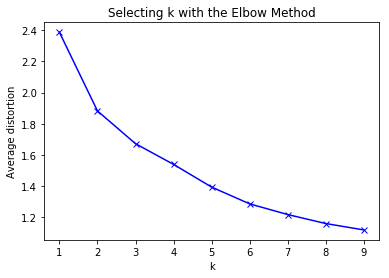

In [576]:
# Finding optimal no. of clusters
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(X_z)
    prediction=model.predict(X_z)
    meanDistortions.append(sum(np.min(cdist(X_z, model.cluster_centers_, 'euclidean'), axis=1)) / X_z.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [577]:
# Let us first start with K = 3, since most of independent attribute in the given dataset has 3 gaussians
for K in range(200):    # Iterating for multiple time to obtain the stable cluster
    final_model=KMeans(3)
    final_model.fit(X_z)
    prediction=final_model.predict(X_z)

#Append the prediction 
concrete_Iter8["GROUP"] = prediction
print("Groups Assigned : \n")
concrete_Iter8.head()

Groups Assigned : 



,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength,GROUP
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89,0
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51,2
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22,1
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85,1
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29,0


In [578]:
finalClust = concrete_Iter8.groupby(['GROUP'])
finalClust.mean()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
GROUP,,,,,,,,
0,1.245058,0.005674,1.225127,0.012138,6.111977,5.009695,42.354331,25.285433
1,0.169745,0.127240,0.579288,0.018093,3.065394,2.435700,50.068807,39.061284
2,0.352666,0.816561,1.006947,0.050216,5.705847,4.520762,35.544643,29.773661


In [579]:
finalClust.count()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
GROUP,,,,,,,,
0,127,127,127,127,127,127,127,127
1,654,654,654,654,654,654,654,654
2,224,224,224,224,224,224,224,224


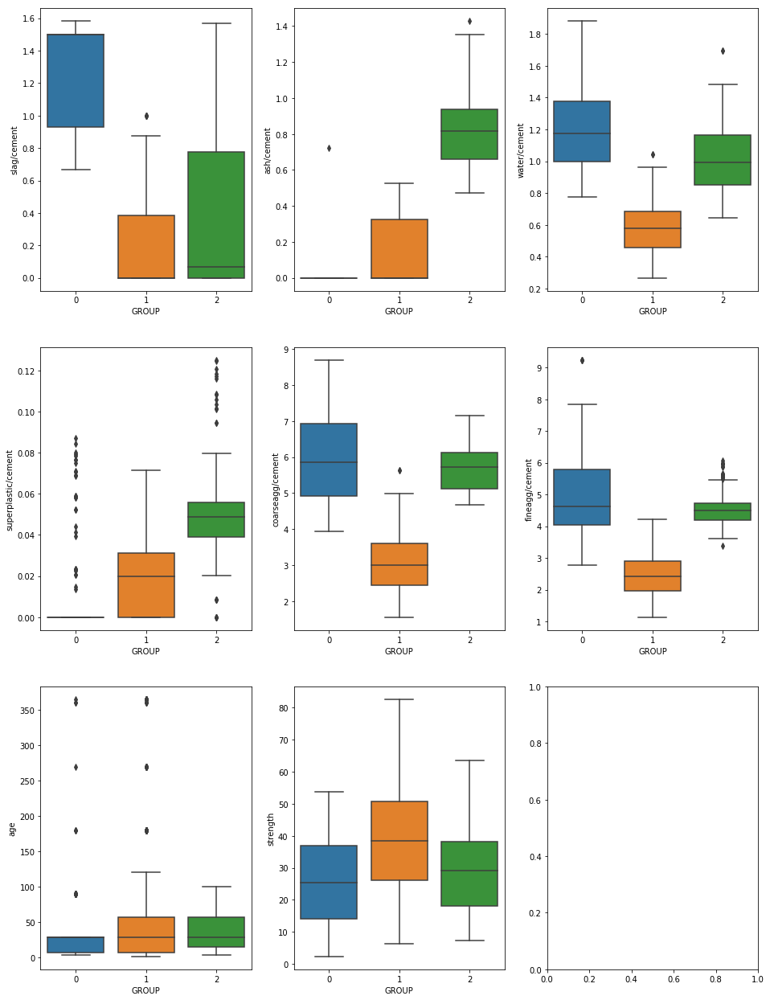

In [580]:
# Observing the outliers in the modified dataset using box plot
f, axes = plt.subplots(3, 3, figsize=(16, 22), sharex=True)
subplot(3,3,1)
sns.boxplot(concrete_Iter8['GROUP'],concrete_Iter8['slag/cement'])
subplot(3,3,2)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['ash/cement'])
subplot(3,3,3)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['water/cement'])
subplot(3,3,4)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['superplastic/cement'])
subplot(3,3,5)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['coarseagg/cement'])
subplot(3,3,6)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['fineagg/cement'])
subplot(3,3,7)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['age'])
subplot(3,3,8)
sns.boxplot(concrete_Iter8['GROUP'], concrete_Iter8['strength'])
plt.show()

In [581]:
#Append the prediction 
X_z["GROUP"] = prediction
print("Groups Assigned : \n")
X_z.head()

Groups Assigned : 



,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,0
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,2
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,1
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,1
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C28561F898>,
      dtype=object)

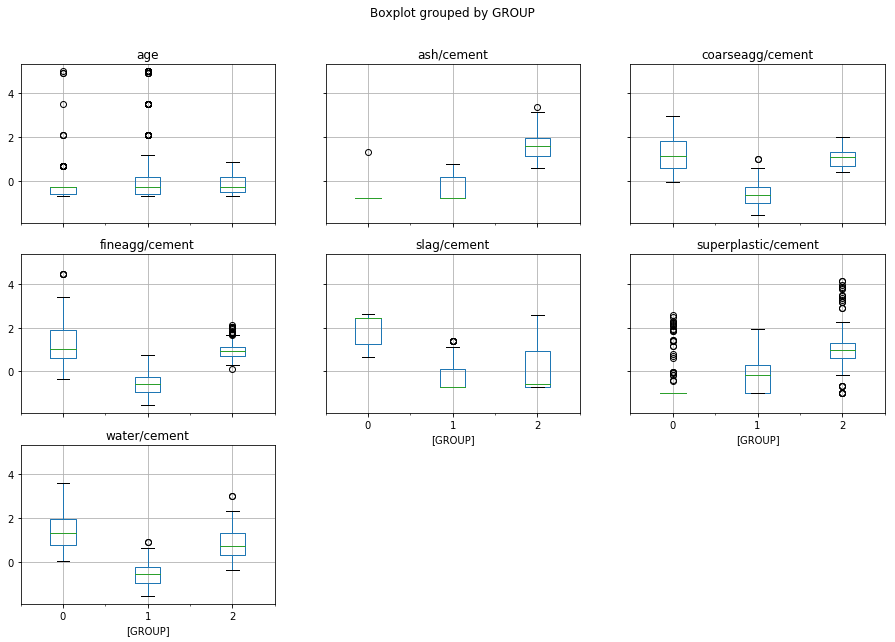

In [582]:
X_z.boxplot(by = 'GROUP',figsize=(15, 10))

In [583]:
# Trying to handle the outliers
# As per the domain expert suggestion if the outliers are replaced with median it changes the rations between all ingrediants
# Tried out and observed poor prediction
# If outliers are removed huge data loss occur since only less no. of datapoints in each clusters
# So observed outlers are kept as it is without treating it

#data = X_z  # lazy to type long names. Renaming it to data. Remember data is not a copy of the dataframe
#def replace(group):
#    median, std = group.median(), group.std()  #Get the median and the standard deviation of every group 
#    outliers = (group - median).abs() > 2*std # Subtract median from every member of each group. Take absolute values > 2std
#    group[outliers] = group.median()       
#    return group

#data_corrected = (data.groupby('GROUP').transform(replace)) 
#concat_data = data_corrected.join(pd.DataFrame(X_z['GROUP']))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C30D1164E0>,
      dtype=object)

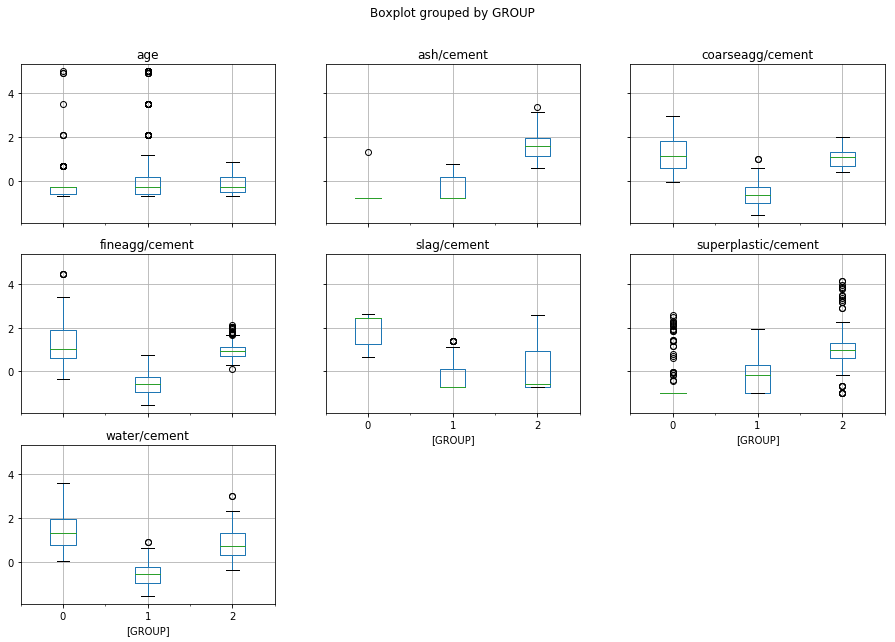

In [584]:
concat_data =X_z
concat_data.boxplot(by = 'GROUP', figsize=(15, 10))

In [585]:
concat_data.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,0
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,2
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,1
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,1
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,0


In [586]:
concat_data['strength']=concrete_Iter8_z['strength']
concat_data.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,0,-0.329328
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,2,-0.721299
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,1,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,1,0.651214
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,0,-1.042003


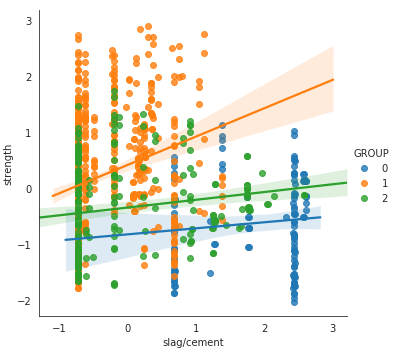

In [587]:
# strength vs slag/cement
var = 'slag/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

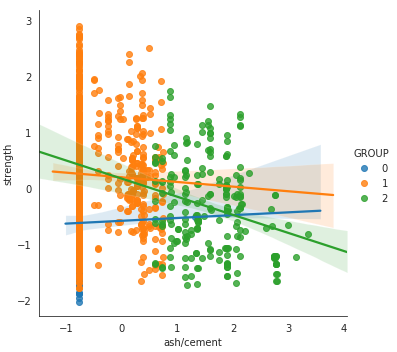

In [588]:
# strength vs ash
var = 'ash/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

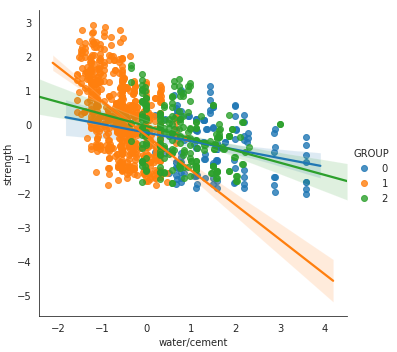

In [589]:
# strength vs water
var = 'water/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

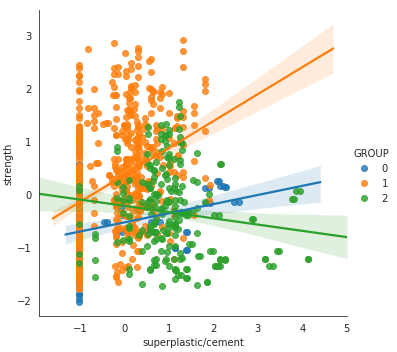

In [590]:
# strength vs superplastic
var = 'superplastic/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

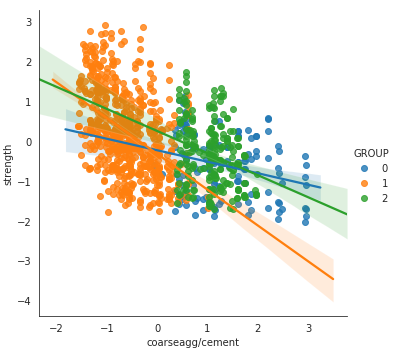

In [591]:
# strength vs coarseagg
var = 'coarseagg/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

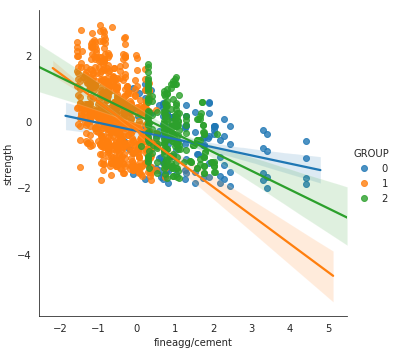

In [592]:
# strength vs fineagg

var = 'fineagg/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

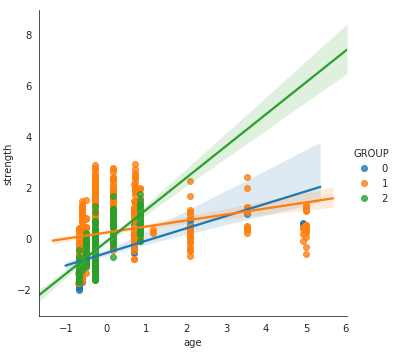

In [593]:
# strength vs age
var = 'age'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

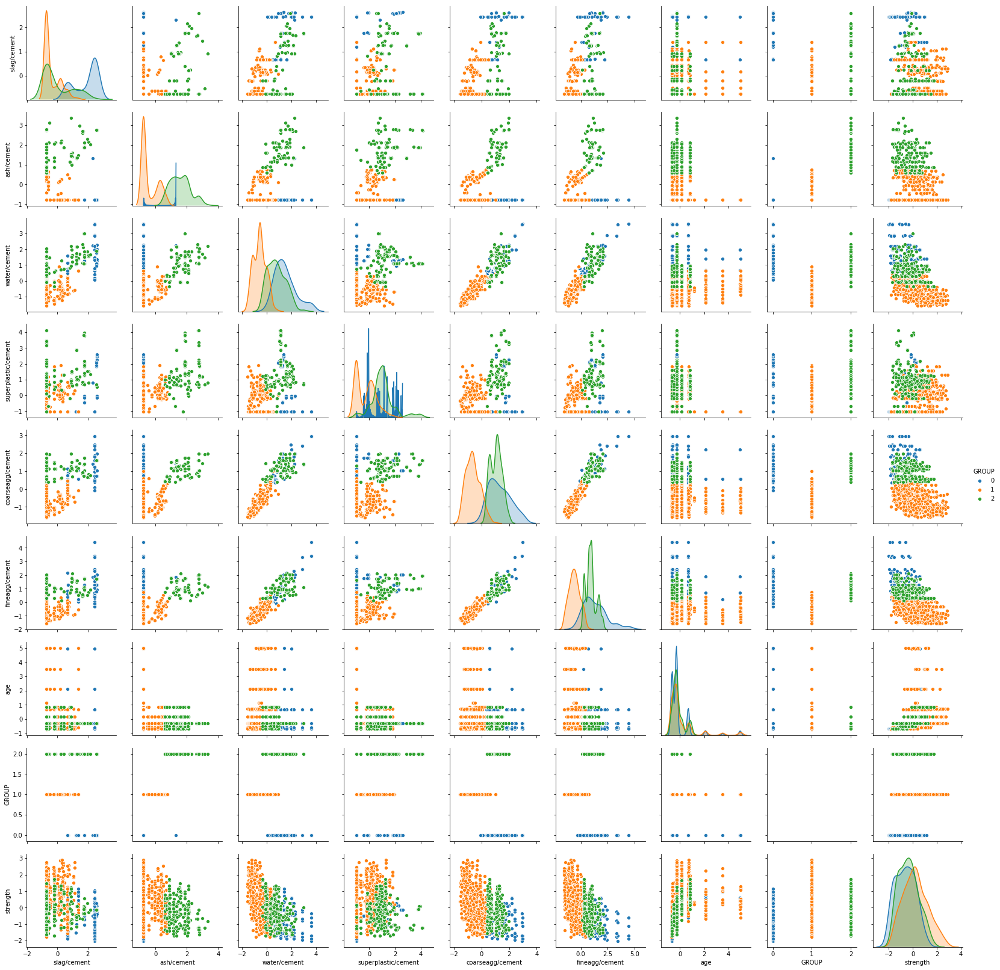

In [594]:
sns.pairplot(concat_data, diag_kind='kde',hue='GROUP')

In [595]:
data_cluster=concat_data
data_cluster['GROUP']=prediction
data_cluster.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,0,-0.329328
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,2,-0.721299
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,1,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,1,0.651214
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,0,-1.042003


In [596]:
# Let us break the data int0 3 groups

Group1 = data_cluster[data_cluster['GROUP']==0]
Group2 = data_cluster[data_cluster['GROUP']==1]
Group3 = data_cluster[data_cluster['GROUP']==2]

In [597]:
Group1.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,-0.280312,0,-0.329328
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,-0.280312,0,-1.042003
6,2.440226,-0.764878,1.480059,-1.008557,1.150781,0.684065,-0.609967,0,-1.198054
11,0.685614,-0.764878,1.128404,-1.008557,0.911670,1.274921,-0.672758,0,-1.739318
21,2.441153,-0.764878,0.185894,-1.008557,0.097403,-0.198038,-0.609967,0,-0.818985


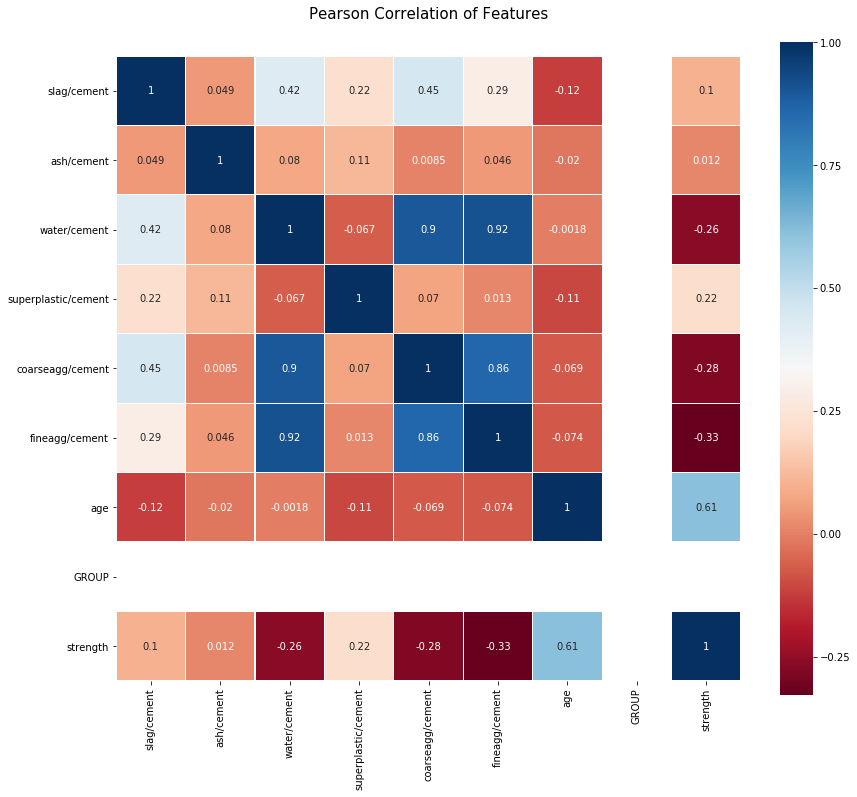

In [598]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group1.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [599]:
# Group 1- Order of importance
# -----------------------------
# Age                     0.61
# fineagg/cement         -0.33
# coarseagg/cement       -0.28
# water/cement           -0.26
# superplastic/cement     0.22


In [600]:
Group2.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP,strength
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,-0.280312,1,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,-0.280312,1,0.651214
5,-0.732747,-0.764878,-0.010465,-1.008557,-0.349359,0.354504,0.692955,1,-0.822671
7,-0.732747,0.590681,-0.020485,0.039409,0.032926,-0.156350,0.159228,1,0.085375
8,-0.732747,-0.764878,-0.343276,-1.008557,-0.237379,-0.473410,-0.280312,1,-0.835573


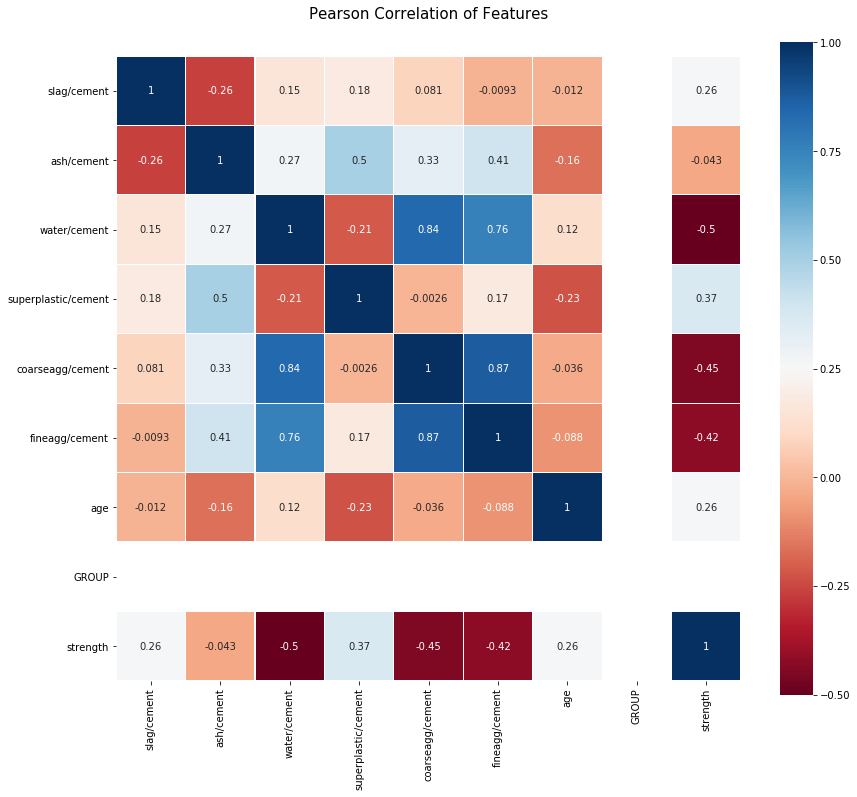

In [601]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group2.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [605]:
# Group 2- Order of importance
# -----------------------------
# water/cement           -0.5
# coarseagg/cement       -0.45
# fineagg/cement         -0.42
# superplastic/cement     0.37
# Age                     0.26

In [603]:
Group3.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,GROUP,strength
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,-0.500082,2,-0.721299
9,1.778337,1.892806,1.580863,1.381693,1.041743,0.947923,-0.280312,2,-0.384622
10,1.749055,1.867230,1.107978,3.954073,1.385887,0.996708,-0.280312,2,0.067558
14,1.635899,2.598821,1.121887,0.716940,0.850897,0.430178,-0.280312,2,-0.697953
18,-0.732747,1.129409,0.299347,0.675189,1.066135,0.731143,-0.672758,2,-1.241675


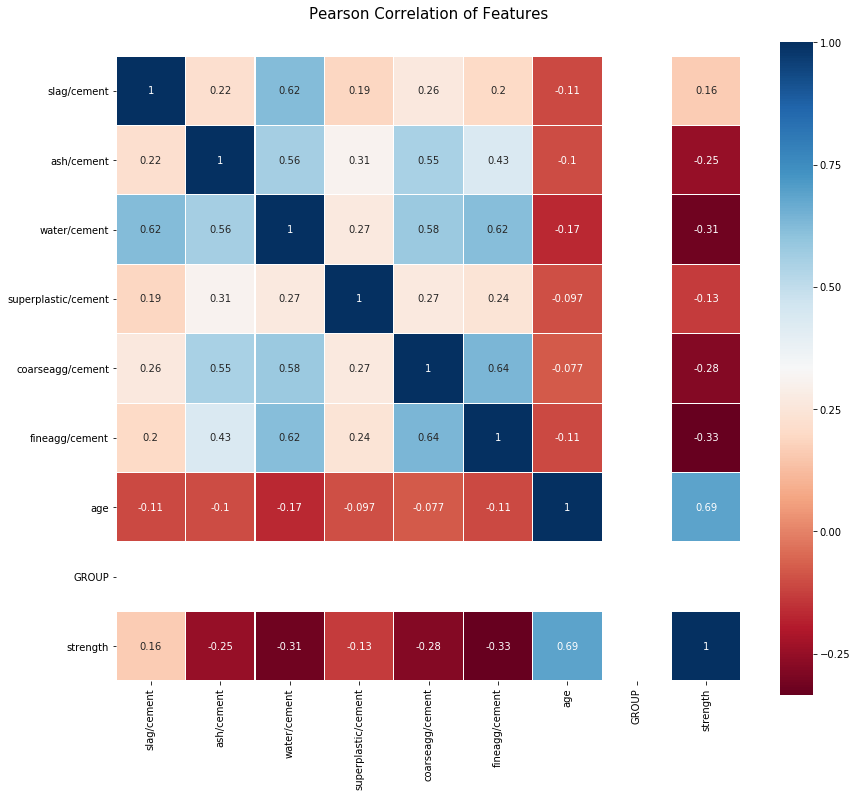

In [604]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group3.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [606]:
# Group 3- Order of importance
# -----------------------------
# Age                     0.69
# fineagg/cement         -0.33
# water/cement           -0.31
# coarseagg/cement       -0.28
# ash/cement             -0.25

In [607]:
Group1.drop(['GROUP'], axis=1, inplace=True)
Group1_X=Group1.drop('strength',axis=1) # Independent Attribute
Group1_y=Group1.pop('strength') # Dependent Attribute

Group2.drop(['GROUP'], axis=1, inplace=True)
Group2_X=Group2.drop('strength',axis=1) # Independent Attribute
Group2_y=Group2.pop('strength') # Dependent Attribute

Group3.drop(['GROUP'], axis=1, inplace=True)
Group3_X=Group3.drop('strength',axis=1) # Independent Attribute
Group3_y=Group3.pop('strength') # Dependent Attribute

Group1_X_train,Group1_X_test, Group1_y_train, Group1_y_test=train_test_split(Group1_X,Group1_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group2_X_train,Group2_X_test, Group2_y_train, Group2_y_test=train_test_split(Group2_X,Group2_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group3_X_train,Group3_X_test, Group3_y_train, Group3_y_test=train_test_split(Group3_X,Group3_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios

GroupX=[Group1_X, Group2_X, Group3_X]
Groupy=[Group1_y, Group2_y, Group3_y]

X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

num_folds=10
seed=7

# Using Linear Regression

In [608]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(LR_model,X_train[K], y_train[K], cv=kfold)
    LR_model.fit(X_train[K],y_train[K])
    y_pred = LR_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %LR_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=LR_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=x[0]
Group2_comparisonTable=x[1]
Group3_comparisonTable=x[2]

Group 1
-------
The accuracy score for training set is 0.6469562823545603
The accuracy score for testing set is 0.3803127620006333
Model performance range with 95 percentage confidence level is : 29.664%  (77.007%)


Group 2
-------
The accuracy score for training set is 0.6050946213445656
The accuracy score for testing set is 0.4965378433816749
Model performance range with 95 percentage confidence level is : 58.093%  (14.053%)


Group 3
-------
The accuracy score for training set is 0.7302176602634848
The accuracy score for testing set is 0.7222747258051416
Model performance range with 95 percentage confidence level is : 63.815%  (46.533%)




# Using Polynomial Regression (degree=2)

In [609]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2_G1 = poly.fit_transform(Group1_X_train)
X_test_2_G1 = poly.fit_transform(Group1_X_test)
X_train_2_G2 = poly.fit_transform(Group2_X_train)
X_test_2_G2 = poly.fit_transform(Group2_X_test)
X_train_2_G3 = poly.fit_transform(Group3_X_train)
X_test_2_G3 = poly.fit_transform(Group3_X_test)


X_train=[X_train_2_G1, X_train_2_G2, X_train_2_G3]
X_test=[X_test_2_G1, X_test_2_G2, X_test_2_G3]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]


kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(PR2_model,X_train[K], y_train[K], cv=kfold)
    PR2_model.fit(X_train[K],y_train[K])
    y_pred = PR2_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=PR2_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.7468351431387970
The accuracy score for testing set is 0.3590887304608930
Model performance range with 95 percentage confidence level is : -3085409045579531416502272.000%  (18142205188007645652451328.000%)


Group 2
-------
The accuracy score for training set is 0.7371744529045055
The accuracy score for testing set is 0.5951645797008367
Model performance range with 95 percentage confidence level is : 68.740%  (10.792%)


Group 3
-------
The accuracy score for training set is 0.8080787303605924
The accuracy score for testing set is 0.7254811953309936
Model performance range with 95 percentage confidence level is : 62.373%  (42.847%)




# Using Polynomial Regression (degree=2) & Ridge Regression

In [610]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(ridge,X_train[K], y_train[K], cv=kfold)
    ridge.fit(X_train[K],y_train[K])
    y_pred = ridge.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %ridge.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %ridge.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=ridge.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.7440804481540786
The accuracy score for testing set is 0.3876206564039157
Model performance range with 95 percentage confidence level is : -17.503%  (297.460%)


Group 2
-------
The accuracy score for training set is 0.7347338367476344
The accuracy score for testing set is 0.6093272719632385
Model performance range with 95 percentage confidence level is : 68.535%  (10.449%)


Group 3
-------
The accuracy score for training set is 0.7973749400044663
The accuracy score for testing set is 0.7225027209430553
Model performance range with 95 percentage confidence level is : 63.806%  (34.663%)




# Using Polynomial Regression (degree=2) & Lasso Regression

In [611]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(lasso,X_train[K], y_train[K], cv=kfold)
    lasso.fit(X_train[K],y_train[K])
    y_pred = lasso.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %lasso.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %lasso.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=lasso.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.4421090073789060
The accuracy score for testing set is 0.1290159689231570
Model performance range with 95 percentage confidence level is : 7.899%  (60.752%)


Group 2
-------
The accuracy score for training set is 0.0200744764660873
The accuracy score for testing set is -0.0044819568370327
Model performance range with 95 percentage confidence level is : 0.482%  (5.074%)


Group 3
-------
The accuracy score for training set is 0.0989644025516131
The accuracy score for testing set is 0.0772605664398629
Model performance range with 95 percentage confidence level is : -0.346%  (15.448%)




# Support Vector Regressor

In [612]:
X_train_scale1 = preprocessing.scale(Group1_X_train)
X_test_scale1 = preprocessing.scale(Group1_X_test)
y_train_scale1 = preprocessing.scale(Group1_y_train)
y_test_scale1 = preprocessing.scale(Group1_y_test)
X_train_scale2 = preprocessing.scale(Group2_X_train)
X_test_scale2 = preprocessing.scale(Group2_X_test)
y_train_scale2 = preprocessing.scale(Group2_y_train)
y_test_scale2 = preprocessing.scale(Group2_y_test)
X_train_scale3 = preprocessing.scale(Group3_X_train)
X_test_scale3 = preprocessing.scale(Group3_X_test)
y_train_scale3 = preprocessing.scale(Group3_y_train)
y_test_scale3 = preprocessing.scale(Group3_y_test)


X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(SVR_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    SVR_optimised_model = gs.best_estimator_
    SVR_optimised_model.fit(X_train[K],y_train[K])
    y_pred = SVR_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=SVR_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.7305241237688166
Standard deviation for the best model 0.18090068447422614
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.8968316112081932
The accuracy score for testing set is 0.8509683905092178
R Square value for test dataset is 0.8509683905092178
Model performance range with 95 percentage confidence level is : 73.052%  (35.457%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8337547593725316
Standard deviation for the best model 0.043456539820260126
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.8908587297361605
The accuracy score for testing set is 0.7599955938801909
R Square value for test dataset is 0.7599955938801909
Model performance range with 95 percentage confidence level is : 83.375%  (8.517%)


Group 3
-------
The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.7796844872865739
Standard deviation for the best model 0.14769206883506392
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy scor

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# KNN Regressor

In [613]:
X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()


for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(KNN_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    KNN_optimised_model = gs.best_estimator_
    KNN_optimised_model.fit(X_train[K],y_train[K])
    y_pred = KNN_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=KNN_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')


Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.3958849850636756
Standard deviation for the best model 0.3813172849871788
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')
The accuracy score for training set is 0.8244491847550701
The accuracy score for testing set is 0.6993833662311348
R Square value for test dataset is 0.6993833662311348
Model performance range with 95 percentage confidence level is : 39.588%  (74.738%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 1}
The model which produce best score is 0.6855666595934726
Standard deviation for the best model 0.09215483654379601
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')
The accuracy score for training set is 0.9976749116276586
The accuracy score for testing set is 0.5757270679179245
R Square value for test dataset is 0.5757270679179245
Model performance range with 95 percentage confidence level is : 68.557%  (18.062%)


Group 3
-------
The best parameter is {'metric': 'euclidean', 'n_neighbors': 7}
The model which produce best score is 0.6559866508098507
Standard deviation for the best model 0.18239555714055747
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
    

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# Decision Tree Regressor

In [614]:
X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(DT_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    DT_optimised_model = gs.best_estimator_
    DT_optimised_model.fit(X_train[K],y_train[K])
    y_pred = DT_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=DT_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])  

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 6, 'min_samples_split': 2}
The model which produce best score is 0.7883972867309407
Standard deviation for the best model 0.17438828600122872
Optimized model is DecisionTreeRegressor(criterion='mae', max_depth=6, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9865471047535722
The accuracy score for testing set is 0.8304345645389822
R Square value for test dataset is 0.8304345645389822
Model performance range with 95 percentage confidence level is : 78.840%  (34.180%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.8052912959761213
Standard deviation for the best model 0.05130548460942327
Optimized model is DecisionTreeRegressor(criterion='mae', max_depth=12, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9882277857556343
The accuracy score for testing set is 0.7908594896355283
R Square value for test dataset is 0.7908594896355283
Model performance range with 95 percentage confidence level is : 80.529%  (10.056%)


Group 3
-------
The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.6718220912542564
Standard deviation

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# Bagging Regressor

In [615]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Bagging_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Bagging_optimised_model = gs.best_estimator_
    Bagging_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Bagging_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Bagging_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]]) 

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 25}
The model which produce best score is 0.8322778589553799
Standard deviation for the best model 0.11969956038007724
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=25,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9680865773054491
The accuracy score for testing set is 0.8401770773817197
R Square value for test dataset is 0.8401770773817197
Model performance range with 95 percentage confidence level is : 83.228%  (23.461%)


Group 2
-------
The best parameter is {'n_estimators': 150}
The model which produce best score is 0.876228142780329
Standard deviation for the best model 0.0222578087797565
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 200}
The model which produce best score is 0.7549552562752966
Standard deviation for the best model 0.11107218221716492
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=200,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9552193577520837
The accuracy score for testing set is 0.8363569352415841
R Square value for test dataset is 0.8363569352415841
Model performance range with 95 percentage confidence level is : 75.496%  (21.770%)




# Adaboost Regressor

In [616]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Adaboost_optimised_model = gs.best_estimator_
    Adaboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Adaboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Adaboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['AdaBoost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])  

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 1.0, 'n_estimators': 100}
The model which produce best score is 0.773974532444925
Standard deviation for the best model 0.15042080103841596
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=100, random_state=1)
The accuracy score for training set is 0.9276977748060846
The accuracy score for testing set is 0.8045285977420686
R Square value for test dataset is 0.8045285977420686
Model performance range with 95 percentage confidence level is : 77.397%  (29.482%)


Group 2
-------
The best parameter is {'learning_rate': 1.0, 'n_estimators': 200}
The model which produce best score is 0.7899571066636485
Standard deviation for the best model 0.04177610063270306
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=1)
The accuracy score for training set is 0.8520136367587156
The accuracy score for

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 0.8, 'n_estimators': 200}
The model which produce best score is 0.7400659410237013
Standard deviation for the best model 0.08785493488061809
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=0.8, loss='linear',
                  n_estimators=200, random_state=1)
The accuracy score for training set is 0.8857234744066027
The accuracy score for testing set is 0.8287303773467435
R Square value for test dataset is 0.8287303773467435
Model performance range with 95 percentage confidence level is : 74.007%  (17.220%)




# Gradient Boosting Regressor

In [617]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Gradientboost_optimised_model = gs.best_estimator_
    Gradientboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Gradientboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Gradientboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Gradient Boost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'friedman_mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.8226756897759109
Standard deviation for the best model 0.1952668528191478
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9988971010936022
The accuracy score for testing set is 0.9128404101923624
R Square value for te

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# Random Forest Regressor

In [618]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    RandomForest_optimised_model = gs.best_estimator_
    RandomForest_optimised_model.fit(X_train[K],y_train[K])
    y_pred = RandomForest_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=RandomForest_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8260704284843114
Standard deviation for the best model 0.12171893225338734
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9837999240604629
The accuracy score for testing set is 0.8640152530954422
R Square value for test dataset is 0.8640152530954422
Model performance range with 95 percentage confidence level is : 82.607%  (23.857%)


Group 2
-------
The best parameter is {'criterion': 'mae', 'max_depth': 9

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.7778239731368279
Standard deviation for the best model 0.0939769263313929
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9735884701090221
The accuracy score for testing set is 0.8517230171891241
R Square value for test dataset is 0.8517230171891241
Model performance range with 95 percentage confidence level is : 77.782%  (18.419%)




In [619]:
Group1_comparisonTable8=Group1_comparisonTable
Group1_comparisonTable8

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.592218,0.380313,0.343861
0,Polynomial Regression - degree 2,0.602274,0.359089,0.321388
0,Polynomial Regression - degree 2 & ridge,0.588716,0.387621,0.351598
0,Polynomial Regression - degree 2 & lasso,0.702103,0.129016,0.077782
0,SVR,0.386046,0.850968,0.842202
0,KNN,0.548285,0.699383,0.681700
0,Decision Tree,0.309788,0.830435,0.820460
0,Bagging,0.300756,0.840177,0.830776
0,AdaBoost,0.332611,0.804529,0.793030
0,Gradient Boost,0.222102,0.912840,0.907713


In [620]:
Group2_comparisonTable8=Group2_comparisonTable
Group2_comparisonTable8

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.731703,0.496538,0.491082
0,Polynomial Regression - degree 2,0.656131,0.595165,0.590778
0,Polynomial Regression - degree 2 & ridge,0.644552,0.609327,0.605094
0,Polynomial Regression - degree 2 & lasso,1.033528,-0.004482,-0.015366
0,SVR,0.489902,0.759996,0.757395
0,KNN,0.651362,0.575727,0.571130
0,Decision Tree,0.471596,0.790859,0.788593
0,Bagging,0.351798,0.883619,0.882357
0,AdaBoost,0.444730,0.814009,0.811994
0,Gradient Boost,0.352775,0.882971,0.881703


In [621]:
Group3_comparisonTable8=Group3_comparisonTable
Group3_comparisonTable8

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.461929,0.722275,0.713274
0,Polynomial Regression - degree 2,0.459255,0.725481,0.716585
0,Polynomial Regression - degree 2 & ridge,0.461740,0.722503,0.713510
0,Polynomial Regression - degree 2 & lasso,0.841991,0.077261,0.047357
0,SVR,0.380888,0.854924,0.850223
0,KNN,0.532477,0.716469,0.707280
0,Decision Tree,0.443690,0.743774,0.735470
0,Bagging,0.354582,0.836357,0.831054
0,AdaBoost,0.362750,0.828730,0.823180
0,Gradient Boost,0.259801,0.912149,0.909302


In [ ]:
# Summary of Iteration 8:
# -------------------------
# Removing duplicate data
# Outliers are not treated and kept as it is
# Data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)
# Grouping into 3 clusters and observing the performance for all the three groups
# ------------------------------------------------------------------------------
# For all the three groups Gradient Boost regressor has the best performance 


# ------------------------------------------------------------------------------
#                 R Square Value        Model performance with 95% confidence level
# ------------------------------------------------------------------------------
# Group 1          0.912840                 82.268%  (38.272%)
# Group 2          0.882971                 90.524%  (4.461%)
# Group 3          0.912149                 84.123%  (21.072%)

# Iteration 9

1. Removing duplicate data
2. Outliers are not treated and kept as it is
3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
4. Grouping into 3 clusters and observed the performance by dropping out the age attribute

In [622]:
# As per the information from the domain expert
# Concrete strength depends of the mixture of cement, slag, ash, water, superplastic, coarseagg, fineagg
# As age increases the strength increases
# So decided to group based on the ingrediants for concrete
# clustering is done by dropping the independent attribute 'age' and observed the performance

In [623]:
# Removing Duplicate Data
concrete_Iter9=concrete_df.copy(deep=True)
concrete_Iter9.drop_duplicates(keep='first', inplace=True) # To remove 25 duplicate datapoints in the dataset
concrete_Iter9.shape

(1005, 9)

In [624]:
concrete_Iter9.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [625]:
# Feature Engineering
# -------------------
# Since the concrete strength depends on the mixture of water,cement,fineagg and courseagg
# The ratio of all plays a major role in predicting the strength
# So, at each datapoints all the independent attributes (except age) is divided by the value of cement(kg)

In [626]:
# Converting all the attributes 'cement', 'slage', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg' into ratios
concrete_Iter9['cement/cement']=concrete_Iter9['cement']/concrete_Iter9['cement']
concrete_Iter9['slag/cement']=concrete_Iter9['slag']/concrete_Iter9['cement']
concrete_Iter9['ash/cement']=concrete_Iter9['ash']/concrete_Iter9['cement']
concrete_Iter9['water/cement']=concrete_Iter9['water']/concrete_Iter9['cement']
concrete_Iter9['superplastic/cement']=concrete_Iter9['superplastic']/concrete_Iter9['cement']
concrete_Iter9['coarseagg/cement']=concrete_Iter9['coarseagg']/concrete_Iter9['cement']
concrete_Iter9['fineagg/cement']=concrete_Iter9['fineagg']/concrete_Iter9['cement']
concrete_Iter9.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [627]:
# Dropping down the columns 'cement', 'slag', 'ash', 'water', 'superplatic', 'coarseagg', 'fineagg'
concrete_Iter9.drop(['cement','slag', 'ash', 'water', 'superplastic', 'coarseagg', 'fineagg'], axis=1, inplace=True)
concrete_Iter9.head()

,age,strength,cement/cement,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement
0,28,29.89,1.0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240
1,14,23.51,1.0,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032
2,28,29.22,1.0,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800
3,28,45.85,1.0,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797
4,28,18.29,1.0,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646


In [628]:
# Rearranging the columns
concrete_Iter9 = concrete_Iter9[['cement/cement', 'slag/cement', 'ash/cement', 'water/cement', 'superplastic/cement', 'coarseagg/cement', 'fineagg/cement', 'age', 'strength']]

In [629]:
#Dropping down the column 'cement/cement' since all the row values have the ratio 1
concrete_Iter9.drop(['cement/cement'], axis=1, inplace=True)
concrete_Iter9.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29


In [630]:
concrete_Iter9_z=concrete_Iter9.apply(zscore) # Applyin Z-scores

In [631]:
X_z=concrete_Iter9_z.drop(['age','strength'],axis=1)  # Doing clusting only to the independent 
X_z.shape

(1005, 6)

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

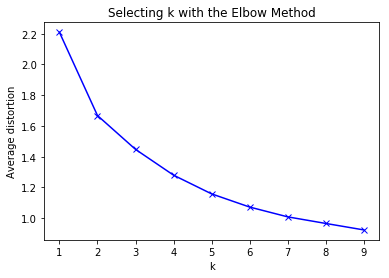

In [632]:
# Finding optimal no. of clusters
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(X_z)
    prediction=model.predict(X_z)
    meanDistortions.append(sum(np.min(cdist(X_z, model.cluster_centers_, 'euclidean'), axis=1)) / X_z.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

In [633]:
# Let us first start with K = 3, since most of independent attribute in the given dataset has 3 gaussians
for K in range(200):  # Iterating for multiple time to obtain the stable cluster
    final_model=KMeans(3)
    final_model.fit(X_z)
    prediction=final_model.predict(X_z)

#Append the prediction 
concrete_Iter9["GROUP"] = prediction
print("Groups Assigned : \n")
concrete_Iter9.head()

Groups Assigned : 



,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength,GROUP
0,1.500354,0.000000,1.440198,0.000000,6.877565,5.297240,28,29.89,1
1,0.249852,0.735938,0.937241,0.063943,6.399053,4.714032,14,23.51,2
2,0.000000,0.382800,0.749600,0.022000,3.827600,3.444800,28,29.22,0
3,0.428571,0.000000,0.857143,0.000000,3.503759,2.518797,28,45.85,0
4,1.184755,0.000000,1.248708,0.058786,6.766150,4.500646,28,18.29,1


In [634]:
finalClust = concrete_Iter8.groupby(['GROUP'])
finalClust.mean()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
GROUP,,,,,,,,
0,1.245058,0.005674,1.225127,0.012138,6.111977,5.009695,42.354331,25.285433
1,0.169745,0.127240,0.579288,0.018093,3.065394,2.435700,50.068807,39.061284
2,0.352666,0.816561,1.006947,0.050216,5.705847,4.520762,35.544643,29.773661


In [635]:
finalClust.count()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,age,strength
GROUP,,,,,,,,
0,127,127,127,127,127,127,127,127
1,654,654,654,654,654,654,654,654
2,224,224,224,224,224,224,224,224


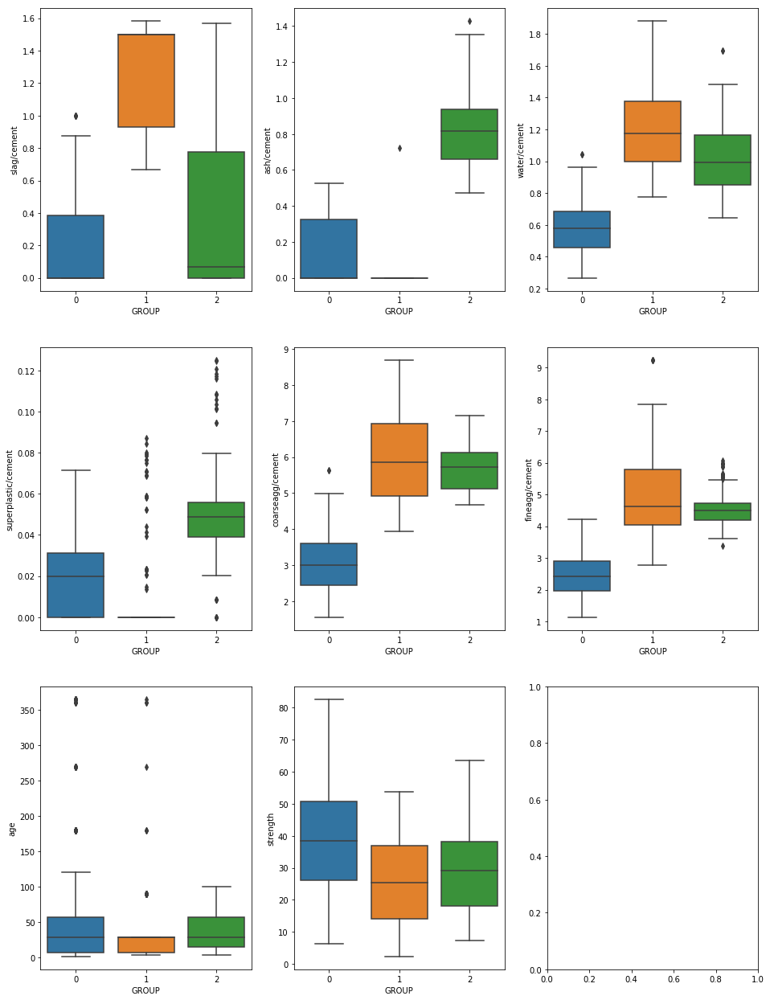

In [636]:
# Observing the outliers in the modified dataset using box plot
f, axes = plt.subplots(3, 3, figsize=(16, 22), sharex=True)
subplot(3,3,1)
sns.boxplot(concrete_Iter9['GROUP'],concrete_Iter9['slag/cement'])
subplot(3,3,2)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['ash/cement'])
subplot(3,3,3)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['water/cement'])
subplot(3,3,4)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['superplastic/cement'])
subplot(3,3,5)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['coarseagg/cement'])
subplot(3,3,6)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['fineagg/cement'])
subplot(3,3,7)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['age'])
subplot(3,3,8)
sns.boxplot(concrete_Iter9['GROUP'], concrete_Iter9['strength'])

In [637]:
#Append the prediction 
X_z["GROUP"] = prediction
print("Groups Assigned : \n")
X_z.head()

Groups Assigned : 



,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,1
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,2
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,0
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,0
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,1


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C3120A0240>,
      dtype=object)

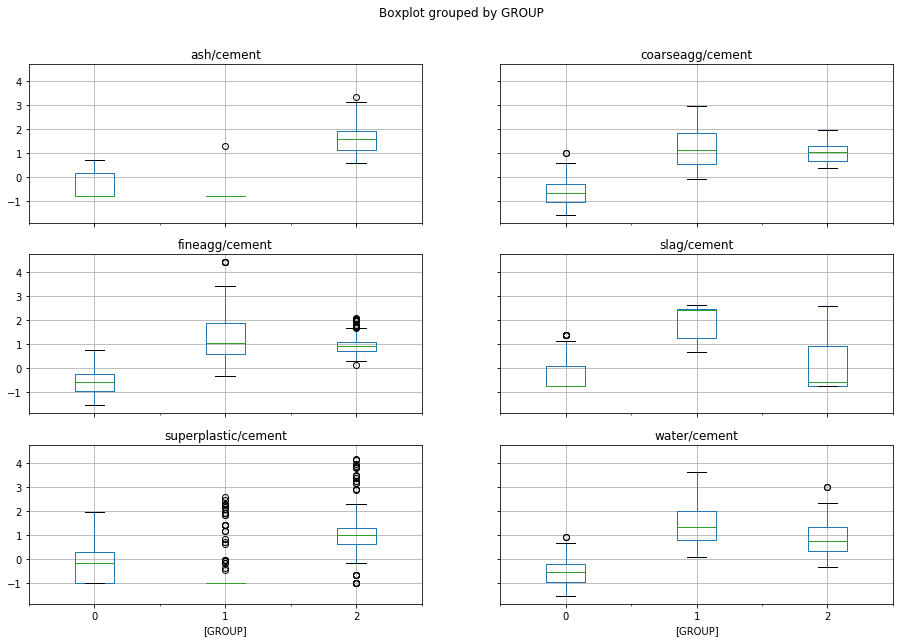

In [638]:
X_z.boxplot(by = 'GROUP',figsize=(15, 10))

In [639]:
# Trying to handle the outliers
# As per the domain expert suggestion if the outliers are replaced with median it changes the rations between all ingrediants
# Tried out and observed poor prediction
# If outliers are removed huge data loss occur since only less no. of datapoints in each clusters
# So observed outlers are kept as it is without treating it

#data = X_z  # lazy to type long names. Renaming it to data. Remember data is not a copy of the dataframe
#def replace(group):
#    median, std = group.median(), group.std()  #Get the median and the standard deviation of every group 
#    outliers = (group - median).abs() > 2*std # Subtract median from every member of each group. Take absolute values > 2std
#    group[outliers] = group.median()       
#    return group

#data_corrected = (data.groupby('GROUP').transform(replace)) 
#concat_data = data_corrected.join(pd.DataFrame(X_z['GROUP']))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C3037115C0>,
      dtype=object)

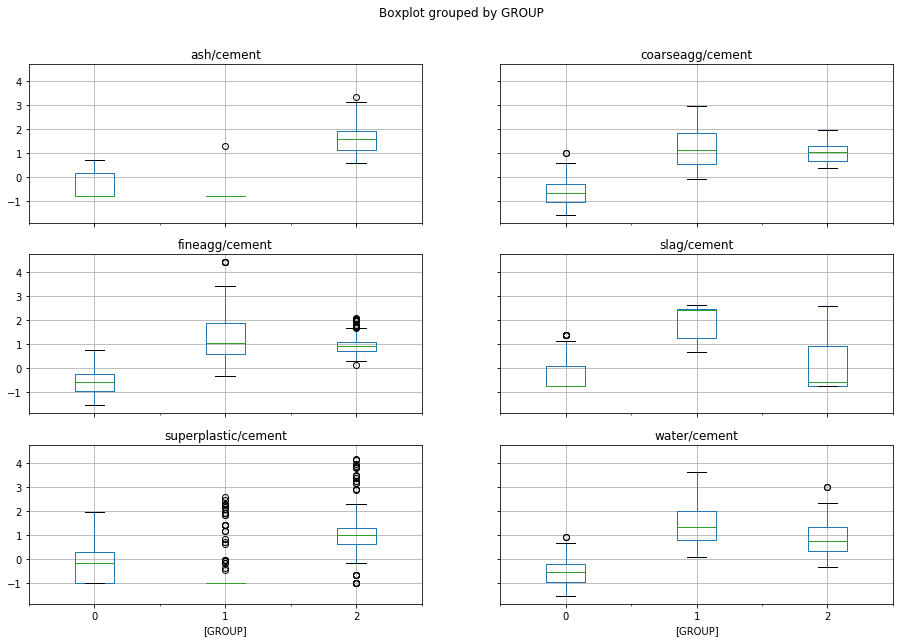

In [640]:
concat_data =X_z
concat_data.boxplot(by = 'GROUP', figsize=(15, 10))

In [641]:
concat_data.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,1
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,2
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,0
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,0
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,1


In [642]:
concat_data['age']=concrete_Iter9_z['age']
concat_data['strength']=concrete_Iter9_z['strength']
concat_data.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP,age,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,1,-0.280312,-0.329328
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,2,-0.500082,-0.721299
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,0,-0.280312,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,0,-0.280312,0.651214
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,1,-0.280312,-1.042003


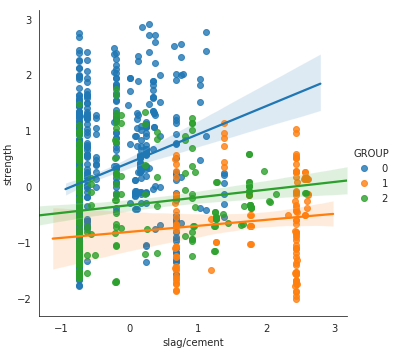

In [643]:
# strength vs slag/cement
var = 'slag/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

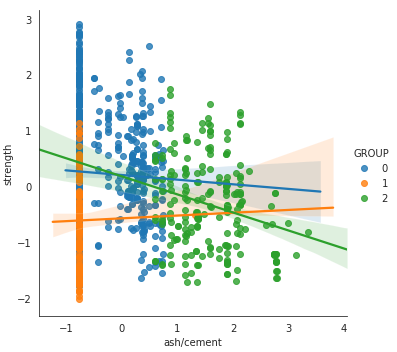

In [644]:
# strength vs ash
var = 'ash/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

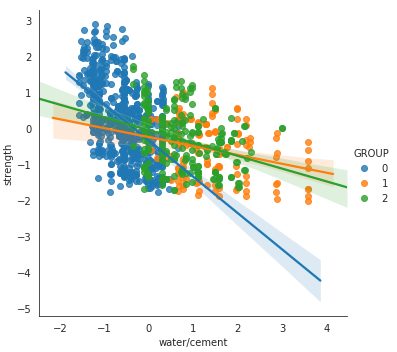

In [645]:
# strength vs water
var = 'water/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

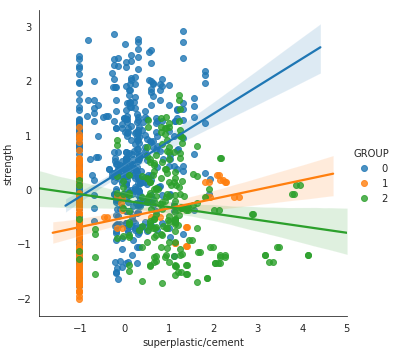

In [646]:
# strength vs superplastic
var = 'superplastic/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

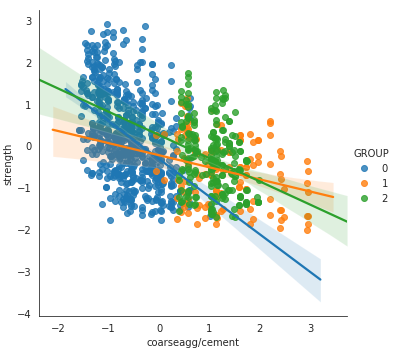

In [647]:
# strength vs coarseagg
var = 'coarseagg/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

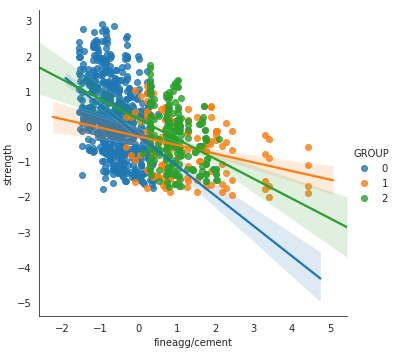

In [648]:
# strength vs fineagg

var = 'fineagg/cement'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

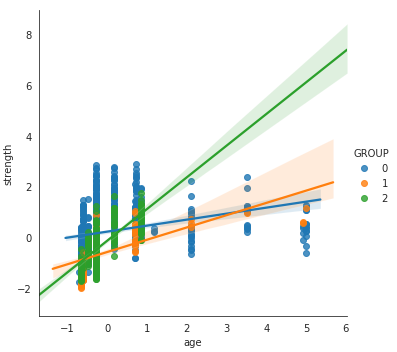

In [649]:
# strength vs age
var = 'age'
with sns.axes_style("white"):
    plot = sns.lmplot( var,'strength',data=concat_data,hue='GROUP')
plot.set()

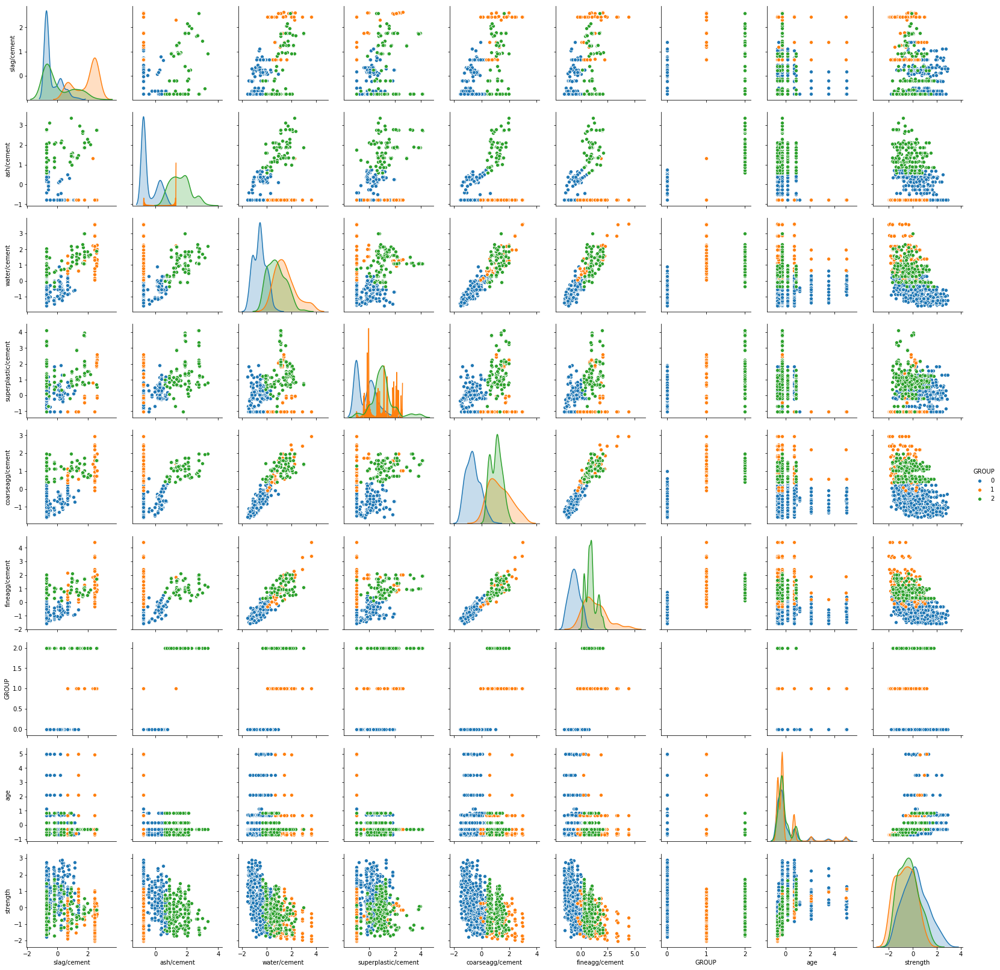

In [650]:
sns.pairplot(concat_data, diag_kind='kde',hue='GROUP')

In [651]:
data_cluster=concat_data
data_cluster['GROUP']=prediction
data_cluster.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP,age,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,1,-0.280312,-0.329328
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,2,-0.500082,-0.721299
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,0,-0.280312,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,0,-0.280312,0.651214
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,1,-0.280312,-1.042003


In [652]:
# Let us break the data int0 3 groups

Group1 = data_cluster[data_cluster['GROUP']==0]
Group2 = data_cluster[data_cluster['GROUP']==1]
Group3 = data_cluster[data_cluster['GROUP']==2]

In [653]:
Group1.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP,age,strength
2,-0.732747,0.337856,-0.021127,-0.102918,-0.134344,0.161754,0,-0.280312,-0.370491
3,0.173816,-0.764878,0.322057,-1.008557,-0.340237,-0.521887,0,-0.280312,0.651214
5,-0.732747,-0.764878,-0.010465,-1.008557,-0.349359,0.354504,0,0.692955,-0.822671
7,-0.732747,0.590681,-0.020485,0.039409,0.032926,-0.156350,0,0.159228,0.085375
8,-0.732747,-0.764878,-0.343276,-1.008557,-0.237379,-0.473410,0,-0.280312,-0.835573


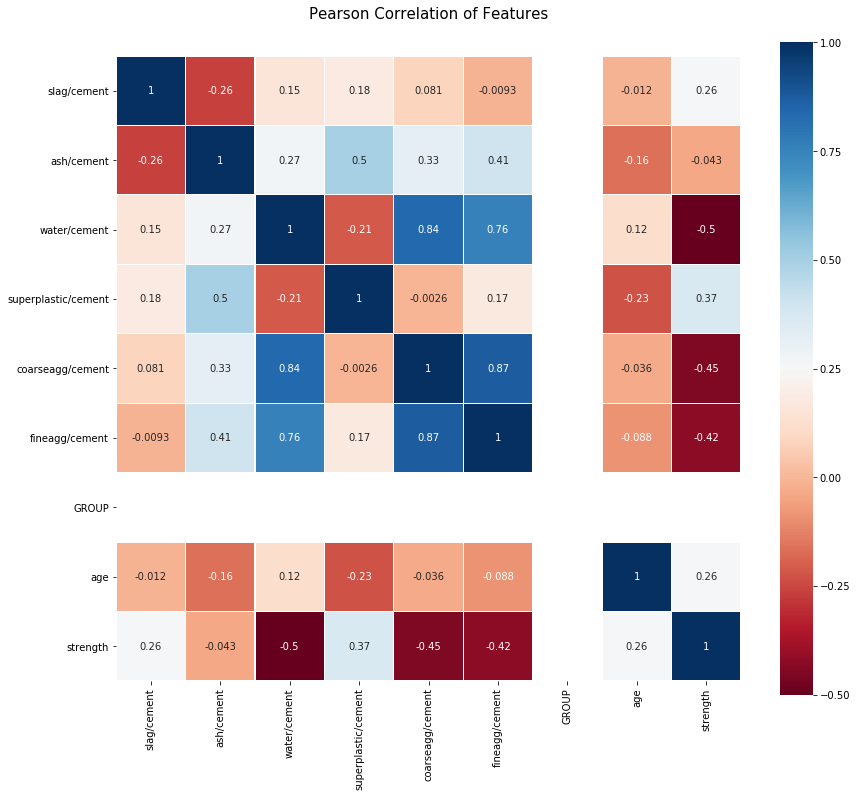

In [654]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group1.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [655]:
# Group 1- Order of importance
# -----------------------------
# water/cement           -0.5
# coarseagg/cement       -0.45
# fineagg/cement         -0.42
# superplastic/cement     0.37
# Age                     0.26

In [656]:
Group2.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP,age,strength
0,2.440974,-0.764878,2.182664,-1.008557,1.804778,1.529358,1,-0.280312,-0.329328
4,1.773382,-0.764878,1.571593,1.411374,1.733942,0.941255,1,-0.280312,-1.042003
6,2.440226,-0.764878,1.480059,-1.008557,1.150781,0.684065,1,-0.609967,-1.198054
11,0.685614,-0.764878,1.128404,-1.008557,0.911670,1.274921,1,-0.672758,-1.739318
21,2.441153,-0.764878,0.185894,-1.008557,0.097403,-0.198038,1,-0.609967,-0.818985


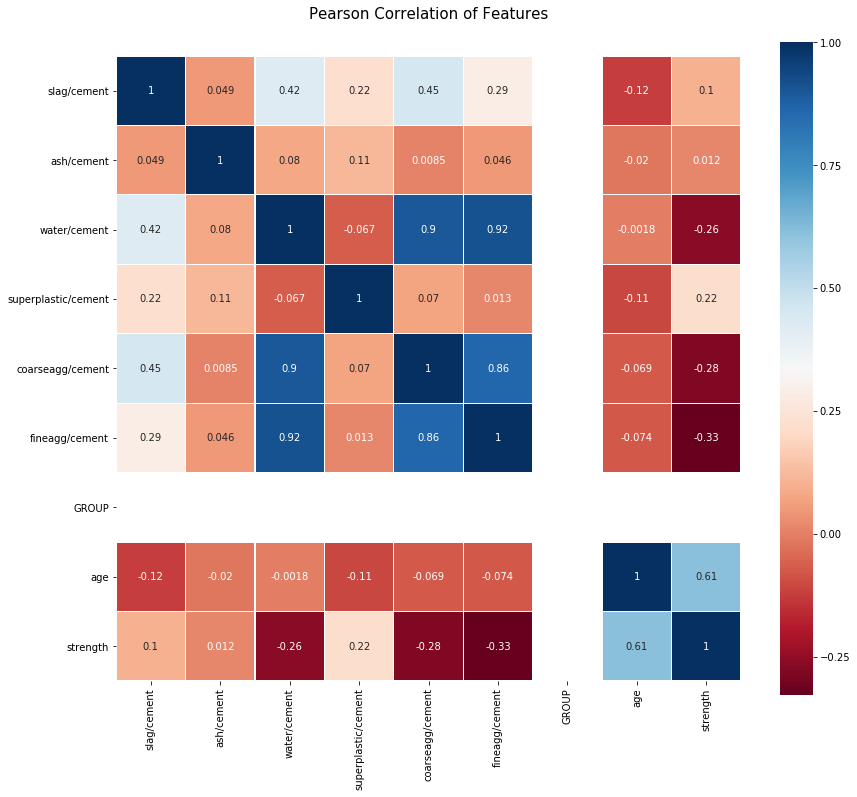

In [657]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group2.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [658]:
# Group 2- Order of importance
# -----------------------------
# Age                     0.61
# fineagg/cement         -0.33
# coarseagg/cement       -0.28
# water/cement           -0.26
# superplastic/cement     0.22


In [659]:
Group3.head()

,slag/cement,ash/cement,water/cement,superplastic/cement,coarseagg/cement,fineagg/cement,GROUP,age,strength
1,-0.204232,1.355144,0.577661,1.623690,1.500547,1.098792,2,-0.500082,-0.721299
9,1.778337,1.892806,1.580863,1.381693,1.041743,0.947923,2,-0.280312,-0.384622
10,1.749055,1.867230,1.107978,3.954073,1.385887,0.996708,2,-0.280312,0.067558
14,1.635899,2.598821,1.121887,0.716940,0.850897,0.430178,2,-0.280312,-0.697953
18,-0.732747,1.129409,0.299347,0.675189,1.066135,0.731143,2,-0.672758,-1.241675


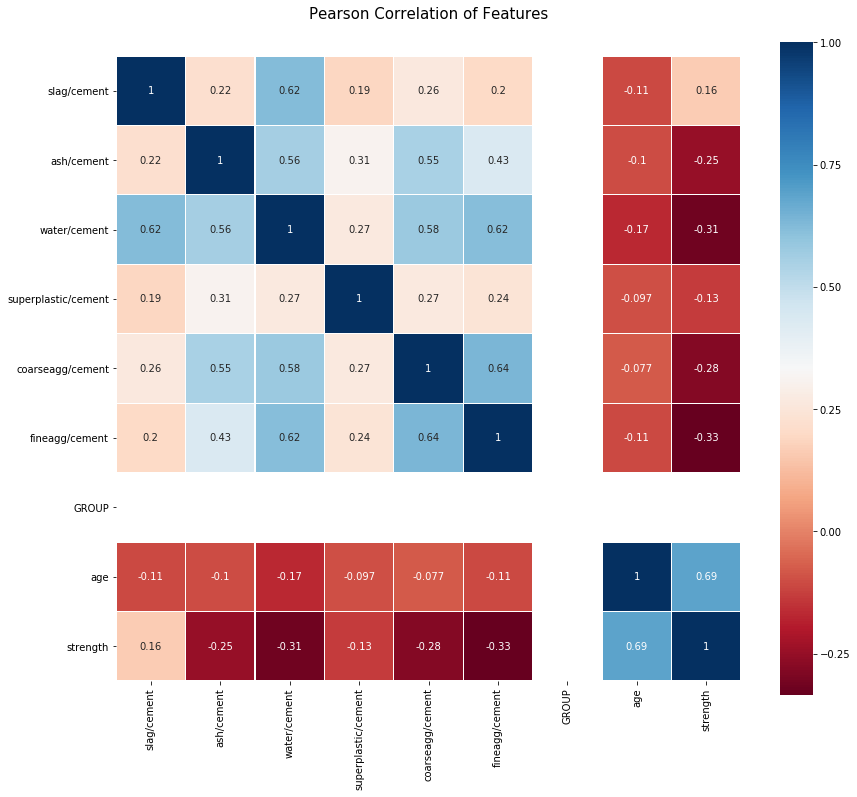

In [660]:
# Observing the relationship between different attributes with the target class
colormap = plt.cm.RdBu
plt.figure(figsize=(14,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(Group3.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

In [661]:
# Group 3 - Order of importance
# -----------------------------
# Age                     0.69
# fineagg/cement         -0.33
# water/cement           -0.31
# coarseagg/cement       -0.28
# ash/cement             -0.25


In [662]:
Group1.drop(['GROUP'], axis=1, inplace=True)
Group1_X=Group1.drop('strength',axis=1) # Independent Attribute
Group1_y=Group1.pop('strength') # Dependent Attribute

Group2.drop(['GROUP'], axis=1, inplace=True)
Group2_X=Group2.drop('strength',axis=1) # Independent Attribute
Group2_y=Group2.pop('strength') # Dependent Attribute

Group3.drop(['GROUP'], axis=1, inplace=True)
Group3_X=Group3.drop('strength',axis=1) # Independent Attribute
Group3_y=Group3.pop('strength') # Dependent Attribute

Group1_X_train,Group1_X_test, Group1_y_train, Group1_y_test=train_test_split(Group1_X,Group1_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group2_X_train,Group2_X_test, Group2_y_train, Group2_y_test=train_test_split(Group2_X,Group2_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios
Group3_X_train,Group3_X_test, Group3_y_train, Group3_y_test=train_test_split(Group3_X,Group3_y,test_size=0.30, random_state=1) # Splitting 70:30 training and test set ratios

GroupX=[Group1_X, Group2_X, Group3_X]
Groupy=[Group1_y, Group2_y, Group3_y]

X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

num_folds=10
seed=7

# Using Linear Regression

In [663]:
kfold=KFold(n_splits=num_folds,random_state=seed)
LR_model=LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(LR_model,X_train[K], y_train[K], cv=kfold)
    LR_model.fit(X_train[K],y_train[K])
    y_pred = LR_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %LR_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %LR_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=LR_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Linear Regression'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=x[0]
Group2_comparisonTable=x[1]
Group3_comparisonTable=x[2]

Group 1
-------
The accuracy score for training set is 0.6050946213445656
The accuracy score for testing set is 0.4965378433816749
Model performance range with 95 percentage confidence level is : 58.093%  (14.053%)


Group 2
-------
The accuracy score for training set is 0.6469562823545603
The accuracy score for testing set is 0.3803127620006333
Model performance range with 95 percentage confidence level is : 29.664%  (77.007%)


Group 3
-------
The accuracy score for training set is 0.7302176602634848
The accuracy score for testing set is 0.7222747258051416
Model performance range with 95 percentage confidence level is : 63.815%  (46.533%)




# Using Polynomial Regression (degree=2)

In [664]:
poly=PolynomialFeatures(degree=2, interaction_only=True) #Considering Polynomial degree as 2
X_train_2_G1 = poly.fit_transform(Group1_X_train)
X_test_2_G1 = poly.fit_transform(Group1_X_test)
X_train_2_G2 = poly.fit_transform(Group2_X_train)
X_test_2_G2 = poly.fit_transform(Group2_X_test)
X_train_2_G3 = poly.fit_transform(Group3_X_train)
X_test_2_G3 = poly.fit_transform(Group3_X_test)


X_train=[X_train_2_G1, X_train_2_G2, X_train_2_G3]
X_test=[X_test_2_G1, X_test_2_G2, X_test_2_G3]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]


kfold=KFold(n_splits=num_folds,random_state=seed)
PR2_model=linear_model.LinearRegression()
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(PR2_model,X_train[K], y_train[K], cv=kfold)
    PR2_model.fit(X_train[K],y_train[K])
    y_pred = PR2_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %PR2_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %PR2_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=PR2_model.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.7371744529045055
The accuracy score for testing set is 0.5951645797008367
Model performance range with 95 percentage confidence level is : 68.740%  (10.792%)


Group 2
-------
The accuracy score for training set is 0.7468351431387970
The accuracy score for testing set is 0.3590887304608930
Model performance range with 95 percentage confidence level is : -3085409045579531416502272.000%  (18142205188007645652451328.000%)


Group 3
-------
The accuracy score for training set is 0.8080787303605924
The accuracy score for testing set is 0.7254811953309936
Model performance range with 95 percentage confidence level is : 62.373%  (42.847%)




# Using Polynomial Regression (degree=2) & Ridge Regression

In [665]:
kfold=KFold(n_splits=num_folds,random_state=seed)
ridge=Ridge(alpha=.3)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(ridge,X_train[K], y_train[K], cv=kfold)
    ridge.fit(X_train[K],y_train[K])
    y_pred = ridge.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %ridge.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %ridge.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=ridge.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & ridge'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.7347338367476344
The accuracy score for testing set is 0.6093272719632385
Model performance range with 95 percentage confidence level is : 68.535%  (10.449%)


Group 2
-------
The accuracy score for training set is 0.7440804481540786
The accuracy score for testing set is 0.3876206564039157
Model performance range with 95 percentage confidence level is : -17.503%  (297.460%)


Group 3
-------
The accuracy score for training set is 0.7973749400044663
The accuracy score for testing set is 0.7225027209430553
Model performance range with 95 percentage confidence level is : 63.806%  (34.663%)




# Using Polynomial Regression (degree=2) & Lasso Regression

In [666]:
kfold=KFold(n_splits=num_folds,random_state=seed)
lasso=Lasso(alpha=.3, max_iter=100000)
x={}
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    results=cross_val_score(lasso,X_train[K], y_train[K], cv=kfold)
    lasso.fit(X_train[K],y_train[K])
    y_pred = lasso.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %lasso.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %lasso.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=lasso.score(X_test[K],y_test[K])
    #print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (results.mean()*100.0, results.std()*100.0*1.96))
    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Polynomial Regression - degree 2 & lasso'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The accuracy score for training set is 0.0200744764660873
The accuracy score for testing set is -0.0044819568370327
Model performance range with 95 percentage confidence level is : 0.482%  (5.074%)


Group 2
-------
The accuracy score for training set is 0.4421090073789060
The accuracy score for testing set is 0.1290159689231570
Model performance range with 95 percentage confidence level is : 7.899%  (60.752%)


Group 3
-------
The accuracy score for training set is 0.0989644025516131
The accuracy score for testing set is 0.0772605664398629
Model performance range with 95 percentage confidence level is : -0.346%  (15.448%)




# Support Vector Regressor

In [667]:
X_train_scale1 = preprocessing.scale(Group1_X_train)
X_test_scale1 = preprocessing.scale(Group1_X_test)
y_train_scale1 = preprocessing.scale(Group1_y_train)
y_test_scale1 = preprocessing.scale(Group1_y_test)
X_train_scale2 = preprocessing.scale(Group2_X_train)
X_test_scale2 = preprocessing.scale(Group2_X_test)
y_train_scale2 = preprocessing.scale(Group2_y_train)
y_test_scale2 = preprocessing.scale(Group2_y_test)
X_train_scale3 = preprocessing.scale(Group3_X_train)
X_test_scale3 = preprocessing.scale(Group3_X_test)
y_train_scale3 = preprocessing.scale(Group3_y_train)
y_test_scale3 = preprocessing.scale(Group3_y_test)


X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'C':(1,2,3,4), 
            'kernel':('linear', 'rbf', 'poly','sigmoid'),
            'degree':(1,2,3,4)}
SVR_model=svm.SVR()
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(SVR_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    SVR_optimised_model = gs.best_estimator_
    SVR_optimised_model.fit(X_train[K],y_train[K])
    y_pred = SVR_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %SVR_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %SVR_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=SVR_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['SVR'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.8337547593725316
Standard deviation for the best model 0.043456539820260126
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.8908587297361605
The accuracy score for testing set is 0.7599955938801909
R Square value for test dataset is 0.7599955938801909
Model performance range with 95 percentage confidence level is : 83.375%  (8.517%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.7305241237688166
Standard deviation for the best model 0.18090068447422614
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy score for training set is 0.8968316112081932
The accuracy score for testing set is 0.8509683905092178
R Square value for test dataset is 0.8509683905092178
Model performance range with 95 percentage confidence level is : 73.052%  (35.457%)


Group 3
-------
The best parameter is {'C': 4, 'degree': 1, 'kernel': 'rbf'}
The model which produce best score is 0.7796844872865739
Standard deviation for the best model 0.14769206883506392
Optimized model is SVR(C=4, cache_size=200, coef0=0.0, degree=1, epsilon=0.1,
    gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
    tol=0.001, verbose=False)
The accuracy scor

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# KNN Regressor

In [668]:
X_train=[X_train_scale1, X_train_scale2, X_train_scale3]
X_test=[X_test_scale1, X_test_scale2, X_test_scale3]
y_train=[y_train_scale1, y_train_scale2, y_train_scale3]
y_test=[y_test_scale1, y_test_scale2, y_test_scale3]
Group=['Group 1','Group 2','Group 3']


param_grid={'n_neighbors':(1,2,3,4,5,6,7,8,9,10), 
            'metric':('euclidean', 'manhattan', 'chebyshev','minkowski')}
KNN_model=KNeighborsRegressor()


for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(KNN_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    KNN_optimised_model = gs.best_estimator_
    KNN_optimised_model.fit(X_train[K],y_train[K])
    y_pred = KNN_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %KNN_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %KNN_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=KNN_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['KNN'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')


Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 1}
The model which produce best score is 0.6855666595934726
Standard deviation for the best model 0.09215483654379601
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                    weights='uniform')
The accuracy score for training set is 0.9976749116276586
The accuracy score for testing set is 0.5757270679179245
R Square value for test dataset is 0.5757270679179245
Model performance range with 95 percentage confidence level is : 68.557%  (18.062%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'metric': 'euclidean', 'n_neighbors': 3}
The model which produce best score is 0.3958849850636756
Standard deviation for the best model 0.3813172849871788
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')
The accuracy score for training set is 0.8244491847550701
The accuracy score for testing set is 0.6993833662311348
R Square value for test dataset is 0.6993833662311348
Model performance range with 95 percentage confidence level is : 39.588%  (74.738%)


Group 3
-------
The best parameter is {'metric': 'euclidean', 'n_neighbors': 7}
The model which produce best score is 0.6559866508098507
Standard deviation for the best model 0.18239555714055747
Optimized model is KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='euclidean',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=2,
     

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# Decision Tree Regressor

In [669]:
X_train=[Group1_X_train, Group2_X_train, Group3_X_train]
X_test=[Group1_X_test, Group2_X_test, Group3_X_test]
y_train=[Group1_y_train, Group2_y_train, Group3_y_train]
y_test=[Group1_y_test, Group2_y_test, Group3_y_test]
Group=['Group 1','Group 2','Group 3']

param_grid={'criterion':('mse','friedman_mse','mae'), 
             'max_depth':(3,6,9,12),
             'min_samples_split':(2,50,100,150,200)}
DT_model=DecisionTreeRegressor(random_state=1)

for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(DT_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    DT_optimised_model = gs.best_estimator_
    DT_optimised_model.fit(X_train[K],y_train[K])
    y_pred = DT_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %DT_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %DT_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=DT_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Decision Tree'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])  

Group 1
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.8052912959761213
Standard deviation for the best model 0.05130548460942327
Optimized model is DecisionTreeRegressor(criterion='mae', max_depth=12, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9882277857556343
The accuracy score for testing set is 0.7908594896355283
R Square value for test dataset is 0.7908594896355283
Model performance range with 95 percentage confidence level is : 80.529%  (10.056%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 6, 'min_samples_split': 2}
The model which produce best score is 0.7883972867309407
Standard deviation for the best model 0.17438828600122872
Optimized model is DecisionTreeRegressor(criterion='mae', max_depth=6, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=1, splitter='best')
The accuracy score for training set is 0.9865471047535722
The accuracy score for testing set is 0.8304345645389822
R Square value for test dataset is 0.8304345645389822
Model performance range with 95 percentage confidence level is : 78.840%  (34.180%)


Group 3
-------
The best parameter is {'criterion': 'mse', 'max_depth': 12, 'min_samples_split': 2}
The model which produce best score is 0.6718220912542564
Standard deviation f

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


# Bagging Regressor

In [670]:
param_grid={'n_estimators':(25,50,100,150,200)}
Bagging_model=BaggingRegressor(max_samples=0.7,oob_score=True, random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Bagging_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Bagging_optimised_model = gs.best_estimator_
    Bagging_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Bagging_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Bagging_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Bagging_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Bagging_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Bagging'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]]) 

Group 1
-------
The best parameter is {'n_estimators': 150}
The model which produce best score is 0.876228142780329
Standard deviation for the best model 0.0222578087797565
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=150,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9695211994179226
The accuracy score for testing set is 0.8836185434042064
R Square value for test dataset is 0.8836185434042064
Model performance range with 95 percentage confidence level is : 87.623%  (4.363%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 25}
The model which produce best score is 0.8322778589553799
Standard deviation for the best model 0.11969956038007724
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=25,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9680865773054491
The accuracy score for testing set is 0.8401770773817197
R Square value for test dataset is 0.8401770773817197
Model performance range with 95 percentage confidence level is : 83.228%  (23.461%)


Group 3
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'n_estimators': 200}
The model which produce best score is 0.7549552562752966
Standard deviation for the best model 0.11107218221716492
Optimized model is BaggingRegressor(base_estimator=None, bootstrap=True, bootstrap_features=False,
                 max_features=1.0, max_samples=0.7, n_estimators=200,
                 n_jobs=None, oob_score=True, random_state=1, verbose=0,
                 warm_start=False)
The accuracy score for training set is 0.9552193577520837
The accuracy score for testing set is 0.8363569352415841
R Square value for test dataset is 0.8363569352415841
Model performance range with 95 percentage confidence level is : 75.496%  (21.770%)




# Adaboost Regressor

In [671]:
param_grid={'n_estimators':(25,50,100,150,200),
           'learning_rate':(1.0,0.8,0.6,0.4)}
Adaboost_model=AdaBoostRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Adaboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Adaboost_optimised_model = gs.best_estimator_
    Adaboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Adaboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Adaboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Adaboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Adaboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['AdaBoost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')
    
Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])  

Group 1
-------
The best parameter is {'learning_rate': 1.0, 'n_estimators': 200}
The model which produce best score is 0.7899571066636485
Standard deviation for the best model 0.04177610063270306
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=200, random_state=1)
The accuracy score for training set is 0.8520136367587156
The accuracy score for testing set is 0.8140094951881267
R Square value for test dataset is 0.8140094951881267
Model performance range with 95 percentage confidence level is : 78.996%  (8.188%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 1.0, 'n_estimators': 100}
The model which produce best score is 0.773974532444925
Standard deviation for the best model 0.15042080103841596
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=100, random_state=1)
The accuracy score for training set is 0.9276977748060846
The accuracy score for testing set is 0.8045285977420686
R Square value for test dataset is 0.8045285977420686
Model performance range with 95 percentage confidence level is : 77.397%  (29.482%)


Group 3
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'learning_rate': 0.8, 'n_estimators': 200}
The model which produce best score is 0.7400659410237013
Standard deviation for the best model 0.08785493488061809
Optimized model is AdaBoostRegressor(base_estimator=None, learning_rate=0.8, loss='linear',
                  n_estimators=200, random_state=1)
The accuracy score for training set is 0.8857234744066027
The accuracy score for testing set is 0.8287303773467435
R Square value for test dataset is 0.8287303773467435
Model performance range with 95 percentage confidence level is : 74.007%  (17.220%)




# Gradient Boosting Regressor

In [672]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('friedman_mse', 'mse'),
            'max_depth' : (3,5,7,9)}
Gradientboost_model=GradientBoostingRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(Gradientboost_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    Gradientboost_optimised_model = gs.best_estimator_
    Gradientboost_optimised_model.fit(X_train[K],y_train[K])
    y_pred = Gradientboost_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %Gradientboost_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %Gradientboost_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=Gradientboost_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Gradient Boost'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The best parameter is {'criterion': 'friedman_mse', 'max_depth': 5, 'n_estimators': 200}
The model which produce best score is 0.9052356114621363
Standard deviation for the best model 0.022757721845823944
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9972226304225382
The accuracy score for testing set is 0.8829712853820413
R S

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'friedman_mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.8226756897759109
Standard deviation for the best model 0.1952668528191478
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9988971010936022
The accuracy score for testing set is 0.9128404101923624
R Square value for te

C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mse', 'max_depth': 3, 'n_estimators': 200}
The model which produce best score is 0.8412336778992207
Standard deviation for the best model 0.1075097896322974
Optimized model is GradientBoostingRegressor(alpha=0.9, criterion='mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=200,
                          n_iter_no_change=None, presort='auto', random_state=1,
                          subsample=1.0, tol=0.0001, validation_fraction=0.1,
                          verbose=0, warm_start=False)
The accuracy score for training set is 0.9958981572620150
The accuracy score for testing set is 0.9121492394070153
R Square value for test dataset is 0.91

# Random Forest Regressor

In [673]:
param_grid={'n_estimators':(25,50,100,150,200),
           'criterion':('mae', 'mse'),
            'max_depth' : (3,5,7,9)}
RandomForest_model=RandomForestRegressor(random_state=1)
for K in range(len(X_train)):  
    print(Group[K])
    print('-------')
    gs=GridSearchCV(RandomForest_model,param_grid,cv=10)
    gs.fit(X_train[K],y_train[K])
    print('The best parameter is', gs.best_params_)
    print('The model which produce best score is', gs.best_score_)
    print('Standard deviation for the best model',gs.cv_results_['std_test_score'][gs.best_index_])
    print('Optimized model is', gs.best_estimator_)
    RandomForest_optimised_model = gs.best_estimator_
    RandomForest_optimised_model.fit(X_train[K],y_train[K])
    y_pred = RandomForest_optimised_model.predict(X_test[K])
    print("The accuracy score for training set is %12.16f" %RandomForest_optimised_model.score(X_train[K],y_train[K]))
    print("The accuracy score for testing set is %12.16f" %RandomForest_optimised_model.score(X_test[K],y_test[K]))
    
    # r square value for testing
    r_square_for_testing=RandomForest_optimised_model.score(X_test[K],y_test[K])
    print("R Square value for test dataset is %12.16f" %r_square_for_testing)

    # Adjusted R square value
    adjusted_r_squared = 1 - (1-r_square_for_testing)*(len(Groupy[K])-1)/(len(Groupy[K])-GroupX[K].shape[1]-1)
    #print("The adjusted R Square value for testing set is %12.16f" %adjusted_r_squared)

    #Computing MSE & RMSE
    mse=mean_squared_error(y_test[K], y_pred)
    rmse=np.sqrt(mse)
    #print("The RMSE value for testing set is %12.16f" %rmse)
    
    # Calculating the Performance of the model at validation test with 95% Confidence Level
    print('Model performance range with 95 percentage confidence level is : %.3f%%  (%.3f%%)'  % (gs.best_score_*100.0, gs.cv_results_['std_test_score'][gs.best_index_]*100.0*1.96))

    
    
    # Calculating Performance Parameters for the test data
    Linear_Regression_Metrics1 = pd.DataFrame({'Model':['Random Forest'], 
                                            'RMSE': rmse,
                                            'R Square Value': r_square_for_testing, 
                                            'Adjusted R Square Value' : adjusted_r_squared})
    Linear_Regression_Metrics1=Linear_Regression_Metrics1[['Model','RMSE', 'R Square Value', 'Adjusted R Square Value']]
    x[K]=Linear_Regression_Metrics1
    print('\n')

Group1_comparisonTable=pd.concat([Group1_comparisonTable,x[0]])
Group2_comparisonTable=pd.concat([Group2_comparisonTable,x[1]])
Group3_comparisonTable=pd.concat([Group3_comparisonTable,x[2]])

Group 1
-------
The best parameter is {'criterion': 'mae', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8775128431882079
Standard deviation for the best model 0.021708226421164396
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9730627355400345
The accuracy score for testing set is 0.8867249606279661
R Square value for test dataset is 0.8867249606279661
Model performance range with 95 percentage confidence level is : 87.751%  (4.255%)


Group 2
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mse', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.8260704284843114
Standard deviation for the best model 0.12171893225338734
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9837999240604629
The accuracy score for testing set is 0.8640152530954422
R Square value for test dataset is 0.8640152530954422
Model performance range with 95 percentage confidence level is : 82.607%  (23.857%)


Group 3
-------


C:\Users\BRENIE SEKAR\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best parameter is {'criterion': 'mae', 'max_depth': 9, 'n_estimators': 200}
The model which produce best score is 0.7778239731368279
Standard deviation for the best model 0.0939769263313929
Optimized model is RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=9,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=200,
                      n_jobs=None, oob_score=False, random_state=1, verbose=0,
                      warm_start=False)
The accuracy score for training set is 0.9735884701090221
The accuracy score for testing set is 0.8517230171891241
R Square value for test dataset is 0.8517230171891241
Model performance range with 95 percentage confidence level is : 77.782%  (18.419%)




In [674]:
Group1_comparisonTable9=Group1_comparisonTable
Group1_comparisonTable9

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.731703,0.496538,0.491082
0,Polynomial Regression - degree 2,0.656131,0.595165,0.590778
0,Polynomial Regression - degree 2 & ridge,0.644552,0.609327,0.605094
0,Polynomial Regression - degree 2 & lasso,1.033528,-0.004482,-0.015366
0,SVR,0.489902,0.759996,0.757395
0,KNN,0.651362,0.575727,0.571130
0,Decision Tree,0.471596,0.790859,0.788593
0,Bagging,0.351798,0.883619,0.882357
0,AdaBoost,0.444730,0.814009,0.811994
0,Gradient Boost,0.352775,0.882971,0.881703


In [675]:
Group3_comparisonTable9=Group2_comparisonTable
Group3_comparisonTable9

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.592218,0.380313,0.343861
0,Polynomial Regression - degree 2,0.602274,0.359089,0.321388
0,Polynomial Regression - degree 2 & ridge,0.588716,0.387621,0.351598
0,Polynomial Regression - degree 2 & lasso,0.702103,0.129016,0.077782
0,SVR,0.386046,0.850968,0.842202
0,KNN,0.548285,0.699383,0.681700
0,Decision Tree,0.309788,0.830435,0.820460
0,Bagging,0.300756,0.840177,0.830776
0,AdaBoost,0.332611,0.804529,0.793030
0,Gradient Boost,0.222102,0.912840,0.907713


In [676]:
Group3_comparisonTable9=Group3_comparisonTable
Group3_comparisonTable9

,Model,RMSE,R Square Value,Adjusted R Square Value
0,Linear Regression,0.461929,0.722275,0.713274
0,Polynomial Regression - degree 2,0.459255,0.725481,0.716585
0,Polynomial Regression - degree 2 & ridge,0.461740,0.722503,0.713510
0,Polynomial Regression - degree 2 & lasso,0.841991,0.077261,0.047357
0,SVR,0.380888,0.854924,0.850223
0,KNN,0.532477,0.716469,0.707280
0,Decision Tree,0.443690,0.743774,0.735470
0,Bagging,0.354582,0.836357,0.831054
0,AdaBoost,0.362750,0.828730,0.823180
0,Gradient Boost,0.259801,0.912149,0.909302


In [677]:
# Summary of Iteration 9:
# -------------------------
# Removing duplicate data
# Outliers are not treated and kept as it is
# Data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)
# Grouping into 3 clusters, by dropping the independent attribute 'age' and observing the performance for all the three groups
# ------------------------------------------------------------------------------
# For all the three groups Gradient Boost regressor has the best performance 
# It is observed that the perforamnce of Iteration 8 and Iteration 9 is similar


# ------------------------------------------------------------------------------
#                 R Square Value        Model performance with 95% confidence level
# ------------------------------------------------------------------------------
# Group 1          0.882971                 90.524%  (4.461%)
# Group 2          0.912840                 82.268%  (38.272%)  
# Group 3          0.912149                 84.123%  (21.072%)

# Project Summary

In [ ]:
# Iteration 1
# -----------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Without feature engineering

# Iteration 2
# -----------
# 1. Removing Duplicate data
# 2. Outliers were observed and removed
# 3. Without feature engineering
#    i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 3
# -----------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. With feature engineering
#     i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 4
# -----------
# 1. Removing Duplicate data
# 2. Outliers were observed and removed
# 3. With feature engineering
#    i.e data preprocessing were done to convert the data into ratios (As per domain experts Suggesion)

# Iteration 5:
# -------------------------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Feature Engineering were done
# 4. PCA was applied to the independent attributes having high relationships

# Iteration 6:
# -------------------------
# 1. Removing Duplicate data
# 2. Outliers not treated
# 3. Feature Engineering were done
# 4. PCA was applied to the independent attributes having high relationships

# Iteration 7
# -----------
# 1. Removing duplicate data
# 2. Outliers are observed and removed
# 3. Grouping into 3 clusters and observed the performance


# Iteration 8
# -----------
# 1. Removing duplicate data
# 2. Outliers are not treated and kept as it is
# 3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
# 4. Grouping into 3 clusters and observed the performance

# Iteration 9
# -----------
# 1. Removing duplicate data
# 2. Outliers are not treated and kept as it is
# 3. Data preprocessing should be done to convert the data into ratios (As per domain experts Suggesion)
# 4. Grouping into 3 clusters and observed the performance by dropping out the age attribute


In [678]:
# In all cases the gradient boost regressor performs better

In [ ]:
# ----------------------------------------------------------------------------------------------------------------------------
#       Iteration                       Training set R Square value                Model perfomance with 95% confidence level
# -----------------------------------------------------------------------------------------------------------------------------
#      Iteration 1                             0.913797                                  92.154%  (3.746%)

#      Iteration 2                             0.882247                                  91.012%  (6.158%)

#      Iteration 3                             0.882247                                  91.012%  (6.158%)

#      Iteration 4                             0.905871                                  87.579%  (8.809%)

#      Iteration 5                             0.907789                                  90.236%  (6.828%)

#      Iteration 6                             0.908216                                  87.758%  (10.641%)

#      Iteration 7      Group -1               0.919298                                  90.595%  (9.619%)
#                       Group -2               0.916629                                  86.338%  (24.469%)
#                       Group -3               0.929851                                  87.051%  (20.272%)

#      Iteration 8      Group -1               0.912840                                  82.268%  (38.272%)
#                       Group -2               0.882971                                  90.524%  (4.461%)
#                       Group -3               0.912149                                  84.123%  (21.072%)

#      Iteration 9      Group -1               0.882971                                  90.524%  (4.461%)
#                       Group -2               0.912840                                  82.268%  (38.272%)
#                       Group -3               0.912149                                  84.123%  (21.072%)

In [679]:
# Iteration 1 gives the best result out of all the Iterations 